# Developed CNN Architecture (No Improving CNN Architecture + Bicubic Grayscale PNG + 5-Fold))

### 1.1 Libraries

In [2]:
%%time

import os
#import gc
import optuna
import pickle
import shutil
import numpy as np
import pandas as pd
from PIL import Image
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# Importar librerias de tensorflow
import tensorflow as tf
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import load_model
#from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.layers import BatchNormalization, Dropout
from tensorflow.keras import models, layers, optimizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.regularizers import l2

from optuna.visualization.matplotlib import plot_optimization_history, plot_param_importances

from sklearn.model_selection import StratifiedKFold
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import confusion_matrix, classification_report

CPU times: user 2.02 ms, sys: 0 ns, total: 2.02 ms
Wall time: 1.96 ms


In [3]:
!nvidia-smi

Mon Jun 16 11:39:57 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.107.02             Driver Version: 550.107.02     CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA RTX A5500               Off |   00000000:1D:00.0 Off |                  Off |
| 57%   81C    P2            191W /  230W |   22567MiB /  24564MiB |     50%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [4]:
import tensorflow as tf
print(tf.config.list_physical_devices('GPU'))
print(tf.config.experimental.get_visible_devices())


[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


### 1.2. Sound and Source

In [5]:
from IPython.display import Audio
import time

def sound():
    beep_07a_path = '/notebooks/beep-07a.wav'
    beep_08b_path = '/notebooks/beep-08b.wav'

    for _ in range(2):
        sound_beep_07a = Audio(beep_07a_path, autoplay=True)
        display(sound_beep_07a)
        time.sleep(0.3)
        sound_beep_08b = Audio(beep_08b_path, autoplay=True)
        display(sound_beep_08b)
        time.sleep(0.3)
sound()

### 1.3. Create a dictionary to store samples by malware families

In [6]:
source = '/notebooks/train3/'
# Inicializar un diccionario para almacenar la cantidad de muestras por familia
malware_families_train, malware_families_valid, malware_families_test, malware_families = {}, {}, {}, {}
train_data_dir = os.path.join(source, 'centum_1500/train/')
valid_data_dir = os.path.join(source, 'centum_1500/valid/')
test_data_dir = os.path.join(source, 'centum_1500/test/')
# Recorrer los directorios de las familias de malware
for familia in os.listdir(train_data_dir):
    # Comprobar si es un directorio
    if os.path.isdir(os.path.join(train_data_dir, familia)):
        # Contar la cantidad de archivos en el directorio de la familia
        cantidad_muestras_train = len(os.listdir(os.path.join(train_data_dir, familia)))
        cantidad_muestras_valid = len(os.listdir(os.path.join(valid_data_dir, familia)))
        cantidad_muestras_test = len(os.listdir(os.path.join(test_data_dir, familia)))
        # Agregar la cantidad al diccionario con el nombre de la familia como clave
        malware_families_train[familia] = cantidad_muestras_train
        malware_families_valid[familia] = cantidad_muestras_valid
        malware_families_test[familia] = cantidad_muestras_test

for d in (malware_families_train, malware_families_valid, malware_families_test):
    for key, value in d.items():
        if key in malware_families:
            malware_families[key] += value
        else:
            malware_families[key] = value

# Ordenar las familias de mayor a menor según la cantidad de muestras
sorted_families = sorted(malware_families.items(), key=lambda x: x[1], reverse=True)
# Imprimir el diccionario resultante
sorted_families

[('sfone', 1500),
 ('sillyp2p', 1500),
 ('Allaple.A', 1500),
 ('Ramnit', 1500),
 ('wabot', 1500),
 ('mira', 1500),
 ('Kelihos_ver3', 1500),
 ('ganelp', 1500),
 ('Allaple.L', 1500),
 ('wacatac', 1500),
 ('dinwod', 1500),
 ('Lollipop', 1500),
 ('berbew', 1500),
 ('small', 1500),
 ('upatre', 1500)]

### 1.3. Create a dictionary to store samples by malware families

In [7]:
%%time

def copy_malware_families(source, num_experiments, sorted_families):
    
    # Crea el directorio que contendrá el malware
    experiment_dir = os.path.join(source, "all_malware", str(num_experiments))
    os.makedirs(experiment_dir, exist_ok=True)

    # Ordenar las familias de mayor a menor según la cantidad de muestras
    #sorted_families = sorted(malware_families.items(), key=lambda x: x[1], reverse=True)

    # Crear directorios train, test, y valid del experimento
    for data_type in ['train', 'test', 'valid']:
        data_dir = os.path.join(experiment_dir, data_type)
        os.makedirs(data_dir, exist_ok=True)
        
        # Copiar las familias correspondientes
        for j in range(num_experiments):
            family_name, num_samples = sorted_families[j]
            family_dir = os.path.join(data_dir, family_name)
            os.makedirs(family_dir, exist_ok=True)
            source_dir = os.path.join(source, 'centum_1500', data_type, family_name)
            
            # Copiar las num_samples muestras de cada familia
            for filename in os.listdir(source_dir)[:num_samples]:
                source_path = os.path.join(source_dir, filename)
                dest_path = os.path.join(family_dir, filename)
                shutil.copy(source_path, dest_path)
    print("Familias de malware copiadas")
    #sound()

def delete_experiment_dir(source, num_experiments):
    experiment_dir = os.path.join(source, "all_malware", str(num_experiments))
    shutil.rmtree(experiment_dir)
    print(f"La carpeta {str(num_experiments)} fue eliminada.")

CPU times: user 52 µs, sys: 0 ns, total: 52 µs
Wall time: 95.6 µs


## 2. Convolutional Neural Network Decay Evaluation Metrics by Increase in Malware Families

### 2.1. Calculate Weights by Class

In [8]:
%%time

def weights_by_class(train_generator):
    # Calculate class weights using compute_class_weight
    class_weights = compute_class_weight(class_weight = 'balanced',
                         classes = np.unique(train_generator.classes), 
                         y = train_generator.classes)
    # Create a dictionary of class weights
    class_weight_dict = dict(enumerate(class_weights))
    # Print class weights
    print("Class Weights:", class_weight_dict)
    return class_weight_dict

CPU times: user 4 µs, sys: 2 µs, total: 6 µs
Wall time: 10 µs


### 2.2. Image generator (Training, validation, and testing)

In [9]:
%%time

def data_gen(source_cnn, train_data_dir, validation_data_dir, test_data_dir):
    # Settings for Data Generator
    train_datagen = ImageDataGenerator(rescale=1./255)
    validation_datagen = ImageDataGenerator(rescale=1./255)
    test_datagen = ImageDataGenerator(rescale=1./255)

    train_generator = train_datagen.flow_from_directory(
            train_data_dir,
            target_size=(img_width, img_height),
            batch_size=batch_size,
            class_mode='categorical')

    validation_generator = validation_datagen.flow_from_directory(
            validation_data_dir,
            target_size=(img_width, img_height),
            batch_size=batch_size,
            class_mode='categorical')

    test_generator = test_datagen.flow_from_directory(
            test_data_dir,
            target_size=(img_width, img_height),
            batch_size=batch_size,
            class_mode='categorical')
    return (train_generator, validation_generator, test_generator)

CPU times: user 9 µs, sys: 3 µs, total: 12 µs
Wall time: 15 µs


### 2.3. Creation of the Model Based on the Architecture
Descongelamos 5 capas de MobileNet para esta versión, pero para más adelante, version optimizada,podemos desconger 10 capas.

In [10]:
%time

def new_model(num_classes, best_params=None):
    if best_params is None:
        best_params = {
            'learning_rate': 0.001,
            'dropout_rate1': 0.4,
            'dropout_rate2': 0.3,
            'l2_reg': 0.001,
            'units_dense1': 512,
            'units_dense2': 128,
            'batch_size': 32,
            'num_dense_layers': 2,  # Nueva variable
            'units_dense3': 64,    # Nueva variable
            'dropout_rate3': 0.2,    # Nueva variable
            'unfreeze_layers': 5  # Valor por defecto
        }
    
    base_model = MobileNet(weights='imagenet',
                         include_top=False,
                         input_shape=(img_width, img_height, 3))

    # Congelar todas las capas primero
    for layer in base_model.layers:
        layer.trainable = False

    # Descongelar las últimas N capas según best_params
    if 'unfreeze_layers' in best_params:
        num_layers_to_unfreeze = best_params['unfreeze_layers']
        # Asegurarnos de no exceder el número de capas del modelo
        num_layers_to_unfreeze = min(num_layers_to_unfreeze, len(base_model.layers))
        
        for layer in base_model.layers[-num_layers_to_unfreeze:]:
            layer.trainable = True
    else:
        # Valor por defecto si no está en best_params (últimas 5 capas)
        for layer in base_model.layers[-5:]:
            layer.trainable = True

    x = base_model.output
    x = layers.GlobalAveragePooling2D()(x)
    
    # Primera capa densa
    x = layers.Dense(best_params['units_dense1'], activation='relu', 
                    kernel_regularizer=l2(best_params['l2_reg']))(x)
    x = BatchNormalization()(x)
    x = Dropout(best_params['dropout_rate1'])(x)
    
    # Segunda capa densa
    x = layers.Dense(best_params['units_dense2'], activation='relu', 
                    kernel_regularizer=l2(best_params['l2_reg']))(x)
    x = Dropout(best_params['dropout_rate2'])(x)
    
    # Capas adicionales condicionales
    if best_params.get('num_dense_layers', 2) >= 3:
        x = layers.Dense(best_params['units_dense3'], activation='relu',
                        kernel_regularizer=l2(best_params['l2_reg']))(x)
        x = Dropout(best_params['dropout_rate3'])(x)
    
    predictions = layers.Dense(num_classes, activation='softmax')(x)

    model = models.Model(inputs=base_model.input, outputs=predictions)
    
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=best_params['learning_rate']),
                loss='categorical_crossentropy',
                metrics=['accuracy'])
    
    # Calculate the total # parameters
    total_params = model.count_params()
    trainable_params = sum([tf.keras.backend.count_params(w) for w in model.trainable_weights])
    non_trainable_params = total_params - trainable_params
    # Print request info paramers
    print("Total params: {}".format(total_params))
    print("Trainable params: {}".format(trainable_params))
    print("Non-trainable params: {}".format(non_trainable_params))
    
    return model

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 6.2 µs


### 2.4. Evaluate the model and graphs

#### 2.4.1. Get the accuracy and log loss of the model (Train, Validation and Test)

In [11]:
%%time

def prediction(model, train_generator, validation_generator, test_generator):
    # Obtener la precisión y la pérdida en el conjunto de datos de entrenamiento
    train_loss, train_acc = model.evaluate(train_generator, verbose=1)
    print('Train Accuracy:', train_acc)
    print('Train Log Loss:', train_loss)

    # Obtener la precisión y la pérdida en el conjunto de datos de validación
    val_loss, val_acc = model.evaluate(validation_generator, verbose=1)
    print('Validation Accuracy:', val_acc)
    print('Validation Log Loss:', val_loss)

    # Obtener la precisión y la pérdida en el conjunto de datos de prueba
    test_loss, test_acc = model.evaluate(test_generator, verbose=1)
    print('Test Accuracy:', test_acc)
    print('Test Log Loss:', test_loss)
    
    # Return test_loss and test_acc
    return(test_acc, test_loss)

CPU times: user 87 µs, sys: 36 µs, total: 123 µs
Wall time: 6.68 µs


#### 2.4.2. Precision, Recall, Confusion Matrix and  AUC

In [12]:
%%time

def confu_matrix(model, test_generator):
# Get the total number of samples in the test builder
    total_samples = len(test_generator)
    print(f"Test labels: {test_generator.class_indices}")

    # Get test builder batch size
    batch_size = test_generator.batch_size

    # Create lists to store the actual and predicted labels
    true_labels = []
    predicted_labels = []

    # Iterate over all batches in the test builder
    for batch_index in range(total_samples):
        # Get a batch of data from the test builder
        batch_images, batch_labels = test_generator[batch_index]

        # Make predictions on the current batch
        batch_predictions = model.predict_on_batch(batch_images)

        # Get the actual labels of the current batch
        true_labels.extend(np.argmax(batch_labels, axis=1))

        # Get the predicted labels of the current batch
        predicted_labels.extend(np.argmax(batch_predictions, axis=1))

    # Convert lists of labels to numpy arrays
    true_labels = np.array(true_labels)
    predicted_labels = np.array(predicted_labels)

    # Calculate the confusion matrix
    confusion_mtx = confusion_matrix(true_labels, predicted_labels)

    print("\nMatriz de Confusión:")
    print(confusion_mtx)
    print(f"True labels: {len(true_labels)}")
    print(f"Predicted labels: len(predicted_labels)")

    # Get the classification report
    class_report = classification_report(true_labels, predicted_labels)

    # Print the classification report
    print('\nClassification report:')
    print(class_report)

    # Get the predictions for the test dataset
    y_test_pred = model.predict(test_generator)

    # Get the AUC
    #test_auc = roc_auc_score(true_labels, y_test_pred, multi_class='ovr')
    #print('AUC:', test_auc)
    
    # Normalize the confusion matrix
    cm_norm = confusion_mtx.astype('float') / confusion_mtx.sum(axis=1)[:, np.newaxis]

    # Set up plot with 12x12 inch figure
    plt.figure(figsize=(12, 12))
    sns.heatmap(cm_norm, annot=True, cmap='Blues', fmt='.2f')
    plt.show()
    
    crd = classification_report(true_labels, predicted_labels, output_dict=True)
    
    return crd['macro avg']['precision'], crd['macro avg']['recall'], crd['macro avg']['f1-score']
    

CPU times: user 5 µs, sys: 0 ns, total: 5 µs
Wall time: 8.34 µs


## 3. Decay Evaluation Metrics by Increase in Malware Families

### 3.1. Settings (Configurar)

In [13]:
%%time

# Experiment dir 
source = '/notebooks/train3/'

# Model names to use for save'
nombre_modelo = 'MobileNet_tf_1500'
save_model = source + 'layer_contribution/MobileNet_tf_optimized/'
os.makedirs(save_model, exist_ok=True)

# Resize all images to 224x224
img_width, img_height = 224, 224

# Configuring the hyperparameters
batch_size = 32
num_epochs = 50
learning_rate = 0.0001
num_folds = 5

test_acc_list_all = []
test_loss_list_all = []
precision_list_all = []
recall_list_all = []
f1_score_list_all = []

sound()


CPU times: user 11 ms, sys: 7.59 ms, total: 18.6 ms
Wall time: 1.22 s


In [14]:
%time

def objective(trial, num_classes, source=10, pretrained_model_path=None):
    try:
        # 1. Configuración inicial y verificación de directorios
        source2 = os.path.join(source, 'all_malware', str(num_classes))
        if not os.path.exists(source2):
            raise FileNotFoundError(f"Directory {source2} does not exist")
            
        # Hiperparámetros a optimizar
        params = {
            'learning_rate': trial.suggest_float('learning_rate', 1e-5, 1e-2, log=True),
            'dropout_rate1': trial.suggest_float('dropout_rate1', 0.2, 0.6),
            'dropout_rate2': trial.suggest_float('dropout_rate2', 0.1, 0.5),
            'l2_reg': trial.suggest_float('l2_reg', 1e-5, 1e-2, log=True),
            'units_dense1': trial.suggest_categorical('units_dense1', [256, 512, 1024]),
            'units_dense2': trial.suggest_categorical('units_dense2', [64, 128, 256]),
            #'batch_size': trial.suggest_categorical('batch_size', [16, 32, 64]),
            #'epochs': trial.suggest_int('epochs', 30, 70),
            'num_dense_layers': trial.suggest_int('num_dense_layers', 2, 3),
            'unfreeze_layers': trial.suggest_int('unfreeze_layers', 5, 15),
            'early_stopping_patience': trial.suggest_int('early_stopping_patience', 10, 20),
            'reduce_lr_patience': trial.suggest_int('reduce_lr_patience', 8, 15),
            'fine_tune_learning_rate': trial.suggest_float('fine_tune_learning_rate', 1e-6, 1e-4, log=True)
        }
    
        # Añadir parámetros condicionales para la tercera capa
        if params['num_dense_layers'] >= 3:
            params['units_dense3'] = trial.suggest_categorical('units_dense3', [32, 64, 128])
            params['dropout_rate3'] = trial.suggest_float('dropout_rate3', 0.1, 0.4)
        
        # 3. Cargar modelo pre-entrenado si está disponible
        if pretrained_model_path and os.path.exists(pretrained_model_path):
            print(f"\nLoading pretrained model from {pretrained_model_path}")
            try:
                # Cargar modelo pre-entrenado
                model = load_model(pretrained_model_path, compile=False)
                
                # Congelar/descongelar capas según los nuevos parámetros
                for layer in model.layers[:-params['unfreeze_layers']]:
                    layer.trainable = False
                for layer in model.layers[-params['unfreeze_layers']:]:
                    layer.trainable = True

                # Recompilar con nuevos parámetros de optimización
                model.compile(
                    optimizer=tf.keras.optimizers.Adam(
                        learning_rate=params['fine_tune_learning_rate']  # LR más bajo para fine-tuning
                    ),
                    loss='categorical_crossentropy',
                    metrics=['accuracy']
                )
                
                print("Successfully loaded and modified pretrained model")

            except Exception as e:
                print(f"Error loading pretrained model: {e}. Creating new model...")
                model = new_model(num_classes, params)

        # 4. Preparar generadores de datos
        train_generator, validation_generator, _ = data_gen(
            source2, 
            os.path.join(source2, 'train'), 
            os.path.join(source2, 'valid'), 
            os.path.join(source2, 'test')
        )

        # 5. Callbacks
        callbacks = [
            EarlyStopping(
                monitor='val_loss',
                patience=params['early_stopping_patience'],
                restore_best_weights=True
            ),
            ReduceLROnPlateau(
                monitor='val_loss',
                factor=0.2,
                patience=params['reduce_lr_patience'],
                min_lr=1e-6
            ),
            tf.keras.callbacks.TerminateOnNaN()
        ]
        
        # 6. Entrenamiento
        #print("\nIniciamos entrenamiento de la función objective")
        history = model.fit(
            train_generator,
            steps_per_epoch=train_generator.samples // batch_size,
            epochs=num_epochs,
            validation_data=validation_generator,
            validation_steps=validation_generator.samples // batch_size,
            callbacks=callbacks,
            verbose=0,
            #verbose=1 if trial.number % 5 == 0 else 0  # Mostrar progreso cada 5 trials
        )
        
        # 7. Limpieza de memoria
        #tf.keras.backend.clear_session()
        #gc.collect()
        
        return max(history.history['val_accuracy']), min(history.history['val_loss'])
        
    except Exception as e:
        print(f"Error in trial {trial.number}: {str(e)}")
        #tf.keras.backend.clear_session()
        #gc.collect()
        return 0.0, float('inf')


def optimize_hyperparameters(num_classes, source, n_trials=0, pretrained_model_path=None):
    # Crear estudio multi-objetivo
    study = optuna.create_study(
        directions=['maximize', 'minimize'],  # Primero accuracy, luego loss
        study_name=f"malware_classification_{num_classes}classes"
        #sampler=TPESampler(),
        #pruner=HyperbandPruner()
    )
    
    # Ejecutar optimización
    study.optimize(
        lambda trial: objective(trial, num_classes, source, pretrained_model_path),
        n_trials=n_trials,
        timeout=3600 * 3  # 3 horas de timeout opcional
    )
    
    # Visualizaciones
    print("Mejores trials para cada objetivo:")
    for i, best_trial in enumerate(study.best_trials):
        print(f"  Trial {best_trial.number}:")
        print(f"    val_accuracy: {best_trial.values[0]:.4f}")
        print(f"    val_loss: {best_trial.values[1]:.4f}")
        print("    Parámetros:", best_trial.params)

    # Gráfico 1: Optimization History (Accuracy) - Figura individual
    plt.figure(figsize=(7, 5))
    plot_optimization_history(
        study,
        target=lambda trial: trial.values[0],
        target_name="val_accuracy"
    )
    plt.title("Optimization History (Accuracy)")
    plt.tight_layout()
    plt.show()
    
    # Gráfico 2: Optimization History (Loss) - Figura individual
    plt.figure(figsize=(7, 5))
    plot_optimization_history(
        study,
        target=lambda trial: trial.values[1],
        target_name="val_loss"
    )
    plt.title("Optimization History (Loss)")
    plt.tight_layout()
    plt.show()
    
    # # Gráfico 3: Parameter Importances - Figura individual
    # plt.figure(figsize=(7, 5))
    # if len(study.trials) > 1:
    #     try:
    #         plot_param_importances(
    #             study,
    #             target=lambda trial: trial.values[0],
    #             target_name="val_accuracy"
    #         )
    #         plt.title("Parameter Importances (Accuracy)")
    #     except ValueError as e:
    #         plt.text(0.5, 0.5, "Not enough trials\nfor importance analysis", 
    #                 ha='center', va='center')
    #         plt.title("Parameter Importances\n(Not available)")
    # else:
    #     plt.text(0.5, 0.5, "Need at least 2 trials\nfor importance analysis", 
    #             ha='center', va='center')
    #     plt.title("Parameter Importances\n(Not available)")
    
    # plt.tight_layout()
    # plt.show()

    # Gráfico 3: Parameter Importances - Con manejo mejorado de errores
    plt.figure(figsize=(7, 5))
    if len(study.trials) > 1:
        try:
            # Verificar si hay variación en los valores objetivo
            accuracy_values = [t.values[0] for t in study.trials if t.values]
            if len(set(accuracy_values)) > 1:  # Solo si hay variación
                plot_param_importances(
                    study,
                    target=lambda trial: trial.values[0],
                    target_name="val_accuracy"
                )
                plt.title("Parameter Importances (Accuracy)")
            else:
                plt.text(0.5, 0.5, "No variation in accuracy values\nCannot compute importances", 
                        ha='center', va='center')
                plt.title("Parameter Importances\n(No variation)")
        except Exception as e:
            plt.text(0.5, 0.5, f"Error computing importances:\n{str(e)}", 
                    ha='center', va='center')
            plt.title("Parameter Importances\n(Error)")
    else:
        plt.text(0.5, 0.5, "Need at least 2 trials\nfor importance analysis", 
                ha='center', va='center')
        plt.title("Parameter Importances\n(Not available)")
    
    plt.tight_layout()
    plt.show()

    
    best_trial = study.best_trials[0]
    
    return best_trial.params

CPU times: user 6 µs, sys: 2 µs, total: 8 µs
Wall time: 12.6 µs


In [15]:
%%time

def exp(num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, 
        precission_list_all, recall_list_all, f1_score_list_all):
    
    # 1. Copiar las familias a ser clasificadas
    copy_malware_families(source, num_classes, sorted_families)

    # 2. Configuración de directorios y generadores
    source2 = os.path.join(source, 'all_malware',str(num_classes))
    print(f"source2: {source2}")
    name_save_model = nombre_modelo + str(num_classes)
    print(f"name_save_model: {name_save_model}")

    # Print the familias to be classified
    print("Lista de clases de malware a ser analizadas:")
    source_dir = os.path.join(source2, 'train/')
    for  dir in os.listdir(source_dir):
        print("- "+dir)

    # 3. Optimización de hiperparámetros
    model_path = os.path.join(save_model, f'{name_save_model}_best.h5')
    print(f'model_path: {model_path}')
    best_params = optimize_hyperparameters(num_classes, source, 5, model_path)

    # 4. Preparar generadores de datos
    train_generator, validation_generator, test_generator = data_gen(
        source2,
        os.path.join(source2, 'train'),
        os.path.join(source2, 'valid'),
        os.path.join(source2, 'test')
    )

    # 5. Configuración de entrenamiento
    # num_epochs = best_params['epochs']
    # batch_size = best_params['batch_size']
    learning_rate = best_params['learning_rate']
    unfreeze_layers = best_params.get('unfreeze_layers', 5)

    # Callbacks mejorados
    callbacks = [
        EarlyStopping(
            monitor='val_accuracy',
            patience=best_params.get('early_stopping_patience', 15),
            restore_best_weights=True,
            verbose=1
        ),
        ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.2,
            patience=best_params.get('reduce_lr_patience', 10),
            min_lr=1e-6,
            verbose=1
        )
    ]

    # 6. Validación cruzada
    num_folds = 5
    # Split the data set into folds
    skf = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)

    # Lists to store the metrics of each fold
    fold_train_histories, fold_val_histories = [], []
    test_loss_list, test_acc_list = [], []
    precision_list, recall_list, f1_score_list = [], [], []
    
    # Variables to track the best fold
    best_val_accuracy = 0
    best_fold_idx = 0

    for fold_idx, (train_index, val_index) in enumerate(skf.split(train_generator.filenames, train_generator.classes)):
        print('')
        print('=' * 100)
        print(f'TRAINING AND EVALUATING FOLD {fold_idx + 1}/{num_folds}...\n')

        # 7. Try to load pre-trained model or stop the execution
        if os.path.exists(model_path):
            print(f"Loading pre-trained model from {model_path}")
            try:
                model = load_model(model_path, compile=False)
                print("Model loaded successfully.")
                #print("Model loaded successfully. Summary:")
                #model.summary()
                
                # Configurar capas entrenables
                for layer in model.layers[:-unfreeze_layers]:
                    layer.trainable = False
                for layer in model.layers[-unfreeze_layers:]:
                    layer.trainable = True
                
                # Recompile the model with the same optimizer settings
                model.compile(
                    optimizer=Adam(learning_rate=learning_rate * 0.1),  # LR más bajo para fine-tuning
                    loss='categorical_crossentropy',
                    metrics=['accuracy']
                )
                print("Model loaded and recompiled for fine-tuning")
            except Exception as e:
                print(f"Error loading model: {e}. Creating new model...")
                break
        else:
            print("No pre-trained model found. Stoping execution...")
            break

        # Training the pre-trained model
        history_model = model.fit(
            train_generator,
            steps_per_epoch=train_generator.samples // batch_size,
            epochs=num_epochs,
            validation_data=validation_generator,
            validation_steps=validation_generator.samples // batch_size,
            callbacks=callbacks,
        )

        sound()

        # Check if this fold is the best one
        current_val_accuracy = max(history_model.history['val_accuracy'])
        if current_val_accuracy > best_val_accuracy:
            best_val_accuracy = current_val_accuracy
            best_fold_idx = fold_idx + 1

        ##### SAVE HISTORY #####
        history_filename = f'c8_base_more_50_epochs_and_cbks_{name_save_model}_{fold_idx + 1}.pkl'
        with open(os.path.join(save_model, history_filename), 'wb') as file:
            pickle.dump(history_model.history, file)
        print(f"History for fold {fold_idx + 1} saved as {history_filename}")

        # Store training and validation metrics for this fold
        fold_train_histories.append(history_model.history['accuracy'])
        fold_val_histories.append(history_model.history['val_accuracy'])

        # Store Metrics
        test_acc, test_loss = prediction(model, train_generator, validation_generator, test_generator)
        test_acc_list.append(test_acc)
        test_loss_list.append(test_loss)
        precision, recall, f1_score = confu_matrix(model, test_generator)
        precision_list.append(precision)
        recall_list.append(recall)
        f1_score_list.append(f1_score)

    print(f"\nBest fold was {best_fold_idx} with val_accuracy: {best_val_accuracy:.4f}")

    # Calcula el promedio de las métricas de todos los pliegues
    avg_train_accuracy = sum([max(hist) for hist in fold_train_histories]) / num_folds
    avg_val_accuracy = sum([max(hist) for hist in fold_val_histories]) / num_folds
    # Imprime el promedio de las métricas de entrenamiento y validación
    print(f'Average training accuracy in {num_folds}-fold: {avg_train_accuracy}')
    print(f'Average validation precision in {num_folds}-fold: {avg_val_accuracy}')

    print("\nTest Metrics")
    print(f"test_acc_list: {test_acc_list}")
    print(f'Average Test Accuracy with {num_folds}-fold: {sum(test_acc_list)/len(test_acc_list)}')
    print(f"test_loss_list: {test_loss_list}")
    print(f'Average Test Log Loss with {num_folds}-fold: {sum(test_loss_list)/len(test_loss_list)}')
    print(f'\nPrecision List: {precision_list}')
    print(f'Average Precision List with {num_folds}-fold: {sum(precision_list)/len(precision_list)}')
    print(f'Recall List: {recall_list}')
    print(f'Average Recall List with {num_folds}-fold: {sum(recall_list)/len(recall_list)}')
    print(f'F1 Score List: {f1_score_list}')
    print(f'Average F1 Score List with {num_folds}-fold: {sum(f1_score_list)/len(f1_score_list)}')

    print("\nMetrics List Store")
    test_acc_list_all.append(sum(test_acc_list)/len(test_acc_list))
    print(f'\ntest_acc_list_all = {test_acc_list_all}')
    test_loss_list_all.append(sum(test_loss_list)/len(test_loss_list))
    print(f'test_loss_list_all = {test_loss_list_all}')
    precission_list_all.append(sum(precision_list)/len(precision_list))
    print(f'precision_list_all = {precission_list_all}')
    recall_list_all.append(sum(recall_list)/len(recall_list))
    print(f'recall_list_all = {recall_list_all}')
    f1_score_list_all.append(sum(f1_score_list)/len(f1_score_list))
    print(f'f1_score_list_all = {f1_score_list_all}')

    # Eliminamos el directorio del experimento
    delete_experiment_dir(source, num_classes)

    return test_acc_list_all, test_loss_list_all, precission_list_all, recall_list_all, f1_score_list_all


CPU times: user 6 µs, sys: 0 ns, total: 6 µs
Wall time: 8.34 µs


## 4. Experiments

[I 2025-06-14 18:42:19,069] A new study created in memory with name: malware_classification_2classes


Familias de malware copiadas
source2: /notebooks/train3/all_malware/2
name_save_model: MobileNet_tf_15002
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
model_path: /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15002_best.h5

Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15002_best.h5


2025-06-14 18:42:19.709404: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 947 MB memory:  -> device: 0, name: NVIDIA RTX A5500, pci bus id: 0000:1d:00.0, compute capability: 8.6


Successfully loaded and modified pretrained model
Found 2100 images belonging to 2 classes.
Found 450 images belonging to 2 classes.
Found 450 images belonging to 2 classes.


2025-06-14 18:42:31.408728: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8906
2025-06-14 18:42:38.384627: I external/local_xla/xla/service/service.cc:168] XLA service 0x7feff6f8c270 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-06-14 18:42:38.384679: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA RTX A5500, Compute Capability 8.6
2025-06-14 18:42:38.401176: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1749926558.650858     320 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
[I 2025-06-14 18:53:09,625] Trial 0 finished with values: [1.0, 0.014403599314391613] and parameters: {'learning_rate': 0.0008146377293757683, 'dropout_rate1': 0.4909783618944161, 'dropout_rate2': 0.3637


Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15002_best.h5
Successfully loaded and modified pretrained model
Found 2100 images belonging to 2 classes.
Found 450 images belonging to 2 classes.
Found 450 images belonging to 2 classes.


[I 2025-06-14 19:03:38,510] Trial 1 finished with values: [1.0, 0.010559752583503723] and parameters: {'learning_rate': 2.7447140259915248e-05, 'dropout_rate1': 0.26558442323833487, 'dropout_rate2': 0.3656660620203068, 'l2_reg': 2.9577412311822056e-05, 'units_dense1': 512, 'units_dense2': 64, 'num_dense_layers': 3, 'unfreeze_layers': 11, 'early_stopping_patience': 17, 'reduce_lr_patience': 13, 'fine_tune_learning_rate': 9.161857080171142e-06, 'units_dense3': 32, 'dropout_rate3': 0.2961497643462736}.
/tmp/ipykernel_70/3900254938.py:136: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


Mejores trials para cada objetivo:
  Trial 1:
    val_accuracy: 1.0000
    val_loss: 0.0106
    Parámetros: {'learning_rate': 2.7447140259915248e-05, 'dropout_rate1': 0.26558442323833487, 'dropout_rate2': 0.3656660620203068, 'l2_reg': 2.9577412311822056e-05, 'units_dense1': 512, 'units_dense2': 64, 'num_dense_layers': 3, 'unfreeze_layers': 11, 'early_stopping_patience': 17, 'reduce_lr_patience': 13, 'fine_tune_learning_rate': 9.161857080171142e-06, 'units_dense3': 32, 'dropout_rate3': 0.2961497643462736}


<Figure size 700x500 with 0 Axes>

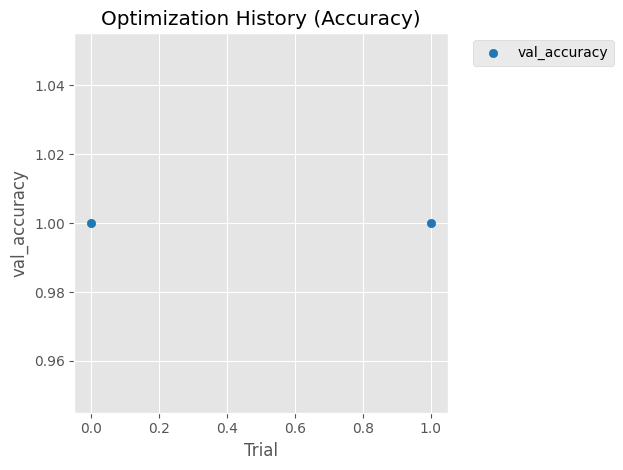

/tmp/ipykernel_70/3900254938.py:147: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

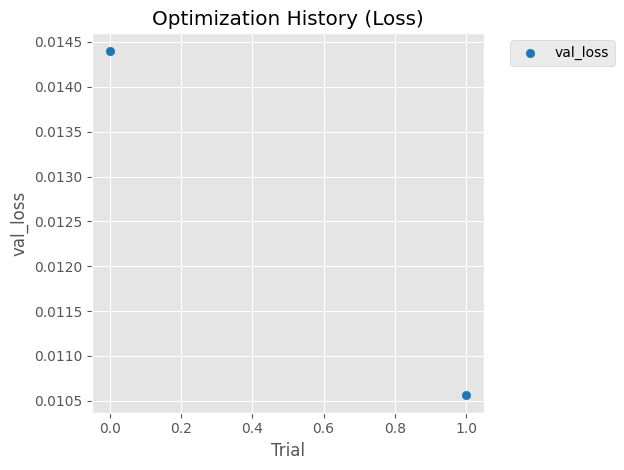

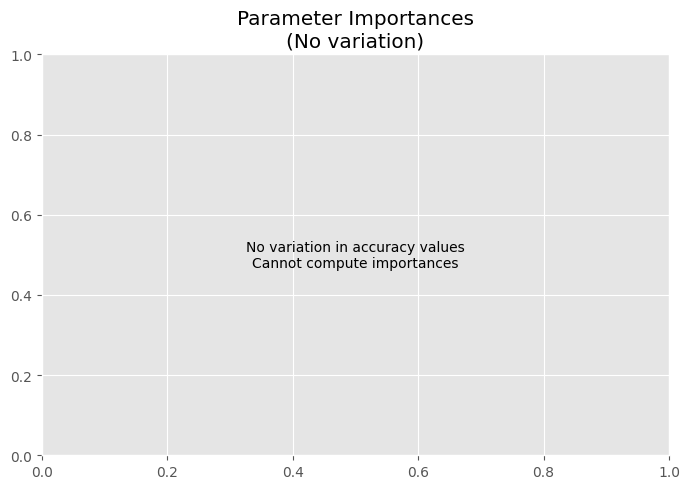

Found 2100 images belonging to 2 classes.
Found 450 images belonging to 2 classes.
Found 450 images belonging to 2 classes.

TRAINING AND EVALUATING FOLD 1/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15002_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
65/65 [==============================] - 22s 197ms/step - loss: 0.1004 - accuracy: 1.0000 - val_loss: 0.0995 - val_accuracy: 1.0000 - lr: 2.7447e-06
Epoch 2/50
65/65 [==============================] - 14s 173ms/step - loss: 0.0988 - accuracy: 1.0000 - val_loss: 0.0979 - val_accuracy: 1.0000 - lr: 2.7447e-06
Epoch 3/50
65/65 [==============================] - 11s 166ms/step - loss: 0.0972 - accuracy: 1.0000 - val_loss: 0.0964 - val_accuracy: 1.0000 - lr: 2.7447e-06
Epoch 4/50
65/65 [==============================] - 10s 154ms/step - loss: 0.0957 - accuracy: 1.0000 - val_loss: 0.0948 - val_accuracy: 1.0000 - lr: 2.7447e-06
Epoch 5/5

History for fold 1 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15002_1.pkl
66/66 [==============================] - 9s 132ms/step - loss: 0.0995 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.09948595613241196
15/15 [==============================] - 2s 132ms/step - loss: 0.0995 - accuracy: 1.0000
Validation Accuracy: 1.0
Validation Log Loss: 0.09949848800897598
15/15 [==============================] - 2s 97ms/step - loss: 0.0995 - accuracy: 1.0000
Test Accuracy: 1.0
Test Log Loss: 0.09948666393756866
Test labels: {'sfone': 0, 'sillyp2p': 1}

Matriz de Confusión:
[[225   0]
 [  0 225]]
True labels: 450
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       1.00      1.00      1.00       225

    accuracy                           1.00       450
   macro avg       1.00      1.00      1.00       450
weighted avg       1.00      1.00 

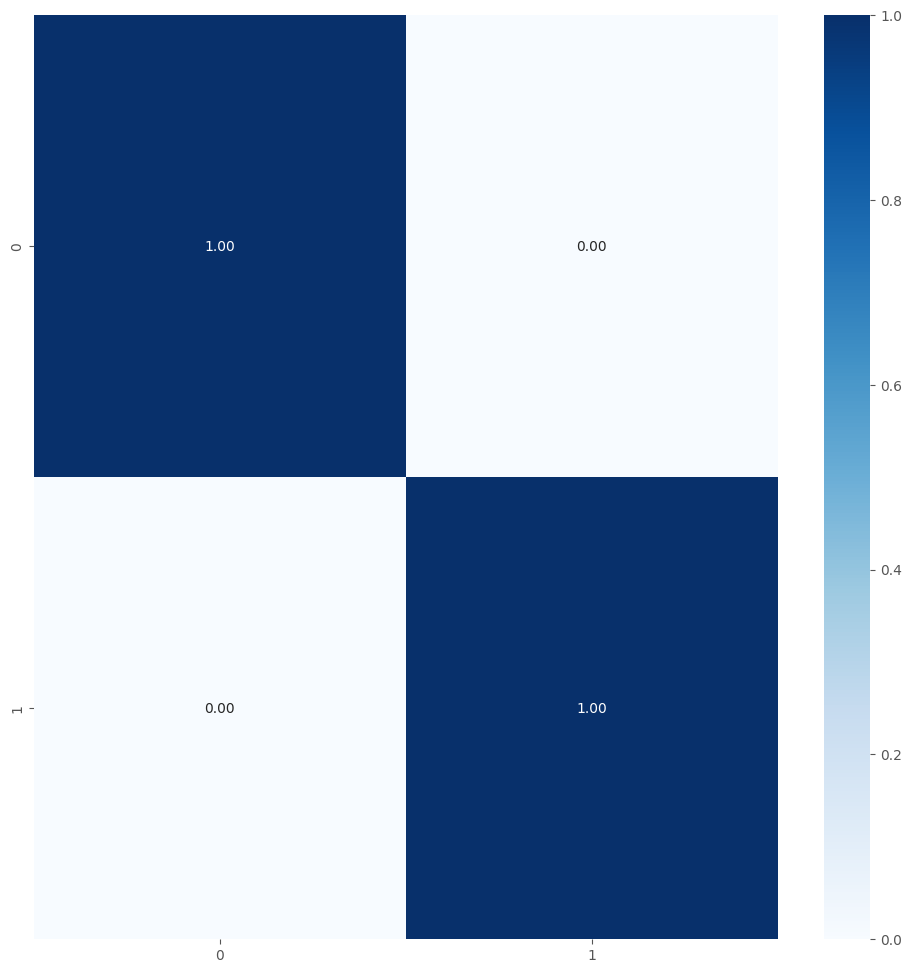


TRAINING AND EVALUATING FOLD 2/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15002_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
65/65 [==============================] - 21s 187ms/step - loss: 0.1006 - accuracy: 1.0000 - val_loss: 0.0997 - val_accuracy: 1.0000 - lr: 2.7447e-06
Epoch 2/50
65/65 [==============================] - 9s 140ms/step - loss: 0.0991 - accuracy: 1.0000 - val_loss: 0.0983 - val_accuracy: 1.0000 - lr: 2.7447e-06
Epoch 3/50
65/65 [==============================] - 9s 138ms/step - loss: 0.0977 - accuracy: 1.0000 - val_loss: 0.0969 - val_accuracy: 1.0000 - lr: 2.7447e-06
Epoch 4/50
65/65 [==============================] - 10s 150ms/step - loss: 0.0962 - accuracy: 1.0000 - val_loss: 0.0955 - val_accuracy: 1.0000 - lr: 2.7447e-06
Epoch 5/50
65/65 [==============================] - 9s 142ms/step - loss: 0.0949 - accuracy: 1.0000 - val_loss: 0.0941 - val_accuracy: 

History for fold 2 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15002_2.pkl
66/66 [==============================] - 8s 123ms/step - loss: 0.0997 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.09968501329421997
15/15 [==============================] - 2s 103ms/step - loss: 0.0997 - accuracy: 1.0000
Validation Accuracy: 1.0
Validation Log Loss: 0.09969691932201385
15/15 [==============================] - 2s 108ms/step - loss: 0.0997 - accuracy: 1.0000
Test Accuracy: 1.0
Test Log Loss: 0.0996856838464737
Test labels: {'sfone': 0, 'sillyp2p': 1}

Matriz de Confusión:
[[225   0]
 [  0 225]]
True labels: 450
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       1.00      1.00      1.00       225

    accuracy                           1.00       450
   macro avg       1.00      1.00      1.00       450
weighted avg       1.00      1.00 

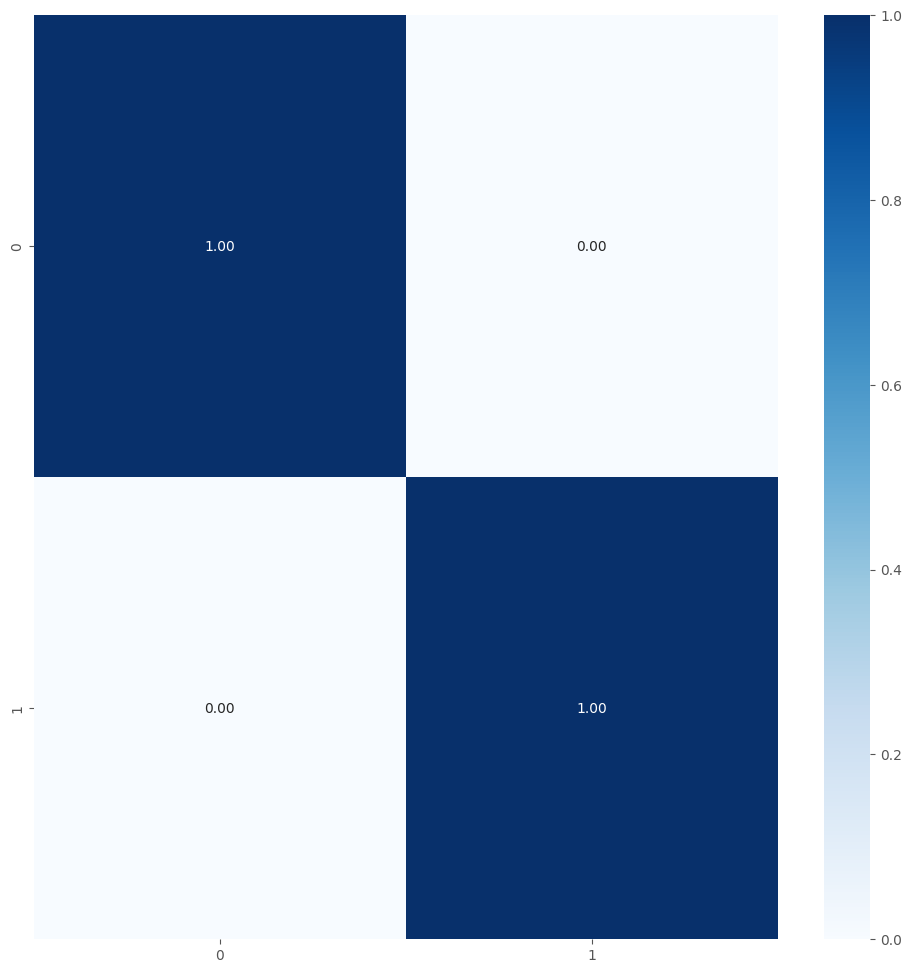


TRAINING AND EVALUATING FOLD 3/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15002_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
65/65 [==============================] - 19s 179ms/step - loss: 0.1004 - accuracy: 1.0000 - val_loss: 0.0995 - val_accuracy: 1.0000 - lr: 2.7447e-06
Epoch 2/50
65/65 [==============================] - 18s 277ms/step - loss: 0.0988 - accuracy: 1.0000 - val_loss: 0.0979 - val_accuracy: 1.0000 - lr: 2.7447e-06
Epoch 3/50
65/65 [==============================] - 10s 155ms/step - loss: 0.0972 - accuracy: 1.0000 - val_loss: 0.0963 - val_accuracy: 1.0000 - lr: 2.7447e-06
Epoch 4/50
65/65 [==============================] - 11s 160ms/step - loss: 0.0956 - accuracy: 1.0000 - val_loss: 0.0948 - val_accuracy: 1.0000 - lr: 2.7447e-06
Epoch 5/50
65/65 [==============================] - 10s 157ms/step - loss: 0.0943 - accuracy: 1.0000 - val_loss: 0.0935 - val_accurac

History for fold 3 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15002_3.pkl
66/66 [==============================] - 9s 132ms/step - loss: 0.0995 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.09949524700641632
15/15 [==============================] - 2s 130ms/step - loss: 0.0995 - accuracy: 1.0000
Validation Accuracy: 1.0
Validation Log Loss: 0.099507175385952
15/15 [==============================] - 2s 121ms/step - loss: 0.0995 - accuracy: 1.0000
Test Accuracy: 1.0
Test Log Loss: 0.09949592500925064
Test labels: {'sfone': 0, 'sillyp2p': 1}

Matriz de Confusión:
[[225   0]
 [  0 225]]
True labels: 450
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       1.00      1.00      1.00       225

    accuracy                           1.00       450
   macro avg       1.00      1.00      1.00       450
weighted avg       1.00      1.00  

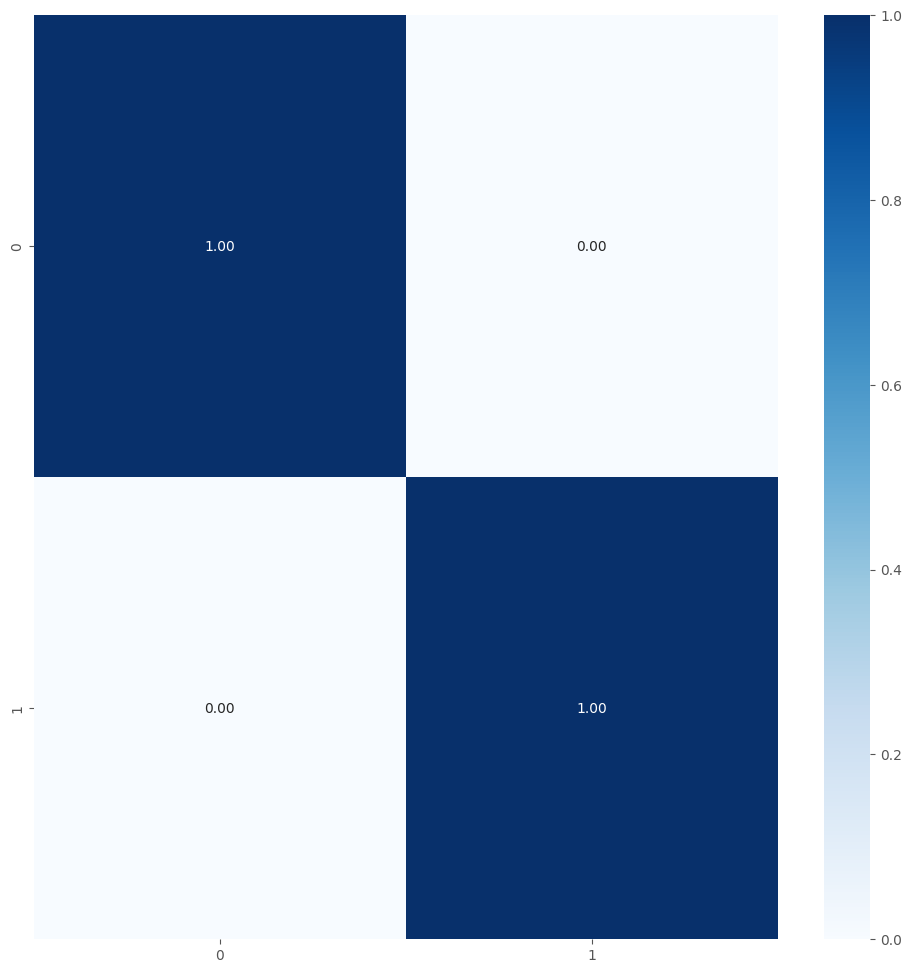


TRAINING AND EVALUATING FOLD 4/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15002_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
65/65 [==============================] - 25s 249ms/step - loss: 0.1004 - accuracy: 1.0000 - val_loss: 0.0995 - val_accuracy: 1.0000 - lr: 2.7447e-06
Epoch 2/50
65/65 [==============================] - 17s 261ms/step - loss: 0.0988 - accuracy: 1.0000 - val_loss: 0.0979 - val_accuracy: 1.0000 - lr: 2.7447e-06
Epoch 3/50
65/65 [==============================] - 11s 174ms/step - loss: 0.0972 - accuracy: 1.0000 - val_loss: 0.0964 - val_accuracy: 1.0000 - lr: 2.7447e-06
Epoch 4/50
65/65 [==============================] - 10s 159ms/step - loss: 0.0956 - accuracy: 1.0000 - val_loss: 0.0948 - val_accuracy: 1.0000 - lr: 2.7447e-06
Epoch 5/50
65/65 [==============================] - 11s 162ms/step - loss: 0.0941 - accuracy: 1.0000 - val_loss: 0.0933 - val_accurac

History for fold 4 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15002_4.pkl
66/66 [==============================] - 8s 118ms/step - loss: 0.0995 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.09952311962842941
15/15 [==============================] - 2s 116ms/step - loss: 0.0995 - accuracy: 1.0000
Validation Accuracy: 1.0
Validation Log Loss: 0.09953618049621582
15/15 [==============================] - 2s 119ms/step - loss: 0.0995 - accuracy: 1.0000
Test Accuracy: 1.0
Test Log Loss: 0.09952377527952194
Test labels: {'sfone': 0, 'sillyp2p': 1}

Matriz de Confusión:
[[225   0]
 [  0 225]]
True labels: 450
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       1.00      1.00      1.00       225

    accuracy                           1.00       450
   macro avg       1.00      1.00      1.00       450
weighted avg       1.00      1.00

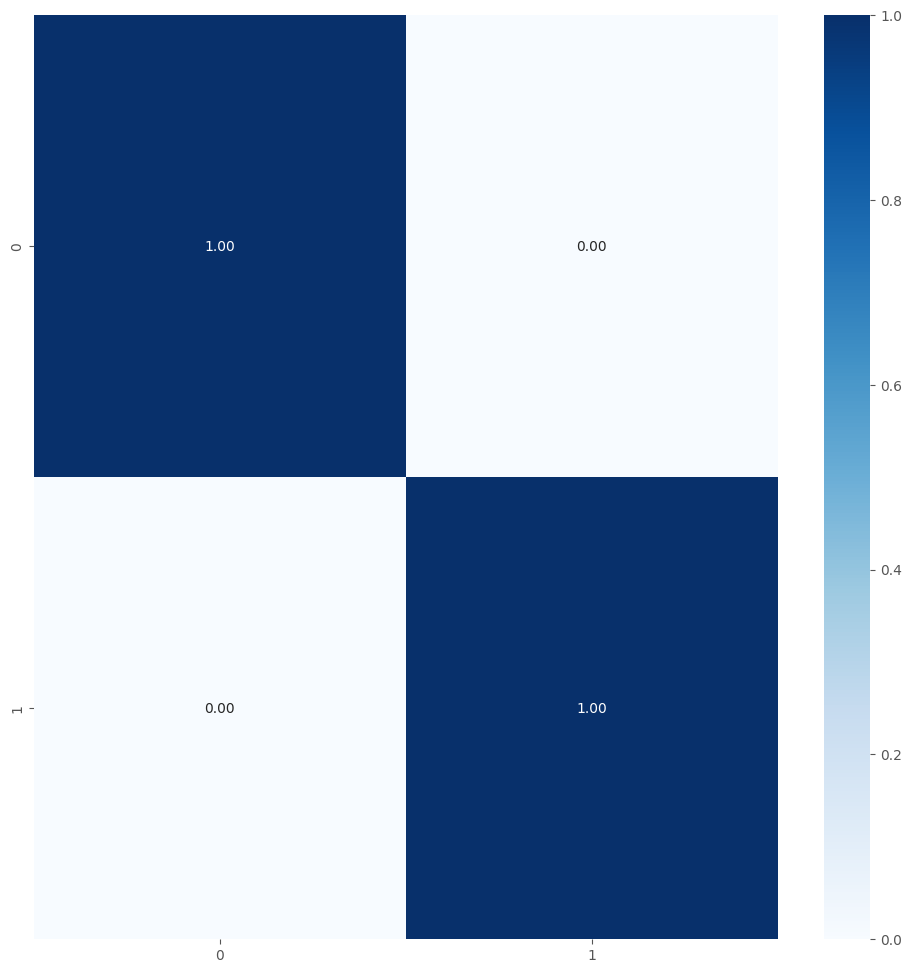


TRAINING AND EVALUATING FOLD 5/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15002_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
65/65 [==============================] - 20s 176ms/step - loss: 0.1005 - accuracy: 1.0000 - val_loss: 0.0996 - val_accuracy: 1.0000 - lr: 2.7447e-06
Epoch 2/50
65/65 [==============================] - 10s 149ms/step - loss: 0.0988 - accuracy: 1.0000 - val_loss: 0.0980 - val_accuracy: 1.0000 - lr: 2.7447e-06
Epoch 3/50
65/65 [==============================] - 10s 148ms/step - loss: 0.0972 - accuracy: 1.0000 - val_loss: 0.0964 - val_accuracy: 1.0000 - lr: 2.7447e-06
Epoch 4/50
65/65 [==============================] - 10s 159ms/step - loss: 0.0958 - accuracy: 1.0000 - val_loss: 0.0950 - val_accuracy: 1.0000 - lr: 2.7447e-06
Epoch 5/50
65/65 [==============================] - 9s 140ms/step - loss: 0.0944 - accuracy: 1.0000 - val_loss: 0.0937 - val_accuracy

History for fold 5 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15002_5.pkl
66/66 [==============================] - 4s 56ms/step - loss: 0.0996 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.09955093264579773
15/15 [==============================] - 1s 61ms/step - loss: 0.0996 - accuracy: 1.0000
Validation Accuracy: 1.0
Validation Log Loss: 0.09956420958042145
15/15 [==============================] - 2s 117ms/step - loss: 0.0996 - accuracy: 1.0000
Test Accuracy: 1.0
Test Log Loss: 0.09955158829689026
Test labels: {'sfone': 0, 'sillyp2p': 1}

Matriz de Confusión:
[[225   0]
 [  0 225]]
True labels: 450
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       1.00      1.00      1.00       225

    accuracy                           1.00       450
   macro avg       1.00      1.00      1.00       450
weighted avg       1.00      1.00  

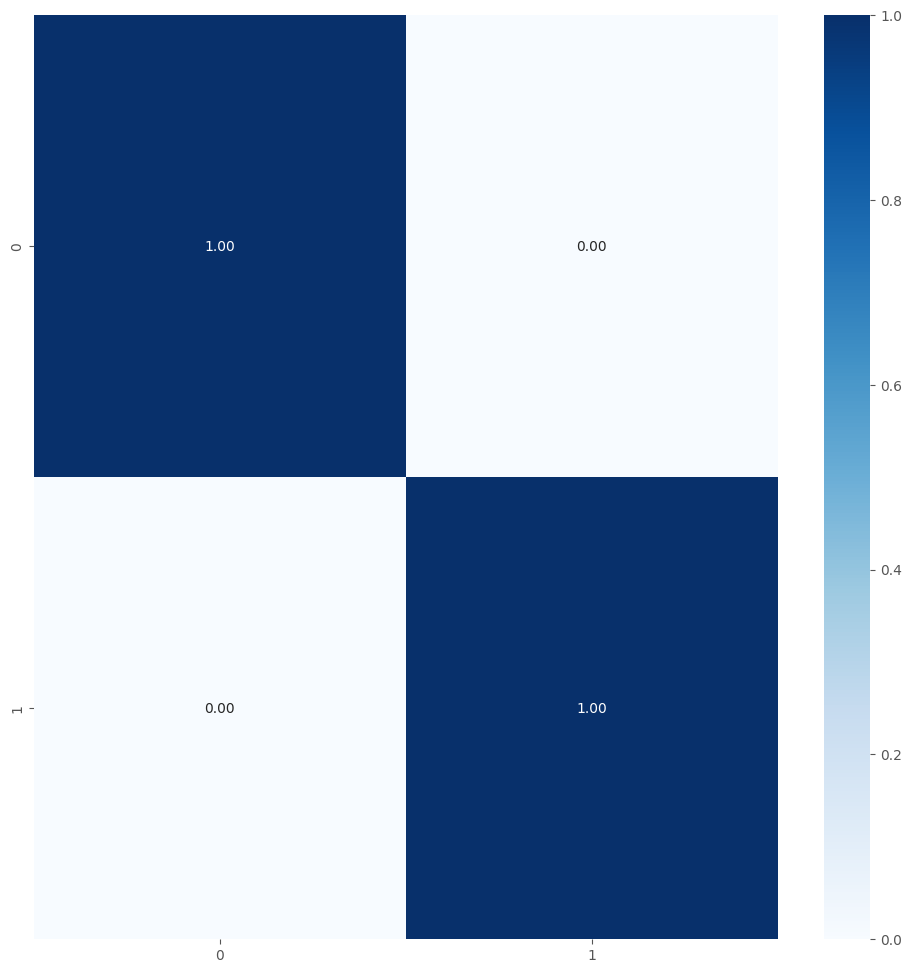


Best fold was 1 with val_accuracy: 1.0000
Average training accuracy in 5-fold: 1.0
Average validation precision in 5-fold: 1.0

Test Metrics
test_acc_list: [1.0, 1.0, 1.0, 1.0, 1.0]
Average Test Accuracy with 5-fold: 1.0
test_loss_list: [0.09948666393756866, 0.0996856838464737, 0.09949592500925064, 0.09952377527952194, 0.09955158829689026]
Average Test Log Loss with 5-fold: 0.09954872727394104

Precision List: [1.0, 1.0, 1.0, 1.0, 1.0]
Average Precision List with 5-fold: 1.0
Recall List: [1.0, 1.0, 1.0, 1.0, 1.0]
Average Recall List with 5-fold: 1.0
F1 Score List: [1.0, 1.0, 1.0, 1.0, 1.0]
Average F1 Score List with 5-fold: 1.0

Metrics List Store

test_acc_list_all = [1.0]
test_loss_list_all = [0.09954872727394104]
precision_list_all = [1.0]
recall_list_all = [1.0]
f1_score_list_all = [1.0]
La carpeta 2 fue eliminada.
CPU times: user 39min 56s, sys: 5min 4s, total: 45min
Wall time: 42min 8s


In [20]:
%%time
###################################### Probar Dropout 0.4
num_classes = 2
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, 
    precision_list_all, recall_list_all, f1_score_list_all)

[I 2025-06-14 05:31:58,020] A new study created in memory with name: malware_classification_3classes


Familias de malware copiadas
source2: /notebooks/train3/all_malware/3
name_save_model: MobileNet_tf_15003
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
- Allaple.A
model_path: /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15003_best.h5

Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15003_best.h5
Successfully loaded and modified pretrained model
Found 3150 images belonging to 3 classes.
Found 675 images belonging to 3 classes.
Found 675 images belonging to 3 classes.


[I 2025-06-14 05:46:44,891] Trial 0 finished with values: [1.0, 0.01776117831468582] and parameters: {'learning_rate': 0.004960293200404359, 'dropout_rate1': 0.423254148070239, 'dropout_rate2': 0.20368313398425442, 'l2_reg': 0.00137771673652756, 'units_dense1': 512, 'units_dense2': 256, 'num_dense_layers': 3, 'unfreeze_layers': 13, 'early_stopping_patience': 14, 'reduce_lr_patience': 10, 'fine_tune_learning_rate': 1.7800117618202293e-06, 'units_dense3': 32, 'dropout_rate3': 0.26890266614781827}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15003_best.h5
Successfully loaded and modified pretrained model
Found 3150 images belonging to 3 classes.
Found 675 images belonging to 3 classes.
Found 675 images belonging to 3 classes.


[I 2025-06-14 05:55:04,043] Trial 1 finished with values: [1.0, 0.011712298728525639] and parameters: {'learning_rate': 0.007513168939932549, 'dropout_rate1': 0.2903548685115646, 'dropout_rate2': 0.18232163405551513, 'l2_reg': 0.00352010713471803, 'units_dense1': 512, 'units_dense2': 64, 'num_dense_layers': 3, 'unfreeze_layers': 12, 'early_stopping_patience': 17, 'reduce_lr_patience': 12, 'fine_tune_learning_rate': 3.946728197546309e-06, 'units_dense3': 128, 'dropout_rate3': 0.24451824902284378}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15003_best.h5
Successfully loaded and modified pretrained model
Found 3150 images belonging to 3 classes.
Found 675 images belonging to 3 classes.
Found 675 images belonging to 3 classes.


[I 2025-06-14 06:01:07,557] Trial 2 finished with values: [0.9985119104385376, 0.024147119373083115] and parameters: {'learning_rate': 0.0007204241467548978, 'dropout_rate1': 0.42438166680122674, 'dropout_rate2': 0.26013247245222226, 'l2_reg': 0.0008780118624641046, 'units_dense1': 256, 'units_dense2': 64, 'num_dense_layers': 2, 'unfreeze_layers': 10, 'early_stopping_patience': 17, 'reduce_lr_patience': 8, 'fine_tune_learning_rate': 1.0043622025885542e-06}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15003_best.h5
Successfully loaded and modified pretrained model
Found 3150 images belonging to 3 classes.
Found 675 images belonging to 3 classes.
Found 675 images belonging to 3 classes.


[I 2025-06-14 06:05:16,597] Trial 3 finished with values: [0.9985119104385376, 0.005256598349660635] and parameters: {'learning_rate': 1.5254624826887397e-05, 'dropout_rate1': 0.3278632031551432, 'dropout_rate2': 0.4502493985243744, 'l2_reg': 2.5481533006701457e-05, 'units_dense1': 1024, 'units_dense2': 64, 'num_dense_layers': 3, 'unfreeze_layers': 9, 'early_stopping_patience': 17, 'reduce_lr_patience': 12, 'fine_tune_learning_rate': 2.76720883589634e-05, 'units_dense3': 32, 'dropout_rate3': 0.19193616267409236}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15003_best.h5
Successfully loaded and modified pretrained model
Found 3150 images belonging to 3 classes.
Found 675 images belonging to 3 classes.
Found 675 images belonging to 3 classes.


[I 2025-06-14 06:11:16,366] Trial 4 finished with values: [1.0, 0.0009452981175854802] and parameters: {'learning_rate': 0.0010711508975791333, 'dropout_rate1': 0.5402704340455668, 'dropout_rate2': 0.451698319029179, 'l2_reg': 2.122802705428068e-05, 'units_dense1': 256, 'units_dense2': 256, 'num_dense_layers': 3, 'unfreeze_layers': 13, 'early_stopping_patience': 18, 'reduce_lr_patience': 13, 'fine_tune_learning_rate': 9.211292001392441e-05, 'units_dense3': 32, 'dropout_rate3': 0.1963582119896771}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15003_best.h5
Successfully loaded and modified pretrained model
Found 3150 images belonging to 3 classes.
Found 675 images belonging to 3 classes.
Found 675 images belonging to 3 classes.


[I 2025-06-14 06:16:19,095] Trial 5 finished with values: [1.0, 0.006499340292066336] and parameters: {'learning_rate': 6.236983923882276e-05, 'dropout_rate1': 0.39539800078361104, 'dropout_rate2': 0.1776183146927874, 'l2_reg': 1.9441939194066904e-05, 'units_dense1': 1024, 'units_dense2': 64, 'num_dense_layers': 2, 'unfreeze_layers': 13, 'early_stopping_patience': 19, 'reduce_lr_patience': 8, 'fine_tune_learning_rate': 9.444428395924796e-06}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15003_best.h5
Successfully loaded and modified pretrained model
Found 3150 images belonging to 3 classes.
Found 675 images belonging to 3 classes.
Found 675 images belonging to 3 classes.


[I 2025-06-14 06:19:24,939] Trial 6 finished with values: [1.0, 0.0010501168435439467] and parameters: {'learning_rate': 0.005669745463275618, 'dropout_rate1': 0.5610261888772639, 'dropout_rate2': 0.12139963690965955, 'l2_reg': 3.107352215385574e-05, 'units_dense1': 256, 'units_dense2': 256, 'num_dense_layers': 3, 'unfreeze_layers': 10, 'early_stopping_patience': 10, 'reduce_lr_patience': 14, 'fine_tune_learning_rate': 3.220470889220636e-05, 'units_dense3': 128, 'dropout_rate3': 0.13768110233054173}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15003_best.h5
Successfully loaded and modified pretrained model
Found 3150 images belonging to 3 classes.
Found 675 images belonging to 3 classes.
Found 675 images belonging to 3 classes.


[I 2025-06-14 06:25:28,386] Trial 7 finished with values: [0.9985119104385376, 0.021452832967042923] and parameters: {'learning_rate': 2.61858964462553e-05, 'dropout_rate1': 0.31378484093081815, 'dropout_rate2': 0.21950882808798614, 'l2_reg': 0.0006734465449017067, 'units_dense1': 1024, 'units_dense2': 128, 'num_dense_layers': 3, 'unfreeze_layers': 10, 'early_stopping_patience': 18, 'reduce_lr_patience': 15, 'fine_tune_learning_rate': 1.577651809532114e-06, 'units_dense3': 32, 'dropout_rate3': 0.3884869994116188}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15003_best.h5
Successfully loaded and modified pretrained model
Found 3150 images belonging to 3 classes.
Found 675 images belonging to 3 classes.
Found 675 images belonging to 3 classes.


[I 2025-06-14 06:29:54,229] Trial 8 finished with values: [1.0, 0.002666933462023735] and parameters: {'learning_rate': 0.0008178260487472644, 'dropout_rate1': 0.29602912809022236, 'dropout_rate2': 0.3242659075512373, 'l2_reg': 2.5524517860299346e-05, 'units_dense1': 512, 'units_dense2': 256, 'num_dense_layers': 3, 'unfreeze_layers': 11, 'early_stopping_patience': 11, 'reduce_lr_patience': 8, 'fine_tune_learning_rate': 3.375200283251366e-05, 'units_dense3': 64, 'dropout_rate3': 0.28861491605311584}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15003_best.h5
Successfully loaded and modified pretrained model
Found 3150 images belonging to 3 classes.
Found 675 images belonging to 3 classes.
Found 675 images belonging to 3 classes.


[I 2025-06-14 06:34:22,473] Trial 9 finished with values: [1.0, 0.019037000834941864] and parameters: {'learning_rate': 0.004369757624908157, 'dropout_rate1': 0.4751439505245703, 'dropout_rate2': 0.44468593500268894, 'l2_reg': 0.0035784288088544195, 'units_dense1': 512, 'units_dense2': 128, 'num_dense_layers': 2, 'unfreeze_layers': 7, 'early_stopping_patience': 11, 'reduce_lr_patience': 14, 'fine_tune_learning_rate': 2.1931962523548263e-06}.


Mejores trials para cada objetivo:
  Trial 4:
    val_accuracy: 1.0000
    val_loss: 0.0009
    Parámetros: {'learning_rate': 0.0010711508975791333, 'dropout_rate1': 0.5402704340455668, 'dropout_rate2': 0.451698319029179, 'l2_reg': 2.122802705428068e-05, 'units_dense1': 256, 'units_dense2': 256, 'num_dense_layers': 3, 'unfreeze_layers': 13, 'early_stopping_patience': 18, 'reduce_lr_patience': 13, 'fine_tune_learning_rate': 9.211292001392441e-05, 'units_dense3': 32, 'dropout_rate3': 0.1963582119896771}


/tmp/ipykernel_19/2470463485.py:136: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

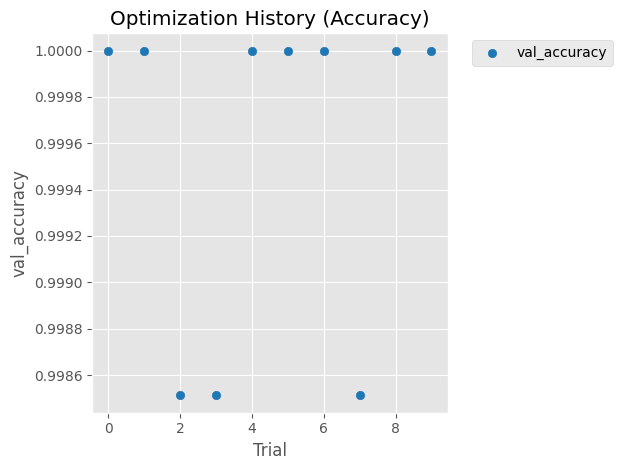

/tmp/ipykernel_19/2470463485.py:147: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

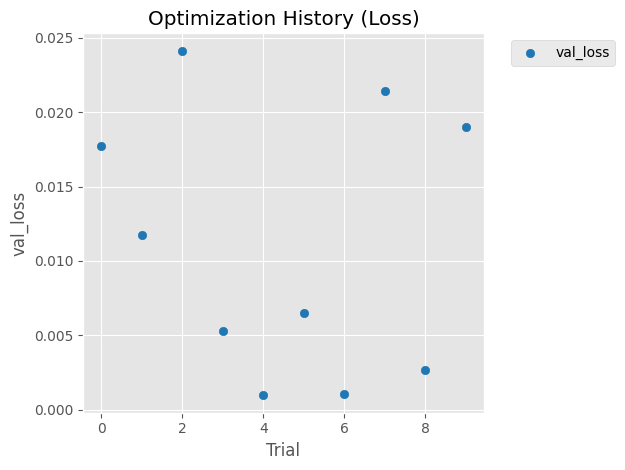

/tmp/ipykernel_19/2470463485.py:160: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Figure size 700x500 with 0 Axes>

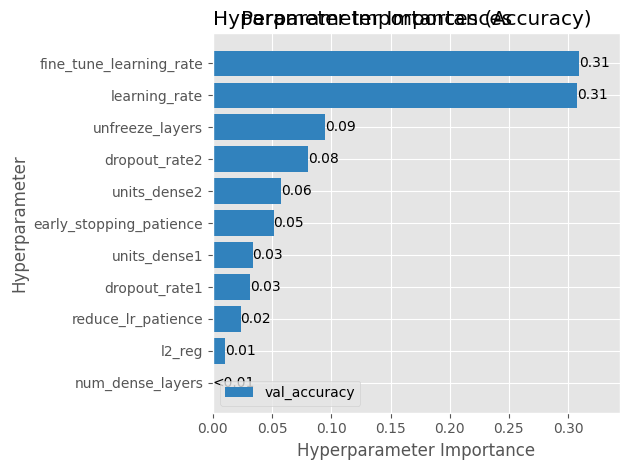

Found 3150 images belonging to 3 classes.
Found 675 images belonging to 3 classes.
Found 675 images belonging to 3 classes.

TRAINING AND EVALUATING FOLD 1/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15003_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
98/98 [==============================] - 12s 81ms/step - loss: 0.0204 - accuracy: 1.0000 - val_loss: 0.0207 - val_accuracy: 0.9985 - lr: 1.0712e-04
Epoch 2/50
98/98 [==============================] - 7s 73ms/step - loss: 0.0123 - accuracy: 1.0000 - val_loss: 0.0206 - val_accuracy: 0.9985 - lr: 1.0712e-04
Epoch 3/50
98/98 [==============================] - 7s 73ms/step - loss: 0.0104 - accuracy: 0.9994 - val_loss: 0.0201 - val_accuracy: 0.9985 - lr: 1.0712e-04
Epoch 4/50
98/98 [==============================] - 7s 74ms/step - loss: 0.0086 - accuracy: 1.0000 - val_loss: 0.0188 - val_accuracy: 0.9985 - lr: 1.0712e-04
Epoch 5/50
98/98

History for fold 1 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15003_1.pkl
99/99 [==============================] - 5s 54ms/step - loss: 0.0147 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.014668316580355167
22/22 [==============================] - 1s 61ms/step - loss: 0.0206 - accuracy: 0.9985
Validation Accuracy: 0.9985185265541077
Validation Log Loss: 0.020626511424779892
22/22 [==============================] - 1s 57ms/step - loss: 0.0147 - accuracy: 1.0000
Test Accuracy: 1.0
Test Log Loss: 0.014670568518340588
Test labels: {'Allaple.A': 0, 'sfone': 1, 'sillyp2p': 2}

Matriz de Confusión:
[[225   0   0]
 [  0 225   0]
 [  0   0 225]]
True labels: 675
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       1.00      1.00      1.00       225
           2       1.00      1.00      1.00       225

    accuracy                     

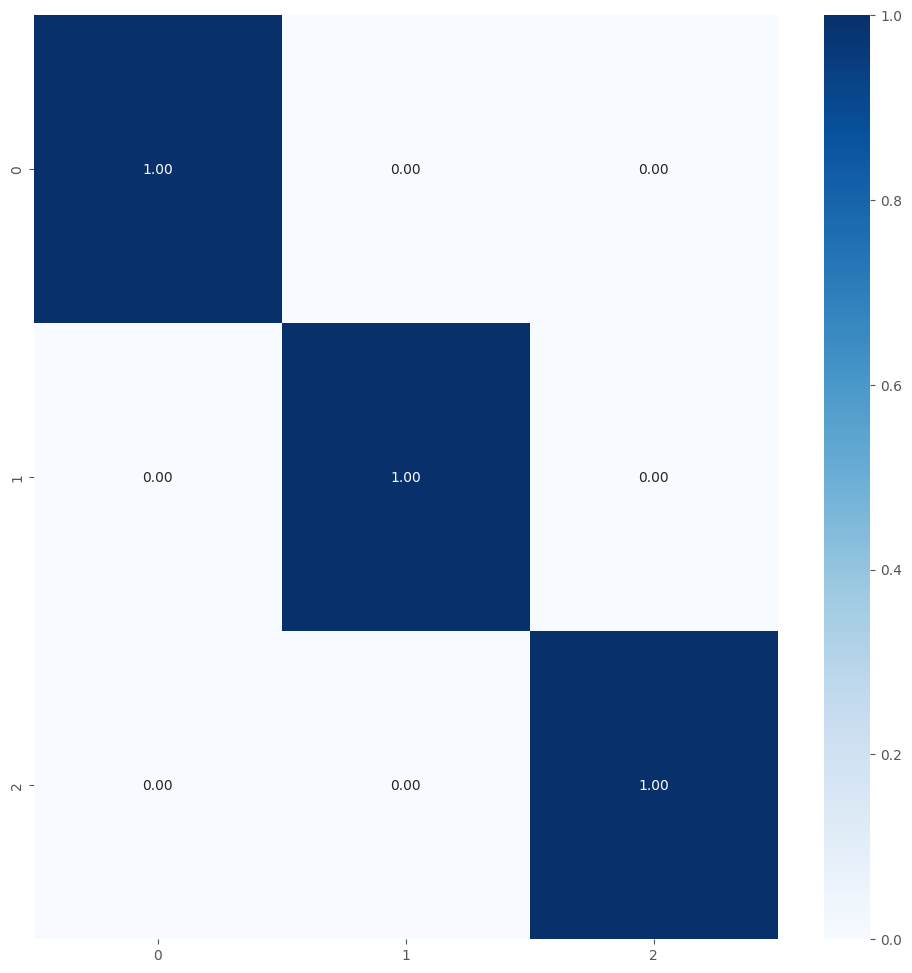


TRAINING AND EVALUATING FOLD 2/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15003_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
98/98 [==============================] - 12s 82ms/step - loss: 0.0219 - accuracy: 1.0000 - val_loss: 0.0172 - val_accuracy: 1.0000 - lr: 1.0712e-04
Epoch 2/50
98/98 [==============================] - 7s 74ms/step - loss: 0.0138 - accuracy: 1.0000 - val_loss: 0.0113 - val_accuracy: 1.0000 - lr: 1.0712e-04
Epoch 3/50
98/98 [==============================] - 7s 70ms/step - loss: 0.0096 - accuracy: 1.0000 - val_loss: 0.0081 - val_accuracy: 1.0000 - lr: 1.0712e-04
Epoch 4/50
98/98 [==============================] - 7s 74ms/step - loss: 0.0095 - accuracy: 0.9994 - val_loss: 0.0111 - val_accuracy: 0.9985 - lr: 1.0712e-04
Epoch 5/50
98/98 [==============================] - 7s 74ms/step - loss: 0.0077 - accuracy: 1.0000 - val_loss: 0.0093 - val_accuracy: 0.9985

History for fold 2 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15003_2.pkl
99/99 [==============================] - 6s 59ms/step - loss: 0.0165 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.01654071919620037
22/22 [==============================] - 1s 58ms/step - loss: 0.0172 - accuracy: 1.0000
Validation Accuracy: 1.0
Validation Log Loss: 0.017175218090415
22/22 [==============================] - 1s 59ms/step - loss: 0.0165 - accuracy: 1.0000
Test Accuracy: 1.0
Test Log Loss: 0.01654384471476078
Test labels: {'Allaple.A': 0, 'sfone': 1, 'sillyp2p': 2}

Matriz de Confusión:
[[225   0   0]
 [  0 225   0]
 [  0   0 225]]
True labels: 675
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       1.00      1.00      1.00       225
           2       1.00      1.00      1.00       225

    accuracy                           1.00       675

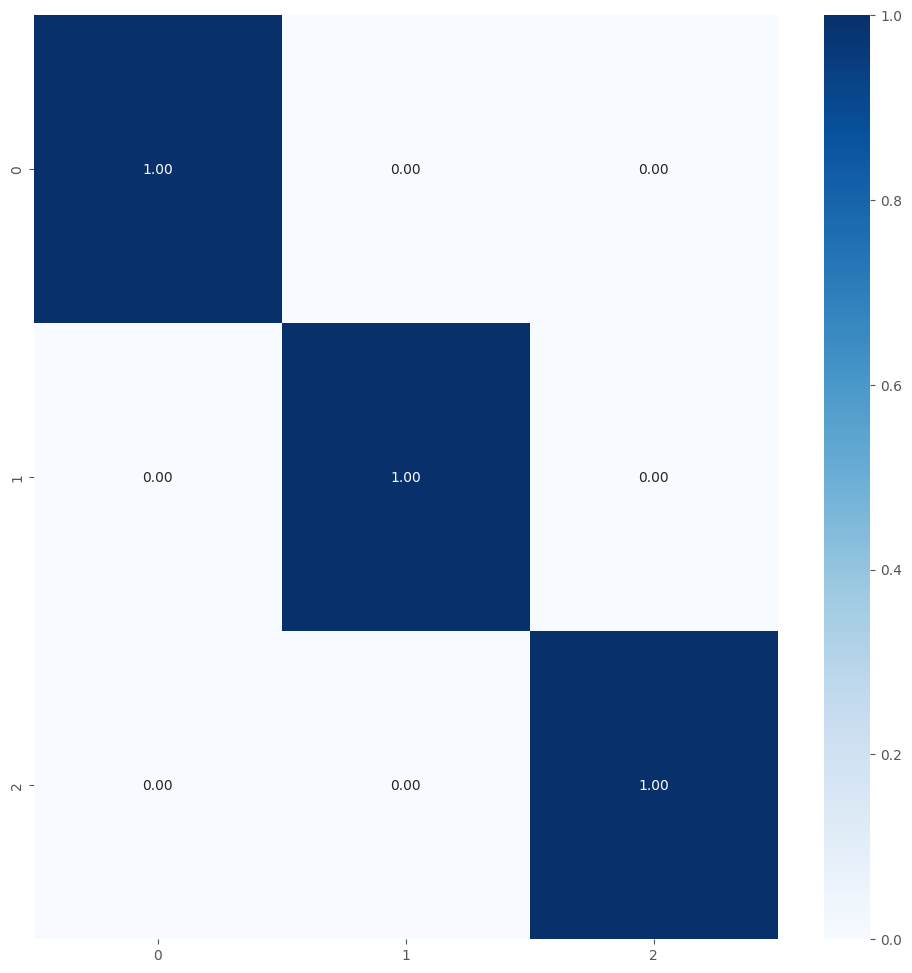


TRAINING AND EVALUATING FOLD 3/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15003_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
98/98 [==============================] - 12s 82ms/step - loss: 0.0216 - accuracy: 0.9997 - val_loss: 0.0180 - val_accuracy: 0.9985 - lr: 1.0712e-04
Epoch 2/50
98/98 [==============================] - 7s 73ms/step - loss: 0.0139 - accuracy: 1.0000 - val_loss: 0.0170 - val_accuracy: 0.9985 - lr: 1.0712e-04
Epoch 3/50
98/98 [==============================] - 7s 73ms/step - loss: 0.0107 - accuracy: 1.0000 - val_loss: 0.0142 - val_accuracy: 0.9985 - lr: 1.0712e-04
Epoch 4/50
98/98 [==============================] - 7s 73ms/step - loss: 0.0086 - accuracy: 1.0000 - val_loss: 0.0147 - val_accuracy: 0.9985 - lr: 1.0712e-04
Epoch 5/50
98/98 [==============================] - 7s 70ms/step - loss: 0.0072 - accuracy: 1.0000 - val_loss: 0.0068 - val_accuracy: 1.0000

History for fold 3 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15003_3.pkl
99/99 [==============================] - 6s 59ms/step - loss: 0.0065 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.006533824373036623
22/22 [==============================] - 1s 60ms/step - loss: 0.0068 - accuracy: 1.0000
Validation Accuracy: 1.0
Validation Log Loss: 0.006771646905690432
22/22 [==============================] - 1s 58ms/step - loss: 0.0065 - accuracy: 1.0000
Test Accuracy: 1.0
Test Log Loss: 0.006532039027661085
Test labels: {'Allaple.A': 0, 'sfone': 1, 'sillyp2p': 2}

Matriz de Confusión:
[[225   0   0]
 [  0 225   0]
 [  0   0 225]]
True labels: 675
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       1.00      1.00      1.00       225
           2       1.00      1.00      1.00       225

    accuracy                           1.00     

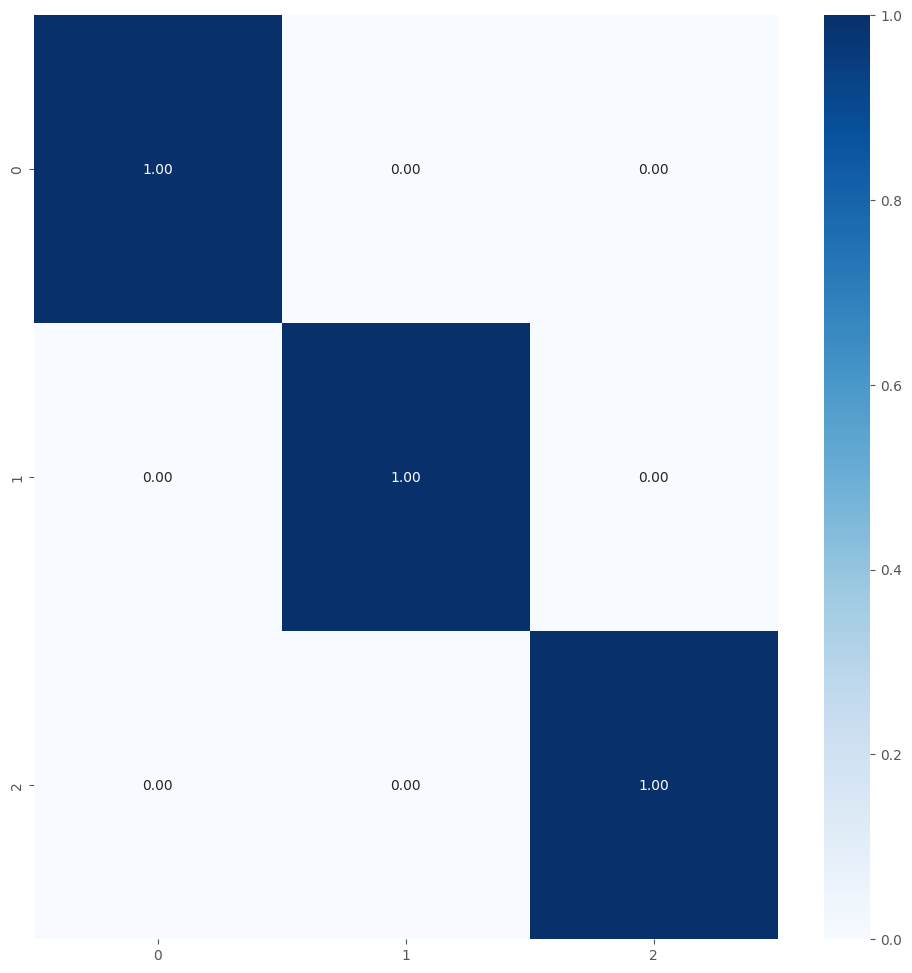


TRAINING AND EVALUATING FOLD 4/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15003_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
98/98 [==============================] - 12s 84ms/step - loss: 0.0193 - accuracy: 1.0000 - val_loss: 0.0210 - val_accuracy: 0.9985 - lr: 1.0712e-04
Epoch 2/50
98/98 [==============================] - 7s 74ms/step - loss: 0.0115 - accuracy: 1.0000 - val_loss: 0.0254 - val_accuracy: 0.9985 - lr: 1.0712e-04
Epoch 3/50
98/98 [==============================] - 7s 74ms/step - loss: 0.0099 - accuracy: 1.0000 - val_loss: 0.0127 - val_accuracy: 0.9985 - lr: 1.0712e-04
Epoch 4/50
98/98 [==============================] - 7s 73ms/step - loss: 0.0086 - accuracy: 1.0000 - val_loss: 0.0118 - val_accuracy: 0.9985 - lr: 1.0712e-04
Epoch 5/50
98/98 [==============================] - 7s 71ms/step - loss: 0.0074 - accuracy: 1.0000 - val_loss: 0.0107 - val_accuracy: 0.9985

History for fold 4 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15003_4.pkl
99/99 [==============================] - 6s 58ms/step - loss: 0.0053 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.005281944293528795
22/22 [==============================] - 1s 59ms/step - loss: 0.0054 - accuracy: 1.0000
Validation Accuracy: 1.0
Validation Log Loss: 0.005404495634138584
22/22 [==============================] - 1s 54ms/step - loss: 0.0053 - accuracy: 1.0000
Test Accuracy: 1.0
Test Log Loss: 0.00528183626011014
Test labels: {'Allaple.A': 0, 'sfone': 1, 'sillyp2p': 2}

Matriz de Confusión:
[[225   0   0]
 [  0 225   0]
 [  0   0 225]]
True labels: 675
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       1.00      1.00      1.00       225
           2       1.00      1.00      1.00       225

    accuracy                           1.00      

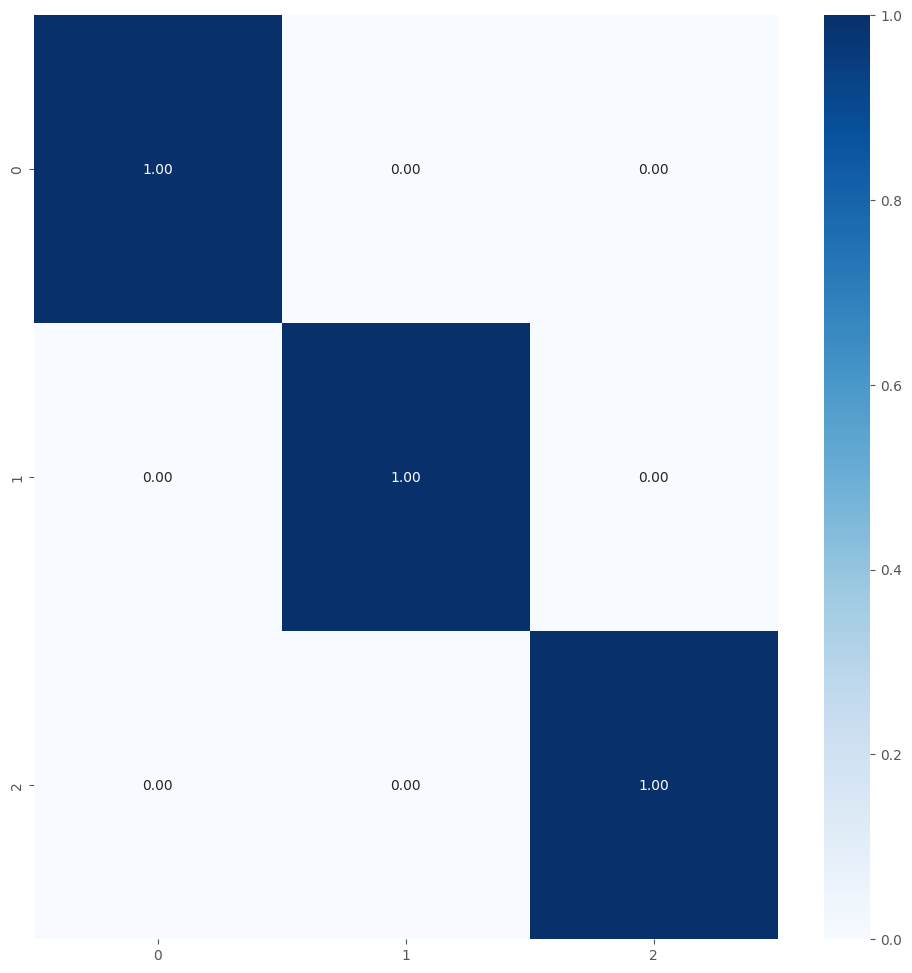


TRAINING AND EVALUATING FOLD 5/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15003_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
98/98 [==============================] - 13s 85ms/step - loss: 0.0190 - accuracy: 1.0000 - val_loss: 0.0121 - val_accuracy: 1.0000 - lr: 1.0712e-04
Epoch 2/50
98/98 [==============================] - 7s 73ms/step - loss: 0.0093 - accuracy: 1.0000 - val_loss: 0.0113 - val_accuracy: 0.9985 - lr: 1.0712e-04
Epoch 3/50
98/98 [==============================] - 8s 79ms/step - loss: 0.0080 - accuracy: 0.9997 - val_loss: 0.0143 - val_accuracy: 0.9985 - lr: 1.0712e-04
Epoch 4/50
98/98 [==============================] - 7s 71ms/step - loss: 0.0090 - accuracy: 0.9997 - val_loss: 0.0166 - val_accuracy: 0.9985 - lr: 1.0712e-04
Epoch 5/50
98/98 [==============================] - 7s 74ms/step - loss: 0.0055 - accuracy: 1.0000 - val_loss: 0.0105 - val_accuracy: 0.9985

History for fold 5 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15003_5.pkl
99/99 [==============================] - 6s 61ms/step - loss: 0.0119 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.011892885901033878
22/22 [==============================] - 1s 60ms/step - loss: 0.0121 - accuracy: 1.0000
Validation Accuracy: 1.0
Validation Log Loss: 0.012079210951924324
22/22 [==============================] - 1s 59ms/step - loss: 0.0119 - accuracy: 1.0000
Test Accuracy: 1.0
Test Log Loss: 0.011910194531083107
Test labels: {'Allaple.A': 0, 'sfone': 1, 'sillyp2p': 2}

Matriz de Confusión:
[[225   0   0]
 [  0 225   0]
 [  0   0 225]]
True labels: 675
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       1.00      1.00      1.00       225
           2       1.00      1.00      1.00       225

    accuracy                           1.00     

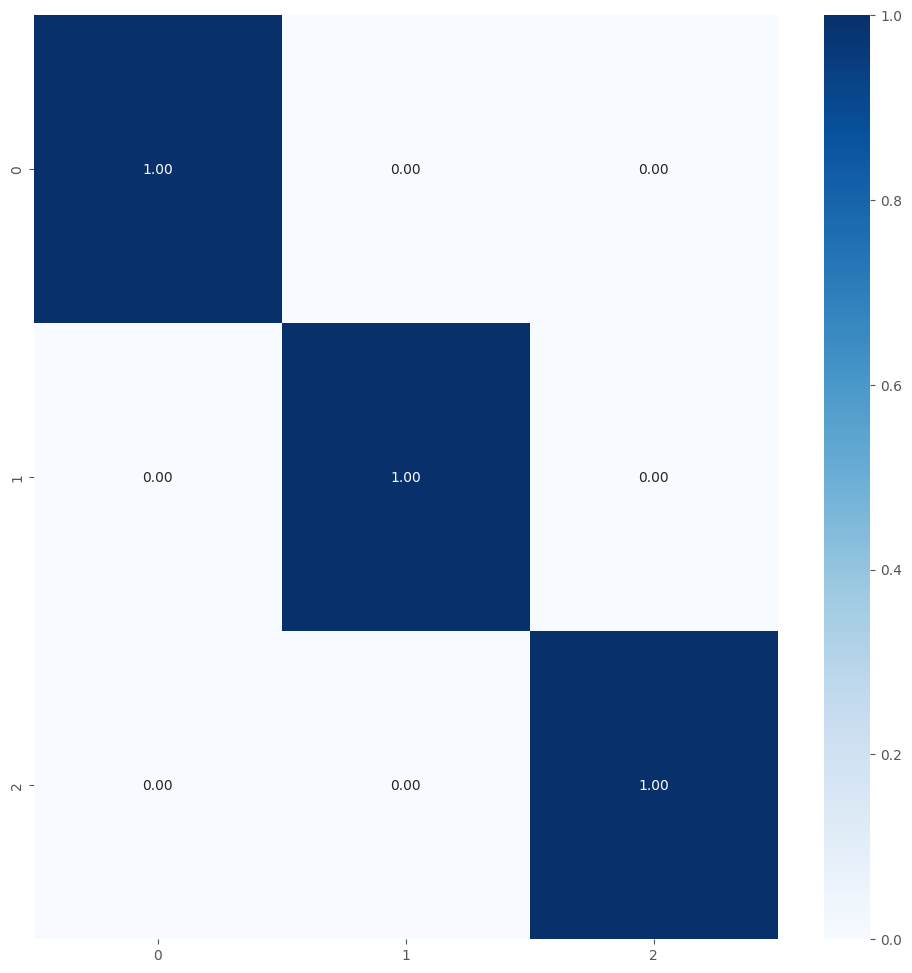


Best fold was 2 with val_accuracy: 1.0000
Average training accuracy in 5-fold: 1.0
Average validation precision in 5-fold: 0.9997023820877076

Test Metrics
test_acc_list: [1.0, 1.0, 1.0, 1.0, 1.0]
Average Test Accuracy with 5-fold: 1.0
test_loss_list: [0.014670568518340588, 0.01654384471476078, 0.006532039027661085, 0.00528183626011014, 0.011910194531083107]
Average Test Log Loss with 5-fold: 0.01098769661039114

Precision List: [1.0, 1.0, 1.0, 1.0, 1.0]
Average Precision List with 5-fold: 1.0
Recall List: [1.0, 1.0, 1.0, 1.0, 1.0]
Average Recall List with 5-fold: 1.0
F1 Score List: [1.0, 1.0, 1.0, 1.0, 1.0]
Average F1 Score List with 5-fold: 1.0

Metrics List Store

test_acc_list_all = [1.0]
test_loss_list_all = [0.01098769661039114]
precision_list_all = [1.0]
recall_list_all = [1.0]
f1_score_list_all = [1.0]
La carpeta 3 fue eliminada.
CPU times: user 1h 33min 10s, sys: 7min 29s, total: 1h 40min 40s
Wall time: 1h 17min 11s


In [17]:
%%time

num_classes = 3
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, 
    precision_list_all, recall_list_all, f1_score_list_all)

In [22]:
test_acc_list_all.append(1.0)
test_loss_list_all.append(0.01098769661039114)
precision_list_all.append(1.0)
recall_list_all.append(1.0)
f1_score_list_all.append(1.0)

[I 2025-06-14 19:24:29,507] A new study created in memory with name: malware_classification_4classes


Familias de malware copiadas
source2: /notebooks/train3/all_malware/4
name_save_model: MobileNet_tf_15004
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
- Allaple.A
- Ramnit
model_path: /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15004_best.h5

Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15004_best.h5
Successfully loaded and modified pretrained model
Found 4200 images belonging to 4 classes.
Found 900 images belonging to 4 classes.
Found 900 images belonging to 4 classes.


[I 2025-06-14 19:44:00,784] Trial 0 finished with values: [0.9977678656578064, 0.023683441802859306] and parameters: {'learning_rate': 0.009062234861781133, 'dropout_rate1': 0.5547578291816233, 'dropout_rate2': 0.3980155777084132, 'l2_reg': 0.0004371625357735318, 'units_dense1': 1024, 'units_dense2': 64, 'num_dense_layers': 3, 'unfreeze_layers': 11, 'early_stopping_patience': 19, 'reduce_lr_patience': 15, 'fine_tune_learning_rate': 5.638731840056749e-06, 'units_dense3': 64, 'dropout_rate3': 0.16968259537734293}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15004_best.h5
Successfully loaded and modified pretrained model
Found 4200 images belonging to 4 classes.
Found 900 images belonging to 4 classes.
Found 900 images belonging to 4 classes.


[I 2025-06-14 20:03:26,087] Trial 1 finished with values: [0.9977678656578064, 0.035592906177043915] and parameters: {'learning_rate': 0.006501118948831025, 'dropout_rate1': 0.348475077232418, 'dropout_rate2': 0.10947592093504604, 'l2_reg': 2.4156560938448987e-05, 'units_dense1': 1024, 'units_dense2': 64, 'num_dense_layers': 3, 'unfreeze_layers': 9, 'early_stopping_patience': 16, 'reduce_lr_patience': 10, 'fine_tune_learning_rate': 1.3352003015163929e-06, 'units_dense3': 32, 'dropout_rate3': 0.11146015825843374}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15004_best.h5
Successfully loaded and modified pretrained model
Found 4200 images belonging to 4 classes.
Found 900 images belonging to 4 classes.
Found 900 images belonging to 4 classes.


[I 2025-06-14 20:14:26,316] Trial 2 finished with values: [0.9966517686843872, 0.03490407019853592] and parameters: {'learning_rate': 0.00011047593986310724, 'dropout_rate1': 0.5956622258799976, 'dropout_rate2': 0.43497903694199913, 'l2_reg': 2.7654487686554402e-05, 'units_dense1': 256, 'units_dense2': 256, 'num_dense_layers': 2, 'unfreeze_layers': 14, 'early_stopping_patience': 12, 'reduce_lr_patience': 8, 'fine_tune_learning_rate': 5.066613601666011e-06}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15004_best.h5
Successfully loaded and modified pretrained model
Found 4200 images belonging to 4 classes.
Found 900 images belonging to 4 classes.
Found 900 images belonging to 4 classes.


[I 2025-06-14 20:32:51,094] Trial 3 finished with values: [0.9966517686843872, 0.030628979206085205] and parameters: {'learning_rate': 4.443700191355377e-05, 'dropout_rate1': 0.5336447957842956, 'dropout_rate2': 0.10714607211728988, 'l2_reg': 3.000171404283322e-05, 'units_dense1': 256, 'units_dense2': 128, 'num_dense_layers': 2, 'unfreeze_layers': 14, 'early_stopping_patience': 10, 'reduce_lr_patience': 10, 'fine_tune_learning_rate': 3.5613357739218426e-06}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15004_best.h5
Successfully loaded and modified pretrained model
Found 4200 images belonging to 4 classes.
Found 900 images belonging to 4 classes.
Found 900 images belonging to 4 classes.


[I 2025-06-14 20:43:45,856] Trial 4 finished with values: [0.9977678656578064, 0.016820091754198074] and parameters: {'learning_rate': 0.0006047664913389403, 'dropout_rate1': 0.5820590160287595, 'dropout_rate2': 0.351617295378409, 'l2_reg': 0.00013593096957390113, 'units_dense1': 512, 'units_dense2': 128, 'num_dense_layers': 3, 'unfreeze_layers': 9, 'early_stopping_patience': 18, 'reduce_lr_patience': 15, 'fine_tune_learning_rate': 1.637120231430651e-05, 'units_dense3': 64, 'dropout_rate3': 0.24563535962367505}.
/tmp/ipykernel_70/3900254938.py:136: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


Mejores trials para cada objetivo:
  Trial 4:
    val_accuracy: 0.9978
    val_loss: 0.0168
    Parámetros: {'learning_rate': 0.0006047664913389403, 'dropout_rate1': 0.5820590160287595, 'dropout_rate2': 0.351617295378409, 'l2_reg': 0.00013593096957390113, 'units_dense1': 512, 'units_dense2': 128, 'num_dense_layers': 3, 'unfreeze_layers': 9, 'early_stopping_patience': 18, 'reduce_lr_patience': 15, 'fine_tune_learning_rate': 1.637120231430651e-05, 'units_dense3': 64, 'dropout_rate3': 0.24563535962367505}


<Figure size 700x500 with 0 Axes>

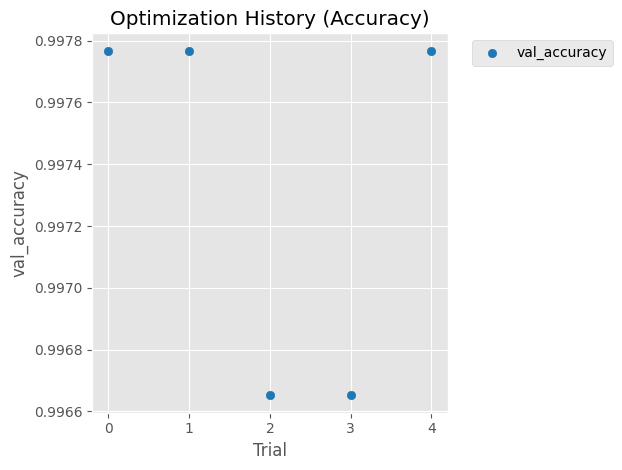

/tmp/ipykernel_70/3900254938.py:147: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

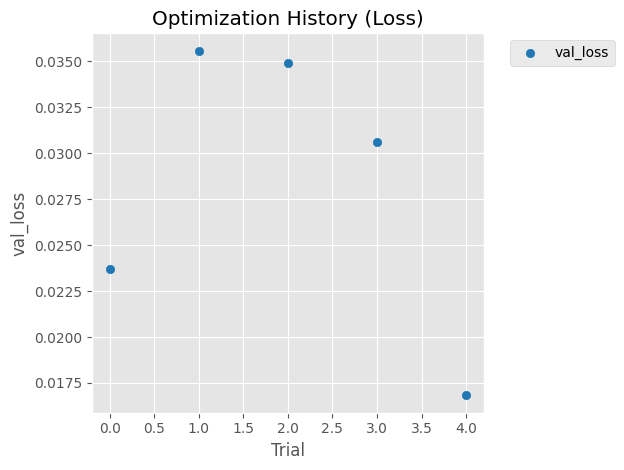

/tmp/ipykernel_70/3900254938.py:185: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Figure size 700x500 with 0 Axes>

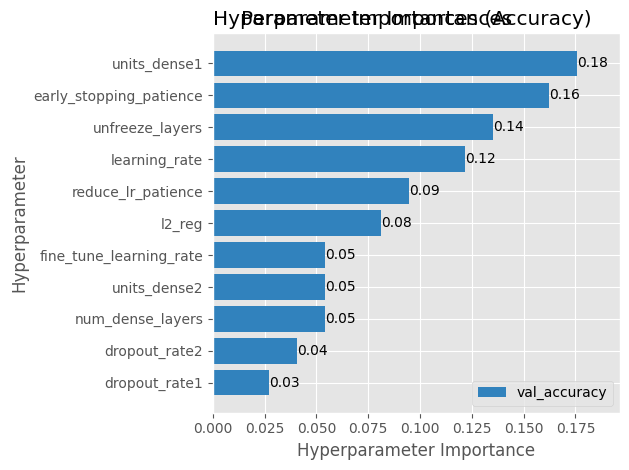

Found 4200 images belonging to 4 classes.
Found 900 images belonging to 4 classes.
Found 900 images belonging to 4 classes.

TRAINING AND EVALUATING FOLD 1/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15004_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
131/131 [==============================] - 30s 170ms/step - loss: 0.0124 - accuracy: 1.0000 - val_loss: 0.0254 - val_accuracy: 0.9967 - lr: 6.0477e-05
Epoch 2/50
131/131 [==============================] - 20s 153ms/step - loss: 0.0076 - accuracy: 1.0000 - val_loss: 0.0314 - val_accuracy: 0.9967 - lr: 6.0477e-05
Epoch 3/50
131/131 [==============================] - 20s 152ms/step - loss: 0.0058 - accuracy: 1.0000 - val_loss: 0.0290 - val_accuracy: 0.9967 - lr: 6.0477e-05
Epoch 4/50
131/131 [==============================] - 22s 167ms/step - loss: 0.0048 - accuracy: 1.0000 - val_loss: 0.0303 - val_accuracy: 0.9967 - lr: 6.0477e-05
E

History for fold 1 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15004_1.pkl
132/132 [==============================] - 13s 98ms/step - loss: 0.0036 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.003577582072466612
29/29 [==============================] - 3s 82ms/step - loss: 0.0215 - accuracy: 0.9978
Validation Accuracy: 0.9977777600288391
Validation Log Loss: 0.02150752767920494
29/29 [==============================] - 4s 142ms/step - loss: 0.0211 - accuracy: 0.9978
Test Accuracy: 0.9977777600288391
Test Log Loss: 0.021144933998584747
Test labels: {'Allaple.A': 0, 'Ramnit': 1, 'sfone': 2, 'sillyp2p': 3}

Matriz de Confusión:
[[225   0   0   0]
 [  0 225   0   0]
 [  0   0 225   0]
 [  0   2   0 223]]
True labels: 900
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       0.99      1.00      1.00       225
           2       1.00   

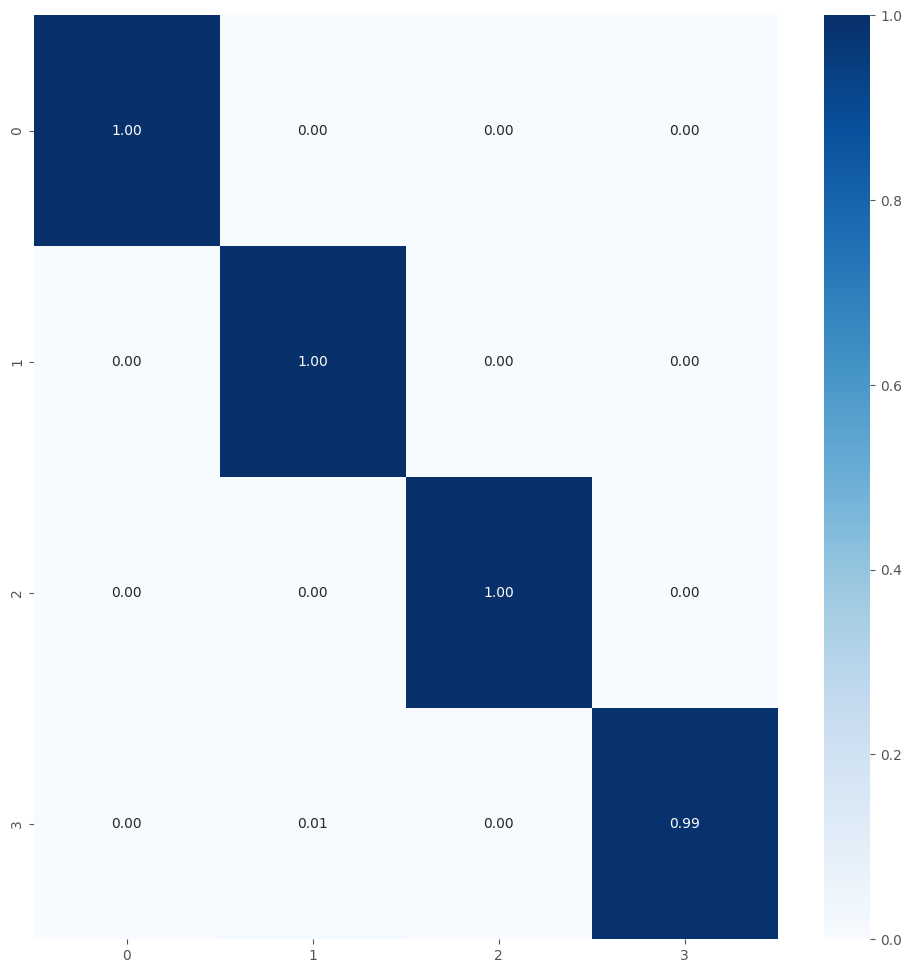


TRAINING AND EVALUATING FOLD 2/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15004_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
131/131 [==============================] - 13s 80ms/step - loss: 0.0142 - accuracy: 1.0000 - val_loss: 0.0303 - val_accuracy: 0.9967 - lr: 6.0477e-05
Epoch 2/50
131/131 [==============================] - 9s 68ms/step - loss: 0.0096 - accuracy: 1.0000 - val_loss: 0.0308 - val_accuracy: 0.9967 - lr: 6.0477e-05
Epoch 3/50
131/131 [==============================] - 10s 75ms/step - loss: 0.0072 - accuracy: 1.0000 - val_loss: 0.0310 - val_accuracy: 0.9967 - lr: 6.0477e-05
Epoch 4/50
131/131 [==============================] - 10s 75ms/step - loss: 0.0056 - accuracy: 1.0000 - val_loss: 0.0273 - val_accuracy: 0.9955 - lr: 6.0477e-05
Epoch 5/50
131/131 [==============================] - 10s 74ms/step - loss: 0.0046 - accuracy: 1.0000 - val_loss: 0.0304 - val_acc

History for fold 2 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15004_2.pkl
132/132 [==============================] - 8s 59ms/step - loss: 0.0041 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.004130688030272722
29/29 [==============================] - 2s 59ms/step - loss: 0.0303 - accuracy: 0.9978
Validation Accuracy: 0.9977777600288391
Validation Log Loss: 0.03025396727025509
29/29 [==============================] - 2s 57ms/step - loss: 0.0315 - accuracy: 0.9978
Test Accuracy: 0.9977777600288391
Test Log Loss: 0.031534433364868164
Test labels: {'Allaple.A': 0, 'Ramnit': 1, 'sfone': 2, 'sillyp2p': 3}

Matriz de Confusión:
[[225   0   0   0]
 [  0 225   0   0]
 [  0   0 225   0]
 [  0   2   0 223]]
True labels: 900
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       0.99      1.00      1.00       225
           2       1.00     

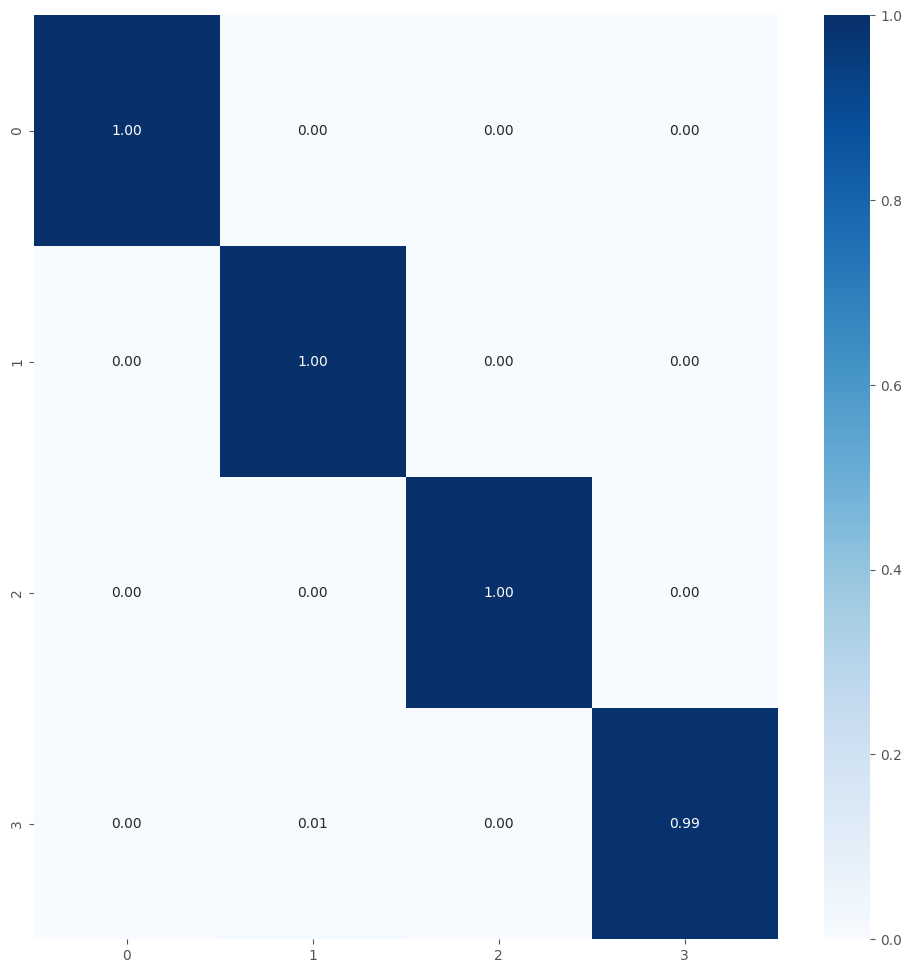


TRAINING AND EVALUATING FOLD 3/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15004_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
131/131 [==============================] - 12s 73ms/step - loss: 0.0120 - accuracy: 1.0000 - val_loss: 0.0289 - val_accuracy: 0.9967 - lr: 6.0477e-05
Epoch 2/50
131/131 [==============================] - 10s 75ms/step - loss: 0.0064 - accuracy: 1.0000 - val_loss: 0.0239 - val_accuracy: 0.9967 - lr: 6.0477e-05
Epoch 3/50
131/131 [==============================] - 10s 73ms/step - loss: 0.0047 - accuracy: 1.0000 - val_loss: 0.0253 - val_accuracy: 0.9955 - lr: 6.0477e-05
Epoch 4/50
131/131 [==============================] - 10s 76ms/step - loss: 0.0044 - accuracy: 0.9995 - val_loss: 0.0285 - val_accuracy: 0.9967 - lr: 6.0477e-05
Epoch 5/50
131/131 [==============================] - 10s 73ms/step - loss: 0.0048 - accuracy: 0.9998 - val_loss: 0.0326 - val_ac

History for fold 3 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15004_3.pkl
132/132 [==============================] - 8s 60ms/step - loss: 0.0081 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.008119954727590084
29/29 [==============================] - 2s 59ms/step - loss: 0.0288 - accuracy: 0.9967
Validation Accuracy: 0.996666669845581
Validation Log Loss: 0.028825759887695312
29/29 [==============================] - 2s 53ms/step - loss: 0.0250 - accuracy: 0.9978
Test Accuracy: 0.9977777600288391
Test Log Loss: 0.024968687444925308
Test labels: {'Allaple.A': 0, 'Ramnit': 1, 'sfone': 2, 'sillyp2p': 3}

Matriz de Confusión:
[[225   0   0   0]
 [  0 225   0   0]
 [  0   0 225   0]
 [  0   2   0 223]]
True labels: 900
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       0.99      1.00      1.00       225
           2       1.00     

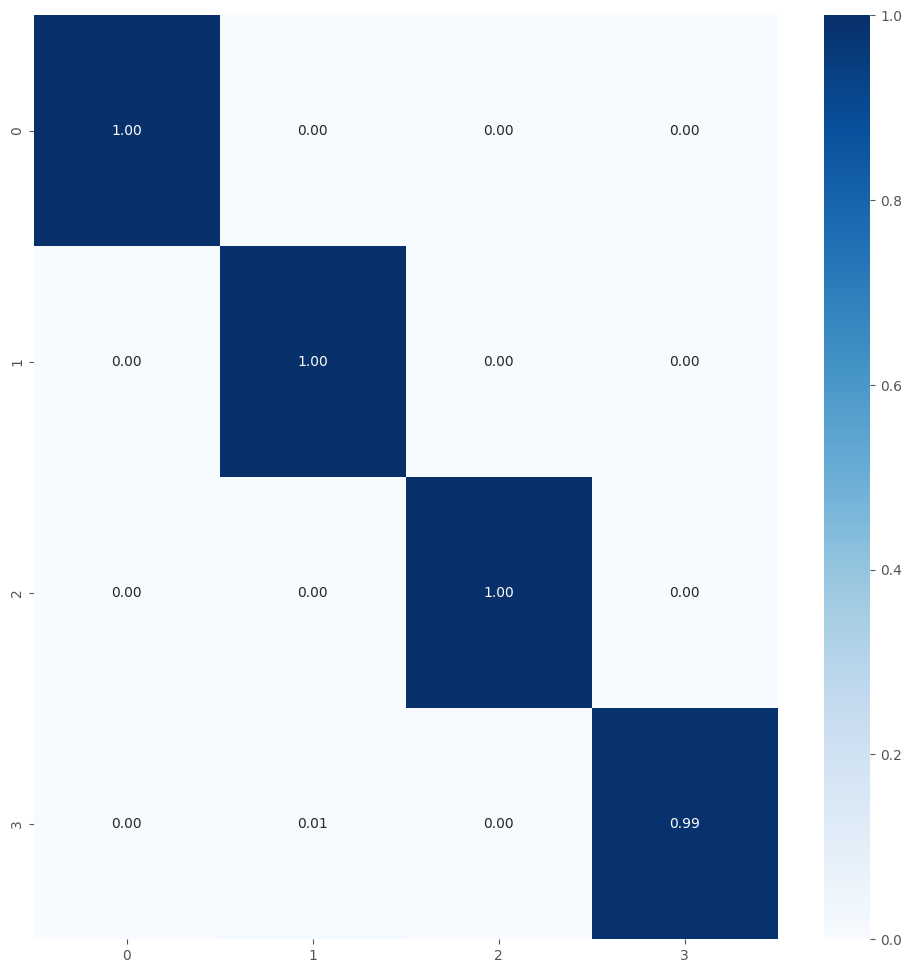


TRAINING AND EVALUATING FOLD 4/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15004_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
131/131 [==============================] - 17s 106ms/step - loss: 0.0121 - accuracy: 1.0000 - val_loss: 0.0250 - val_accuracy: 0.9978 - lr: 6.0477e-05
Epoch 2/50
131/131 [==============================] - 21s 158ms/step - loss: 0.0063 - accuracy: 1.0000 - val_loss: 0.0211 - val_accuracy: 0.9978 - lr: 6.0477e-05
Epoch 3/50
131/131 [==============================] - 18s 140ms/step - loss: 0.0040 - accuracy: 1.0000 - val_loss: 0.0276 - val_accuracy: 0.9978 - lr: 6.0477e-05
Epoch 4/50
131/131 [==============================] - 20s 152ms/step - loss: 0.0032 - accuracy: 1.0000 - val_loss: 0.0327 - val_accuracy: 0.9967 - lr: 6.0477e-05
Epoch 5/50
131/131 [==============================] - 18s 136ms/step - loss: 0.0024 - accuracy: 1.0000 - val_loss: 0.0245 - v

History for fold 4 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15004_4.pkl
132/132 [==============================] - 11s 82ms/step - loss: 0.0080 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.008008715696632862
29/29 [==============================] - 2s 59ms/step - loss: 0.0250 - accuracy: 0.9978
Validation Accuracy: 0.9977777600288391
Validation Log Loss: 0.024961581453680992
29/29 [==============================] - 2s 58ms/step - loss: 0.0235 - accuracy: 0.9978
Test Accuracy: 0.9977777600288391
Test Log Loss: 0.0235426165163517
Test labels: {'Allaple.A': 0, 'Ramnit': 1, 'sfone': 2, 'sillyp2p': 3}

Matriz de Confusión:
[[225   0   0   0]
 [  0 225   0   0]
 [  0   0 225   0]
 [  0   2   0 223]]
True labels: 900
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       0.99      1.00      1.00       225
           2       1.00     

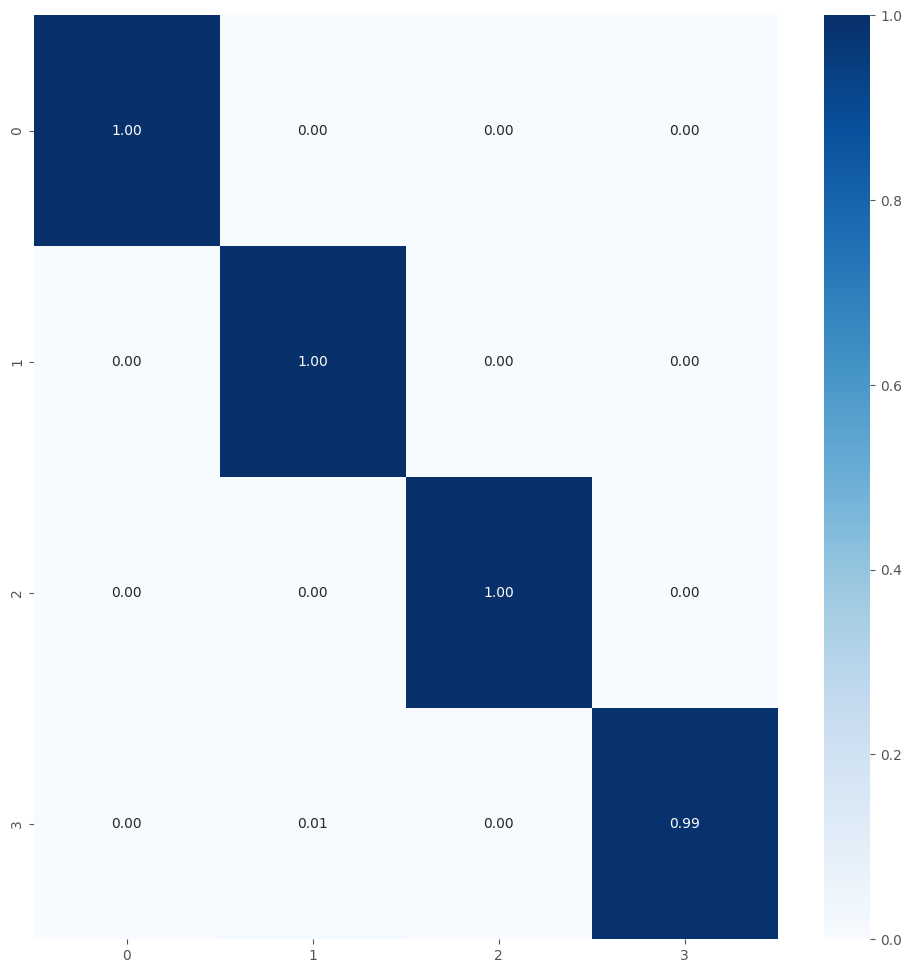


TRAINING AND EVALUATING FOLD 5/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15004_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
131/131 [==============================] - 14s 78ms/step - loss: 0.0126 - accuracy: 0.9998 - val_loss: 0.0289 - val_accuracy: 0.9944 - lr: 6.0477e-05
Epoch 2/50
131/131 [==============================] - 11s 85ms/step - loss: 0.0080 - accuracy: 0.9998 - val_loss: 0.0244 - val_accuracy: 0.9978 - lr: 6.0477e-05
Epoch 3/50
131/131 [==============================] - 21s 158ms/step - loss: 0.0063 - accuracy: 1.0000 - val_loss: 0.0248 - val_accuracy: 0.9978 - lr: 6.0477e-05
Epoch 4/50
131/131 [==============================] - 22s 166ms/step - loss: 0.0054 - accuracy: 1.0000 - val_loss: 0.0230 - val_accuracy: 0.9978 - lr: 6.0477e-05
Epoch 5/50
131/131 [==============================] - 20s 155ms/step - loss: 0.0048 - accuracy: 1.0000 - val_loss: 0.0219 - val

History for fold 5 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15004_5.pkl
132/132 [==============================] - 17s 125ms/step - loss: 0.0066 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.006593444384634495
29/29 [==============================] - 4s 123ms/step - loss: 0.0243 - accuracy: 0.9978
Validation Accuracy: 0.9977777600288391
Validation Log Loss: 0.024299148470163345
29/29 [==============================] - 4s 122ms/step - loss: 0.0257 - accuracy: 0.9967
Test Accuracy: 0.996666669845581
Test Log Loss: 0.025696322321891785
Test labels: {'Allaple.A': 0, 'Ramnit': 1, 'sfone': 2, 'sillyp2p': 3}

Matriz de Confusión:
[[225   0   0   0]
 [  0 224   0   1]
 [  0   0 225   0]
 [  0   2   0 223]]
True labels: 900
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       0.99      1.00      0.99       225
           2       1.00 

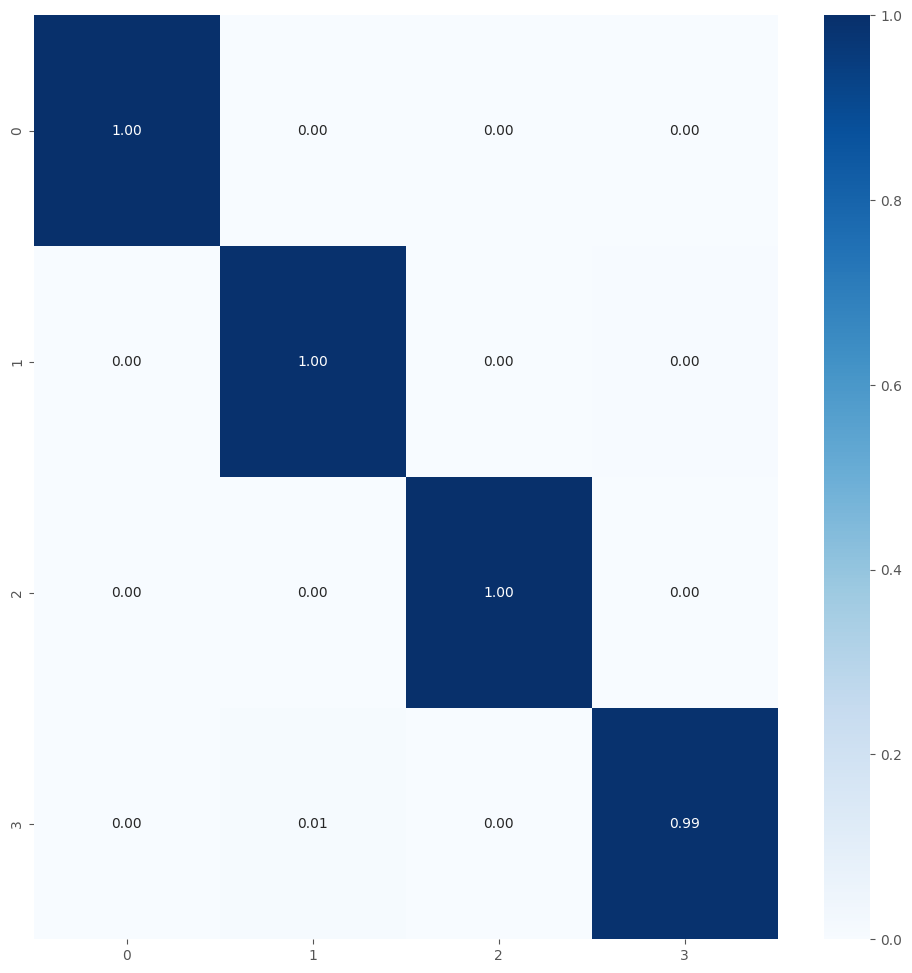


Best fold was 1 with val_accuracy: 0.9978
Average training accuracy in 5-fold: 1.0
Average validation precision in 5-fold: 0.9975446462631226

Test Metrics
test_acc_list: [0.9977777600288391, 0.9977777600288391, 0.9977777600288391, 0.9977777600288391, 0.996666669845581]
Average Test Accuracy with 5-fold: 0.9975555419921875
test_loss_list: [0.021144933998584747, 0.031534433364868164, 0.024968687444925308, 0.0235426165163517, 0.025696322321891785]
Average Test Log Loss with 5-fold: 0.02537739872932434

Precision List: [0.9977973568281938, 0.9977973568281938, 0.9977973568281938, 0.9977973568281938, 0.9966715391908976]
Average Precision List with 5-fold: 0.9975721933007347
Recall List: [0.9977777777777778, 0.9977777777777778, 0.9977777777777778, 0.9977777777777778, 0.9966666666666667]
Average Recall List with 5-fold: 0.9975555555555555
F1 Score List: [0.9977777338811631, 0.9977777338811631, 0.9977777338811631, 0.9977777338811631, 0.99666665020568]
Average F1 Score List with 5-fold: 0.9975

In [23]:
%%time

num_classes = 4
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, 
    precision_list_all, recall_list_all, f1_score_list_all)

[I 2025-06-14 21:17:55,340] A new study created in memory with name: malware_classification_5classes


Familias de malware copiadas
source2: /notebooks/train3/all_malware/5
name_save_model: MobileNet_tf_15005
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
- Allaple.A
- Ramnit
- wabot
model_path: /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15005_best.h5

Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15005_best.h5
Successfully loaded and modified pretrained model
Found 5250 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.


[I 2025-06-14 21:45:13,374] Trial 0 finished with values: [0.9964285492897034, 0.08191938698291779] and parameters: {'learning_rate': 6.785541937002745e-05, 'dropout_rate1': 0.25108694388268, 'dropout_rate2': 0.14644902364998016, 'l2_reg': 8.576975539993414e-05, 'units_dense1': 256, 'units_dense2': 256, 'num_dense_layers': 3, 'unfreeze_layers': 10, 'early_stopping_patience': 17, 'reduce_lr_patience': 13, 'fine_tune_learning_rate': 2.016651146073591e-05, 'units_dense3': 128, 'dropout_rate3': 0.1985639847939673}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15005_best.h5
Successfully loaded and modified pretrained model
Found 5250 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.


[I 2025-06-14 22:11:55,198] Trial 1 finished with values: [0.9964285492897034, 0.10280303657054901] and parameters: {'learning_rate': 0.00029412037012877435, 'dropout_rate1': 0.4105620411217088, 'dropout_rate2': 0.3752162533910405, 'l2_reg': 0.006100209886936553, 'units_dense1': 256, 'units_dense2': 256, 'num_dense_layers': 2, 'unfreeze_layers': 6, 'early_stopping_patience': 19, 'reduce_lr_patience': 9, 'fine_tune_learning_rate': 7.536044865654178e-06}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15005_best.h5
Successfully loaded and modified pretrained model
Found 5250 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.


[I 2025-06-14 22:37:46,854] Trial 2 finished with values: [0.9964285492897034, 0.06194193661212921] and parameters: {'learning_rate': 0.0003769857831980089, 'dropout_rate1': 0.29048199398001767, 'dropout_rate2': 0.4152151911510691, 'l2_reg': 0.0003450160269394353, 'units_dense1': 256, 'units_dense2': 64, 'num_dense_layers': 2, 'unfreeze_layers': 14, 'early_stopping_patience': 11, 'reduce_lr_patience': 12, 'fine_tune_learning_rate': 3.922243180035486e-05}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15005_best.h5
Successfully loaded and modified pretrained model
Found 5250 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.


[I 2025-06-14 23:06:35,124] Trial 3 finished with values: [0.9964285492897034, 0.08088213205337524] and parameters: {'learning_rate': 0.00930586140294583, 'dropout_rate1': 0.34534108914953776, 'dropout_rate2': 0.37760257164089817, 'l2_reg': 0.007148653072514042, 'units_dense1': 1024, 'units_dense2': 256, 'num_dense_layers': 2, 'unfreeze_layers': 8, 'early_stopping_patience': 20, 'reduce_lr_patience': 12, 'fine_tune_learning_rate': 1.1636195939675634e-05}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15005_best.h5
Successfully loaded and modified pretrained model
Found 5250 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.


2025-06-14 23:12:19.289397: W external/local_tsl/tsl/framework/bfc_allocator.cc:485] Allocator (GPU_0_bfc) ran out of memory trying to allocate 99.76MiB (rounded to 104603648)requested by op model_15/conv_pad_2/Pad
If the cause is memory fragmentation maybe the environment variable 'TF_GPU_ALLOCATOR=cuda_malloc_async' will improve the situation. 
Current allocation summary follows.
Current allocation summary follows.
2025-06-14 23:12:19.289759: I external/local_tsl/tsl/framework/bfc_allocator.cc:1039] BFCAllocator dump for GPU_0_bfc
2025-06-14 23:12:19.290104: I external/local_tsl/tsl/framework/bfc_allocator.cc:1046] Bin (256): 	Total Chunks: 643, Chunks in use: 640. 160.8KiB allocated for chunks. 160.0KiB in use in bin. 68.2KiB client-requested in use in bin.
2025-06-14 23:12:19.290140: I external/local_tsl/tsl/framework/bfc_allocator.cc:1046] Bin (512): 	Total Chunks: 421, Chunks in use: 418. 221.5KiB allocated for chunks. 220.0KiB in use in bin. 209.0KiB client-requested in use in b

Error in trial 4: Graph execution error:

Detected at node model_15/conv_pad_2/Pad defined at (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main

  File "<frozen runpy>", line 88, in _run_code

  File "/usr/local/lib/python3.11/dist-packages/ipykernel_launcher.py", line 17, in <module>

  File "/usr/local/lib/python3.11/dist-packages/traitlets/config/application.py", line 1053, in launch_instance

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelapp.py", line 739, in start

  File "/usr/local/lib/python3.11/dist-packages/tornado/platform/asyncio.py", line 195, in start

  File "/usr/lib/python3.11/asyncio/base_events.py", line 604, in run_forever

  File "/usr/lib/python3.11/asyncio/base_events.py", line 1909, in _run_once

  File "/usr/lib/python3.11/asyncio/events.py", line 80, in _run

  File "/usr/local/lib/python3.11/dist-packages/ipykernel/kernelbase.py", line 529, in dispatch_queue

  File "/usr/local/lib/python3.11/dist-packages/ip

/tmp/ipykernel_70/3900254938.py:136: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

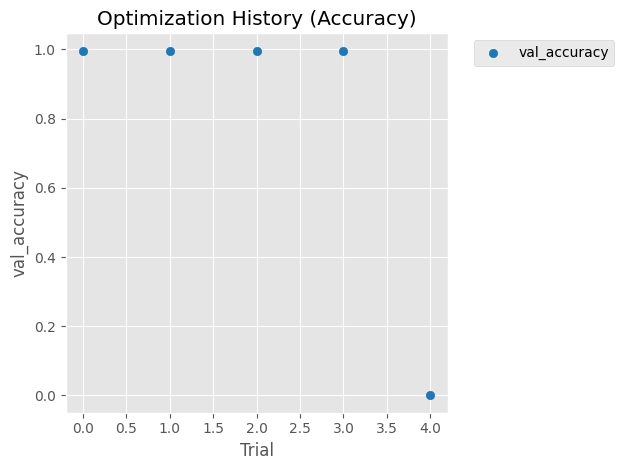

/tmp/ipykernel_70/3900254938.py:147: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

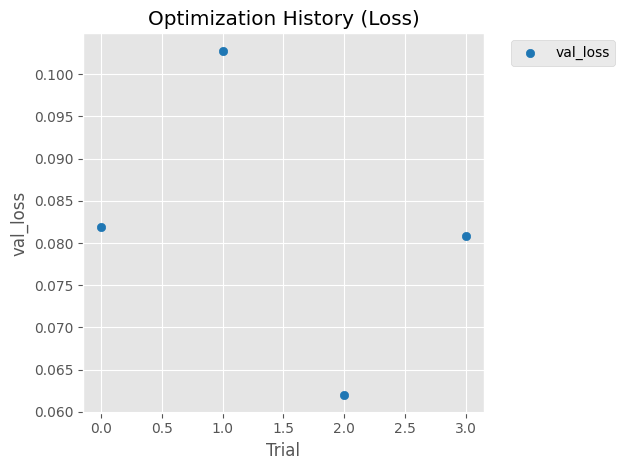

/tmp/ipykernel_70/3900254938.py:185: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Figure size 700x500 with 0 Axes>

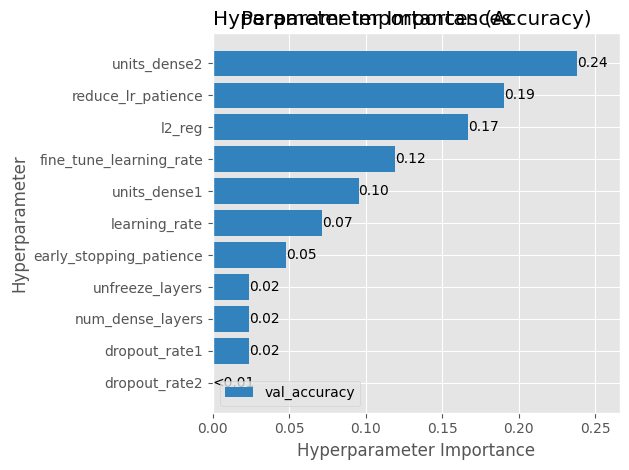

Found 5250 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.

TRAINING AND EVALUATING FOLD 1/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15005_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
164/164 [==============================] - 33s 150ms/step - loss: 0.1176 - accuracy: 0.9998 - val_loss: 0.1349 - val_accuracy: 0.9937 - lr: 3.7699e-05
Epoch 2/50
164/164 [==============================] - 23s 140ms/step - loss: 0.0973 - accuracy: 1.0000 - val_loss: 0.1203 - val_accuracy: 0.9946 - lr: 3.7699e-05
Epoch 3/50
164/164 [==============================] - 23s 142ms/step - loss: 0.0861 - accuracy: 0.9996 - val_loss: 0.1097 - val_accuracy: 0.9955 - lr: 3.7699e-05
Epoch 4/50
164/164 [==============================] - 19s 112ms/step - loss: 0.0791 - accuracy: 0.9996 - val_loss: 0.1195 - val_accuracy: 0.9902 - lr: 3.7699e-05

History for fold 1 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15005_1.pkl
165/165 [==============================] - 20s 120ms/step - loss: 0.0805 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.08047424256801605
36/36 [==============================] - 5s 131ms/step - loss: 0.1096 - accuracy: 0.9956
Validation Accuracy: 0.995555579662323
Validation Log Loss: 0.10955119878053665
36/36 [==============================] - 5s 143ms/step - loss: 0.1139 - accuracy: 0.9938
Test Accuracy: 0.9937777519226074
Test Log Loss: 0.11386124789714813
Test labels: {'Allaple.A': 0, 'Ramnit': 1, 'sfone': 2, 'sillyp2p': 3, 'wabot': 4}

Matriz de Confusión:
[[225   0   0   0   0]
 [  0 224   0   1   0]
 [  0   0 223   0   2]
 [  0   2   0 223   0]
 [  0   1   1   0 223]]
True labels: 1125
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       0.99      

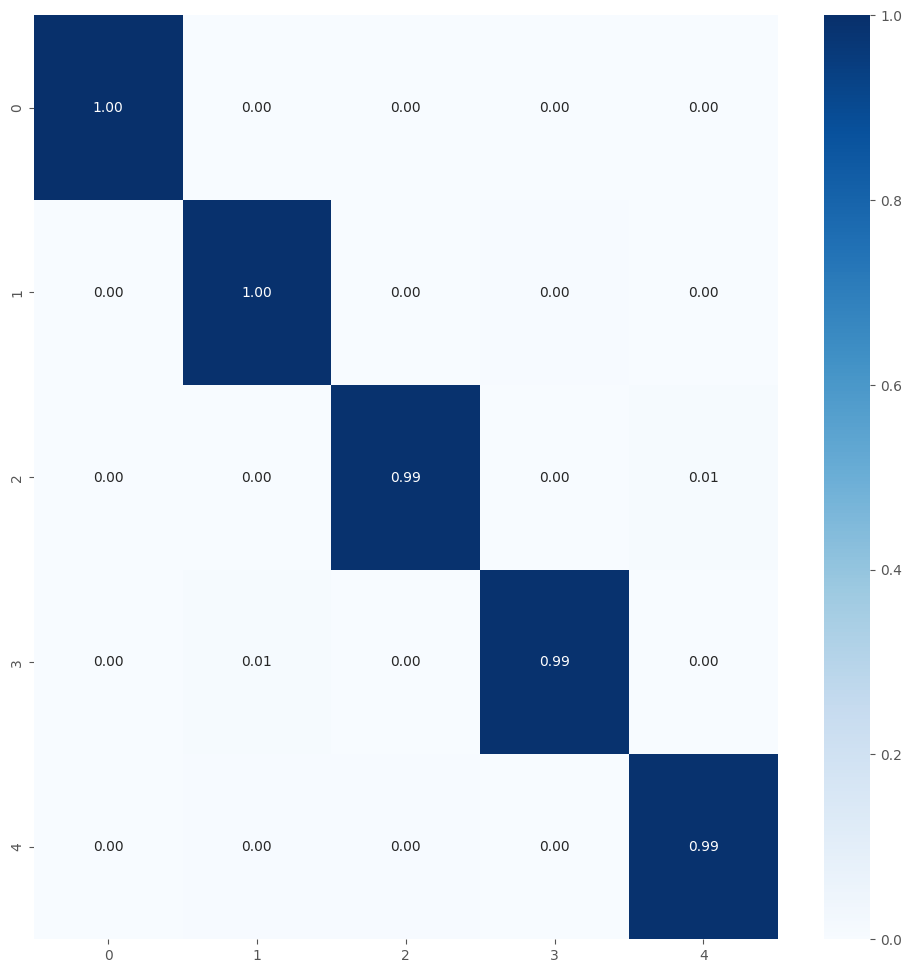


TRAINING AND EVALUATING FOLD 2/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15005_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
164/164 [==============================] - 35s 159ms/step - loss: 0.1189 - accuracy: 0.9996 - val_loss: 0.1339 - val_accuracy: 0.9955 - lr: 3.7699e-05
Epoch 2/50
164/164 [==============================] - 25s 150ms/step - loss: 0.1021 - accuracy: 0.9998 - val_loss: 0.1540 - val_accuracy: 0.9866 - lr: 3.7699e-05
Epoch 3/50
164/164 [==============================] - 25s 149ms/step - loss: 0.0935 - accuracy: 0.9994 - val_loss: 0.1184 - val_accuracy: 0.9946 - lr: 3.7699e-05
Epoch 4/50
164/164 [==============================] - 25s 154ms/step - loss: 0.0867 - accuracy: 0.9998 - val_loss: 0.1113 - val_accuracy: 0.9946 - lr: 3.7699e-05
Epoch 5/50
164/164 [==============================] - 25s 154ms/step - loss: 0.0812 - accuracy: 1.0000 - val_loss: 0.1213 - v

History for fold 2 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15005_2.pkl
165/165 [==============================] - 20s 122ms/step - loss: 0.0581 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.05811108276247978
36/36 [==============================] - 5s 134ms/step - loss: 0.0837 - accuracy: 0.9964
Validation Accuracy: 0.9964444637298584
Validation Log Loss: 0.08372300863265991
36/36 [==============================] - 4s 118ms/step - loss: 0.0896 - accuracy: 0.9947
Test Accuracy: 0.9946666955947876
Test Log Loss: 0.0896453782916069
Test labels: {'Allaple.A': 0, 'Ramnit': 1, 'sfone': 2, 'sillyp2p': 3, 'wabot': 4}

Matriz de Confusión:
[[225   0   0   0   0]
 [  0 224   0   1   0]
 [  0   0 224   0   1]
 [  0   2   0 223   0]
 [  0   1   1   0 223]]
True labels: 1125
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       0.99      

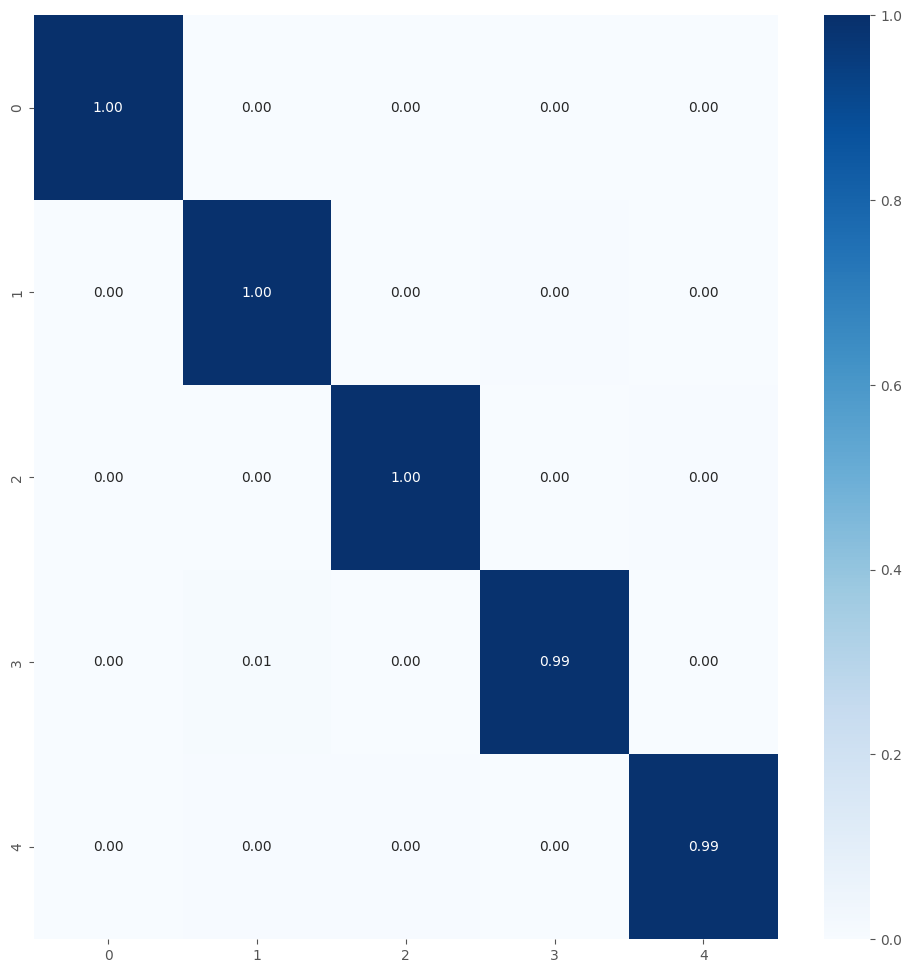


TRAINING AND EVALUATING FOLD 3/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15005_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
164/164 [==============================] - 29s 126ms/step - loss: 0.1218 - accuracy: 0.9998 - val_loss: 0.1409 - val_accuracy: 0.9937 - lr: 3.7699e-05
Epoch 2/50
164/164 [==============================] - 25s 151ms/step - loss: 0.1081 - accuracy: 0.9996 - val_loss: 0.1313 - val_accuracy: 0.9946 - lr: 3.7699e-05
Epoch 3/50
164/164 [==============================] - 25s 149ms/step - loss: 0.0982 - accuracy: 1.0000 - val_loss: 0.1243 - val_accuracy: 0.9937 - lr: 3.7699e-05
Epoch 4/50
164/164 [==============================] - 24s 144ms/step - loss: 0.0908 - accuracy: 0.9998 - val_loss: 0.1184 - val_accuracy: 0.9946 - lr: 3.7699e-05
Epoch 5/50
164/164 [==============================] - 24s 145ms/step - loss: 0.0872 - accuracy: 0.9996 - val_loss: 0.2705 - v

History for fold 3 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15005_3.pkl
165/165 [==============================] - 19s 113ms/step - loss: 0.0773 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.07732651382684708
36/36 [==============================] - 4s 109ms/step - loss: 0.1022 - accuracy: 0.9956
Validation Accuracy: 0.995555579662323
Validation Log Loss: 0.10221753269433975
36/36 [==============================] - 5s 123ms/step - loss: 0.1050 - accuracy: 0.9947
Test Accuracy: 0.9946666955947876
Test Log Loss: 0.10499538481235504
Test labels: {'Allaple.A': 0, 'Ramnit': 1, 'sfone': 2, 'sillyp2p': 3, 'wabot': 4}

Matriz de Confusión:
[[225   0   0   0   0]
 [  0 224   0   1   0]
 [  0   0 224   0   1]
 [  0   2   0 223   0]
 [  0   1   1   0 223]]
True labels: 1125
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       0.99      

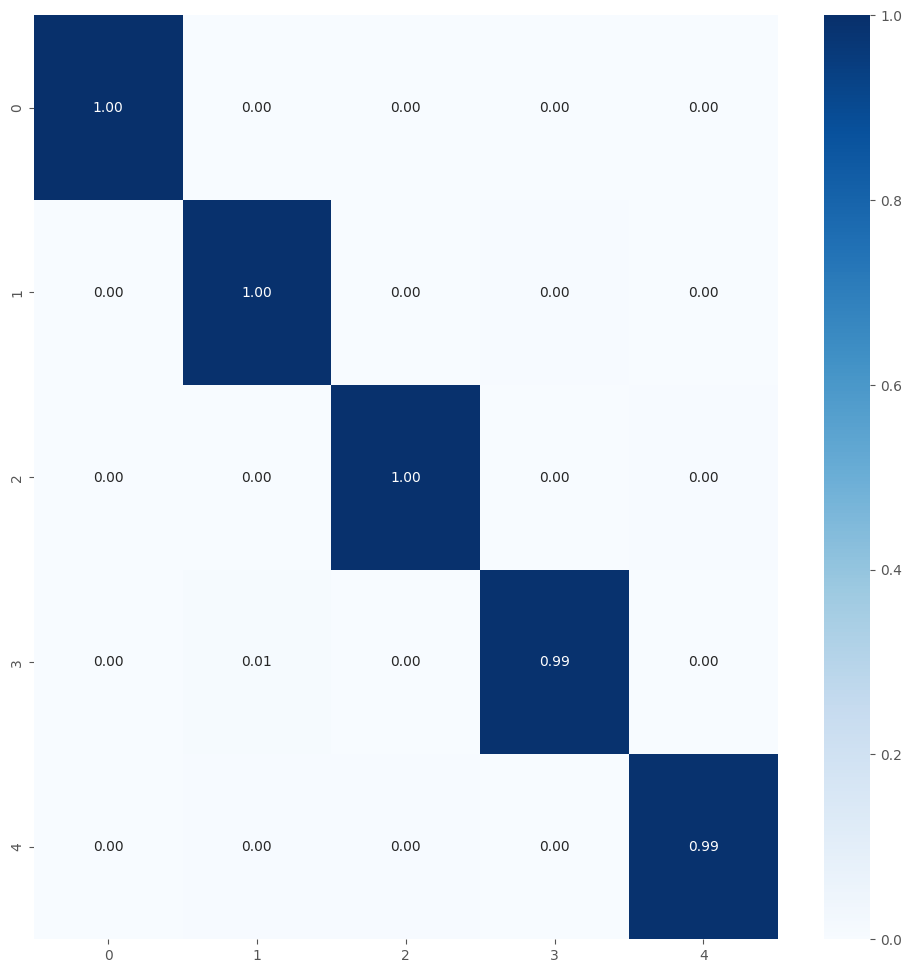


TRAINING AND EVALUATING FOLD 4/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15005_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
164/164 [==============================] - 36s 156ms/step - loss: 0.1164 - accuracy: 0.9994 - val_loss: 0.1344 - val_accuracy: 0.9937 - lr: 3.7699e-05
Epoch 2/50
164/164 [==============================] - 24s 143ms/step - loss: 0.1000 - accuracy: 0.9998 - val_loss: 0.1180 - val_accuracy: 0.9955 - lr: 3.7699e-05
Epoch 3/50
164/164 [==============================] - 23s 141ms/step - loss: 0.0887 - accuracy: 1.0000 - val_loss: 0.1147 - val_accuracy: 0.9937 - lr: 3.7699e-05
Epoch 4/50
164/164 [==============================] - 24s 145ms/step - loss: 0.0808 - accuracy: 1.0000 - val_loss: 0.1033 - val_accuracy: 0.9955 - lr: 3.7699e-05
Epoch 5/50
164/164 [==============================] - 23s 141ms/step - loss: 0.0761 - accuracy: 0.9990 - val_loss: 0.0970 - v

History for fold 4 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15005_4.pkl
165/165 [==============================] - 20s 118ms/step - loss: 0.0715 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.07151280343532562
36/36 [==============================] - 5s 124ms/step - loss: 0.0969 - accuracy: 0.9964
Validation Accuracy: 0.9964444637298584
Validation Log Loss: 0.09688586741685867
36/36 [==============================] - 4s 109ms/step - loss: 0.1034 - accuracy: 0.9938
Test Accuracy: 0.9937777519226074
Test Log Loss: 0.10344135016202927
Test labels: {'Allaple.A': 0, 'Ramnit': 1, 'sfone': 2, 'sillyp2p': 3, 'wabot': 4}

Matriz de Confusión:
[[225   0   0   0   0]
 [  0 224   0   1   0]
 [  0   0 223   0   2]
 [  0   2   0 223   0]
 [  0   1   1   0 223]]
True labels: 1125
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       0.99     

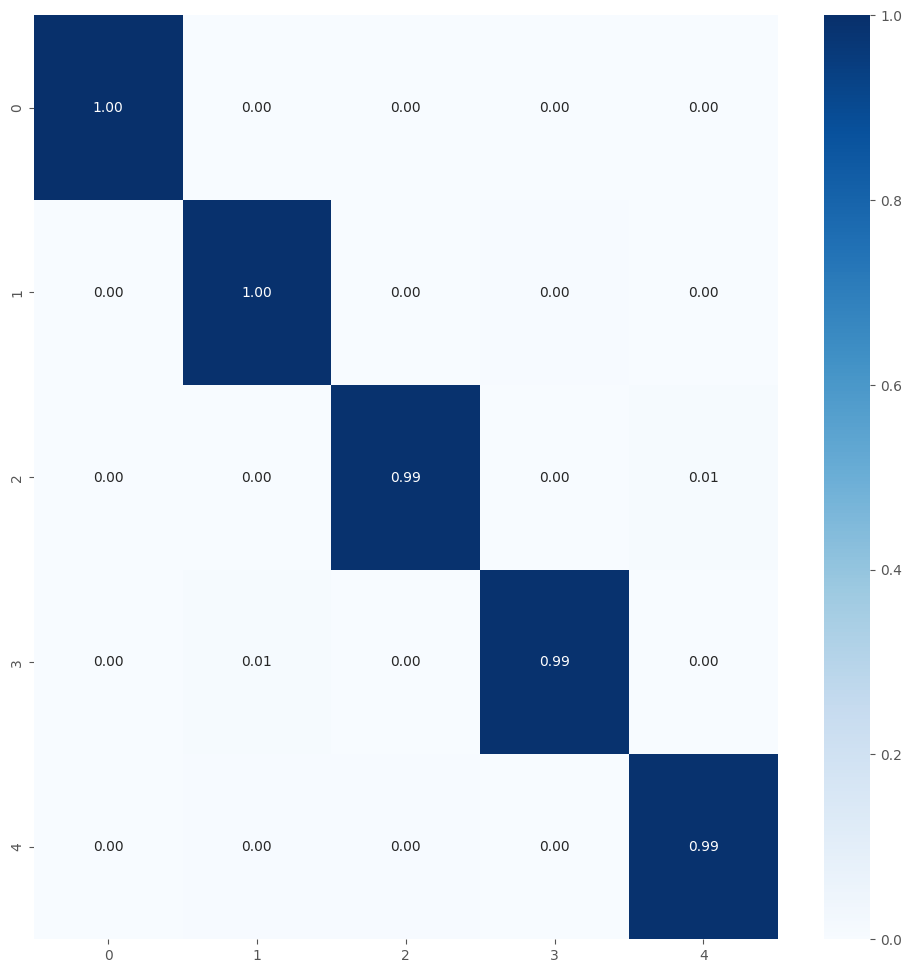


TRAINING AND EVALUATING FOLD 5/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15005_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
164/164 [==============================] - 35s 161ms/step - loss: 0.1197 - accuracy: 0.9998 - val_loss: 0.1394 - val_accuracy: 0.9946 - lr: 3.7699e-05
Epoch 2/50
164/164 [==============================] - 23s 142ms/step - loss: 0.1022 - accuracy: 1.0000 - val_loss: 0.1258 - val_accuracy: 0.9946 - lr: 3.7699e-05
Epoch 3/50
164/164 [==============================] - 23s 139ms/step - loss: 0.0895 - accuracy: 1.0000 - val_loss: 0.1098 - val_accuracy: 0.9955 - lr: 3.7699e-05
Epoch 4/50
164/164 [==============================] - 24s 149ms/step - loss: 0.0828 - accuracy: 0.9994 - val_loss: 0.1086 - val_accuracy: 0.9946 - lr: 3.7699e-05
Epoch 5/50
164/164 [==============================] - 25s 149ms/step - loss: 0.0779 - accuracy: 0.9990 - val_loss: 0.1046 - v

History for fold 5 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15005_5.pkl
165/165 [==============================] - 17s 102ms/step - loss: 0.0833 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.08328670263290405
36/36 [==============================] - 5s 124ms/step - loss: 0.1110 - accuracy: 0.9947
Validation Accuracy: 0.9946666955947876
Validation Log Loss: 0.11099070310592651
36/36 [==============================] - 5s 120ms/step - loss: 0.1170 - accuracy: 0.9938
Test Accuracy: 0.9937777519226074
Test Log Loss: 0.11697131395339966
Test labels: {'Allaple.A': 0, 'Ramnit': 1, 'sfone': 2, 'sillyp2p': 3, 'wabot': 4}

Matriz de Confusión:
[[225   0   0   0   0]
 [  0 223   1   1   0]
 [  0   0 224   0   1]
 [  0   2   0 223   0]
 [  0   1   1   0 223]]
True labels: 1125
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       0.99     

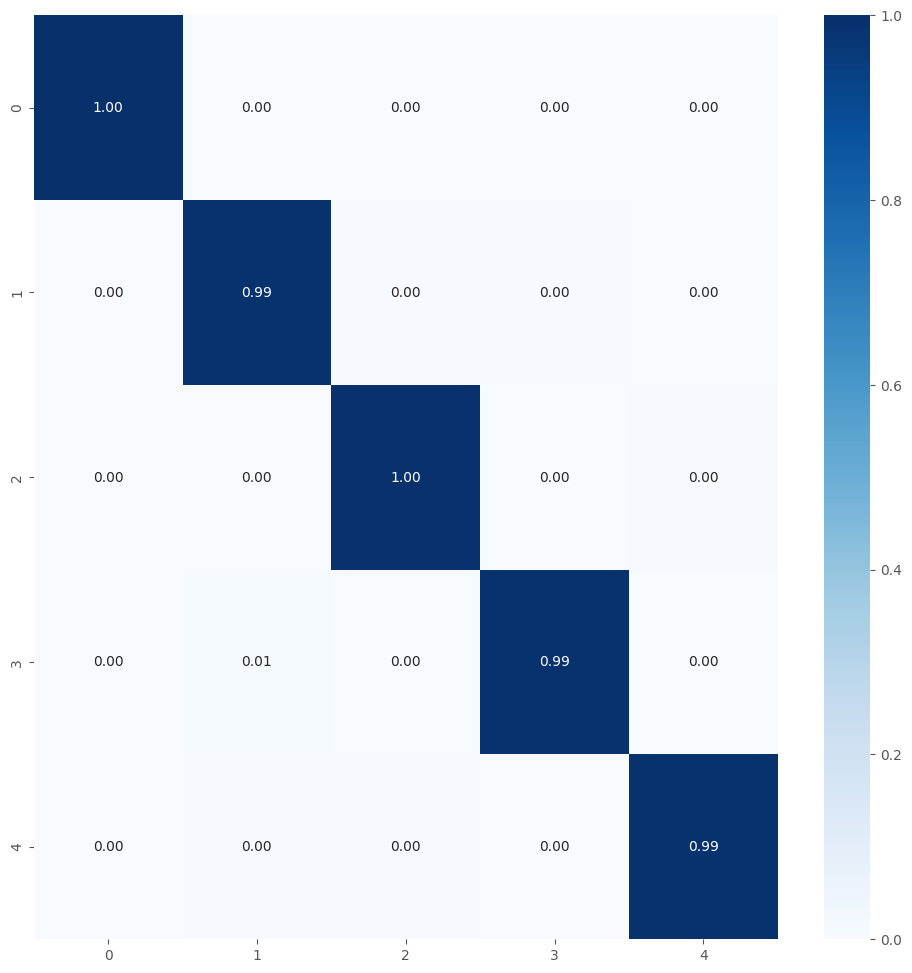


Best fold was 2 with val_accuracy: 0.9964
Average training accuracy in 5-fold: 1.0
Average validation precision in 5-fold: 0.995892858505249

Test Metrics
test_acc_list: [0.9937777519226074, 0.9946666955947876, 0.9946666955947876, 0.9937777519226074, 0.9937777519226074]
Average Test Accuracy with 5-fold: 0.9941333293914795
test_loss_list: [0.11386124789714813, 0.0896453782916069, 0.10499538481235504, 0.10344135016202927, 0.11697131395339966]
Average Test Log Loss with 5-fold: 0.1057829350233078

Precision List: [0.9937933361303406, 0.9946822250192294, 0.9946822250192294, 0.9937933361303406, 0.9937895069532239]
Average Precision List with 5-fold: 0.9941481258504729
Recall List: [0.9937777777777779, 0.9946666666666667, 0.9946666666666667, 0.9937777777777779, 0.9937777777777776]
Average Recall List with 5-fold: 0.9941333333333334
F1 Score List: [0.9937797049271516, 0.9946685938160404, 0.9946685938160404, 0.9937797049271516, 0.9937797223689995]
Average F1 Score List with 5-fold: 0.9941352

In [24]:
%%time

num_classes = 5
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, precision_list_all, 
    recall_list_all, f1_score_list_all)

In [20]:
test_acc_list_all = [1.0, 1.0, 0.9975555419921875, 0.9941333293914795]
test_loss_list_all = [0.09954872727394104, 0.01098769661039114, 0.02537739872932434, 0.1057829350233078]
precision_list_all = [1.0, 1.0, 0.9975721933007347, 0.9941481258504729]
recall_list_all = [1.0, 1.0, 0.9975555555555555, 0.9941333333333334]
f1_score_list_all = [1.0, 1.0, 0.9975555171460664, 0.9941352639710768]

[I 2025-06-15 00:17:52,195] A new study created in memory with name: malware_classification_6classes


Familias de malware copiadas
source2: /notebooks/train3/all_malware/6
name_save_model: MobileNet_tf_15006
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
- Allaple.A
- Ramnit
- wabot
- mira
model_path: /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15006_best.h5

Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15006_best.h5


2025-06-15 00:17:52.675026: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 1197 MB memory:  -> device: 0, name: NVIDIA RTX A5500, pci bus id: 0000:1d:00.0, compute capability: 8.6


Successfully loaded and modified pretrained model
Found 6300 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.


2025-06-15 00:18:04.331365: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8906
2025-06-15 00:18:12.055666: I external/local_xla/xla/service/service.cc:168] XLA service 0x7fe5333d62b0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-06-15 00:18:12.056011: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA RTX A5500, Compute Capability 8.6
2025-06-15 00:18:12.092950: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1749946692.360029     285 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
[I 2025-06-15 00:39:43,145] Trial 0 finished with values: [0.996279776096344, 0.027183396741747856] and parameters: {'learning_rate': 0.00010020305204988932, 'dropout_rate1': 0.3057192863587822, 'dropout


Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15006_best.h5
Successfully loaded and modified pretrained model
Found 6300 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.


[I 2025-06-15 00:48:43,870] Trial 1 finished with values: [0.996279776096344, 0.047432687133550644] and parameters: {'learning_rate': 0.005245141172164504, 'dropout_rate1': 0.35361903587268473, 'dropout_rate2': 0.24975144201319466, 'l2_reg': 4.575771609093692e-05, 'units_dense1': 256, 'units_dense2': 256, 'num_dense_layers': 3, 'unfreeze_layers': 13, 'early_stopping_patience': 10, 'reduce_lr_patience': 13, 'fine_tune_learning_rate': 5.1495185165758005e-06, 'units_dense3': 32, 'dropout_rate3': 0.18777054923242537}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15006_best.h5
Successfully loaded and modified pretrained model
Found 6300 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.


[I 2025-06-15 01:02:46,853] Trial 2 finished with values: [0.996279776096344, 0.046679917722940445] and parameters: {'learning_rate': 1.2655935007266378e-05, 'dropout_rate1': 0.5073431390098161, 'dropout_rate2': 0.3009567992757848, 'l2_reg': 0.0001161114818104589, 'units_dense1': 1024, 'units_dense2': 64, 'num_dense_layers': 2, 'unfreeze_layers': 6, 'early_stopping_patience': 18, 'reduce_lr_patience': 11, 'fine_tune_learning_rate': 2.3244666081581478e-06}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15006_best.h5
Successfully loaded and modified pretrained model
Found 6300 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.


[I 2025-06-15 01:25:46,578] Trial 3 finished with values: [0.996279776096344, 0.027104387059807777] and parameters: {'learning_rate': 0.00031763392024365634, 'dropout_rate1': 0.23079152626069532, 'dropout_rate2': 0.293200239705496, 'l2_reg': 0.001444013715158403, 'units_dense1': 256, 'units_dense2': 64, 'num_dense_layers': 2, 'unfreeze_layers': 12, 'early_stopping_patience': 18, 'reduce_lr_patience': 9, 'fine_tune_learning_rate': 5.85956784146598e-05}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15006_best.h5
Successfully loaded and modified pretrained model
Found 6300 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.


[I 2025-06-15 01:53:30,437] Trial 4 finished with values: [0.9955357313156128, 0.02543996088206768] and parameters: {'learning_rate': 0.00900469885242685, 'dropout_rate1': 0.5440907080232054, 'dropout_rate2': 0.4579999242860818, 'l2_reg': 0.0002572027749532354, 'units_dense1': 256, 'units_dense2': 256, 'num_dense_layers': 2, 'unfreeze_layers': 11, 'early_stopping_patience': 10, 'reduce_lr_patience': 12, 'fine_tune_learning_rate': 8.635402896551445e-06}.
/tmp/ipykernel_22/3900254938.py:136: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


Mejores trials para cada objetivo:
  Trial 3:
    val_accuracy: 0.9963
    val_loss: 0.0271
    Parámetros: {'learning_rate': 0.00031763392024365634, 'dropout_rate1': 0.23079152626069532, 'dropout_rate2': 0.293200239705496, 'l2_reg': 0.001444013715158403, 'units_dense1': 256, 'units_dense2': 64, 'num_dense_layers': 2, 'unfreeze_layers': 12, 'early_stopping_patience': 18, 'reduce_lr_patience': 9, 'fine_tune_learning_rate': 5.85956784146598e-05}
  Trial 4:
    val_accuracy: 0.9955
    val_loss: 0.0254
    Parámetros: {'learning_rate': 0.00900469885242685, 'dropout_rate1': 0.5440907080232054, 'dropout_rate2': 0.4579999242860818, 'l2_reg': 0.0002572027749532354, 'units_dense1': 256, 'units_dense2': 256, 'num_dense_layers': 2, 'unfreeze_layers': 11, 'early_stopping_patience': 10, 'reduce_lr_patience': 12, 'fine_tune_learning_rate': 8.635402896551445e-06}


<Figure size 700x500 with 0 Axes>

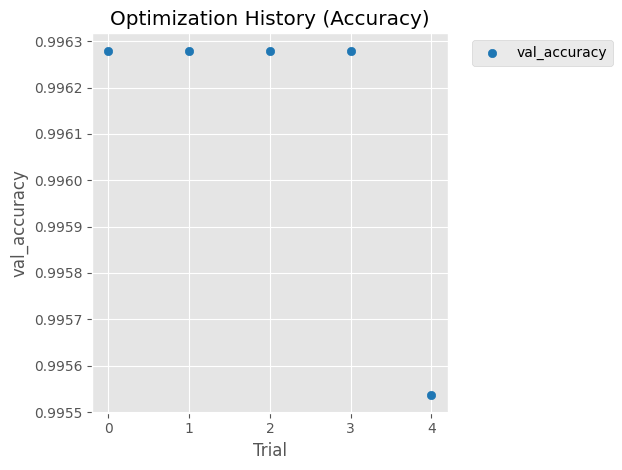

/tmp/ipykernel_22/3900254938.py:147: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

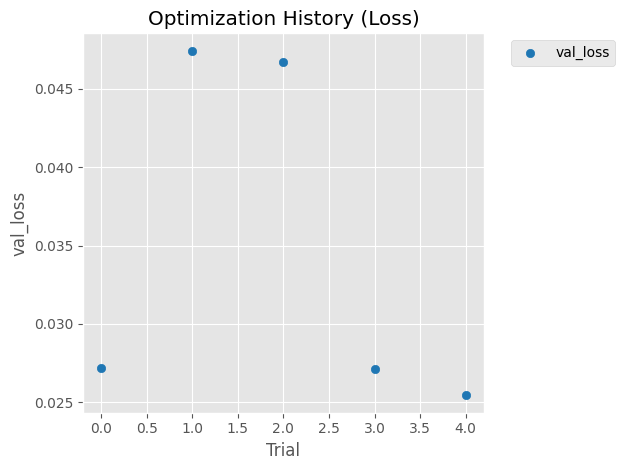

/tmp/ipykernel_22/3900254938.py:185: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Figure size 700x500 with 0 Axes>

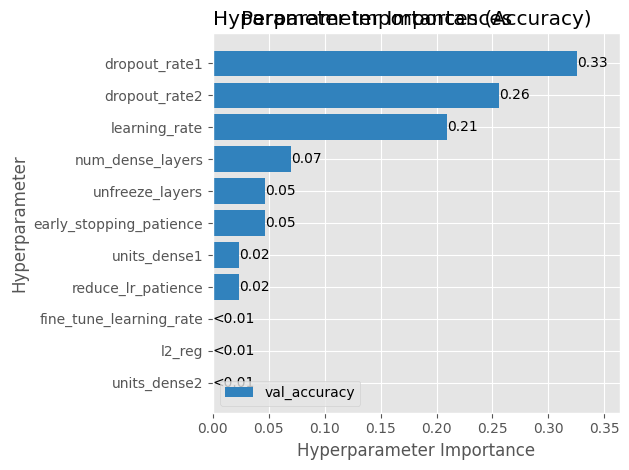

Found 6300 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.

TRAINING AND EVALUATING FOLD 1/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15006_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
196/196 [==============================] - 41s 167ms/step - loss: 0.0224 - accuracy: 0.9997 - val_loss: 0.0511 - val_accuracy: 0.9948 - lr: 3.1763e-05
Epoch 2/50
196/196 [==============================] - 32s 161ms/step - loss: 0.0186 - accuracy: 1.0000 - val_loss: 0.0463 - val_accuracy: 0.9948 - lr: 3.1763e-05
Epoch 3/50
196/196 [==============================] - 31s 155ms/step - loss: 0.0181 - accuracy: 0.9997 - val_loss: 0.0465 - val_accuracy: 0.9948 - lr: 3.1763e-05
Epoch 4/50
196/196 [==============================] - 32s 162ms/step - loss: 0.0160 - accuracy: 1.0000 - val_loss: 0.0475 - val_accuracy: 0.9948 - lr: 3.1763e-05

History for fold 1 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15006_1.pkl
197/197 [==============================] - 12s 60ms/step - loss: 0.0129 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.012932751327753067
43/43 [==============================] - 3s 73ms/step - loss: 0.0387 - accuracy: 0.9956
Validation Accuracy: 0.995555579662323
Validation Log Loss: 0.038690049201250076
43/43 [==============================] - 3s 64ms/step - loss: 0.0432 - accuracy: 0.9948
Test Accuracy: 0.9948148131370544
Test Log Loss: 0.04319734871387482
Test labels: {'Allaple.A': 0, 'Ramnit': 1, 'mira': 2, 'sfone': 3, 'sillyp2p': 4, 'wabot': 5}

Matriz de Confusión:
[[225   0   0   0   0   0]
 [  0 223   2   0   0   0]
 [  0   0 225   0   0   0]
 [  0   0   0 225   0   0]
 [  0   2   0   0 223   0]
 [  0   1   0   2   0 222]]
True labels: 1350
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00   

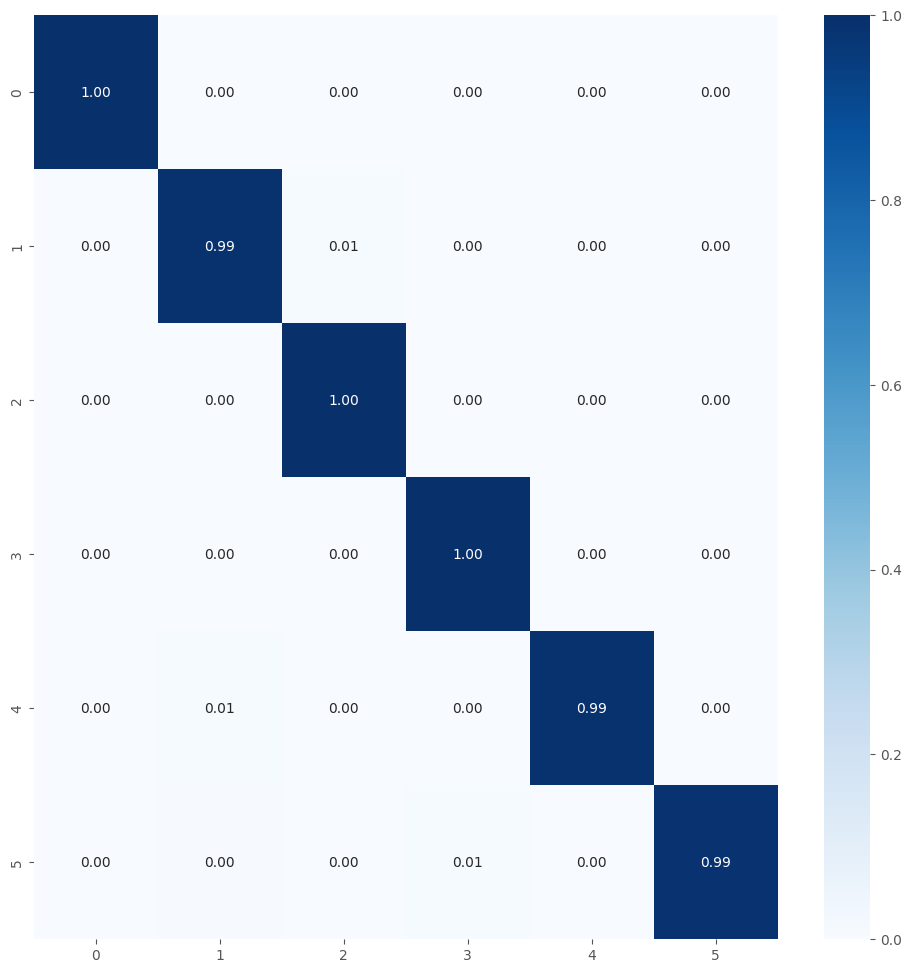


TRAINING AND EVALUATING FOLD 2/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15006_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
196/196 [==============================] - 20s 80ms/step - loss: 0.0218 - accuracy: 0.9994 - val_loss: 0.0554 - val_accuracy: 0.9926 - lr: 3.1763e-05
Epoch 2/50
196/196 [==============================] - 15s 76ms/step - loss: 0.0183 - accuracy: 1.0000 - val_loss: 0.0522 - val_accuracy: 0.9948 - lr: 3.1763e-05
Epoch 3/50
196/196 [==============================] - 15s 76ms/step - loss: 0.0169 - accuracy: 0.9998 - val_loss: 0.0476 - val_accuracy: 0.9955 - lr: 3.1763e-05
Epoch 4/50
196/196 [==============================] - 15s 78ms/step - loss: 0.0153 - accuracy: 1.0000 - val_loss: 0.0476 - val_accuracy: 0.9948 - lr: 3.1763e-05
Epoch 5/50
196/196 [==============================] - 15s 75ms/step - loss: 0.0141 - accuracy: 1.0000 - val_loss: 0.0422 - val_ac

History for fold 2 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15006_2.pkl
197/197 [==============================] - 12s 63ms/step - loss: 0.0071 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.007144255097955465
43/43 [==============================] - 3s 62ms/step - loss: 0.0242 - accuracy: 0.9970
Validation Accuracy: 0.9970370531082153
Validation Log Loss: 0.024225085973739624
43/43 [==============================] - 3s 62ms/step - loss: 0.0343 - accuracy: 0.9933
Test Accuracy: 0.9933333396911621
Test Log Loss: 0.034265533089637756
Test labels: {'Allaple.A': 0, 'Ramnit': 1, 'mira': 2, 'sfone': 3, 'sillyp2p': 4, 'wabot': 5}

Matriz de Confusión:
[[224   0   1   0   0   0]
 [  0 223   2   0   0   0]
 [  0   0 225   0   0   0]
 [  0   0   0 224   0   1]
 [  0   2   0   0 223   0]
 [  0   1   0   2   0 222]]
True labels: 1350
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00 

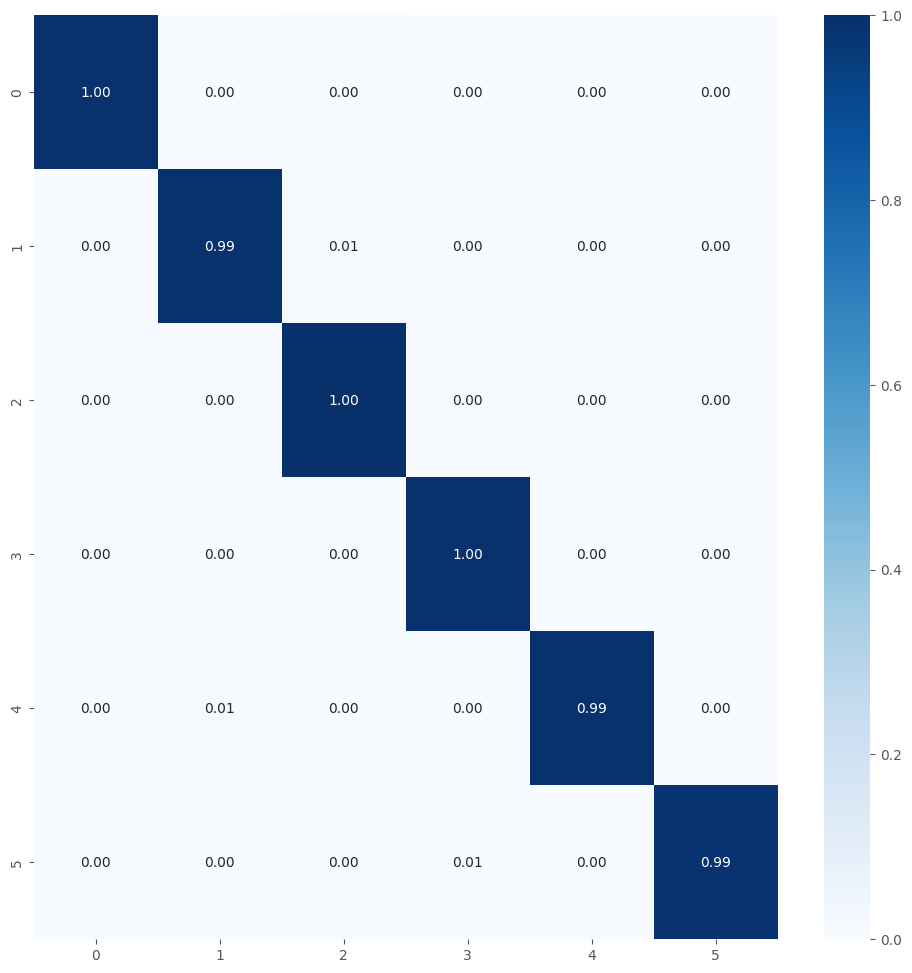


TRAINING AND EVALUATING FOLD 3/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15006_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
196/196 [==============================] - 21s 88ms/step - loss: 0.0212 - accuracy: 0.9998 - val_loss: 0.0491 - val_accuracy: 0.9955 - lr: 3.1763e-05
Epoch 2/50
196/196 [==============================] - 15s 76ms/step - loss: 0.0197 - accuracy: 0.9994 - val_loss: 0.0464 - val_accuracy: 0.9948 - lr: 3.1763e-05
Epoch 3/50
196/196 [==============================] - 15s 74ms/step - loss: 0.0177 - accuracy: 0.9998 - val_loss: 0.0500 - val_accuracy: 0.9926 - lr: 3.1763e-05
Epoch 4/50
196/196 [==============================] - 15s 77ms/step - loss: 0.0164 - accuracy: 0.9997 - val_loss: 0.0660 - val_accuracy: 0.9918 - lr: 3.1763e-05
Epoch 5/50
196/196 [==============================] - 15s 77ms/step - loss: 0.0153 - accuracy: 0.9998 - val_loss: 0.0473 - val_ac

History for fold 3 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15006_3.pkl
197/197 [==============================] - 12s 62ms/step - loss: 0.0184 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.018362542614340782
43/43 [==============================] - 3s 63ms/step - loss: 0.0490 - accuracy: 0.9956
Validation Accuracy: 0.995555579662323
Validation Log Loss: 0.049011293798685074
43/43 [==============================] - 3s 62ms/step - loss: 0.0549 - accuracy: 0.9933
Test Accuracy: 0.9933333396911621
Test Log Loss: 0.05485322326421738
Test labels: {'Allaple.A': 0, 'Ramnit': 1, 'mira': 2, 'sfone': 3, 'sillyp2p': 4, 'wabot': 5}

Matriz de Confusión:
[[225   0   0   0   0   0]
 [  0 223   2   0   0   0]
 [  0   0 225   0   0   0]
 [  0   0   0 224   0   1]
 [  0   2   0   0 223   0]
 [  0   1   0   3   0 221]]
True labels: 1350
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00   

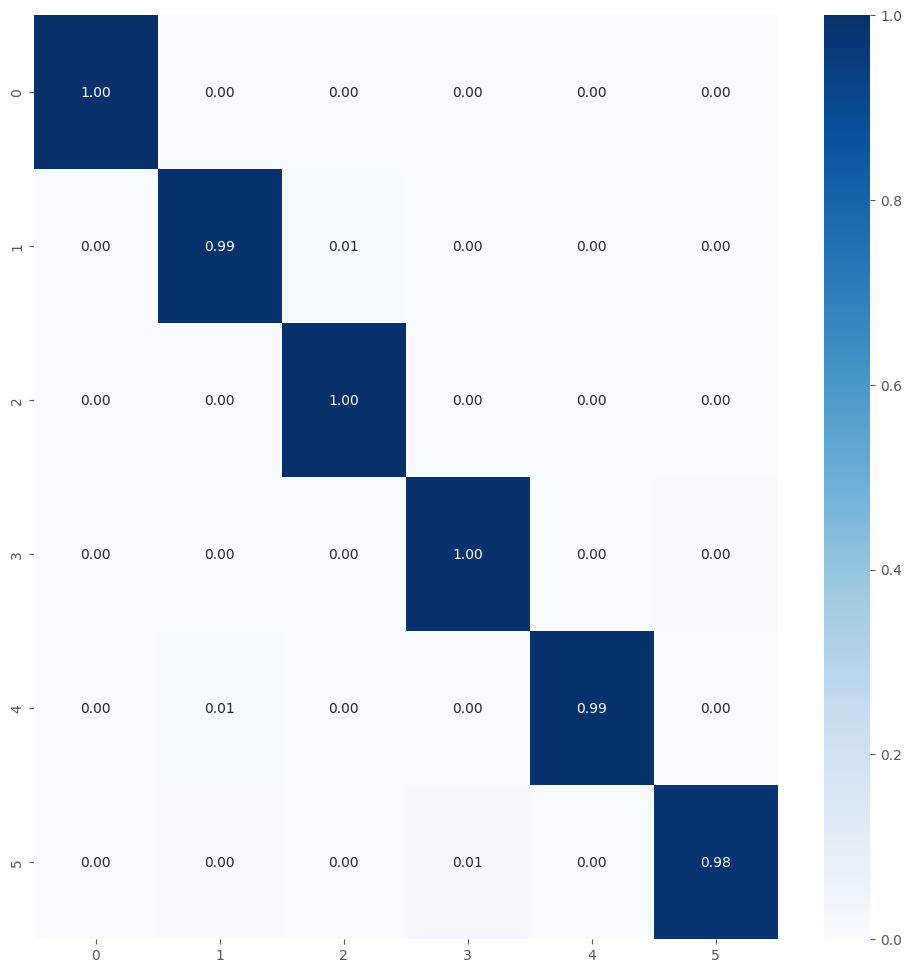


TRAINING AND EVALUATING FOLD 4/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15006_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
196/196 [==============================] - 20s 85ms/step - loss: 0.0217 - accuracy: 0.9994 - val_loss: 0.0473 - val_accuracy: 0.9955 - lr: 3.1763e-05
Epoch 2/50
196/196 [==============================] - 15s 77ms/step - loss: 0.0181 - accuracy: 1.0000 - val_loss: 0.0454 - val_accuracy: 0.9948 - lr: 3.1763e-05
Epoch 3/50
196/196 [==============================] - 15s 76ms/step - loss: 0.0165 - accuracy: 1.0000 - val_loss: 0.0460 - val_accuracy: 0.9948 - lr: 3.1763e-05
Epoch 4/50
196/196 [==============================] - 16s 80ms/step - loss: 0.0156 - accuracy: 0.9997 - val_loss: 0.0451 - val_accuracy: 0.9955 - lr: 3.1763e-05
Epoch 5/50
196/196 [==============================] - 15s 76ms/step - loss: 0.0146 - accuracy: 1.0000 - val_loss: 0.0457 - val_ac

History for fold 4 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15006_4.pkl
197/197 [==============================] - 12s 63ms/step - loss: 0.0062 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.006159295793622732
43/43 [==============================] - 3s 61ms/step - loss: 0.0336 - accuracy: 0.9963
Validation Accuracy: 0.9962962865829468
Validation Log Loss: 0.03360069915652275
43/43 [==============================] - 3s 61ms/step - loss: 0.0406 - accuracy: 0.9948
Test Accuracy: 0.9948148131370544
Test Log Loss: 0.040626272559165955
Test labels: {'Allaple.A': 0, 'Ramnit': 1, 'mira': 2, 'sfone': 3, 'sillyp2p': 4, 'wabot': 5}

Matriz de Confusión:
[[225   0   0   0   0   0]
 [  0 224   1   0   0   0]
 [  0   0 225   0   0   0]
 [  0   0   0 224   0   1]
 [  0   2   0   0 223   0]
 [  0   1   0   2   0 222]]
True labels: 1350
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00  

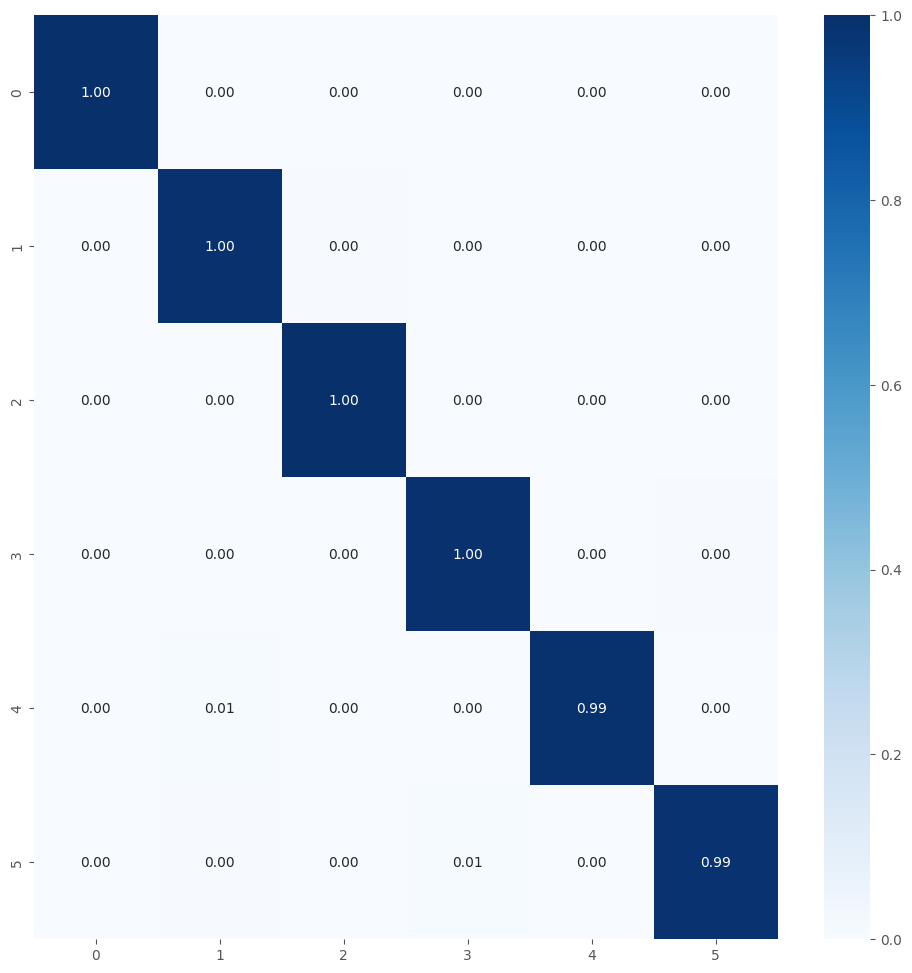


TRAINING AND EVALUATING FOLD 5/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15006_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
196/196 [==============================] - 19s 81ms/step - loss: 0.0235 - accuracy: 0.9992 - val_loss: 0.0465 - val_accuracy: 0.9955 - lr: 3.1763e-05
Epoch 2/50
196/196 [==============================] - 15s 75ms/step - loss: 0.0197 - accuracy: 0.9998 - val_loss: 0.0496 - val_accuracy: 0.9948 - lr: 3.1763e-05
Epoch 3/50
196/196 [==============================] - 15s 77ms/step - loss: 0.0183 - accuracy: 0.9998 - val_loss: 0.0482 - val_accuracy: 0.9955 - lr: 3.1763e-05
Epoch 4/50
196/196 [==============================] - 15s 75ms/step - loss: 0.0175 - accuracy: 0.9997 - val_loss: 0.0442 - val_accuracy: 0.9955 - lr: 3.1763e-05
Epoch 5/50
196/196 [==============================] - 15s 78ms/step - loss: 0.0179 - accuracy: 0.9995 - val_loss: 0.0472 - val_ac

History for fold 5 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15006_5.pkl
197/197 [==============================] - 32s 161ms/step - loss: 0.0195 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.019506322219967842
43/43 [==============================] - 6s 144ms/step - loss: 0.0464 - accuracy: 0.9956
Validation Accuracy: 0.995555579662323
Validation Log Loss: 0.04640400782227516
43/43 [==============================] - 7s 160ms/step - loss: 0.0505 - accuracy: 0.9956
Test Accuracy: 0.995555579662323
Test Log Loss: 0.050466421991586685
Test labels: {'Allaple.A': 0, 'Ramnit': 1, 'mira': 2, 'sfone': 3, 'sillyp2p': 4, 'wabot': 5}

Matriz de Confusión:
[[225   0   0   0   0   0]
 [  0 223   2   0   0   0]
 [  0   0 225   0   0   0]
 [  0   0   0 225   0   0]
 [  0   2   0   0 223   0]
 [  0   1   0   1   0 223]]
True labels: 1350
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00 

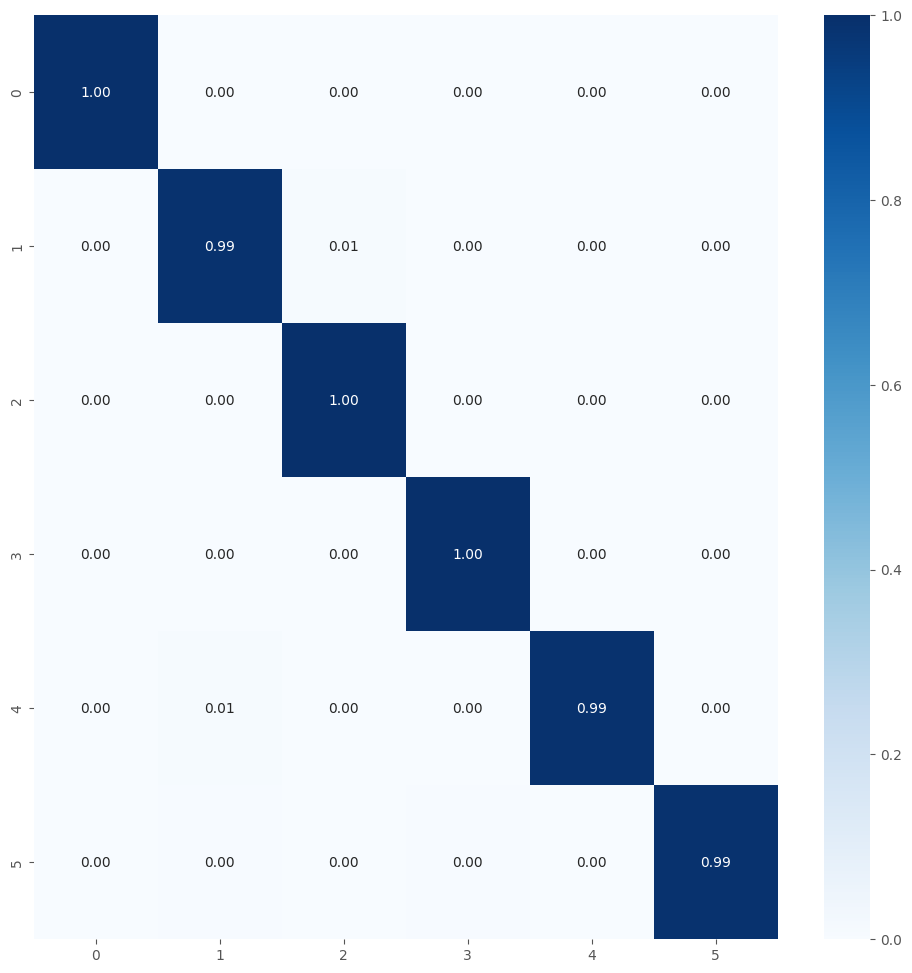


Best fold was 2 with val_accuracy: 0.9970
Average training accuracy in 5-fold: 1.0
Average validation precision in 5-fold: 0.9959821581840516

Test Metrics
test_acc_list: [0.9948148131370544, 0.9933333396911621, 0.9933333396911621, 0.9948148131370544, 0.995555579662323]
Average Test Accuracy with 5-fold: 0.9943703770637512
test_loss_list: [0.04319734871387482, 0.034265533089637756, 0.05485322326421738, 0.040626272559165955, 0.050466421991586685]
Average Test Log Loss with 5-fold: 0.04468175992369652

Precision List: [0.9948507530570607, 0.9933723177541854, 0.993365787915708, 0.994837583292207, 0.9955817187114212]
Average Precision List with 5-fold: 0.9944016321461164
Recall List: [0.9948148148148147, 0.9933333333333333, 0.9933333333333333, 0.9948148148148149, 0.9955555555555556]
Average Recall List with 5-fold: 0.9943703703703705
F1 Score List: [0.994814712144418, 0.9933365159344788, 0.9933315368624663, 0.994814734289022, 0.9955571467348393]
Average F1 Score List with 5-fold: 0.994370

In [21]:
%%time

num_classes = 6
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, precision_list_all, 
    recall_list_all, f1_score_list_all)

[I 2025-06-15 02:37:59,198] A new study created in memory with name: malware_classification_7classes


Familias de malware copiadas
source2: /notebooks/train3/all_malware/7
name_save_model: MobileNet_tf_15007
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
- Allaple.A
- Ramnit
- wabot
- mira
- Kelihos_ver3
model_path: /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15007_best.h5

Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15007_best.h5
Successfully loaded and modified pretrained model
Found 7350 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.


[I 2025-06-15 02:56:17,294] Trial 0 finished with values: [0.9942601919174194, 0.034836295992136] and parameters: {'learning_rate': 3.981567987956532e-05, 'dropout_rate1': 0.4512031064785427, 'dropout_rate2': 0.29489672978359993, 'l2_reg': 3.551757714686184e-05, 'units_dense1': 256, 'units_dense2': 256, 'num_dense_layers': 3, 'unfreeze_layers': 9, 'early_stopping_patience': 12, 'reduce_lr_patience': 12, 'fine_tune_learning_rate': 2.73692476730722e-05, 'units_dense3': 64, 'dropout_rate3': 0.1652294211292169}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15007_best.h5
Successfully loaded and modified pretrained model
Found 7350 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.


[I 2025-06-15 03:30:39,638] Trial 1 finished with values: [0.9942601919174194, 0.03834918141365051] and parameters: {'learning_rate': 8.024691313520931e-05, 'dropout_rate1': 0.46086667331214987, 'dropout_rate2': 0.4888732808478463, 'l2_reg': 0.00016804205699018346, 'units_dense1': 256, 'units_dense2': 128, 'num_dense_layers': 2, 'unfreeze_layers': 9, 'early_stopping_patience': 20, 'reduce_lr_patience': 15, 'fine_tune_learning_rate': 2.5009101045441897e-06}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15007_best.h5
Successfully loaded and modified pretrained model
Found 7350 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.


[I 2025-06-15 04:02:41,586] Trial 2 finished with values: [0.9948979616165161, 0.030131259933114052] and parameters: {'learning_rate': 3.431416539067328e-05, 'dropout_rate1': 0.5597706712900783, 'dropout_rate2': 0.2858856036533491, 'l2_reg': 1.5550018285135974e-05, 'units_dense1': 1024, 'units_dense2': 64, 'num_dense_layers': 2, 'unfreeze_layers': 12, 'early_stopping_patience': 18, 'reduce_lr_patience': 8, 'fine_tune_learning_rate': 1.6098380045296242e-05}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15007_best.h5
Successfully loaded and modified pretrained model
Found 7350 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.


[I 2025-06-15 04:22:32,055] Trial 3 finished with values: [0.9955357313156128, 0.03142004460096359] and parameters: {'learning_rate': 0.0003493625773919857, 'dropout_rate1': 0.2671365337305489, 'dropout_rate2': 0.22166694085492528, 'l2_reg': 1.8602672625716256e-05, 'units_dense1': 256, 'units_dense2': 256, 'num_dense_layers': 3, 'unfreeze_layers': 11, 'early_stopping_patience': 12, 'reduce_lr_patience': 12, 'fine_tune_learning_rate': 2.4173779442971514e-05, 'units_dense3': 32, 'dropout_rate3': 0.29264960405942675}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15007_best.h5
Successfully loaded and modified pretrained model
Found 7350 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.


[I 2025-06-15 04:53:34,917] Trial 4 finished with values: [0.9948979616165161, 0.03154216334223747] and parameters: {'learning_rate': 0.0037421428745996127, 'dropout_rate1': 0.48666769114824, 'dropout_rate2': 0.26399668610441296, 'l2_reg': 0.0004471845842833, 'units_dense1': 1024, 'units_dense2': 256, 'num_dense_layers': 2, 'unfreeze_layers': 12, 'early_stopping_patience': 17, 'reduce_lr_patience': 9, 'fine_tune_learning_rate': 1.0010476728887627e-05}.


Mejores trials para cada objetivo:
  Trial 2:
    val_accuracy: 0.9949
    val_loss: 0.0301
    Parámetros: {'learning_rate': 3.431416539067328e-05, 'dropout_rate1': 0.5597706712900783, 'dropout_rate2': 0.2858856036533491, 'l2_reg': 1.5550018285135974e-05, 'units_dense1': 1024, 'units_dense2': 64, 'num_dense_layers': 2, 'unfreeze_layers': 12, 'early_stopping_patience': 18, 'reduce_lr_patience': 8, 'fine_tune_learning_rate': 1.6098380045296242e-05}
  Trial 3:
    val_accuracy: 0.9955
    val_loss: 0.0314
    Parámetros: {'learning_rate': 0.0003493625773919857, 'dropout_rate1': 0.2671365337305489, 'dropout_rate2': 0.22166694085492528, 'l2_reg': 1.8602672625716256e-05, 'units_dense1': 256, 'units_dense2': 256, 'num_dense_layers': 3, 'unfreeze_layers': 11, 'early_stopping_patience': 12, 'reduce_lr_patience': 12, 'fine_tune_learning_rate': 2.4173779442971514e-05, 'units_dense3': 32, 'dropout_rate3': 0.29264960405942675}


/tmp/ipykernel_22/3900254938.py:136: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

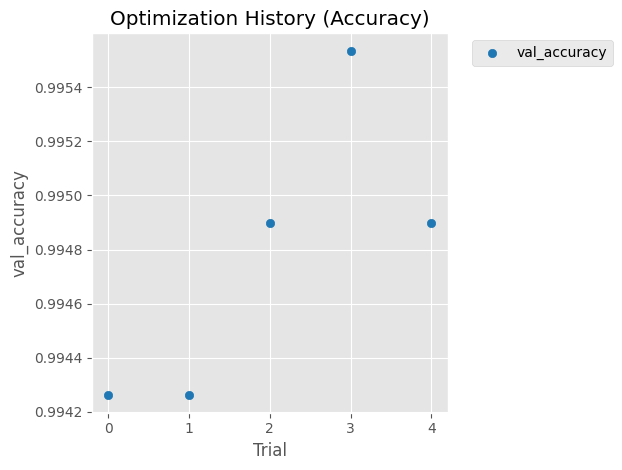

/tmp/ipykernel_22/3900254938.py:147: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

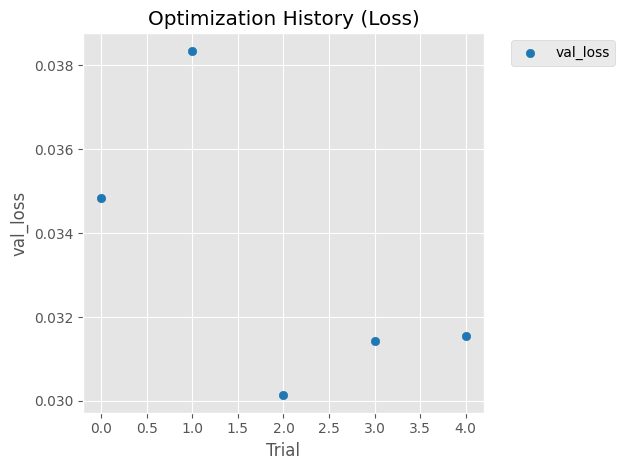

/tmp/ipykernel_22/3900254938.py:185: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Figure size 700x500 with 0 Axes>

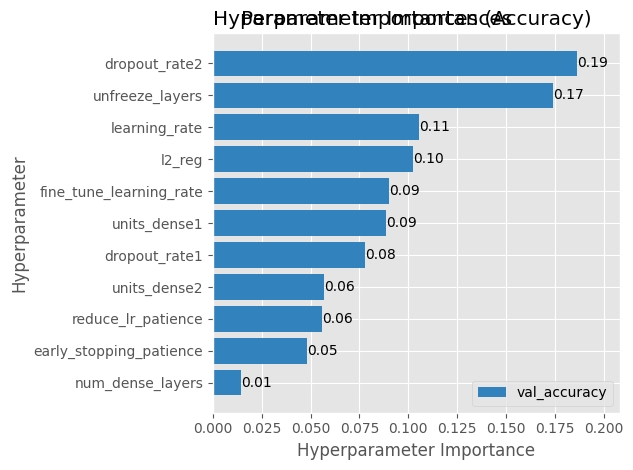

Found 7350 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.

TRAINING AND EVALUATING FOLD 1/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15007_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
229/229 [==============================] - 48s 171ms/step - loss: 0.0132 - accuracy: 1.0000 - val_loss: 0.0522 - val_accuracy: 0.9936 - lr: 3.4314e-06
Epoch 2/50
229/229 [==============================] - 35s 155ms/step - loss: 0.0128 - accuracy: 1.0000 - val_loss: 0.0509 - val_accuracy: 0.9936 - lr: 3.4314e-06
Epoch 3/50
229/229 [==============================] - 35s 151ms/step - loss: 0.0121 - accuracy: 1.0000 - val_loss: 0.0509 - val_accuracy: 0.9936 - lr: 3.4314e-06
Epoch 4/50
229/229 [==============================] - 34s 149ms/step - loss: 0.0118 - accuracy: 1.0000 - val_loss: 0.0505 - val_accuracy: 0.9936 - lr: 3.4314e-06

History for fold 1 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15007_1.pkl
230/230 [==============================] - 28s 120ms/step - loss: 0.0100 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.009990311227738857
50/50 [==============================] - 6s 123ms/step - loss: 0.0492 - accuracy: 0.9937
Validation Accuracy: 0.9936507940292358
Validation Log Loss: 0.049225062131881714
50/50 [==============================] - 6s 124ms/step - loss: 0.0482 - accuracy: 0.9956
Test Accuracy: 0.995555579662323
Test Log Loss: 0.0481502003967762
Test labels: {'Allaple.A': 0, 'Kelihos_ver3': 1, 'Ramnit': 2, 'mira': 3, 'sfone': 4, 'sillyp2p': 5, 'wabot': 6}

Matriz de Confusión:
[[225   0   0   0   0   0   0]
 [  0 224   0   0   0   0   1]
 [  0   0 225   0   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 224   0   1]
 [  0   0   2   0   0 223   0]
 [  0   0   1   0   2   0 222]]
True labels: 1575
Predicted labels: len(predicted_labels)

Classification report:
     

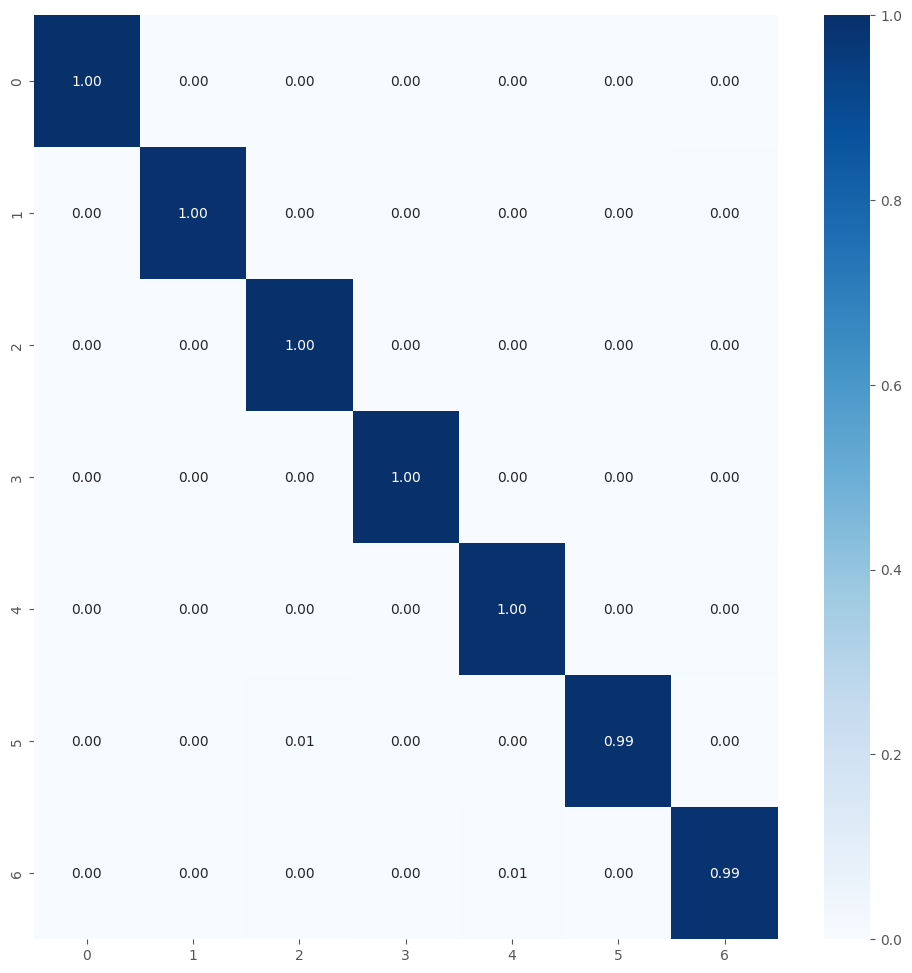


TRAINING AND EVALUATING FOLD 2/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15007_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
229/229 [==============================] - 51s 181ms/step - loss: 0.0132 - accuracy: 1.0000 - val_loss: 0.0506 - val_accuracy: 0.9936 - lr: 3.4314e-06
Epoch 2/50
229/229 [==============================] - 33s 142ms/step - loss: 0.0127 - accuracy: 0.9999 - val_loss: 0.0512 - val_accuracy: 0.9936 - lr: 3.4314e-06
Epoch 3/50
229/229 [==============================] - 38s 168ms/step - loss: 0.0121 - accuracy: 1.0000 - val_loss: 0.0510 - val_accuracy: 0.9936 - lr: 3.4314e-06
Epoch 4/50
229/229 [==============================] - 37s 163ms/step - loss: 0.0116 - accuracy: 1.0000 - val_loss: 0.0503 - val_accuracy: 0.9936 - lr: 3.4314e-06
Epoch 5/50
229/229 [==============================] - 39s 171ms/step - loss: 0.0113 - accuracy: 1.0000 - val_loss: 0.0500 - v

History for fold 2 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15007_2.pkl
230/230 [==============================] - 31s 135ms/step - loss: 0.0124 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.01235615462064743
50/50 [==============================] - 7s 140ms/step - loss: 0.0505 - accuracy: 0.9937
Validation Accuracy: 0.9936507940292358
Validation Log Loss: 0.050466492772102356
50/50 [==============================] - 7s 134ms/step - loss: 0.0518 - accuracy: 0.9956
Test Accuracy: 0.995555579662323
Test Log Loss: 0.051790751516819
Test labels: {'Allaple.A': 0, 'Kelihos_ver3': 1, 'Ramnit': 2, 'mira': 3, 'sfone': 4, 'sillyp2p': 5, 'wabot': 6}

Matriz de Confusión:
[[225   0   0   0   0   0   0]
 [  0 224   0   0   0   0   1]
 [  0   0 225   0   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 224   0   1]
 [  0   0   2   0   0 223   0]
 [  0   0   1   0   2   0 222]]
True labels: 1575
Predicted labels: len(predicted_labels)

Classification report:
       

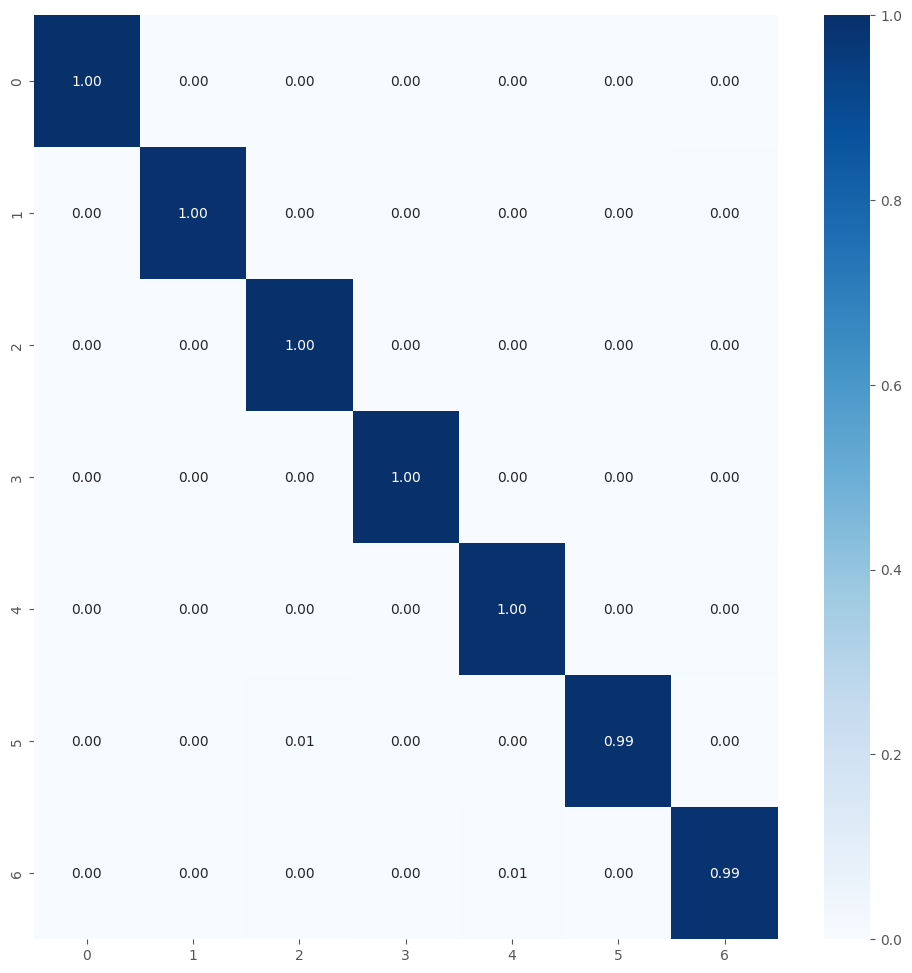


TRAINING AND EVALUATING FOLD 3/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15007_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
229/229 [==============================] - 51s 181ms/step - loss: 0.0132 - accuracy: 1.0000 - val_loss: 0.0524 - val_accuracy: 0.9936 - lr: 3.4314e-06
Epoch 2/50
229/229 [==============================] - 42s 183ms/step - loss: 0.0125 - accuracy: 1.0000 - val_loss: 0.0523 - val_accuracy: 0.9936 - lr: 3.4314e-06
Epoch 3/50
229/229 [==============================] - 37s 160ms/step - loss: 0.0120 - accuracy: 1.0000 - val_loss: 0.0523 - val_accuracy: 0.9936 - lr: 3.4314e-06
Epoch 4/50
229/229 [==============================] - 35s 152ms/step - loss: 0.0116 - accuracy: 1.0000 - val_loss: 0.0511 - val_accuracy: 0.9936 - lr: 3.4314e-06
Epoch 5/50
229/229 [==============================] - 36s 159ms/step - loss: 0.0112 - accuracy: 1.0000 - val_loss: 0.0507 - v

History for fold 3 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15007_3.pkl
230/230 [==============================] - 28s 122ms/step - loss: 0.0103 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.010277729481458664
50/50 [==============================] - 6s 121ms/step - loss: 0.0501 - accuracy: 0.9937
Validation Accuracy: 0.9936507940292358
Validation Log Loss: 0.05008897930383682
50/50 [==============================] - 6s 123ms/step - loss: 0.0489 - accuracy: 0.9956
Test Accuracy: 0.995555579662323
Test Log Loss: 0.04887101799249649
Test labels: {'Allaple.A': 0, 'Kelihos_ver3': 1, 'Ramnit': 2, 'mira': 3, 'sfone': 4, 'sillyp2p': 5, 'wabot': 6}

Matriz de Confusión:
[[225   0   0   0   0   0   0]
 [  0 224   0   0   0   0   1]
 [  0   0 225   0   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 224   0   1]
 [  0   0   2   0   0 223   0]
 [  0   0   1   0   2   0 222]]
True labels: 1575
Predicted labels: len(predicted_labels)

Classification report:
     

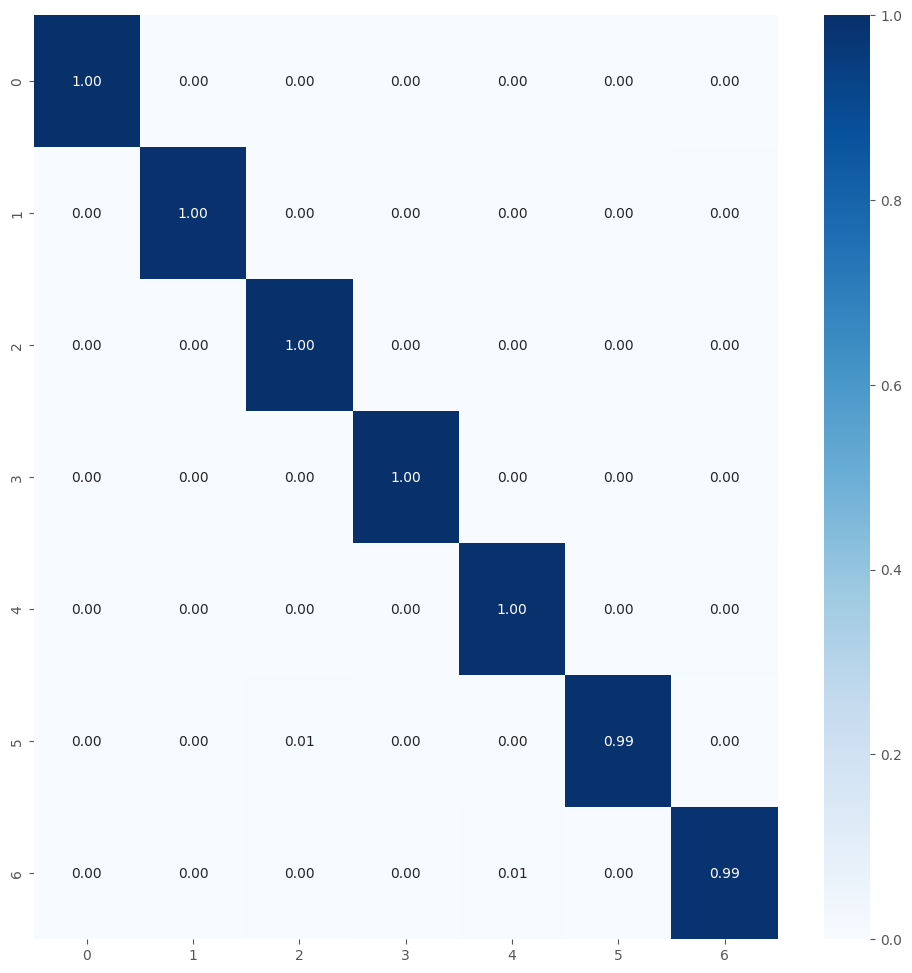


TRAINING AND EVALUATING FOLD 4/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15007_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
229/229 [==============================] - 46s 160ms/step - loss: 0.0131 - accuracy: 1.0000 - val_loss: 0.0521 - val_accuracy: 0.9936 - lr: 3.4314e-06
Epoch 2/50
229/229 [==============================] - 34s 149ms/step - loss: 0.0123 - accuracy: 1.0000 - val_loss: 0.0517 - val_accuracy: 0.9936 - lr: 3.4314e-06
Epoch 3/50
229/229 [==============================] - 35s 152ms/step - loss: 0.0118 - accuracy: 1.0000 - val_loss: 0.0512 - val_accuracy: 0.9936 - lr: 3.4314e-06
Epoch 4/50
229/229 [==============================] - 34s 148ms/step - loss: 0.0113 - accuracy: 1.0000 - val_loss: 0.0502 - val_accuracy: 0.9936 - lr: 3.4314e-06
Epoch 5/50
229/229 [==============================] - 34s 147ms/step - loss: 0.0108 - accuracy: 1.0000 - val_loss: 0.0502 - v

History for fold 4 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15007_4.pkl
230/230 [==============================] - 28s 121ms/step - loss: 0.0067 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.0067398808896541595
50/50 [==============================] - 7s 125ms/step - loss: 0.0455 - accuracy: 0.9937
Validation Accuracy: 0.9936507940292358
Validation Log Loss: 0.04548201337456703
50/50 [==============================] - 6s 124ms/step - loss: 0.0434 - accuracy: 0.9949
Test Accuracy: 0.9949206113815308
Test Log Loss: 0.04343583062291145
Test labels: {'Allaple.A': 0, 'Kelihos_ver3': 1, 'Ramnit': 2, 'mira': 3, 'sfone': 4, 'sillyp2p': 5, 'wabot': 6}

Matriz de Confusión:
[[225   0   0   0   0   0   0]
 [  0 224   0   0   0   0   1]
 [  0   0 225   0   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 224   0   1]
 [  0   0   2   0   0 223   0]
 [  0   0   1   0   3   0 221]]
True labels: 1575
Predicted labels: len(predicted_labels)

Classification report:
   

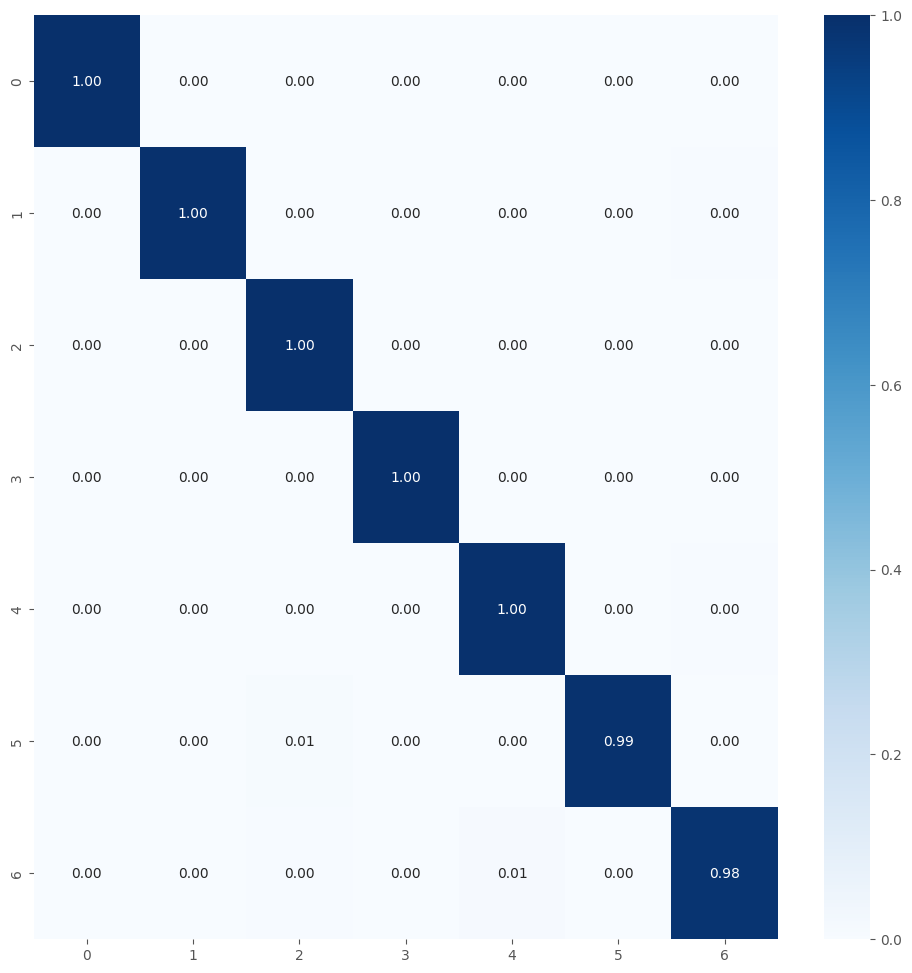


TRAINING AND EVALUATING FOLD 5/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15007_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
229/229 [==============================] - 50s 178ms/step - loss: 0.0132 - accuracy: 0.9999 - val_loss: 0.0518 - val_accuracy: 0.9936 - lr: 3.4314e-06
Epoch 2/50
229/229 [==============================] - 34s 148ms/step - loss: 0.0124 - accuracy: 1.0000 - val_loss: 0.0501 - val_accuracy: 0.9936 - lr: 3.4314e-06
Epoch 3/50
229/229 [==============================] - 35s 151ms/step - loss: 0.0119 - accuracy: 1.0000 - val_loss: 0.0495 - val_accuracy: 0.9936 - lr: 3.4314e-06
Epoch 4/50
229/229 [==============================] - 34s 150ms/step - loss: 0.0115 - accuracy: 1.0000 - val_loss: 0.0503 - val_accuracy: 0.9936 - lr: 3.4314e-06
Epoch 5/50
229/229 [==============================] - 35s 150ms/step - loss: 0.0112 - accuracy: 1.0000 - val_loss: 0.0498 - v

History for fold 5 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15007_5.pkl
230/230 [==============================] - 30s 128ms/step - loss: 0.0123 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.012271389365196228
50/50 [==============================] - 7s 132ms/step - loss: 0.0516 - accuracy: 0.9937
Validation Accuracy: 0.9936507940292358
Validation Log Loss: 0.05159012973308563
50/50 [==============================] - 6s 121ms/step - loss: 0.0519 - accuracy: 0.9956
Test Accuracy: 0.995555579662323
Test Log Loss: 0.05192157253623009
Test labels: {'Allaple.A': 0, 'Kelihos_ver3': 1, 'Ramnit': 2, 'mira': 3, 'sfone': 4, 'sillyp2p': 5, 'wabot': 6}

Matriz de Confusión:
[[225   0   0   0   0   0   0]
 [  0 224   0   0   0   0   1]
 [  0   0 224   1   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 224   0   1]
 [  0   0   2   0   0 223   0]
 [  0   0   1   0   1   0 223]]
True labels: 1575
Predicted labels: len(predicted_labels)

Classification report:
     

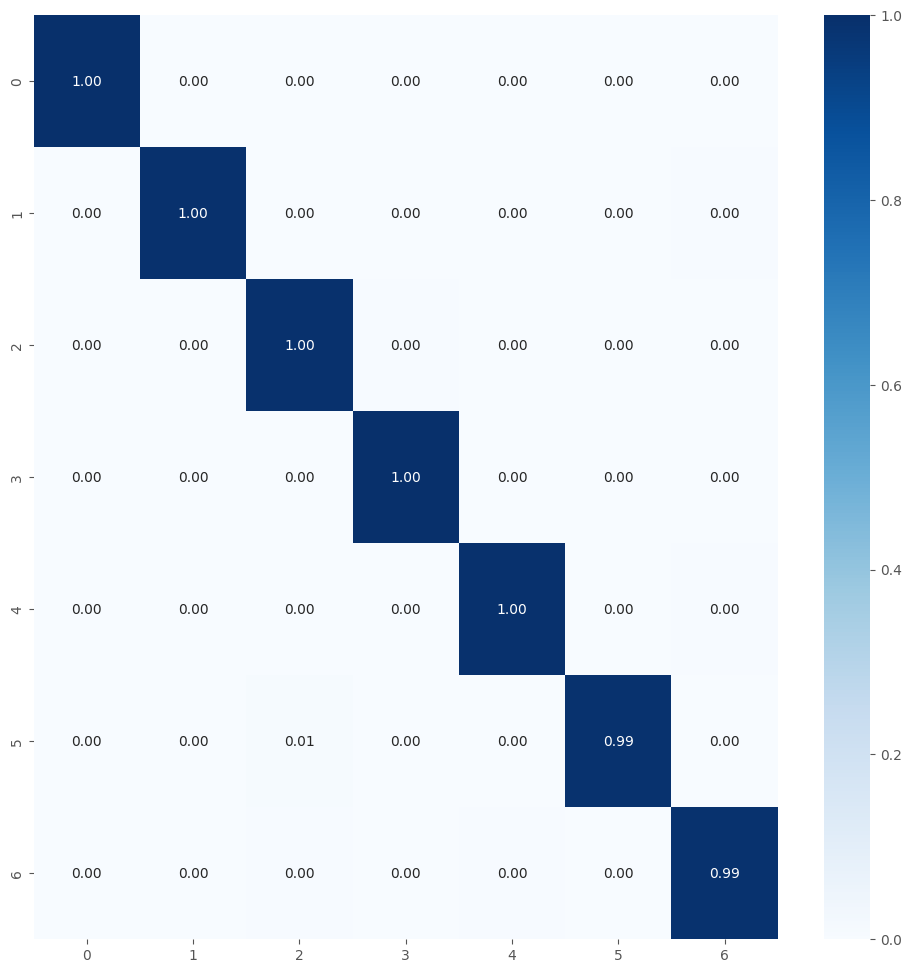


Best fold was 1 with val_accuracy: 0.9943
Average training accuracy in 5-fold: 1.0
Average validation precision in 5-fold: 0.9940050840377808

Test Metrics
test_acc_list: [0.995555579662323, 0.995555579662323, 0.995555579662323, 0.9949206113815308, 0.995555579662323]
Average Test Accuracy with 5-fold: 0.9954285860061646
test_loss_list: [0.0481502003967762, 0.051790751516819, 0.04887101799249649, 0.04343583062291145, 0.05192157253623009]
Average Test Log Loss with 5-fold: 0.04883387461304665

Precision List: [0.9955805680446376, 0.9955805680446376, 0.9955805680446376, 0.9949510909095499, 0.9955751469821097]
Average Precision List with 5-fold: 0.9954535884051146
Recall List: [0.9955555555555556, 0.9955555555555556, 0.9955555555555556, 0.994920634920635, 0.9955555555555556]
Average Recall List with 5-fold: 0.9954285714285716
F1 Score List: [0.9955568977250755, 0.9955568977250755, 0.9955568977250755, 0.9949205159388911, 0.9955583367196902]
Average F1 Score List with 5-fold: 0.995429909166

In [22]:
%%time

num_classes = 7
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, precision_list_all, 
    recall_list_all, f1_score_list_all)

[I 2025-06-15 06:22:04,549] A new study created in memory with name: malware_classification_8classes


Familias de malware copiadas
source2: /notebooks/train3/all_malware/8
name_save_model: MobileNet_tf_15008
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
- Allaple.A
- Ramnit
- wabot
- mira
- Kelihos_ver3
- ganelp
model_path: /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15008_best.h5

Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15008_best.h5
Successfully loaded and modified pretrained model
Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.


[I 2025-06-15 06:38:59,543] Trial 0 finished with values: [0.9949776530265808, 0.02739277482032776] and parameters: {'learning_rate': 0.00036597474407816316, 'dropout_rate1': 0.2714602167613602, 'dropout_rate2': 0.19824809548291614, 'l2_reg': 4.3559952543481044e-05, 'units_dense1': 1024, 'units_dense2': 64, 'num_dense_layers': 3, 'unfreeze_layers': 9, 'early_stopping_patience': 11, 'reduce_lr_patience': 12, 'fine_tune_learning_rate': 2.84810321306478e-05, 'units_dense3': 128, 'dropout_rate3': 0.3157377991953627}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15008_best.h5
Successfully loaded and modified pretrained model
Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.


[I 2025-06-15 07:09:56,513] Trial 1 finished with values: [0.9949776530265808, 0.026831017807126045] and parameters: {'learning_rate': 0.0014984240334796157, 'dropout_rate1': 0.3053551493491421, 'dropout_rate2': 0.4415142335203345, 'l2_reg': 0.003619378287517556, 'units_dense1': 256, 'units_dense2': 256, 'num_dense_layers': 2, 'unfreeze_layers': 10, 'early_stopping_patience': 18, 'reduce_lr_patience': 8, 'fine_tune_learning_rate': 6.092579723992374e-06}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15008_best.h5
Successfully loaded and modified pretrained model
Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.


[I 2025-06-15 07:28:16,609] Trial 2 finished with values: [0.9955357313156128, 0.030164776369929314] and parameters: {'learning_rate': 0.0001304055417551106, 'dropout_rate1': 0.39738370576176724, 'dropout_rate2': 0.16324885370162867, 'l2_reg': 7.21676006852926e-05, 'units_dense1': 1024, 'units_dense2': 256, 'num_dense_layers': 3, 'unfreeze_layers': 9, 'early_stopping_patience': 15, 'reduce_lr_patience': 11, 'fine_tune_learning_rate': 3.348317809757298e-05, 'units_dense3': 32, 'dropout_rate3': 0.1457252420441856}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15008_best.h5
Successfully loaded and modified pretrained model
Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.


[I 2025-06-15 08:01:10,891] Trial 3 finished with values: [0.9949776530265808, 0.02682843990623951] and parameters: {'learning_rate': 0.0001230196077759054, 'dropout_rate1': 0.5879870064802594, 'dropout_rate2': 0.2985170062348461, 'l2_reg': 0.00021100456746145487, 'units_dense1': 1024, 'units_dense2': 256, 'num_dense_layers': 2, 'unfreeze_layers': 8, 'early_stopping_patience': 17, 'reduce_lr_patience': 11, 'fine_tune_learning_rate': 5.162122306650838e-06}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15008_best.h5
Successfully loaded and modified pretrained model
Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.


[I 2025-06-15 08:26:58,738] Trial 4 finished with values: [0.9955357313156128, 0.031126249581575394] and parameters: {'learning_rate': 5.2391465993215824e-05, 'dropout_rate1': 0.3392416449831674, 'dropout_rate2': 0.20232192595242726, 'l2_reg': 1.4257134996641145e-05, 'units_dense1': 1024, 'units_dense2': 128, 'num_dense_layers': 2, 'unfreeze_layers': 14, 'early_stopping_patience': 15, 'reduce_lr_patience': 9, 'fine_tune_learning_rate': 5.291731047478184e-06}.


Mejores trials para cada objetivo:
  Trial 2:
    val_accuracy: 0.9955
    val_loss: 0.0302
    Parámetros: {'learning_rate': 0.0001304055417551106, 'dropout_rate1': 0.39738370576176724, 'dropout_rate2': 0.16324885370162867, 'l2_reg': 7.21676006852926e-05, 'units_dense1': 1024, 'units_dense2': 256, 'num_dense_layers': 3, 'unfreeze_layers': 9, 'early_stopping_patience': 15, 'reduce_lr_patience': 11, 'fine_tune_learning_rate': 3.348317809757298e-05, 'units_dense3': 32, 'dropout_rate3': 0.1457252420441856}
  Trial 3:
    val_accuracy: 0.9950
    val_loss: 0.0268
    Parámetros: {'learning_rate': 0.0001230196077759054, 'dropout_rate1': 0.5879870064802594, 'dropout_rate2': 0.2985170062348461, 'l2_reg': 0.00021100456746145487, 'units_dense1': 1024, 'units_dense2': 256, 'num_dense_layers': 2, 'unfreeze_layers': 8, 'early_stopping_patience': 17, 'reduce_lr_patience': 11, 'fine_tune_learning_rate': 5.162122306650838e-06}


/tmp/ipykernel_22/3900254938.py:136: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

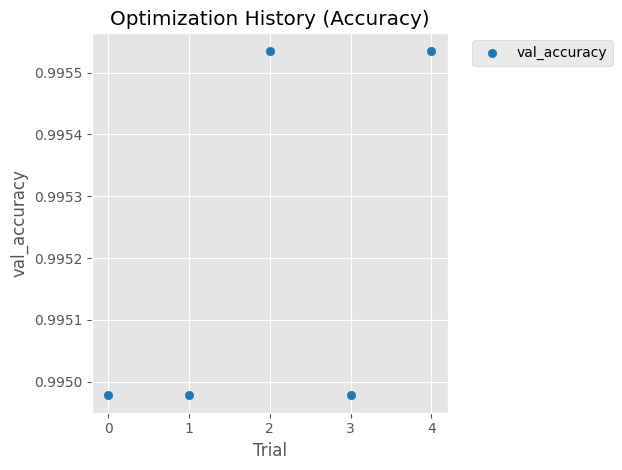

/tmp/ipykernel_22/3900254938.py:147: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

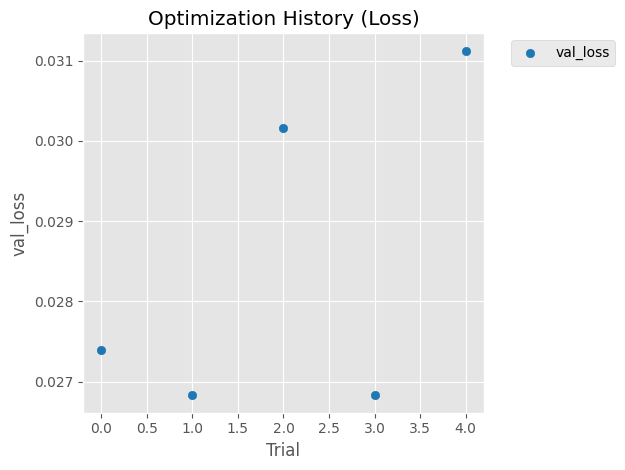

/tmp/ipykernel_22/3900254938.py:185: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Figure size 700x500 with 0 Axes>

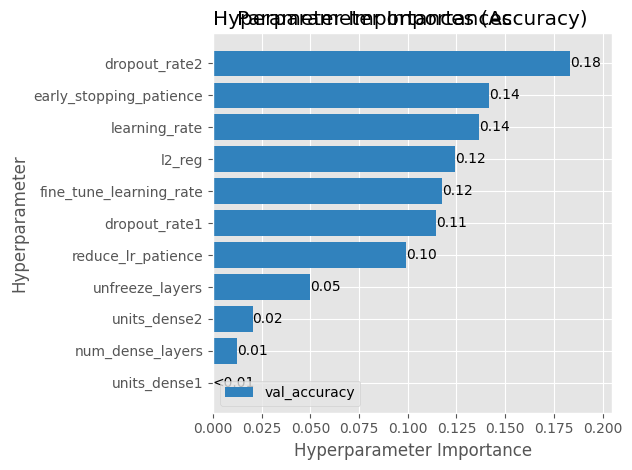

Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.

TRAINING AND EVALUATING FOLD 1/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15008_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
262/262 [==============================] - 24s 79ms/step - loss: 0.0103 - accuracy: 0.9999 - val_loss: 0.0408 - val_accuracy: 0.9950 - lr: 1.3041e-05
Epoch 2/50
262/262 [==============================] - 35s 134ms/step - loss: 0.0086 - accuracy: 1.0000 - val_loss: 0.0383 - val_accuracy: 0.9944 - lr: 1.3041e-05
Epoch 3/50
262/262 [==============================] - 40s 152ms/step - loss: 0.0077 - accuracy: 1.0000 - val_loss: 0.0378 - val_accuracy: 0.9944 - lr: 1.3041e-05
Epoch 4/50
262/262 [==============================] - 40s 152ms/step - loss: 0.0069 - accuracy: 1.0000 - val_loss: 0.0354 - val_accuracy: 0.9950 - lr: 1.3041e-05


History for fold 1 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15008_1.pkl
263/263 [==============================] - 32s 123ms/step - loss: 0.0088 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.008805183693766594
57/57 [==============================] - 7s 127ms/step - loss: 0.0406 - accuracy: 0.9950
Validation Accuracy: 0.9950000047683716
Validation Log Loss: 0.040638625621795654
57/57 [==============================] - 8s 134ms/step - loss: 0.0422 - accuracy: 0.9956
Test Accuracy: 0.995555579662323
Test Log Loss: 0.04217422381043434
Test labels: {'Allaple.A': 0, 'Kelihos_ver3': 1, 'Ramnit': 2, 'ganelp': 3, 'mira': 4, 'sfone': 5, 'sillyp2p': 6, 'wabot': 7}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0]
 [  0 224   0   0   0   0   0   1]
 [  0   0 224   0   1   0   0   0]
 [  0   0   0 225   0   0   0   0]
 [  0   0   0   0 225   0   0   0]
 [  0   0   0   0   0 225   0   0]
 [  0   0   2   0   0   0 223   0]
 [  0   0   1   0   0   3   0 221]]
True label

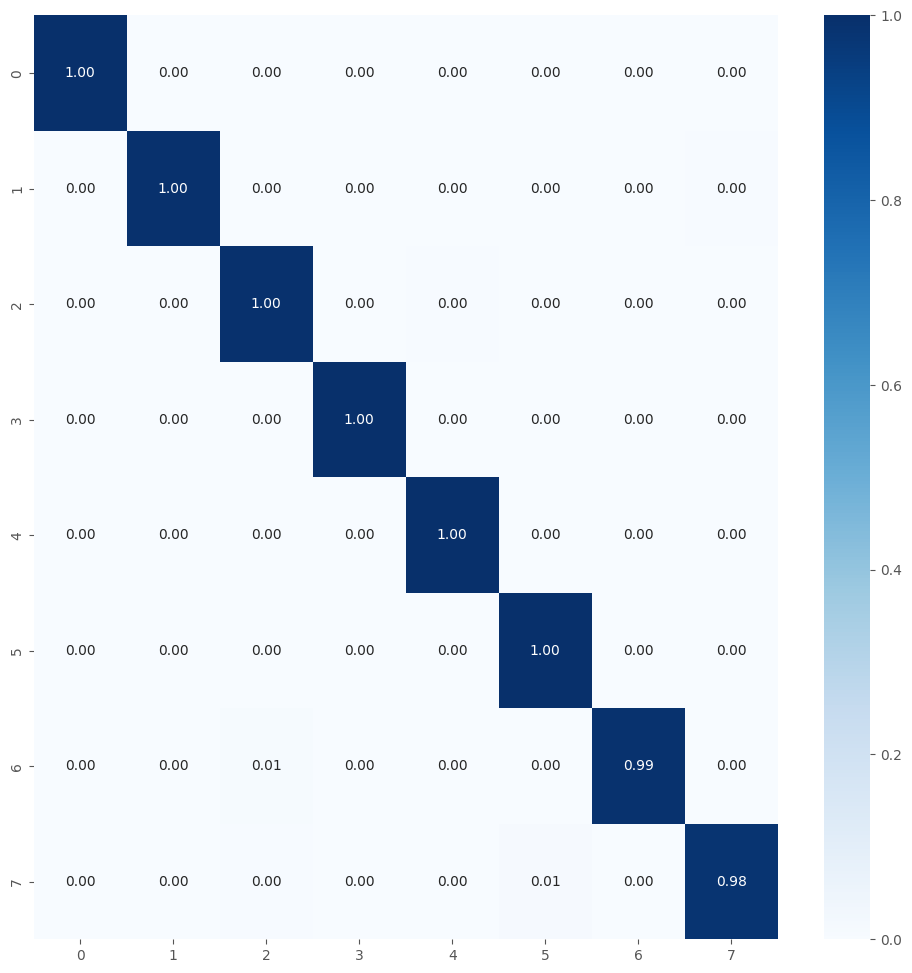


TRAINING AND EVALUATING FOLD 2/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15008_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
262/262 [==============================] - 52s 168ms/step - loss: 0.0099 - accuracy: 1.0000 - val_loss: 0.0399 - val_accuracy: 0.9944 - lr: 1.3041e-05
Epoch 2/50
262/262 [==============================] - 43s 165ms/step - loss: 0.0080 - accuracy: 1.0000 - val_loss: 0.0377 - val_accuracy: 0.9950 - lr: 1.3041e-05
Epoch 3/50
262/262 [==============================] - 42s 160ms/step - loss: 0.0068 - accuracy: 1.0000 - val_loss: 0.0378 - val_accuracy: 0.9944 - lr: 1.3041e-05
Epoch 4/50
262/262 [==============================] - 43s 162ms/step - loss: 0.0060 - accuracy: 1.0000 - val_loss: 0.0368 - val_accuracy: 0.9944 - lr: 1.3041e-05
Epoch 5/50
262/262 [==============================] - 36s 138ms/step - loss: 0.0054 - accuracy: 1.0000 - val_loss: 0.0368 - v

History for fold 2 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15008_2.pkl
263/263 [==============================] - 33s 125ms/step - loss: 0.0070 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.007035195827484131
57/57 [==============================] - 7s 122ms/step - loss: 0.0376 - accuracy: 0.9950
Validation Accuracy: 0.9950000047683716
Validation Log Loss: 0.03757141903042793
57/57 [==============================] - 8s 128ms/step - loss: 0.0390 - accuracy: 0.9961
Test Accuracy: 0.9961110949516296
Test Log Loss: 0.03898598626255989
Test labels: {'Allaple.A': 0, 'Kelihos_ver3': 1, 'Ramnit': 2, 'ganelp': 3, 'mira': 4, 'sfone': 5, 'sillyp2p': 6, 'wabot': 7}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0]
 [  0 224   0   0   0   0   0   1]
 [  0   0 224   0   1   0   0   0]
 [  0   0   0 225   0   0   0   0]
 [  0   0   0   0 225   0   0   0]
 [  0   0   0   0   0 225   0   0]
 [  0   0   2   0   0   0 223   0]
 [  0   0   1   0   0   2   0 222]]
True label

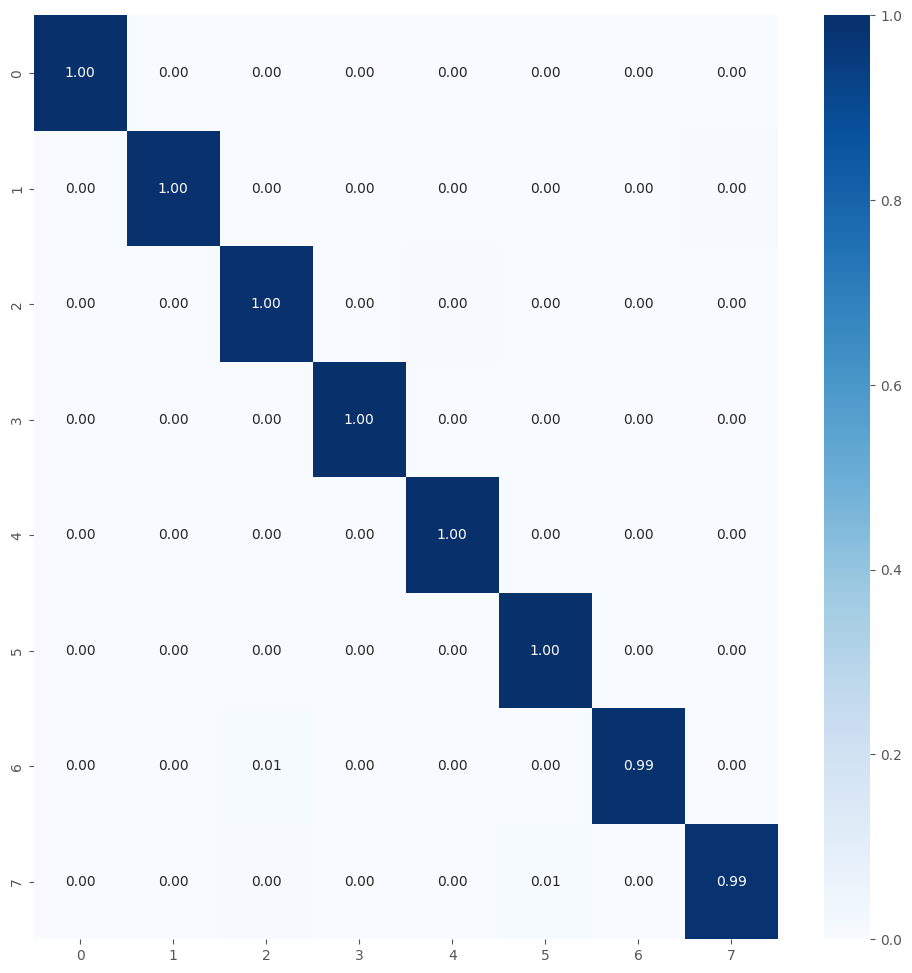


TRAINING AND EVALUATING FOLD 3/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15008_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
262/262 [==============================] - 52s 168ms/step - loss: 0.0101 - accuracy: 0.9999 - val_loss: 0.0404 - val_accuracy: 0.9950 - lr: 1.3041e-05
Epoch 2/50
262/262 [==============================] - 40s 154ms/step - loss: 0.0084 - accuracy: 1.0000 - val_loss: 0.0381 - val_accuracy: 0.9950 - lr: 1.3041e-05
Epoch 3/50
262/262 [==============================] - 40s 153ms/step - loss: 0.0073 - accuracy: 1.0000 - val_loss: 0.0366 - val_accuracy: 0.9950 - lr: 1.3041e-05
Epoch 4/50
262/262 [==============================] - 42s 159ms/step - loss: 0.0065 - accuracy: 1.0000 - val_loss: 0.0349 - val_accuracy: 0.9950 - lr: 1.3041e-05
Epoch 5/50
262/262 [==============================] - 41s 155ms/step - loss: 0.0057 - accuracy: 1.0000 - val_loss: 0.0339 - v

History for fold 3 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15008_3.pkl
263/263 [==============================] - 33s 125ms/step - loss: 0.0031 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.0031205592676997185
57/57 [==============================] - 7s 124ms/step - loss: 0.0324 - accuracy: 0.9956
Validation Accuracy: 0.995555579662323
Validation Log Loss: 0.0324341244995594
57/57 [==============================] - 7s 124ms/step - loss: 0.0348 - accuracy: 0.9961
Test Accuracy: 0.9961110949516296
Test Log Loss: 0.03477247431874275
Test labels: {'Allaple.A': 0, 'Kelihos_ver3': 1, 'Ramnit': 2, 'ganelp': 3, 'mira': 4, 'sfone': 5, 'sillyp2p': 6, 'wabot': 7}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0]
 [  0 224   0   0   0   0   0   1]
 [  0   0 224   0   1   0   0   0]
 [  0   0   0 225   0   0   0   0]
 [  0   0   0   0 225   0   0   0]
 [  0   0   0   0   0 225   0   0]
 [  0   0   2   0   0   0 223   0]
 [  0   0   1   0   0   2   0 222]]
True labels

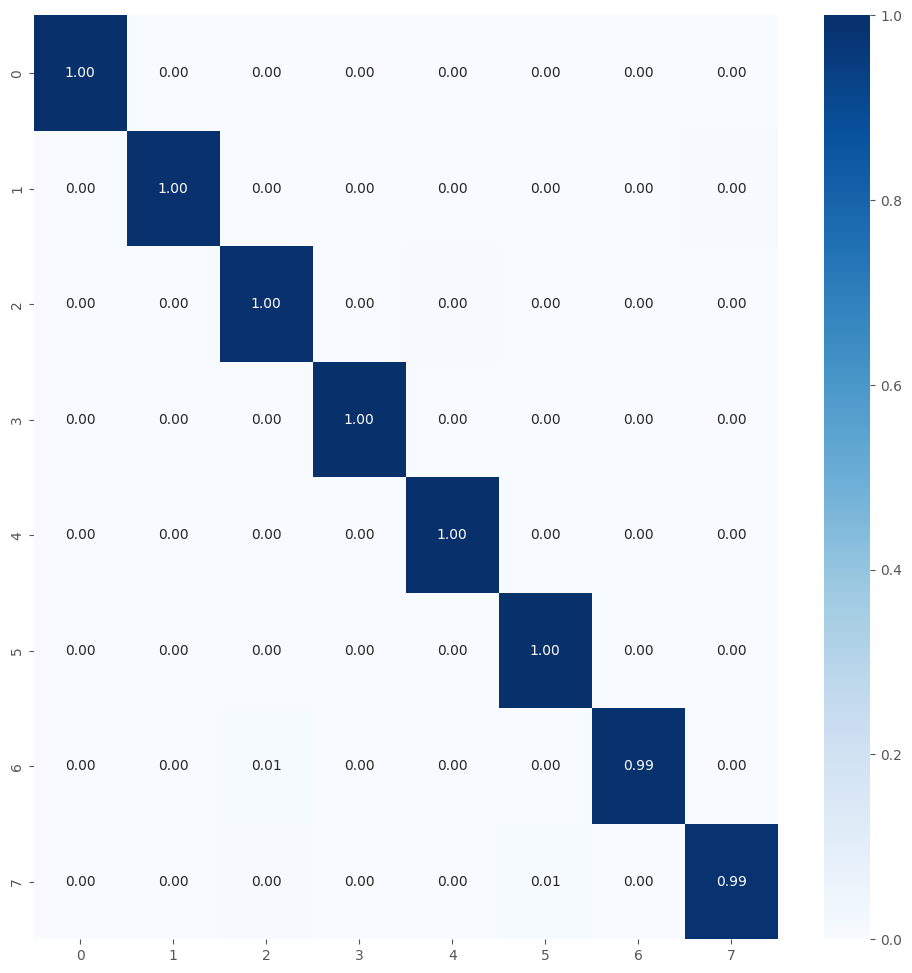


TRAINING AND EVALUATING FOLD 4/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15008_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
262/262 [==============================] - 49s 156ms/step - loss: 0.0099 - accuracy: 1.0000 - val_loss: 0.0409 - val_accuracy: 0.9950 - lr: 1.3041e-05
Epoch 2/50
262/262 [==============================] - 42s 160ms/step - loss: 0.0081 - accuracy: 1.0000 - val_loss: 0.0390 - val_accuracy: 0.9950 - lr: 1.3041e-05
Epoch 3/50
262/262 [==============================] - 39s 150ms/step - loss: 0.0069 - accuracy: 1.0000 - val_loss: 0.0379 - val_accuracy: 0.9944 - lr: 1.3041e-05
Epoch 4/50
262/262 [==============================] - 41s 154ms/step - loss: 0.0062 - accuracy: 0.9999 - val_loss: 0.0370 - val_accuracy: 0.9950 - lr: 1.3041e-05
Epoch 5/50
262/262 [==============================] - 41s 155ms/step - loss: 0.0055 - accuracy: 1.0000 - val_loss: 0.0356 - v

History for fold 4 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15008_4.pkl
263/263 [==============================] - 33s 124ms/step - loss: 0.0085 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.008450102992355824
57/57 [==============================] - 7s 126ms/step - loss: 0.0407 - accuracy: 0.9950
Validation Accuracy: 0.9950000047683716
Validation Log Loss: 0.040738269686698914
57/57 [==============================] - 8s 129ms/step - loss: 0.0413 - accuracy: 0.9956
Test Accuracy: 0.995555579662323
Test Log Loss: 0.041302651166915894
Test labels: {'Allaple.A': 0, 'Kelihos_ver3': 1, 'Ramnit': 2, 'ganelp': 3, 'mira': 4, 'sfone': 5, 'sillyp2p': 6, 'wabot': 7}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0]
 [  0 224   0   0   0   0   0   1]
 [  0   0 224   0   1   0   0   0]
 [  0   0   0 225   0   0   0   0]
 [  0   0   0   0 225   0   0   0]
 [  0   0   0   0   0 225   0   0]
 [  0   0   2   0   0   0 223   0]
 [  0   0   1   0   0   3   0 221]]
True labe

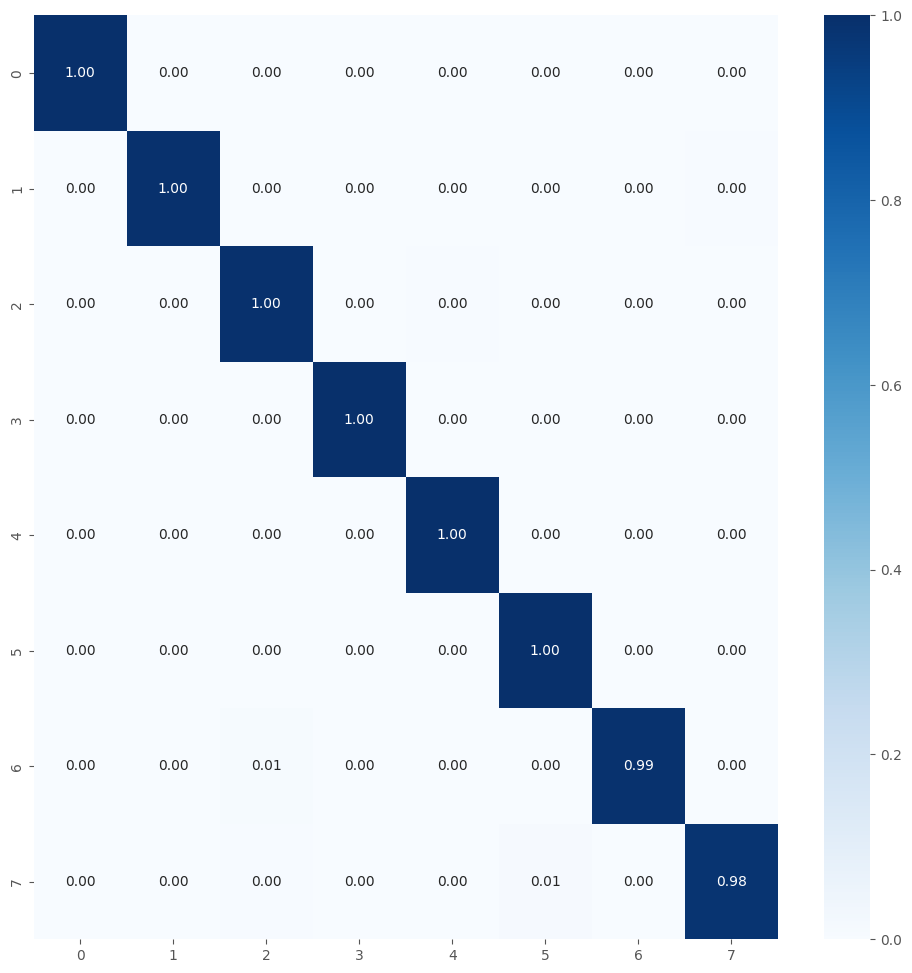


TRAINING AND EVALUATING FOLD 5/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15008_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
262/262 [==============================] - 51s 161ms/step - loss: 0.0096 - accuracy: 1.0000 - val_loss: 0.0394 - val_accuracy: 0.9950 - lr: 1.3041e-05
Epoch 2/50
262/262 [==============================] - 40s 153ms/step - loss: 0.0075 - accuracy: 1.0000 - val_loss: 0.0380 - val_accuracy: 0.9944 - lr: 1.3041e-05
Epoch 3/50
262/262 [==============================] - 44s 166ms/step - loss: 0.0064 - accuracy: 1.0000 - val_loss: 0.0349 - val_accuracy: 0.9944 - lr: 1.3041e-05
Epoch 4/50
262/262 [==============================] - 42s 160ms/step - loss: 0.0057 - accuracy: 1.0000 - val_loss: 0.0352 - val_accuracy: 0.9944 - lr: 1.3041e-05
Epoch 5/50
262/262 [==============================] - 42s 159ms/step - loss: 0.0051 - accuracy: 1.0000 - val_loss: 0.0349 - v

History for fold 5 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15008_5.pkl
263/263 [==============================] - 32s 121ms/step - loss: 0.0078 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.007832502946257591
57/57 [==============================] - 7s 117ms/step - loss: 0.0393 - accuracy: 0.9950
Validation Accuracy: 0.9950000047683716
Validation Log Loss: 0.0392865315079689
57/57 [==============================] - 7s 118ms/step - loss: 0.0400 - accuracy: 0.9956
Test Accuracy: 0.995555579662323
Test Log Loss: 0.039959631860256195
Test labels: {'Allaple.A': 0, 'Kelihos_ver3': 1, 'Ramnit': 2, 'ganelp': 3, 'mira': 4, 'sfone': 5, 'sillyp2p': 6, 'wabot': 7}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0]
 [  0 224   0   0   0   0   0   1]
 [  0   0 224   0   1   0   0   0]
 [  0   0   0 225   0   0   0   0]
 [  0   0   0   0 225   0   0   0]
 [  0   0   0   0   0 225   0   0]
 [  0   0   2   0   0   0 223   0]
 [  0   0   1   0   0   3   0 221]]
True labels

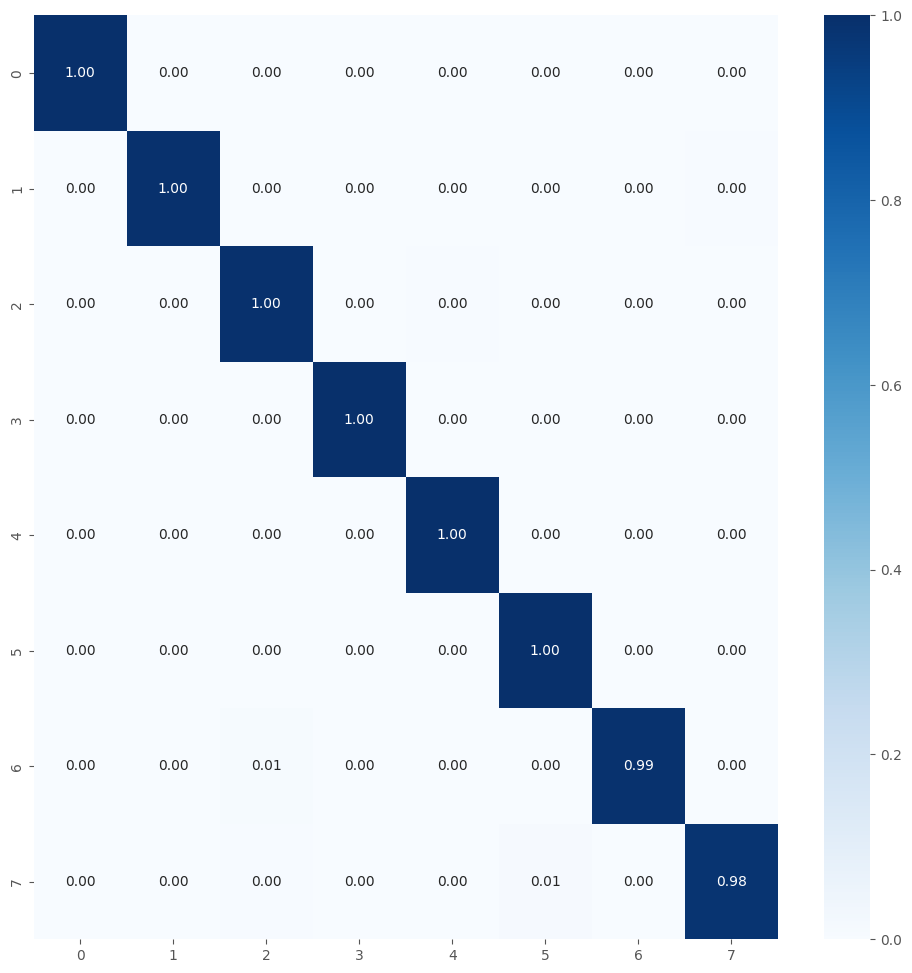


Best fold was 3 with val_accuracy: 0.9955
Average training accuracy in 5-fold: 1.0
Average validation precision in 5-fold: 0.9950892686843872

Test Metrics
test_acc_list: [0.995555579662323, 0.9961110949516296, 0.9961110949516296, 0.995555579662323, 0.995555579662323]
Average Test Accuracy with 5-fold: 0.9957777857780457
test_loss_list: [0.04217422381043434, 0.03898598626255989, 0.03477247431874275, 0.041302651166915894, 0.039959631860256195]
Average Test Log Loss with 5-fold: 0.03943899348378181

Precision List: [0.9955871203708444, 0.9961330605735177, 0.9961330605735177, 0.9955871203708444, 0.9955871203708444]
Average Precision List with 5-fold: 0.9958054964519137
Recall List: [0.9955555555555555, 0.9961111111111112, 0.9961111111111112, 0.9955555555555555, 0.9955555555555555]
Average Recall List with 5-fold: 0.9957777777777779
F1 Score List: [0.9955541864360313, 0.9961110425226913, 0.9961110425226913, 0.9955541864360313, 0.9955541864360313]
Average F1 Score List with 5-fold: 0.99577

In [23]:
%%time

num_classes = 8
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, precision_list_all, 
    recall_list_all, f1_score_list_all)

In [16]:
test_acc_list_all = [1.0, 1.0, 0.9975555419921875, 0.9941333293914795]
test_loss_list_all = [0.09954872727394104, 0.01098769661039114, 0.02537739872932434, 0.1057829350233078]
precision_list_all = [1.0, 1.0, 0.9975721933007347, 0.9941481258504729]
recall_list_all = [1.0, 1.0, 0.9975555555555555, 0.9941333333333334]
f1_score_list_all = [1.0, 1.0, 0.9975555171460664, 0.9941352639710768]

[I 2025-06-15 15:49:30,017] A new study created in memory with name: malware_classification_9classes


Familias de malware copiadas
source2: /notebooks/train3/all_malware/9
name_save_model: MobileNet_tf_15009
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
- Allaple.A
- Ramnit
- wabot
- mira
- Kelihos_ver3
- ganelp
- Allaple.L
model_path: /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15009_best.h5

Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15009_best.h5


2025-06-15 15:49:30.482385: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 1197 MB memory:  -> device: 0, name: NVIDIA RTX A5500, pci bus id: 0000:1d:00.0, compute capability: 8.6


Successfully loaded and modified pretrained model
Found 9450 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.


2025-06-15 15:49:40.951255: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8906
2025-06-15 15:49:45.844060: I external/local_xla/xla/service/service.cc:168] XLA service 0x7f51ebb861a0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-06-15 15:49:45.844139: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA RTX A5500, Compute Capability 8.6
2025-06-15 15:49:45.866749: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1750002586.176718     261 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
[I 2025-06-15 16:35:08,845] Trial 0 finished with values: [0.9960317611694336, 0.023061320185661316] and parameters: {'learning_rate': 7.850270502441868e-05, 'dropout_rate1': 0.3113221304238612, 'dropout


Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15009_best.h5
Successfully loaded and modified pretrained model
Found 9450 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.


[I 2025-06-15 17:17:51,605] Trial 1 finished with values: [0.9955357313156128, 0.028590373694896698] and parameters: {'learning_rate': 0.0020268129065553493, 'dropout_rate1': 0.48834331399159747, 'dropout_rate2': 0.4391212419903039, 'l2_reg': 0.00017225608018080985, 'units_dense1': 1024, 'units_dense2': 128, 'num_dense_layers': 2, 'unfreeze_layers': 6, 'early_stopping_patience': 15, 'reduce_lr_patience': 11, 'fine_tune_learning_rate': 1.1634259258610637e-06}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15009_best.h5
Successfully loaded and modified pretrained model
Found 9450 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.


[I 2025-06-15 18:00:32,775] Trial 2 finished with values: [0.9955357313156128, 0.023345379158854485] and parameters: {'learning_rate': 0.007888483415093486, 'dropout_rate1': 0.28875416406331617, 'dropout_rate2': 0.10775714009013254, 'l2_reg': 0.008486826471304297, 'units_dense1': 512, 'units_dense2': 64, 'num_dense_layers': 3, 'unfreeze_layers': 8, 'early_stopping_patience': 17, 'reduce_lr_patience': 9, 'fine_tune_learning_rate': 5.02081923191224e-06, 'units_dense3': 32, 'dropout_rate3': 0.2895068637066106}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15009_best.h5
Successfully loaded and modified pretrained model
Found 9450 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.


[I 2025-06-15 18:17:58,259] Trial 3 finished with values: [0.9955357313156128, 0.029312435537576675] and parameters: {'learning_rate': 0.0023770184376383035, 'dropout_rate1': 0.2835725266532992, 'dropout_rate2': 0.29360323870540994, 'l2_reg': 0.00041977901220840297, 'units_dense1': 512, 'units_dense2': 128, 'num_dense_layers': 3, 'unfreeze_layers': 8, 'early_stopping_patience': 16, 'reduce_lr_patience': 8, 'fine_tune_learning_rate': 7.5080299685718085e-06, 'units_dense3': 128, 'dropout_rate3': 0.16384088304030986}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15009_best.h5
Successfully loaded and modified pretrained model
Found 9450 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.


[I 2025-06-15 18:59:32,168] Trial 4 finished with values: [0.9955357313156128, 0.03516637906432152] and parameters: {'learning_rate': 3.538599086270147e-05, 'dropout_rate1': 0.3409986233292991, 'dropout_rate2': 0.11653944482394048, 'l2_reg': 0.0026198291741464674, 'units_dense1': 512, 'units_dense2': 64, 'num_dense_layers': 3, 'unfreeze_layers': 15, 'early_stopping_patience': 19, 'reduce_lr_patience': 11, 'fine_tune_learning_rate': 1.2223765879222535e-06, 'units_dense3': 64, 'dropout_rate3': 0.21799244705295043}.


Mejores trials para cada objetivo:
  Trial 0:
    val_accuracy: 0.9960
    val_loss: 0.0231
    Parámetros: {'learning_rate': 7.850270502441868e-05, 'dropout_rate1': 0.3113221304238612, 'dropout_rate2': 0.43622511209574655, 'l2_reg': 1.735364717202064e-05, 'units_dense1': 256, 'units_dense2': 64, 'num_dense_layers': 2, 'unfreeze_layers': 6, 'early_stopping_patience': 11, 'reduce_lr_patience': 8, 'fine_tune_learning_rate': 2.8469827706946445e-06}


/tmp/ipykernel_27/3900254938.py:136: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

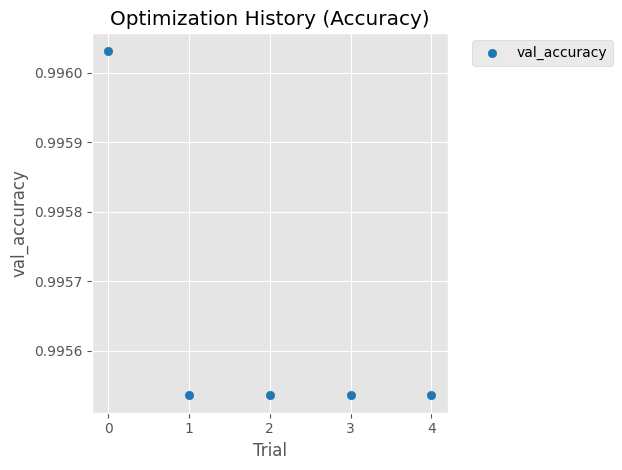

/tmp/ipykernel_27/3900254938.py:147: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

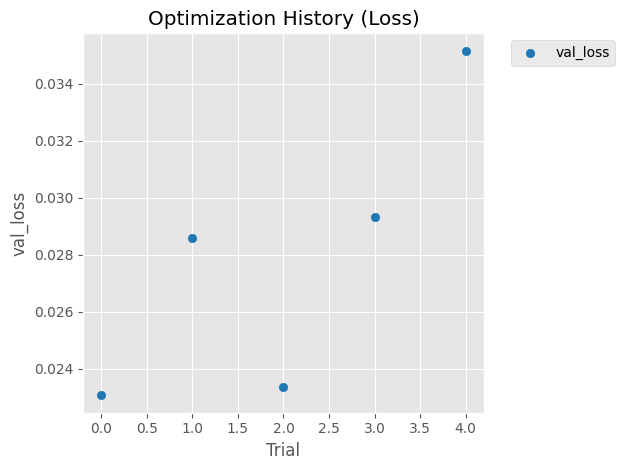

/tmp/ipykernel_27/3900254938.py:185: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Figure size 700x500 with 0 Axes>

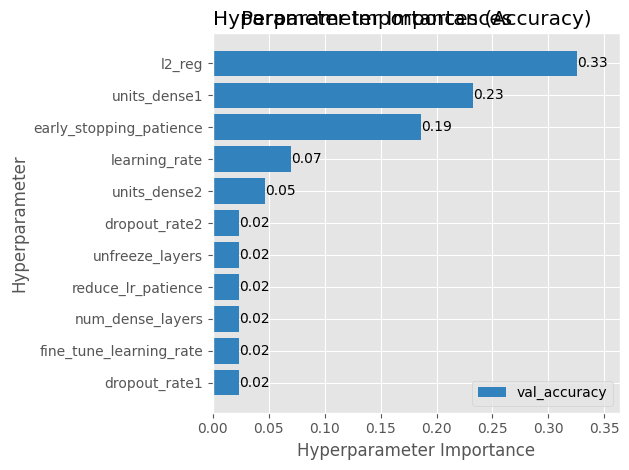

Found 9450 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.

TRAINING AND EVALUATING FOLD 1/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15009_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
295/295 [==============================] - 58s 173ms/step - loss: 0.0077 - accuracy: 1.0000 - val_loss: 0.0368 - val_accuracy: 0.9955 - lr: 7.8503e-06
Epoch 2/50
295/295 [==============================] - 43s 145ms/step - loss: 0.0066 - accuracy: 1.0000 - val_loss: 0.0362 - val_accuracy: 0.9950 - lr: 7.8503e-06
Epoch 3/50
295/295 [==============================] - 44s 150ms/step - loss: 0.0060 - accuracy: 1.0000 - val_loss: 0.0343 - val_accuracy: 0.9950 - lr: 7.8503e-06
Epoch 4/50
295/295 [==============================] - 45s 153ms/step - loss: 0.0053 - accuracy: 1.0000 - val_loss: 0.0338 - val_accuracy: 0.9950 - lr: 7.8503e-06

History for fold 1 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15009_1.pkl
296/296 [==============================] - 39s 132ms/step - loss: 0.0068 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.006762622389942408
64/64 [==============================] - 8s 129ms/step - loss: 0.0366 - accuracy: 0.9956
Validation Accuracy: 0.995555579662323
Validation Log Loss: 0.03662830963730812
64/64 [==============================] - 9s 140ms/step - loss: 0.0356 - accuracy: 0.9956
Test Accuracy: 0.995555579662323
Test Log Loss: 0.03558144345879555
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'ganelp': 4, 'mira': 5, 'sfone': 6, 'sillyp2p': 7, 'wabot': 8}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   1]
 [  0   0   0 225   0   0   0   0   0]
 [  0   0   0   0 225   0   0   0   0]
 [  0   0   0   0   0 225   0   0   0]
 [  0   0   0   0   0   0 224   0   1]
 [  

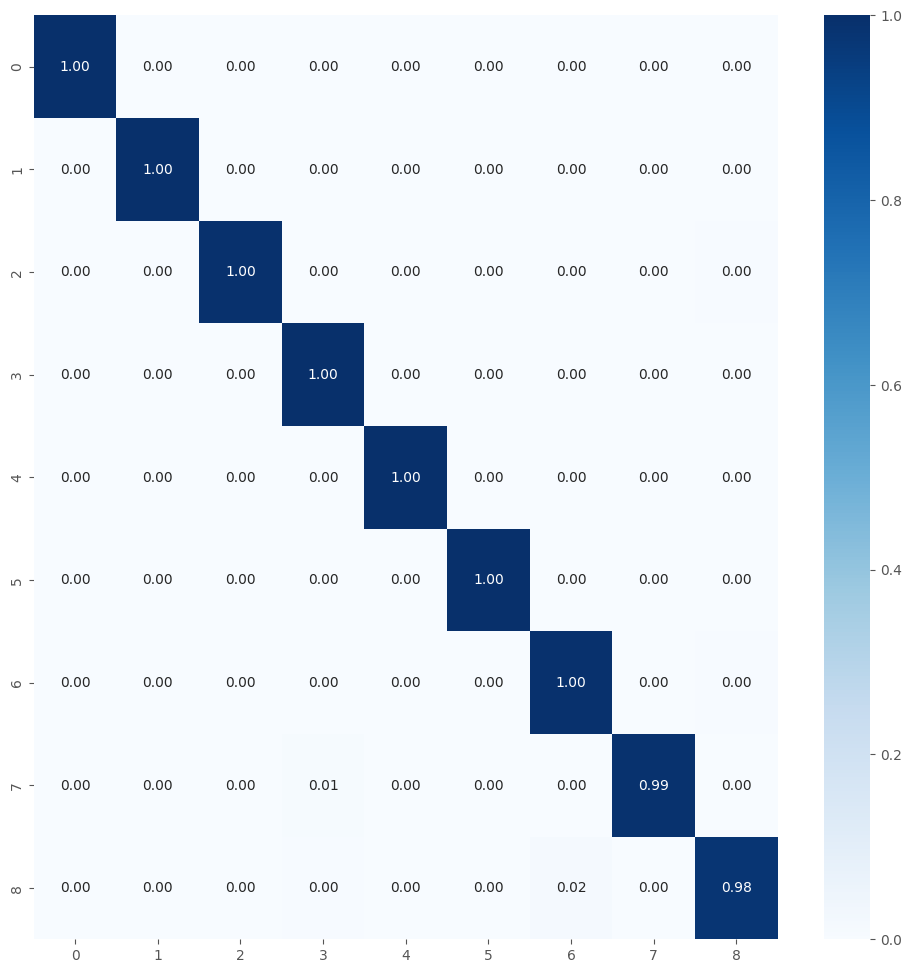


TRAINING AND EVALUATING FOLD 2/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15009_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
295/295 [==============================] - 53s 153ms/step - loss: 0.0077 - accuracy: 1.0000 - val_loss: 0.0364 - val_accuracy: 0.9950 - lr: 7.8503e-06
Epoch 2/50
295/295 [==============================] - 44s 149ms/step - loss: 0.0066 - accuracy: 1.0000 - val_loss: 0.0355 - val_accuracy: 0.9950 - lr: 7.8503e-06
Epoch 3/50
295/295 [==============================] - 44s 150ms/step - loss: 0.0058 - accuracy: 1.0000 - val_loss: 0.0345 - val_accuracy: 0.9950 - lr: 7.8503e-06
Epoch 4/50
295/295 [==============================] - 45s 153ms/step - loss: 0.0052 - accuracy: 1.0000 - val_loss: 0.0334 - val_accuracy: 0.9950 - lr: 7.8503e-06
Epoch 5/50
295/295 [==============================] - 47s 160ms/step - loss: 0.0048 - accuracy: 1.0000 - val_loss: 0.0333 - v

History for fold 2 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15009_2.pkl
296/296 [==============================] - 38s 126ms/step - loss: 0.0068 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.006778963375836611
64/64 [==============================] - 9s 137ms/step - loss: 0.0363 - accuracy: 0.9951
Validation Accuracy: 0.9950617551803589
Validation Log Loss: 0.036299750208854675
64/64 [==============================] - 9s 132ms/step - loss: 0.0348 - accuracy: 0.9956
Test Accuracy: 0.995555579662323
Test Log Loss: 0.03476277366280556
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'ganelp': 4, 'mira': 5, 'sfone': 6, 'sillyp2p': 7, 'wabot': 8}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   1]
 [  0   0   0 225   0   0   0   0   0]
 [  0   0   0   0 225   0   0   0   0]
 [  0   0   0   0   0 225   0   0   0]
 [  0   0   0   0   0   0 224   0   1]
 [

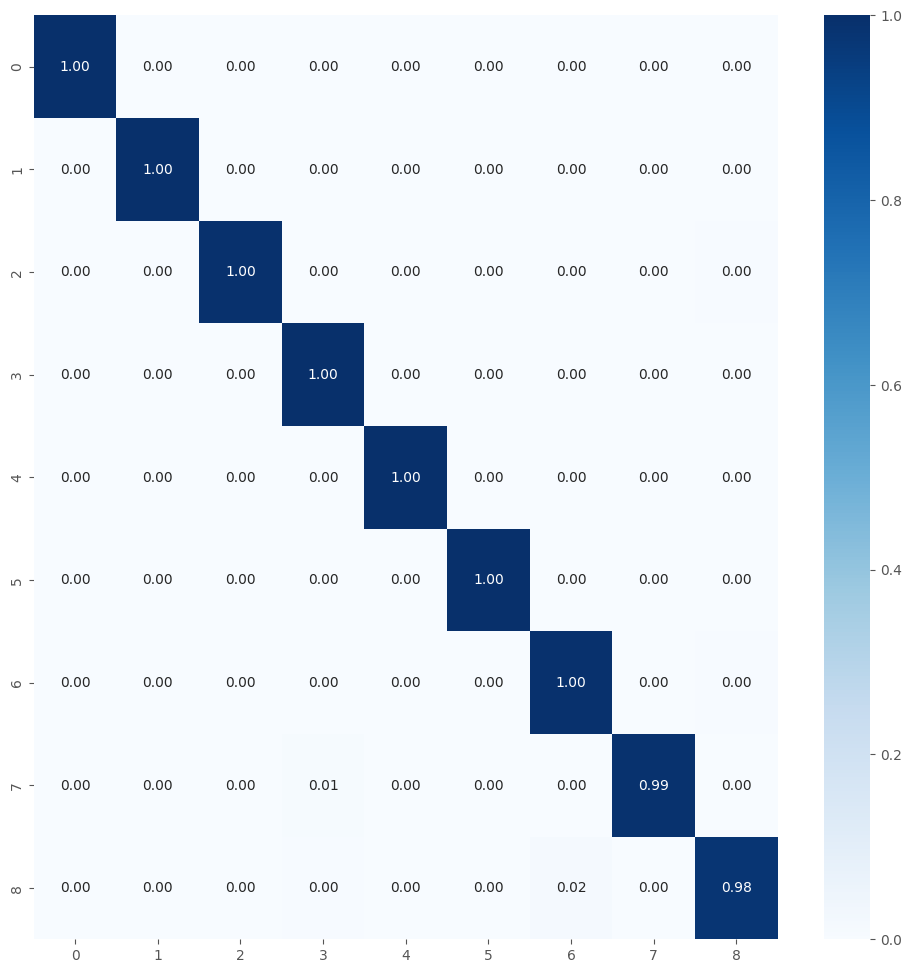


TRAINING AND EVALUATING FOLD 3/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15009_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
295/295 [==============================] - 54s 157ms/step - loss: 0.0078 - accuracy: 0.9998 - val_loss: 0.0362 - val_accuracy: 0.9955 - lr: 7.8503e-06
Epoch 2/50
295/295 [==============================] - 54s 183ms/step - loss: 0.0067 - accuracy: 1.0000 - val_loss: 0.0356 - val_accuracy: 0.9950 - lr: 7.8503e-06
Epoch 3/50
295/295 [==============================] - 44s 148ms/step - loss: 0.0060 - accuracy: 1.0000 - val_loss: 0.0351 - val_accuracy: 0.9950 - lr: 7.8503e-06
Epoch 4/50
295/295 [==============================] - 47s 158ms/step - loss: 0.0055 - accuracy: 1.0000 - val_loss: 0.0343 - val_accuracy: 0.9945 - lr: 7.8503e-06
Epoch 5/50
295/295 [==============================] - 47s 160ms/step - loss: 0.0050 - accuracy: 1.0000 - val_loss: 0.0341 - v

History for fold 3 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15009_3.pkl
296/296 [==============================] - 39s 131ms/step - loss: 0.0068 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.006767140701413155
64/64 [==============================] - 8s 129ms/step - loss: 0.0361 - accuracy: 0.9956
Validation Accuracy: 0.995555579662323
Validation Log Loss: 0.036116063594818115
64/64 [==============================] - 9s 137ms/step - loss: 0.0346 - accuracy: 0.9956
Test Accuracy: 0.995555579662323
Test Log Loss: 0.03455742821097374
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'ganelp': 4, 'mira': 5, 'sfone': 6, 'sillyp2p': 7, 'wabot': 8}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   1]
 [  0   0   0 225   0   0   0   0   0]
 [  0   0   0   0 225   0   0   0   0]
 [  0   0   0   0   0 225   0   0   0]
 [  0   0   0   0   0   0 224   0   1]
 [ 

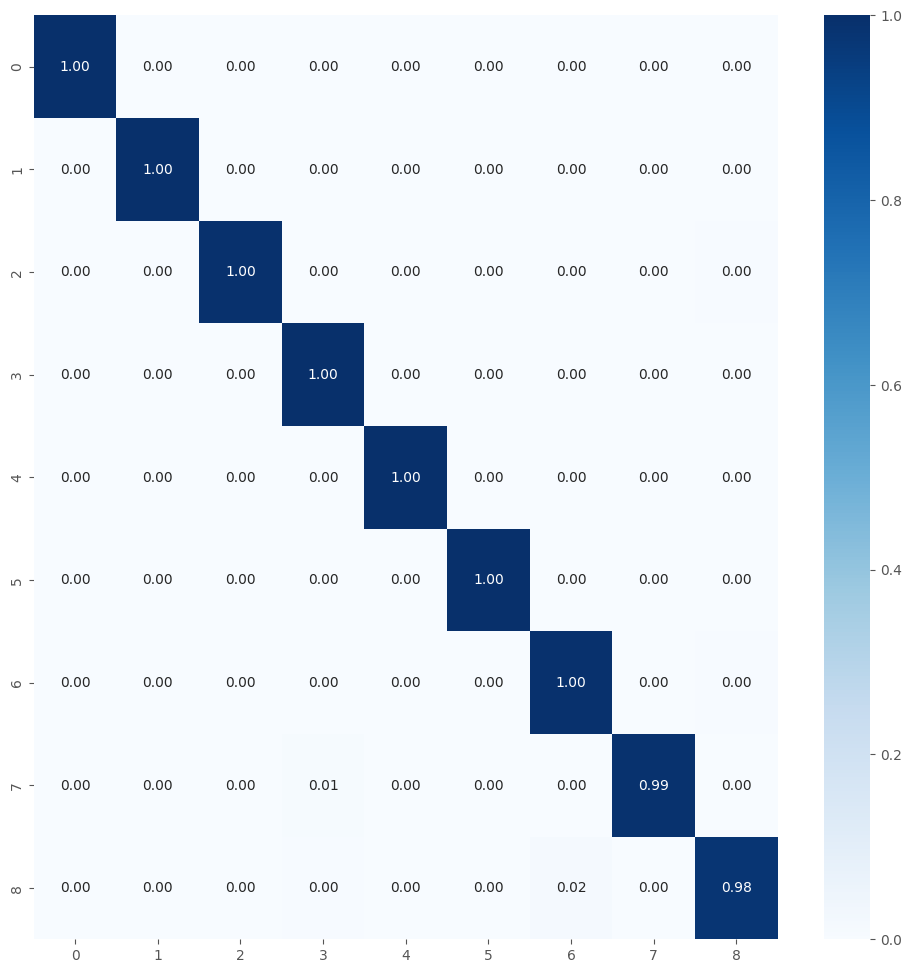


TRAINING AND EVALUATING FOLD 4/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15009_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
295/295 [==============================] - 69s 207ms/step - loss: 0.0079 - accuracy: 1.0000 - val_loss: 0.0367 - val_accuracy: 0.9955 - lr: 7.8503e-06
Epoch 2/50
295/295 [==============================] - 48s 161ms/step - loss: 0.0068 - accuracy: 1.0000 - val_loss: 0.0365 - val_accuracy: 0.9950 - lr: 7.8503e-06
Epoch 3/50
295/295 [==============================] - 46s 157ms/step - loss: 0.0062 - accuracy: 1.0000 - val_loss: 0.0358 - val_accuracy: 0.9950 - lr: 7.8503e-06
Epoch 4/50
295/295 [==============================] - 46s 155ms/step - loss: 0.0057 - accuracy: 1.0000 - val_loss: 0.0350 - val_accuracy: 0.9950 - lr: 7.8503e-06
Epoch 5/50
295/295 [==============================] - 46s 157ms/step - loss: 0.0053 - accuracy: 1.0000 - val_loss: 0.0337 - v

History for fold 4 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15009_4.pkl
296/296 [==============================] - 45s 151ms/step - loss: 0.0069 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.006933301687240601
64/64 [==============================] - 11s 163ms/step - loss: 0.0366 - accuracy: 0.9956
Validation Accuracy: 0.995555579662323
Validation Log Loss: 0.036582767963409424
64/64 [==============================] - 10s 156ms/step - loss: 0.0352 - accuracy: 0.9960
Test Accuracy: 0.9960494041442871
Test Log Loss: 0.03516364470124245
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'ganelp': 4, 'mira': 5, 'sfone': 6, 'sillyp2p': 7, 'wabot': 8}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   1]
 [  0   0   0 225   0   0   0   0   0]
 [  0   0   0   0 225   0   0   0   0]
 [  0   0   0   0   0 225   0   0   0]
 [  0   0   0   0   0   0 225   0   0]


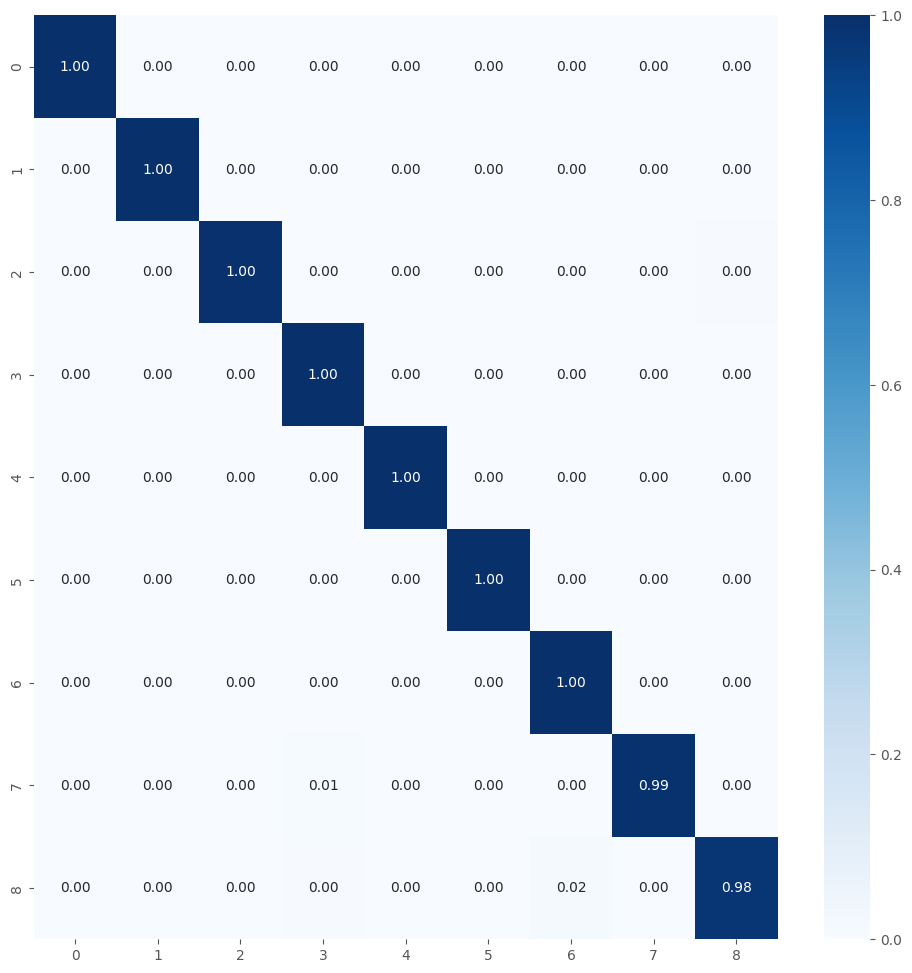


TRAINING AND EVALUATING FOLD 5/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_15009_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
295/295 [==============================] - 67s 194ms/step - loss: 0.0074 - accuracy: 1.0000 - val_loss: 0.0354 - val_accuracy: 0.9955 - lr: 7.8503e-06
Epoch 2/50
295/295 [==============================] - 56s 188ms/step - loss: 0.0062 - accuracy: 1.0000 - val_loss: 0.0303 - val_accuracy: 0.9955 - lr: 7.8503e-06
Epoch 3/50
295/295 [==============================] - 56s 188ms/step - loss: 0.0055 - accuracy: 1.0000 - val_loss: 0.0338 - val_accuracy: 0.9950 - lr: 7.8503e-06
Epoch 4/50
295/295 [==============================] - 57s 192ms/step - loss: 0.0049 - accuracy: 1.0000 - val_loss: 0.0327 - val_accuracy: 0.9950 - lr: 7.8503e-06
Epoch 5/50
295/295 [==============================] - 56s 189ms/step - loss: 0.0045 - accuracy: 1.0000 - val_loss: 0.0321 - v

History for fold 5 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_15009_5.pkl
296/296 [==============================] - 45s 150ms/step - loss: 0.0063 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.006289035081863403
64/64 [==============================] - 9s 136ms/step - loss: 0.0353 - accuracy: 0.9956
Validation Accuracy: 0.995555579662323
Validation Log Loss: 0.03531215712428093
64/64 [==============================] - 9s 146ms/step - loss: 0.0337 - accuracy: 0.9956
Test Accuracy: 0.995555579662323
Test Log Loss: 0.03368055075407028
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'ganelp': 4, 'mira': 5, 'sfone': 6, 'sillyp2p': 7, 'wabot': 8}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   1]
 [  0   0   0 225   0   0   0   0   0]
 [  0   0   0   0 225   0   0   0   0]
 [  0   0   0   0   0 225   0   0   0]
 [  0   0   0   0   0   0 224   0   1]
 [  

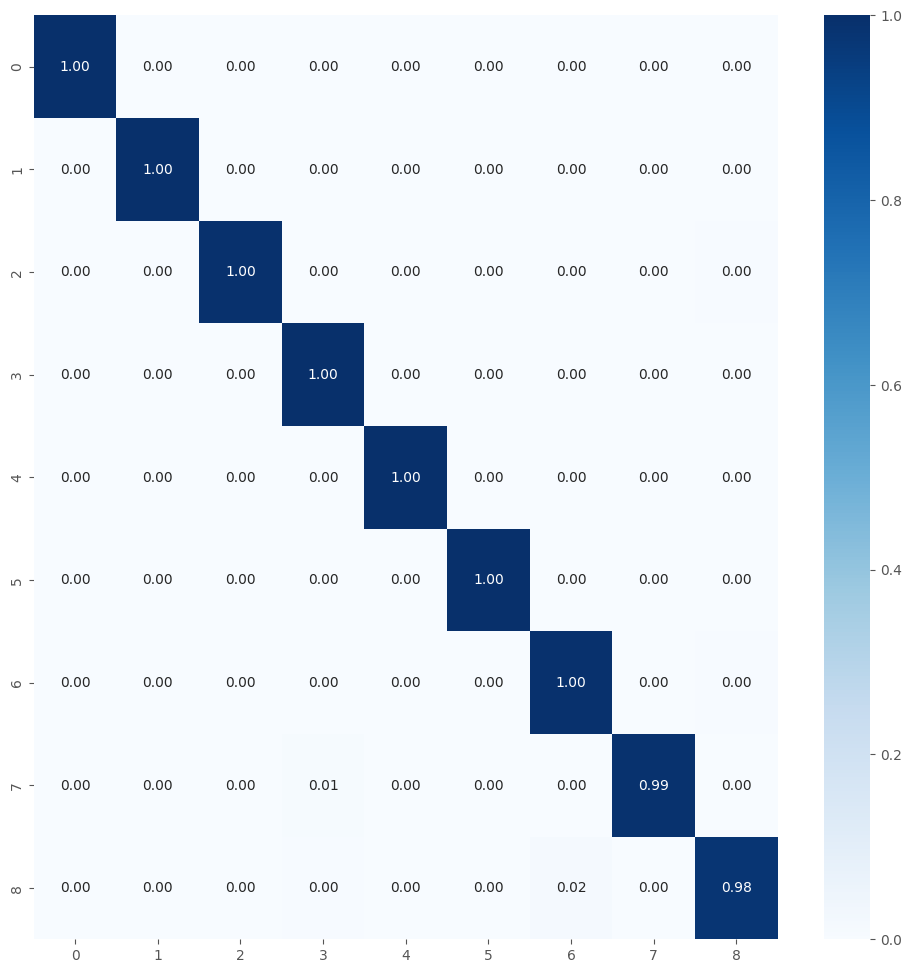


Best fold was 1 with val_accuracy: 0.9955
Average training accuracy in 5-fold: 1.0
Average validation precision in 5-fold: 0.9954365253448486

Test Metrics
test_acc_list: [0.995555579662323, 0.995555579662323, 0.995555579662323, 0.9960494041442871, 0.995555579662323]
Average Test Accuracy with 5-fold: 0.9956543445587158
test_loss_list: [0.03558144345879555, 0.03476277366280556, 0.03455742821097374, 0.03516364470124245, 0.03368055075407028]
Average Test Log Loss with 5-fold: 0.03474916815757752

Precision List: [0.995587692956114, 0.995587692956114, 0.995587692956114, 0.9960944410530037, 0.995587692956114]
Average Precision List with 5-fold: 0.9956890425754918
Recall List: [0.9955555555555556, 0.9955555555555556, 0.9955555555555556, 0.9960493827160494, 0.9955555555555556]
Average Recall List with 5-fold: 0.9956543209876543
F1 Score List: [0.9955542825984587, 0.9955542825984587, 0.9955542825984587, 0.9960469487501986, 0.9955542825984587]
Average F1 Score List with 5-fold: 0.995652815828

In [17]:
%%time

num_classes = 9
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, precision_list_all, 
    recall_list_all, f1_score_list_all)

[I 2025-06-15 20:14:34,710] A new study created in memory with name: malware_classification_10classes


Familias de malware copiadas
source2: /notebooks/train3/all_malware/10
name_save_model: MobileNet_tf_150010
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
- Allaple.A
- Ramnit
- wabot
- mira
- Kelihos_ver3
- ganelp
- Allaple.L
- wacatac
model_path: /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150010_best.h5

Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150010_best.h5
Successfully loaded and modified pretrained model
Found 10500 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.


[I 2025-06-15 20:33:17,140] Trial 0 finished with values: [0.9745535850524902, 0.18811990320682526] and parameters: {'learning_rate': 0.00042988260570376604, 'dropout_rate1': 0.3547304426356563, 'dropout_rate2': 0.4773902643495158, 'l2_reg': 0.00477338257584014, 'units_dense1': 512, 'units_dense2': 256, 'num_dense_layers': 3, 'unfreeze_layers': 7, 'early_stopping_patience': 10, 'reduce_lr_patience': 11, 'fine_tune_learning_rate': 5.6764216392479475e-06, 'units_dense3': 128, 'dropout_rate3': 0.19514848128406703}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150010_best.h5
Successfully loaded and modified pretrained model
Found 10500 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.


[I 2025-06-15 21:27:34,713] Trial 1 finished with values: [0.9736607074737549, 0.16248515248298645] and parameters: {'learning_rate': 6.796892178826282e-05, 'dropout_rate1': 0.2549831197685684, 'dropout_rate2': 0.1677923892216388, 'l2_reg': 0.00915398556631253, 'units_dense1': 512, 'units_dense2': 256, 'num_dense_layers': 3, 'unfreeze_layers': 12, 'early_stopping_patience': 14, 'reduce_lr_patience': 14, 'fine_tune_learning_rate': 1.9205182995828502e-05, 'units_dense3': 32, 'dropout_rate3': 0.36414734382994063}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150010_best.h5
Successfully loaded and modified pretrained model
Found 10500 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.


[I 2025-06-15 22:21:00,404] Trial 2 finished with values: [0.9750000238418579, 0.1650814265012741] and parameters: {'learning_rate': 0.0011103843850985484, 'dropout_rate1': 0.4138405597100602, 'dropout_rate2': 0.32353617058902107, 'l2_reg': 1.4997438423621684e-05, 'units_dense1': 256, 'units_dense2': 64, 'num_dense_layers': 2, 'unfreeze_layers': 7, 'early_stopping_patience': 10, 'reduce_lr_patience': 9, 'fine_tune_learning_rate': 1.3150270163704409e-05}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150010_best.h5
Successfully loaded and modified pretrained model
Found 10500 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.


[I 2025-06-15 22:32:53,800] Trial 3 finished with values: [0.9741071462631226, 0.19221265614032745] and parameters: {'learning_rate': 2.2567644686045704e-05, 'dropout_rate1': 0.276014695643784, 'dropout_rate2': 0.39660681786065977, 'l2_reg': 0.00025552140300049445, 'units_dense1': 1024, 'units_dense2': 256, 'num_dense_layers': 3, 'unfreeze_layers': 13, 'early_stopping_patience': 10, 'reduce_lr_patience': 9, 'fine_tune_learning_rate': 4.821901546786789e-06, 'units_dense3': 64, 'dropout_rate3': 0.2092836751875399}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150010_best.h5
Successfully loaded and modified pretrained model
Found 10500 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.


[I 2025-06-15 22:53:29,915] Trial 4 finished with values: [0.9736607074737549, 0.1900448054075241] and parameters: {'learning_rate': 0.0011455741070486977, 'dropout_rate1': 0.485785493515693, 'dropout_rate2': 0.271773773521616, 'l2_reg': 0.00034556898589968983, 'units_dense1': 1024, 'units_dense2': 128, 'num_dense_layers': 3, 'unfreeze_layers': 8, 'early_stopping_patience': 19, 'reduce_lr_patience': 14, 'fine_tune_learning_rate': 7.248694504345621e-06, 'units_dense3': 64, 'dropout_rate3': 0.23349191279148482}.
/tmp/ipykernel_27/3900254938.py:136: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


Mejores trials para cada objetivo:
  Trial 1:
    val_accuracy: 0.9737
    val_loss: 0.1625
    Parámetros: {'learning_rate': 6.796892178826282e-05, 'dropout_rate1': 0.2549831197685684, 'dropout_rate2': 0.1677923892216388, 'l2_reg': 0.00915398556631253, 'units_dense1': 512, 'units_dense2': 256, 'num_dense_layers': 3, 'unfreeze_layers': 12, 'early_stopping_patience': 14, 'reduce_lr_patience': 14, 'fine_tune_learning_rate': 1.9205182995828502e-05, 'units_dense3': 32, 'dropout_rate3': 0.36414734382994063}
  Trial 2:
    val_accuracy: 0.9750
    val_loss: 0.1651
    Parámetros: {'learning_rate': 0.0011103843850985484, 'dropout_rate1': 0.4138405597100602, 'dropout_rate2': 0.32353617058902107, 'l2_reg': 1.4997438423621684e-05, 'units_dense1': 256, 'units_dense2': 64, 'num_dense_layers': 2, 'unfreeze_layers': 7, 'early_stopping_patience': 10, 'reduce_lr_patience': 9, 'fine_tune_learning_rate': 1.3150270163704409e-05}


<Figure size 700x500 with 0 Axes>

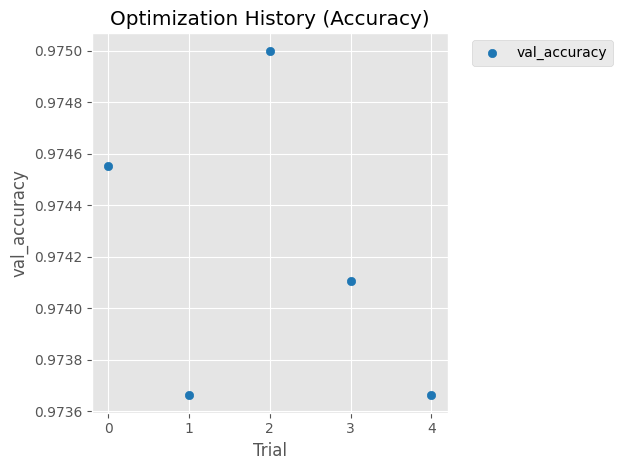

/tmp/ipykernel_27/3900254938.py:147: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

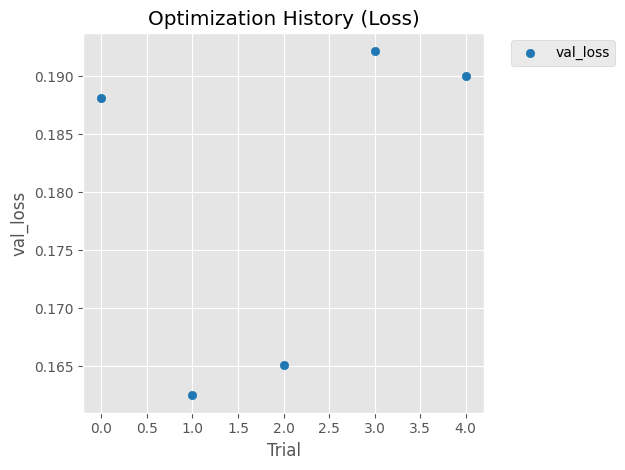

/tmp/ipykernel_27/3900254938.py:185: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Figure size 700x500 with 0 Axes>

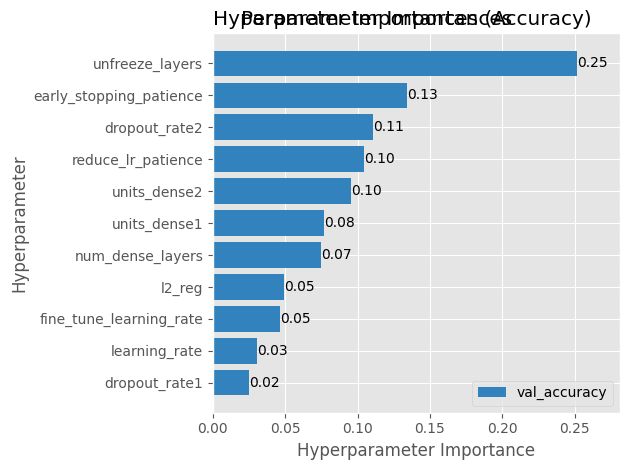

Found 10500 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.

TRAINING AND EVALUATING FOLD 1/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150010_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
328/328 [==============================] - 65s 171ms/step - loss: 0.0417 - accuracy: 0.9995 - val_loss: 0.1954 - val_accuracy: 0.9732 - lr: 6.7969e-06
Epoch 2/50
328/328 [==============================] - 51s 157ms/step - loss: 0.0401 - accuracy: 0.9991 - val_loss: 0.1960 - val_accuracy: 0.9732 - lr: 6.7969e-06
Epoch 3/50
328/328 [==============================] - 51s 155ms/step - loss: 0.0377 - accuracy: 0.9998 - val_loss: 0.1912 - val_accuracy: 0.9728 - lr: 6.7969e-06
Epoch 4/50
328/328 [==============================] - 49s 150ms/step - loss: 0.0372 - accuracy: 0.9997 - val_loss: 0.1925 - val_accuracy: 0.9741 - lr: 6.796

History for fold 1 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150010_1.pkl
329/329 [==============================] - 44s 134ms/step - loss: 0.0352 - accuracy: 0.9999
Train Accuracy: 0.9999047517776489
Train Log Loss: 0.03519805520772934
71/71 [==============================] - 10s 141ms/step - loss: 0.1923 - accuracy: 0.9738
Validation Accuracy: 0.9737777709960938
Validation Log Loss: 0.19230742752552032
71/71 [==============================] - 12s 170ms/step - loss: 0.1803 - accuracy: 0.9747
Test Accuracy: 0.9746666550636292
Test Log Loss: 0.1802561730146408
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'ganelp': 4, 'mira': 5, 'sfone': 6, 'sillyp2p': 7, 'wabot': 8, 'wacatac': 9}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   1   0]
 [  0   0   0 223   0   0   0   0   0   2]
 [  0   0   0   0 219   0   0   0   0   6]
 [  0   0   0   0   0 225   0 

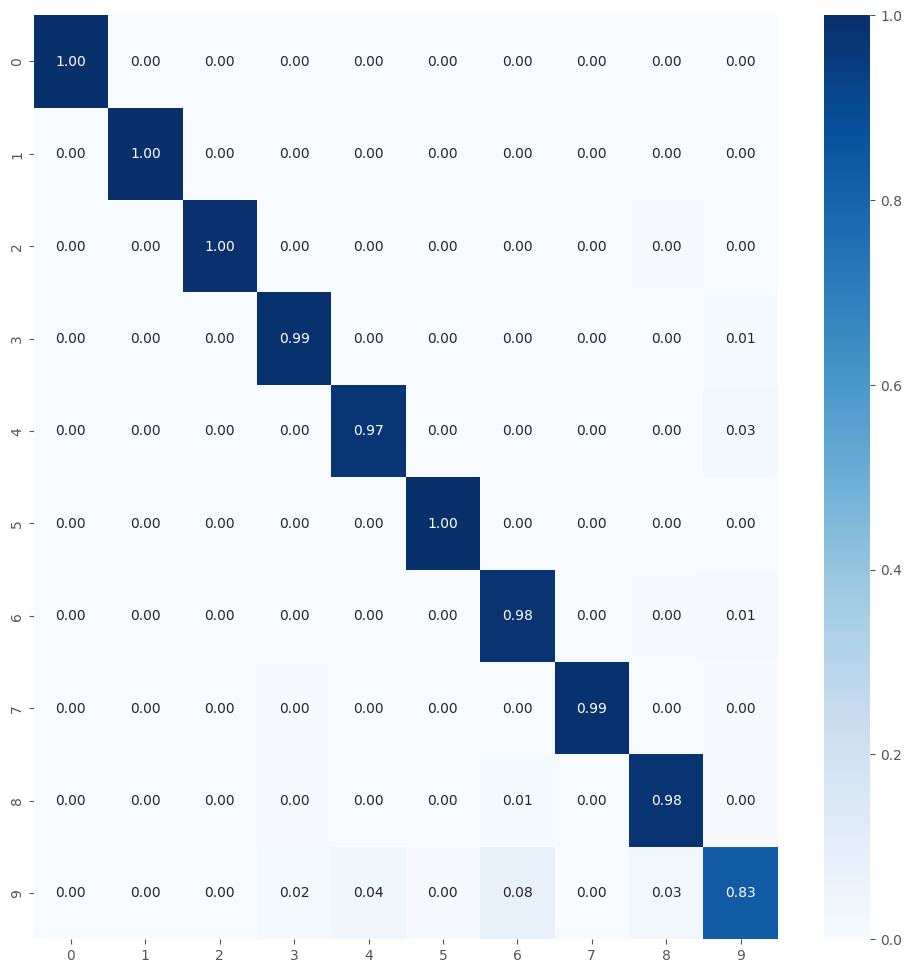


TRAINING AND EVALUATING FOLD 2/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150010_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
328/328 [==============================] - 69s 173ms/step - loss: 0.0419 - accuracy: 0.9994 - val_loss: 0.1927 - val_accuracy: 0.9737 - lr: 6.7969e-06
Epoch 2/50
328/328 [==============================] - 53s 162ms/step - loss: 0.0411 - accuracy: 0.9993 - val_loss: 0.1939 - val_accuracy: 0.9737 - lr: 6.7969e-06
Epoch 3/50
328/328 [==============================] - 53s 162ms/step - loss: 0.0387 - accuracy: 0.9997 - val_loss: 0.1910 - val_accuracy: 0.9719 - lr: 6.7969e-06
Epoch 4/50
328/328 [==============================] - 53s 160ms/step - loss: 0.0383 - accuracy: 0.9997 - val_loss: 0.1946 - val_accuracy: 0.9723 - lr: 6.7969e-06
Epoch 5/50
328/328 [==============================] - 52s 158ms/step - loss: 0.0372 - accuracy: 0.9999 - val_loss: 0.1938 - 

History for fold 2 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150010_2.pkl
329/329 [==============================] - 45s 136ms/step - loss: 0.0292 - accuracy: 0.9999
Train Accuracy: 0.9999047517776489
Train Log Loss: 0.02915200963616371
71/71 [==============================] - 10s 138ms/step - loss: 0.1944 - accuracy: 0.9742
Validation Accuracy: 0.9742222428321838
Validation Log Loss: 0.1943887174129486
71/71 [==============================] - 11s 147ms/step - loss: 0.1848 - accuracy: 0.9747
Test Accuracy: 0.9746666550636292
Test Log Loss: 0.18475982546806335
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'ganelp': 4, 'mira': 5, 'sfone': 6, 'sillyp2p': 7, 'wabot': 8, 'wacatac': 9}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   1   0]
 [  0   0   0 223   0   0   0   0   0   2]
 [  0   0   0   0 219   0   0   0   0   6]
 [  0   0   0   0   0 225   0 

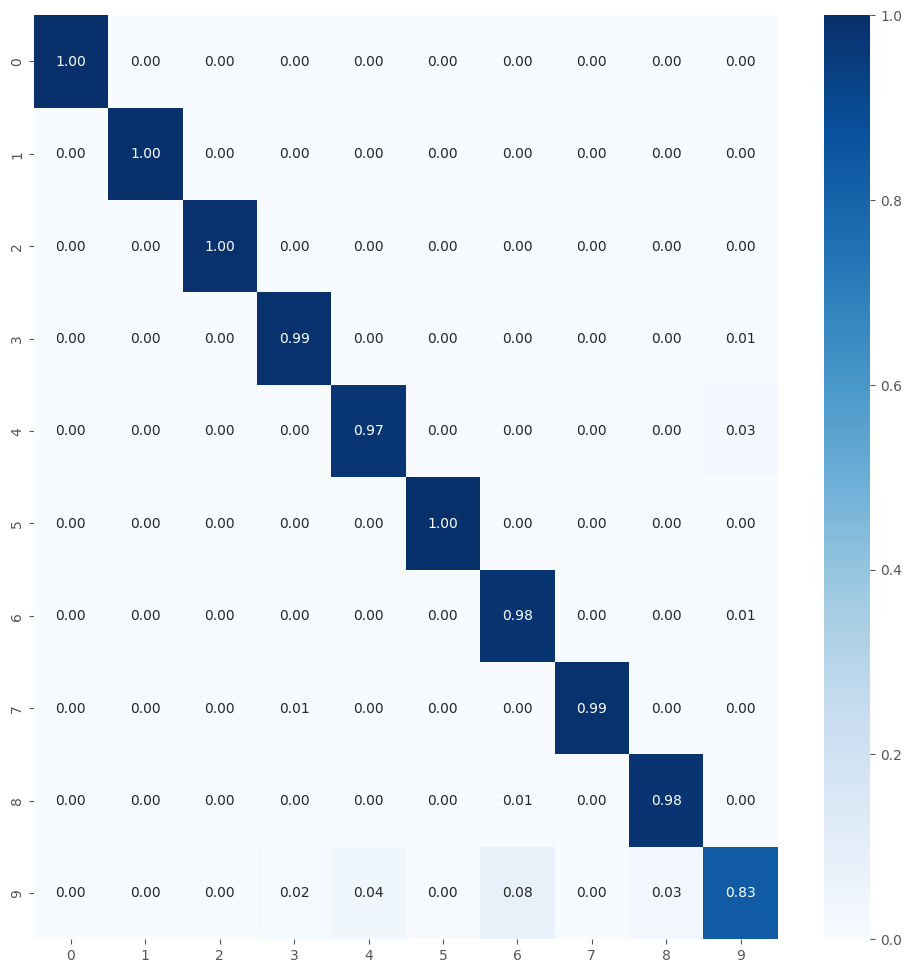


TRAINING AND EVALUATING FOLD 3/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150010_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
328/328 [==============================] - 67s 173ms/step - loss: 0.0421 - accuracy: 0.9993 - val_loss: 0.1947 - val_accuracy: 0.9732 - lr: 6.7969e-06
Epoch 2/50
328/328 [==============================] - 57s 172ms/step - loss: 0.0401 - accuracy: 0.9996 - val_loss: 0.1939 - val_accuracy: 0.9723 - lr: 6.7969e-06
Epoch 3/50
328/328 [==============================] - 54s 163ms/step - loss: 0.0393 - accuracy: 0.9996 - val_loss: 0.1953 - val_accuracy: 0.9723 - lr: 6.7969e-06
Epoch 4/50
328/328 [==============================] - 54s 164ms/step - loss: 0.0387 - accuracy: 0.9996 - val_loss: 0.1976 - val_accuracy: 0.9714 - lr: 6.7969e-06
Epoch 5/50
328/328 [==============================] - 54s 165ms/step - loss: 0.0385 - accuracy: 0.9991 - val_loss: 0.2003 - 

History for fold 3 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150010_3.pkl
329/329 [==============================] - 40s 121ms/step - loss: 0.0359 - accuracy: 0.9999
Train Accuracy: 0.9999047517776489
Train Log Loss: 0.03591768816113472
71/71 [==============================] - 10s 132ms/step - loss: 0.1996 - accuracy: 0.9738
Validation Accuracy: 0.9737777709960938
Validation Log Loss: 0.19955670833587646
71/71 [==============================] - 9s 123ms/step - loss: 0.1927 - accuracy: 0.9742
Test Accuracy: 0.9742222428321838
Test Log Loss: 0.19267408549785614
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'ganelp': 4, 'mira': 5, 'sfone': 6, 'sillyp2p': 7, 'wabot': 8, 'wacatac': 9}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   1   0]
 [  0   0   0 223   0   0   0   0   0   2]
 [  0   0   0   0 219   0   0   0   0   6]
 [  0   0   0   0   0 225   0 

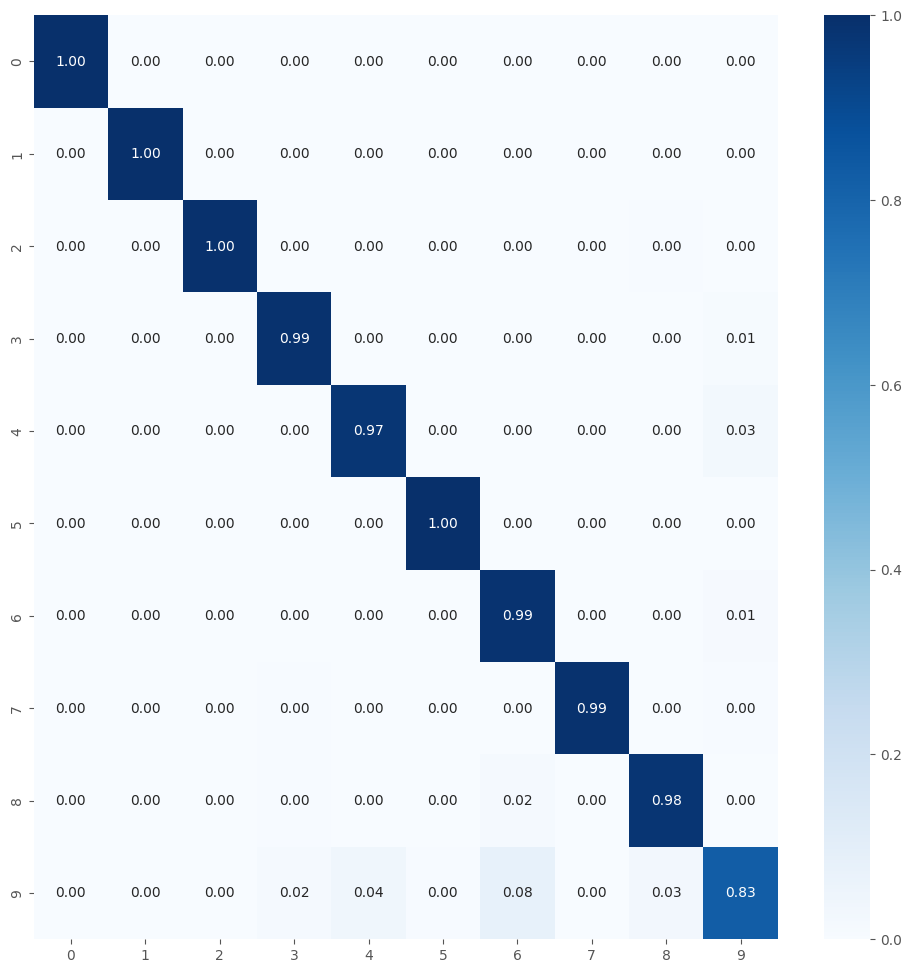


TRAINING AND EVALUATING FOLD 4/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150010_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
328/328 [==============================] - 73s 196ms/step - loss: 0.0415 - accuracy: 0.9994 - val_loss: 0.1961 - val_accuracy: 0.9723 - lr: 6.7969e-06
Epoch 2/50
328/328 [==============================] - 34s 103ms/step - loss: 0.0409 - accuracy: 0.9991 - val_loss: 0.1957 - val_accuracy: 0.9719 - lr: 6.7969e-06
Epoch 3/50
328/328 [==============================] - 49s 149ms/step - loss: 0.0386 - accuracy: 0.9997 - val_loss: 0.1992 - val_accuracy: 0.9723 - lr: 6.7969e-06
Epoch 4/50
328/328 [==============================] - 49s 150ms/step - loss: 0.0380 - accuracy: 0.9994 - val_loss: 0.1989 - val_accuracy: 0.9719 - lr: 6.7969e-06
Epoch 5/50
328/328 [==============================] - 50s 152ms/step - loss: 0.0373 - accuracy: 0.9996 - val_loss: 0.1992 - 

History for fold 4 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150010_4.pkl
329/329 [==============================] - 40s 121ms/step - loss: 0.0327 - accuracy: 0.9999
Train Accuracy: 0.9999047517776489
Train Log Loss: 0.03265129029750824
71/71 [==============================] - 9s 120ms/step - loss: 0.1970 - accuracy: 0.9738
Validation Accuracy: 0.9737777709960938
Validation Log Loss: 0.19698862731456757
71/71 [==============================] - 9s 128ms/step - loss: 0.1853 - accuracy: 0.9747
Test Accuracy: 0.9746666550636292
Test Log Loss: 0.18529918789863586
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'ganelp': 4, 'mira': 5, 'sfone': 6, 'sillyp2p': 7, 'wabot': 8, 'wacatac': 9}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   1   0]
 [  0   0   0 223   0   0   0   0   0   2]
 [  0   0   0   0 219   0   0   0   0   6]
 [  0   0   0   0   0 225   0  

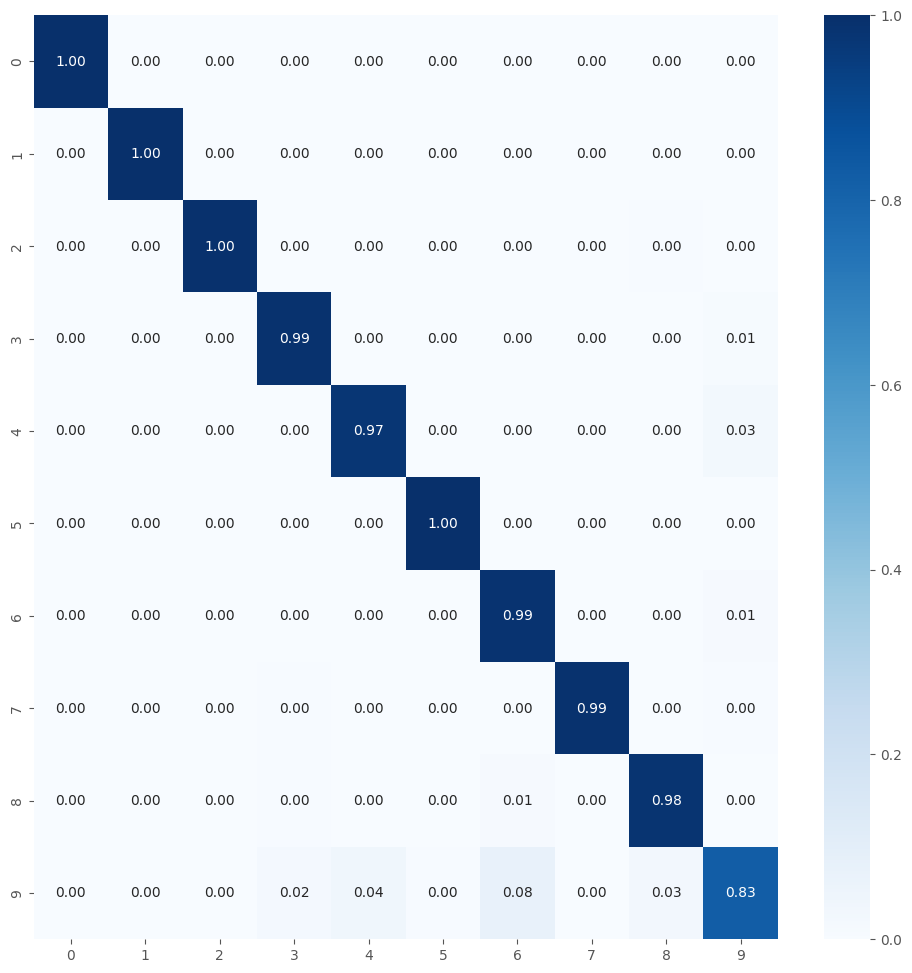


TRAINING AND EVALUATING FOLD 5/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150010_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
328/328 [==============================] - 65s 170ms/step - loss: 0.0412 - accuracy: 0.9995 - val_loss: 0.1983 - val_accuracy: 0.9719 - lr: 6.7969e-06
Epoch 2/50
328/328 [==============================] - 48s 147ms/step - loss: 0.0392 - accuracy: 0.9996 - val_loss: 0.1927 - val_accuracy: 0.9737 - lr: 6.7969e-06
Epoch 3/50
328/328 [==============================] - 48s 146ms/step - loss: 0.0381 - accuracy: 0.9995 - val_loss: 0.1963 - val_accuracy: 0.9728 - lr: 6.7969e-06
Epoch 4/50
328/328 [==============================] - 47s 143ms/step - loss: 0.0372 - accuracy: 0.9997 - val_loss: 0.1974 - val_accuracy: 0.9732 - lr: 6.7969e-06
Epoch 5/50
328/328 [==============================] - 51s 156ms/step - loss: 0.0357 - accuracy: 0.9998 - val_loss: 0.1975 - 

History for fold 5 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150010_5.pkl
329/329 [==============================] - 42s 127ms/step - loss: 0.0295 - accuracy: 0.9999
Train Accuracy: 0.9999047517776489
Train Log Loss: 0.029463449493050575
71/71 [==============================] - 9s 127ms/step - loss: 0.1988 - accuracy: 0.9751
Validation Accuracy: 0.9751111268997192
Validation Log Loss: 0.198805034160614
71/71 [==============================] - 9s 125ms/step - loss: 0.1875 - accuracy: 0.9751
Test Accuracy: 0.9751111268997192
Test Log Loss: 0.18746985495090485
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'ganelp': 4, 'mira': 5, 'sfone': 6, 'sillyp2p': 7, 'wabot': 8, 'wacatac': 9}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   1   0]
 [  0   0   0 223   0   0   0   0   0   2]
 [  0   0   0   0 219   0   0   0   0   6]
 [  0   0   0   0   0 225   0   

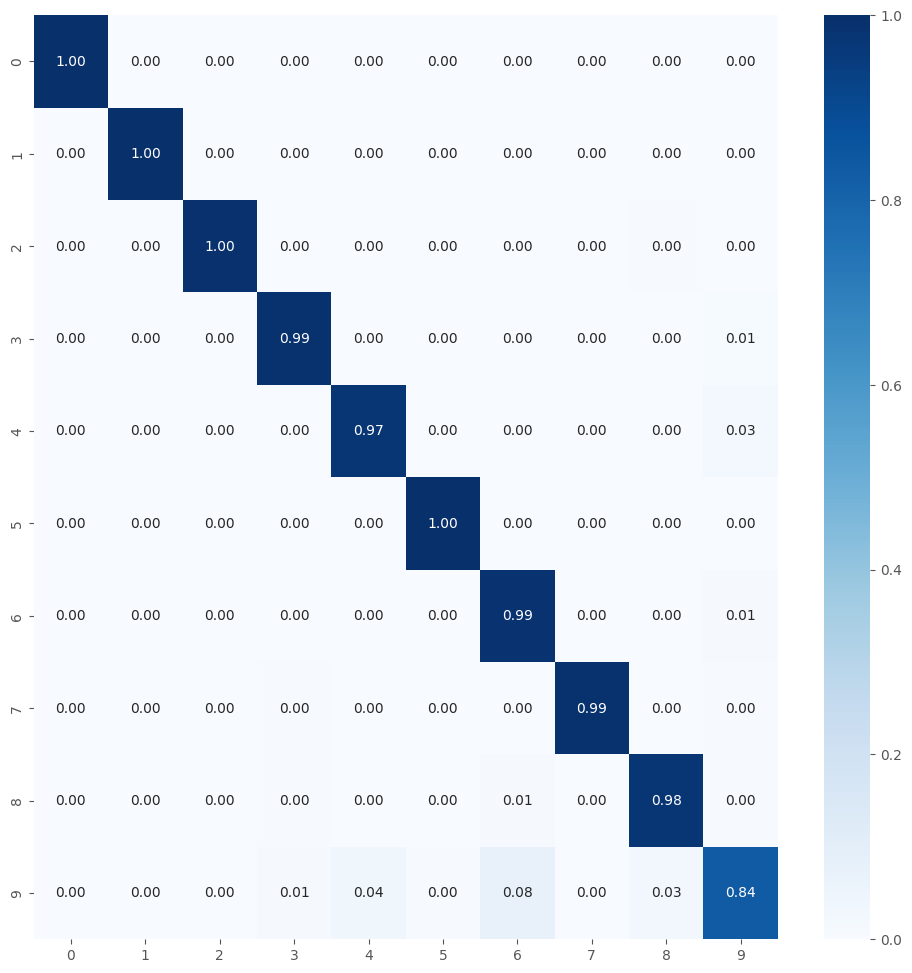


Best fold was 5 with val_accuracy: 0.9750
Average training accuracy in 5-fold: 0.9999617815017701
Average validation precision in 5-fold: 0.9741964340209961

Test Metrics
test_acc_list: [0.9746666550636292, 0.9746666550636292, 0.9742222428321838, 0.9746666550636292, 0.9751111268997192]
Average Test Accuracy with 5-fold: 0.9746666669845581
test_loss_list: [0.1802561730146408, 0.18475982546806335, 0.19267408549785614, 0.18529918789863586, 0.18746985495090485]
Average Test Log Loss with 5-fold: 0.1860918253660202

Precision List: [0.9746603562216691, 0.9747068145432752, 0.9744042949335432, 0.9747481567897889, 0.9751762748154167]
Average Precision List with 5-fold: 0.9747391794607386
Recall List: [0.9746666666666668, 0.9746666666666668, 0.9742222222222223, 0.9746666666666668, 0.9751111111111112]
Average Recall List with 5-fold: 0.9746666666666668
F1 Score List: [0.9742323725574555, 0.9742240122866898, 0.9737787668055754, 0.9741948816051507, 0.9747207127385868]
Average F1 Score List with 5

In [18]:
%%time

num_classes = 10
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, precision_list_all, 
    recall_list_all, f1_score_list_all)

[I 2025-06-16 01:18:36,577] A new study created in memory with name: malware_classification_11classes


Familias de malware copiadas
source2: /notebooks/train3/all_malware/11
name_save_model: MobileNet_tf_150011
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
- Allaple.A
- Ramnit
- wabot
- mira
- Kelihos_ver3
- ganelp
- Allaple.L
- wacatac
- dinwod
model_path: /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150011_best.h5

Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150011_best.h5
Successfully loaded and modified pretrained model
Found 11550 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.


[I 2025-06-16 01:39:49,366] Trial 0 finished with values: [0.9492694735527039, 0.2849103510379791] and parameters: {'learning_rate': 1.8439168321870884e-05, 'dropout_rate1': 0.4018649153727764, 'dropout_rate2': 0.2570050434073726, 'l2_reg': 0.0014751104517303144, 'units_dense1': 256, 'units_dense2': 128, 'num_dense_layers': 2, 'unfreeze_layers': 8, 'early_stopping_patience': 14, 'reduce_lr_patience': 8, 'fine_tune_learning_rate': 1.6766768650477312e-06}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150011_best.h5
Successfully loaded and modified pretrained model
Found 11550 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.


[I 2025-06-16 02:07:08,678] Trial 1 finished with values: [0.951298713684082, 0.26953139901161194] and parameters: {'learning_rate': 0.0014116323052630868, 'dropout_rate1': 0.4863820535313513, 'dropout_rate2': 0.2375488598103322, 'l2_reg': 0.0001202907073186578, 'units_dense1': 256, 'units_dense2': 64, 'num_dense_layers': 3, 'unfreeze_layers': 7, 'early_stopping_patience': 12, 'reduce_lr_patience': 12, 'fine_tune_learning_rate': 8.937704713032789e-05, 'units_dense3': 128, 'dropout_rate3': 0.26034113591068864}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150011_best.h5
Successfully loaded and modified pretrained model
Found 11550 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.


[I 2025-06-16 02:19:03,128] Trial 2 finished with values: [0.9484577775001526, 0.28753581643104553] and parameters: {'learning_rate': 0.009893654036099748, 'dropout_rate1': 0.29804738104708567, 'dropout_rate2': 0.3582276768135816, 'l2_reg': 2.981449358116113e-05, 'units_dense1': 256, 'units_dense2': 64, 'num_dense_layers': 3, 'unfreeze_layers': 7, 'early_stopping_patience': 10, 'reduce_lr_patience': 8, 'fine_tune_learning_rate': 6.827543512437068e-06, 'units_dense3': 128, 'dropout_rate3': 0.2511987024797717}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150011_best.h5
Successfully loaded and modified pretrained model
Found 11550 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.


[I 2025-06-16 02:33:10,628] Trial 3 finished with values: [0.951298713684082, 0.28659680485725403] and parameters: {'learning_rate': 0.00012598157818079594, 'dropout_rate1': 0.4652976055904745, 'dropout_rate2': 0.43907605137423744, 'l2_reg': 0.00013844232522718762, 'units_dense1': 512, 'units_dense2': 128, 'num_dense_layers': 3, 'unfreeze_layers': 14, 'early_stopping_patience': 11, 'reduce_lr_patience': 12, 'fine_tune_learning_rate': 6.197160947780351e-06, 'units_dense3': 32, 'dropout_rate3': 0.17233743282691422}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150011_best.h5
Successfully loaded and modified pretrained model
Found 11550 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.


[I 2025-06-16 02:56:10,979] Trial 4 finished with values: [0.9419642686843872, 0.2738315165042877] and parameters: {'learning_rate': 0.0004706008934941952, 'dropout_rate1': 0.504442040822749, 'dropout_rate2': 0.36884880348787064, 'l2_reg': 1.6806430122649355e-05, 'units_dense1': 256, 'units_dense2': 128, 'num_dense_layers': 2, 'unfreeze_layers': 15, 'early_stopping_patience': 11, 'reduce_lr_patience': 10, 'fine_tune_learning_rate': 4.135756091950129e-06}.


Mejores trials para cada objetivo:
  Trial 1:
    val_accuracy: 0.9513
    val_loss: 0.2695
    Parámetros: {'learning_rate': 0.0014116323052630868, 'dropout_rate1': 0.4863820535313513, 'dropout_rate2': 0.2375488598103322, 'l2_reg': 0.0001202907073186578, 'units_dense1': 256, 'units_dense2': 64, 'num_dense_layers': 3, 'unfreeze_layers': 7, 'early_stopping_patience': 12, 'reduce_lr_patience': 12, 'fine_tune_learning_rate': 8.937704713032789e-05, 'units_dense3': 128, 'dropout_rate3': 0.26034113591068864}


/tmp/ipykernel_27/3900254938.py:136: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

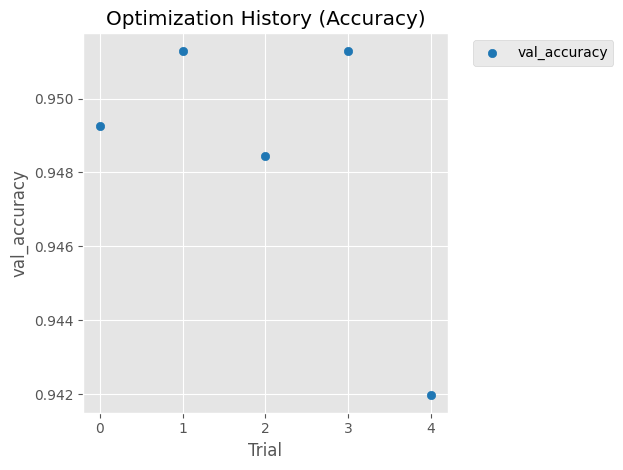

/tmp/ipykernel_27/3900254938.py:147: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

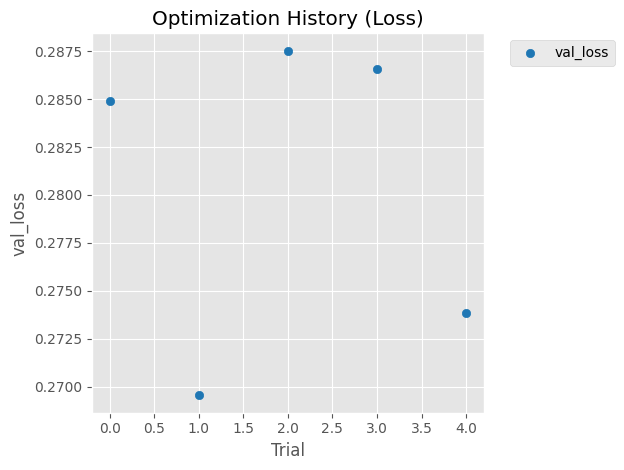

/tmp/ipykernel_27/3900254938.py:185: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Figure size 700x500 with 0 Axes>

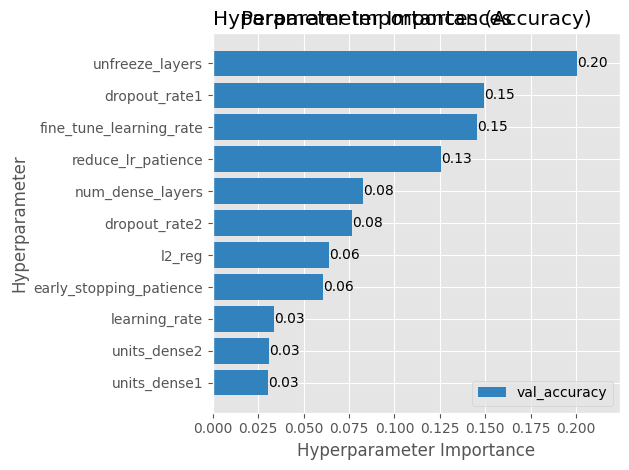

Found 11550 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.

TRAINING AND EVALUATING FOLD 1/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150011_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
360/360 [==============================] - 67s 164ms/step - loss: 0.0590 - accuracy: 0.9942 - val_loss: 0.3052 - val_accuracy: 0.9476 - lr: 1.4116e-04
Epoch 2/50
360/360 [==============================] - 60s 166ms/step - loss: 0.0531 - accuracy: 0.9950 - val_loss: 0.3035 - val_accuracy: 0.9493 - lr: 1.4116e-04
Epoch 3/50
360/360 [==============================] - 58s 161ms/step - loss: 0.0497 - accuracy: 0.9957 - val_loss: 0.2959 - val_accuracy: 0.9521 - lr: 1.4116e-04
Epoch 4/50
360/360 [==============================] - 57s 158ms/step - loss: 0.0444 - accuracy: 0.9958 - val_loss: 0.2991 - val_accuracy: 0.9472 - lr: 1.411

History for fold 1 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150011_1.pkl
361/361 [==============================] - 47s 130ms/step - loss: 0.0413 - accuracy: 0.9977
Train Accuracy: 0.997662365436554
Train Log Loss: 0.04131459817290306
78/78 [==============================] - 11s 141ms/step - loss: 0.2999 - accuracy: 0.9519
Validation Accuracy: 0.9519191980361938
Validation Log Loss: 0.29989469051361084
78/78 [==============================] - 11s 143ms/step - loss: 0.2701 - accuracy: 0.9531
Test Accuracy: 0.9531313180923462
Test Log Loss: 0.27006909251213074
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'dinwod': 4, 'ganelp': 5, 'mira': 6, 'sfone': 7, 'sillyp2p': 8, 'wabot': 9, 'wacatac': 10}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   1   0]
 [  0   0   0 220   1   0   0   0   0   0   4]
 [  0   0   0   0 194  10   0   0   0   0  

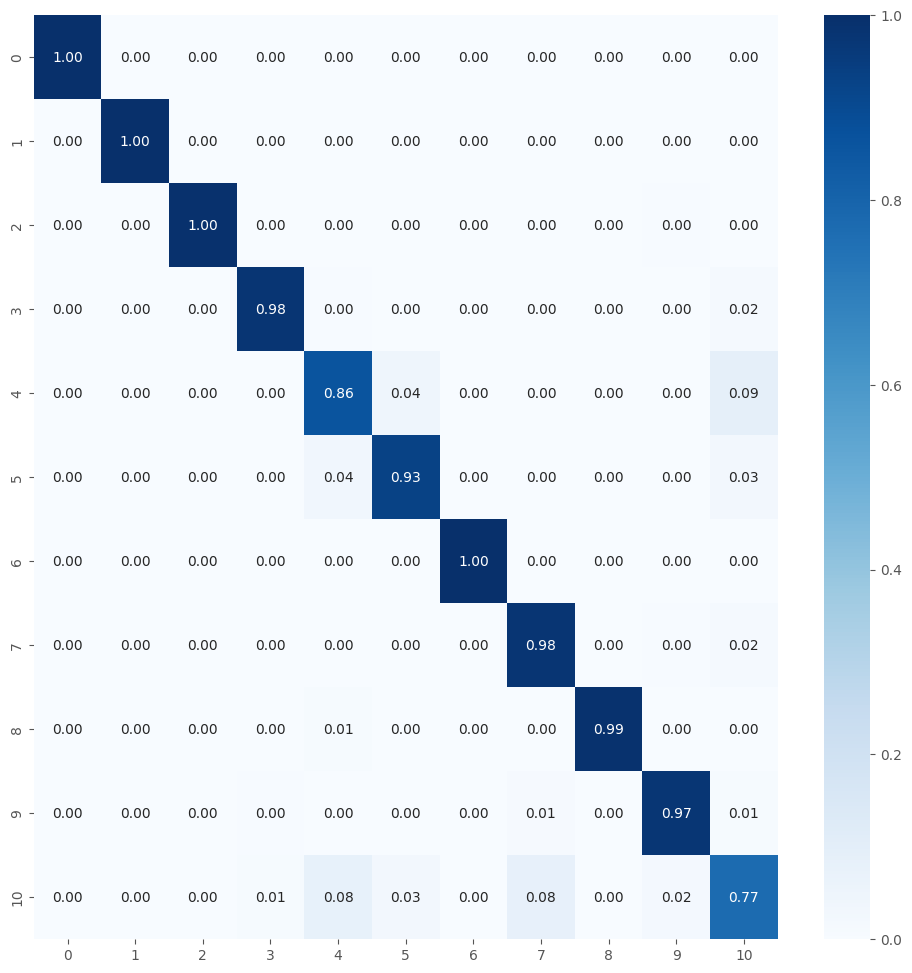


TRAINING AND EVALUATING FOLD 2/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150011_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
360/360 [==============================] - 67s 167ms/step - loss: 0.0578 - accuracy: 0.9948 - val_loss: 0.2999 - val_accuracy: 0.9489 - lr: 1.4116e-04
Epoch 2/50
360/360 [==============================] - 57s 158ms/step - loss: 0.0500 - accuracy: 0.9963 - val_loss: 0.2988 - val_accuracy: 0.9456 - lr: 1.4116e-04
Epoch 3/50
360/360 [==============================] - 59s 165ms/step - loss: 0.0461 - accuracy: 0.9963 - val_loss: 0.3168 - val_accuracy: 0.9472 - lr: 1.4116e-04
Epoch 4/50
360/360 [==============================] - 57s 159ms/step - loss: 0.0452 - accuracy: 0.9949 - val_loss: 0.3013 - val_accuracy: 0.9428 - lr: 1.4116e-04
Epoch 5/50
360/360 [==============================] - 57s 158ms/step - loss: 0.0429 - accuracy: 0.9949 - val_loss: 0.3205 - 

History for fold 2 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150011_2.pkl
361/361 [==============================] - 46s 128ms/step - loss: 0.0393 - accuracy: 0.9968
Train Accuracy: 0.9967965483665466
Train Log Loss: 0.03926844522356987
78/78 [==============================] - 10s 128ms/step - loss: 0.3221 - accuracy: 0.9503
Validation Accuracy: 0.9503030180931091
Validation Log Loss: 0.3220546841621399
78/78 [==============================] - 10s 128ms/step - loss: 0.2999 - accuracy: 0.9519
Test Accuracy: 0.9519191980361938
Test Log Loss: 0.2999309301376343
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'dinwod': 4, 'ganelp': 5, 'mira': 6, 'sfone': 7, 'sillyp2p': 8, 'wabot': 9, 'wacatac': 10}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   1   0]
 [  0   0   0 221   1   0   0   1   0   0   2]
 [  0   0   0   0 198  14   0   0   0   0  1

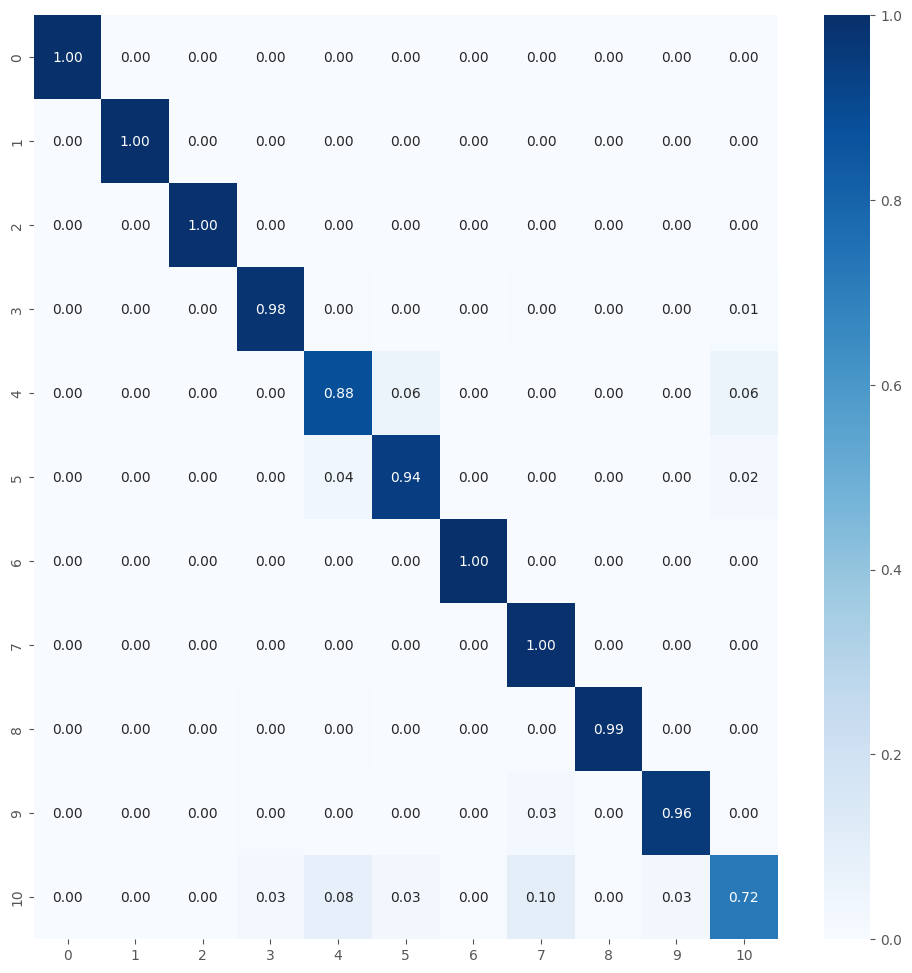


TRAINING AND EVALUATING FOLD 3/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150011_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
360/360 [==============================] - 77s 193ms/step - loss: 0.0563 - accuracy: 0.9953 - val_loss: 0.3172 - val_accuracy: 0.9428 - lr: 1.4116e-04
Epoch 2/50
360/360 [==============================] - 59s 164ms/step - loss: 0.0525 - accuracy: 0.9950 - val_loss: 0.3025 - val_accuracy: 0.9460 - lr: 1.4116e-04
Epoch 3/50
360/360 [==============================] - 57s 157ms/step - loss: 0.0472 - accuracy: 0.9954 - val_loss: 0.3249 - val_accuracy: 0.9481 - lr: 1.4116e-04
Epoch 4/50
360/360 [==============================] - 59s 163ms/step - loss: 0.0456 - accuracy: 0.9957 - val_loss: 0.3012 - val_accuracy: 0.9485 - lr: 1.4116e-04
Epoch 5/50
360/360 [==============================] - 68s 190ms/step - loss: 0.0415 - accuracy: 0.9962 - val_loss: 0.2969 - 

History for fold 3 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150011_3.pkl
361/361 [==============================] - 46s 128ms/step - loss: 0.0305 - accuracy: 0.9977
Train Accuracy: 0.997662365436554
Train Log Loss: 0.030485184863209724
78/78 [==============================] - 10s 127ms/step - loss: 0.2909 - accuracy: 0.9507
Validation Accuracy: 0.9507070779800415
Validation Log Loss: 0.29094111919403076
78/78 [==============================] - 10s 125ms/step - loss: 0.2630 - accuracy: 0.9531
Test Accuracy: 0.9531313180923462
Test Log Loss: 0.26303791999816895
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'dinwod': 4, 'ganelp': 5, 'mira': 6, 'sfone': 7, 'sillyp2p': 8, 'wabot': 9, 'wacatac': 10}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0]
 [  0 224   0   0   0   0   0   0   0   0   1]
 [  0   0 224   0   0   0   0   0   0   1   0]
 [  0   0   0 221   1   0   0   1   0   0   2]
 [  0   0   0   0 199  11   0   0   0   0 

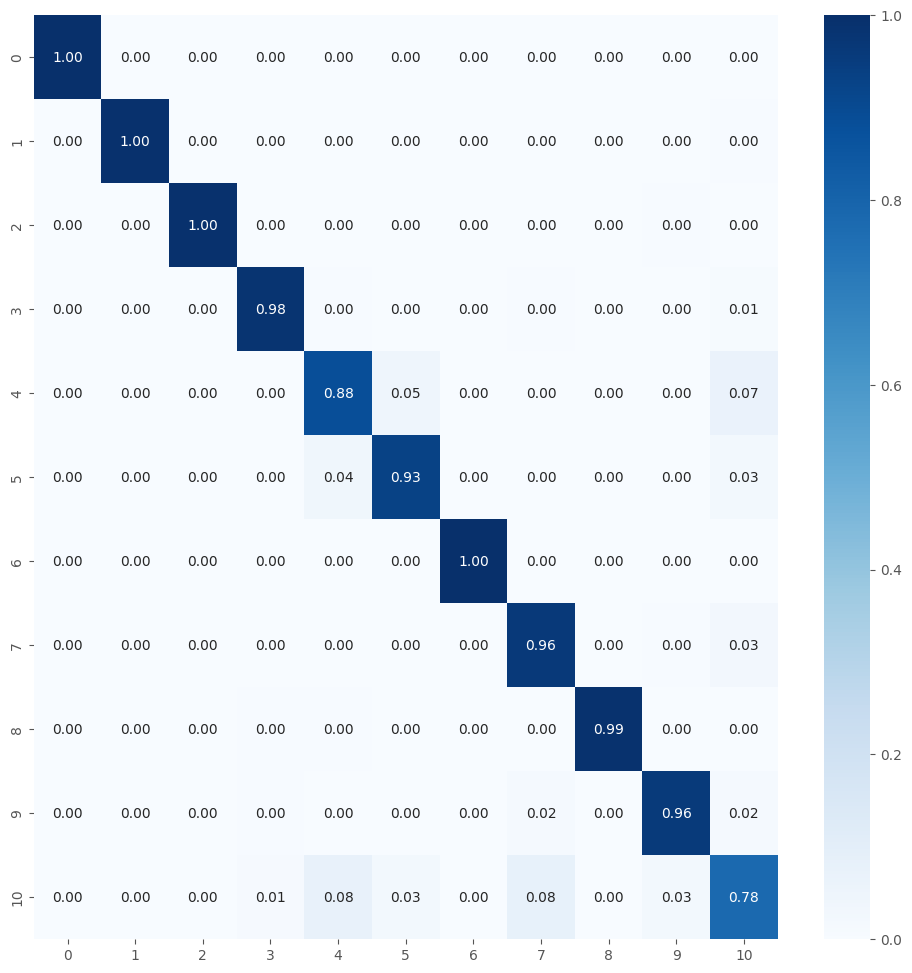


TRAINING AND EVALUATING FOLD 4/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150011_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
360/360 [==============================] - 66s 165ms/step - loss: 0.0577 - accuracy: 0.9946 - val_loss: 0.3247 - val_accuracy: 0.9464 - lr: 1.4116e-04
Epoch 2/50
360/360 [==============================] - 58s 161ms/step - loss: 0.0526 - accuracy: 0.9943 - val_loss: 0.2947 - val_accuracy: 0.9476 - lr: 1.4116e-04
Epoch 3/50
360/360 [==============================] - 57s 158ms/step - loss: 0.0482 - accuracy: 0.9957 - val_loss: 0.3077 - val_accuracy: 0.9513 - lr: 1.4116e-04
Epoch 4/50
360/360 [==============================] - 58s 162ms/step - loss: 0.0447 - accuracy: 0.9957 - val_loss: 0.3091 - val_accuracy: 0.9493 - lr: 1.4116e-04
Epoch 5/50
360/360 [==============================] - 71s 196ms/step - loss: 0.0441 - accuracy: 0.9958 - val_loss: 0.2919 - 

History for fold 4 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150011_4.pkl
361/361 [==============================] - 44s 121ms/step - loss: 0.0272 - accuracy: 0.9977
Train Accuracy: 0.9977489113807678
Train Log Loss: 0.02717648446559906
78/78 [==============================] - 10s 122ms/step - loss: 0.3022 - accuracy: 0.9523
Validation Accuracy: 0.9523232579231262
Validation Log Loss: 0.302182674407959
78/78 [==============================] - 9s 119ms/step - loss: 0.2606 - accuracy: 0.9523
Test Accuracy: 0.9523232579231262
Test Log Loss: 0.260563462972641
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'dinwod': 4, 'ganelp': 5, 'mira': 6, 'sfone': 7, 'sillyp2p': 8, 'wabot': 9, 'wacatac': 10}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   1   0]
 [  0   0   0 220   1   0   1   1   0   0   2]
 [  0   0   0   0 197  11   0   0   0   0  17]


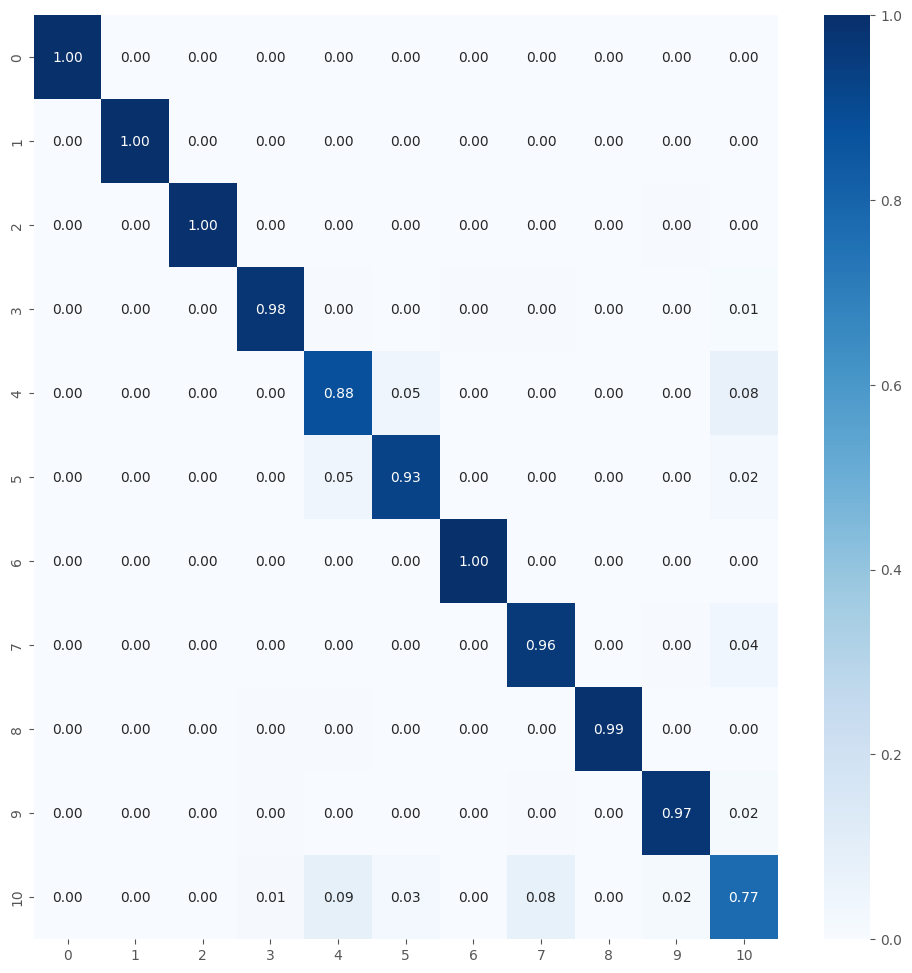


TRAINING AND EVALUATING FOLD 5/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150011_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
360/360 [==============================] - 71s 176ms/step - loss: 0.0580 - accuracy: 0.9947 - val_loss: 0.3000 - val_accuracy: 0.9501 - lr: 1.4116e-04
Epoch 2/50
360/360 [==============================] - 59s 163ms/step - loss: 0.0518 - accuracy: 0.9950 - val_loss: 0.2975 - val_accuracy: 0.9448 - lr: 1.4116e-04
Epoch 3/50
360/360 [==============================] - 71s 196ms/step - loss: 0.0481 - accuracy: 0.9954 - val_loss: 0.3155 - val_accuracy: 0.9448 - lr: 1.4116e-04
Epoch 4/50
360/360 [==============================] - 68s 189ms/step - loss: 0.0455 - accuracy: 0.9949 - val_loss: 0.3049 - val_accuracy: 0.9481 - lr: 1.4116e-04
Epoch 5/50
360/360 [==============================] - 67s 187ms/step - loss: 0.0451 - accuracy: 0.9945 - val_loss: 0.3139 - 

History for fold 5 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150011_5.pkl
361/361 [==============================] - 51s 139ms/step - loss: 0.0298 - accuracy: 0.9974
Train Accuracy: 0.9974026083946228
Train Log Loss: 0.029750825837254524
78/78 [==============================] - 12s 151ms/step - loss: 0.2888 - accuracy: 0.9531
Validation Accuracy: 0.9531313180923462
Validation Log Loss: 0.2888175845146179
78/78 [==============================] - 12s 146ms/step - loss: 0.2562 - accuracy: 0.9547
Test Accuracy: 0.9547474980354309
Test Log Loss: 0.2562376856803894
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'dinwod': 4, 'ganelp': 5, 'mira': 6, 'sfone': 7, 'sillyp2p': 8, 'wabot': 9, 'wacatac': 10}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   1   0]
 [  0   0   0 219   1   0   2   1   0   0   2]
 [  0   0   0   0 202   8   0   0   0   0  

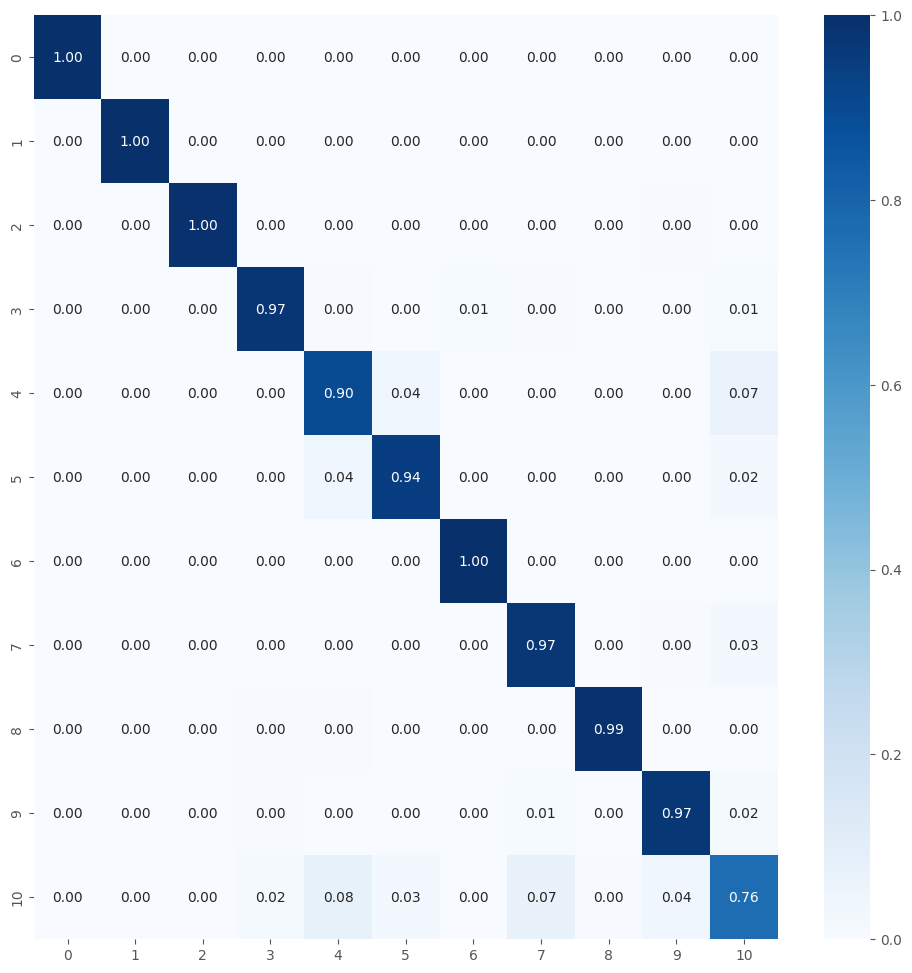


Best fold was 5 with val_accuracy: 0.9529
Average training accuracy in 5-fold: 0.9966487169265748
Average validation precision in 5-fold: 0.9517857313156128

Test Metrics
test_acc_list: [0.9531313180923462, 0.9519191980361938, 0.9531313180923462, 0.9523232579231262, 0.9547474980354309]
Average Test Accuracy with 5-fold: 0.9530505180358887
test_loss_list: [0.27006909251213074, 0.2999309301376343, 0.26303791999816895, 0.260563462972641, 0.2562376856803894]
Average Test Log Loss with 5-fold: 0.2699678182601929

Precision List: [0.952771322641424, 0.9517357059308569, 0.952856721365259, 0.9519829544001813, 0.954134661022729]
Average Precision List with 5-fold: 0.95269627307209
Recall List: [0.953131313131313, 0.9519191919191919, 0.9531313131313133, 0.9523232323232323, 0.9547474747474748]
Average Recall List with 5-fold: 0.953050505050505
F1 Score List: [0.9527658510520354, 0.9507249832161994, 0.9528117590535383, 0.9520053607926561, 0.9541913769071196]
Average F1 Score List with 5-fold: 0.9

In [19]:
%%time

num_classes = 11
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, precision_list_all, 
    recall_list_all, f1_score_list_all)

[I 2025-06-16 04:57:50,659] A new study created in memory with name: malware_classification_12classes


Familias de malware copiadas
source2: /notebooks/train3/all_malware/12
name_save_model: MobileNet_tf_150012
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
- Allaple.A
- Ramnit
- wabot
- mira
- Kelihos_ver3
- ganelp
- Allaple.L
- wacatac
- dinwod
- Lollipop
model_path: /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150012_best.h5

Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150012_best.h5
Successfully loaded and modified pretrained model
Found 12600 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.


[I 2025-06-16 05:11:13,360] Trial 0 finished with values: [0.9501488208770752, 0.27107295393943787] and parameters: {'learning_rate': 4.615980870126966e-05, 'dropout_rate1': 0.3758192420896606, 'dropout_rate2': 0.3052605447891348, 'l2_reg': 0.001865519496771932, 'units_dense1': 512, 'units_dense2': 256, 'num_dense_layers': 3, 'unfreeze_layers': 5, 'early_stopping_patience': 10, 'reduce_lr_patience': 9, 'fine_tune_learning_rate': 2.474607329307775e-06, 'units_dense3': 32, 'dropout_rate3': 0.21675430732612666}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150012_best.h5
Successfully loaded and modified pretrained model
Found 12600 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.


[I 2025-06-16 05:28:43,797] Trial 1 finished with values: [0.9538690447807312, 0.285759836435318] and parameters: {'learning_rate': 0.004420182132458693, 'dropout_rate1': 0.2071460181539423, 'dropout_rate2': 0.46409003824659456, 'l2_reg': 0.008051087328281534, 'units_dense1': 256, 'units_dense2': 128, 'num_dense_layers': 3, 'unfreeze_layers': 14, 'early_stopping_patience': 15, 'reduce_lr_patience': 12, 'fine_tune_learning_rate': 9.133585370126541e-06, 'units_dense3': 64, 'dropout_rate3': 0.12718049947322813}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150012_best.h5
Successfully loaded and modified pretrained model
Found 12600 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.


[I 2025-06-16 05:58:46,055] Trial 2 finished with values: [0.9538690447807312, 0.2877436578273773] and parameters: {'learning_rate': 7.808667598549251e-05, 'dropout_rate1': 0.22826838123618157, 'dropout_rate2': 0.41995757709710335, 'l2_reg': 6.515388907515546e-05, 'units_dense1': 1024, 'units_dense2': 256, 'num_dense_layers': 2, 'unfreeze_layers': 13, 'early_stopping_patience': 15, 'reduce_lr_patience': 10, 'fine_tune_learning_rate': 2.6717422744427502e-05}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150012_best.h5
Successfully loaded and modified pretrained model
Found 12600 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.


[I 2025-06-16 06:12:15,488] Trial 3 finished with values: [0.9508928656578064, 0.286415159702301] and parameters: {'learning_rate': 0.00985567366403476, 'dropout_rate1': 0.39687451830105347, 'dropout_rate2': 0.39236311607176366, 'l2_reg': 2.4197192063199704e-05, 'units_dense1': 256, 'units_dense2': 64, 'num_dense_layers': 2, 'unfreeze_layers': 6, 'early_stopping_patience': 10, 'reduce_lr_patience': 9, 'fine_tune_learning_rate': 1.8577439268584664e-05}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150012_best.h5
Successfully loaded and modified pretrained model
Found 12600 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.


[I 2025-06-16 06:39:29,355] Trial 4 finished with values: [0.9538690447807312, 0.28005385398864746] and parameters: {'learning_rate': 0.00252186632108605, 'dropout_rate1': 0.5288910013063362, 'dropout_rate2': 0.22321082285536462, 'l2_reg': 0.0030175219660153896, 'units_dense1': 256, 'units_dense2': 256, 'num_dense_layers': 2, 'unfreeze_layers': 12, 'early_stopping_patience': 19, 'reduce_lr_patience': 10, 'fine_tune_learning_rate': 5.246735093216911e-05}.
/tmp/ipykernel_27/3900254938.py:136: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


Mejores trials para cada objetivo:
  Trial 0:
    val_accuracy: 0.9501
    val_loss: 0.2711
    Parámetros: {'learning_rate': 4.615980870126966e-05, 'dropout_rate1': 0.3758192420896606, 'dropout_rate2': 0.3052605447891348, 'l2_reg': 0.001865519496771932, 'units_dense1': 512, 'units_dense2': 256, 'num_dense_layers': 3, 'unfreeze_layers': 5, 'early_stopping_patience': 10, 'reduce_lr_patience': 9, 'fine_tune_learning_rate': 2.474607329307775e-06, 'units_dense3': 32, 'dropout_rate3': 0.21675430732612666}
  Trial 4:
    val_accuracy: 0.9539
    val_loss: 0.2801
    Parámetros: {'learning_rate': 0.00252186632108605, 'dropout_rate1': 0.5288910013063362, 'dropout_rate2': 0.22321082285536462, 'l2_reg': 0.0030175219660153896, 'units_dense1': 256, 'units_dense2': 256, 'num_dense_layers': 2, 'unfreeze_layers': 12, 'early_stopping_patience': 19, 'reduce_lr_patience': 10, 'fine_tune_learning_rate': 5.246735093216911e-05}


<Figure size 700x500 with 0 Axes>

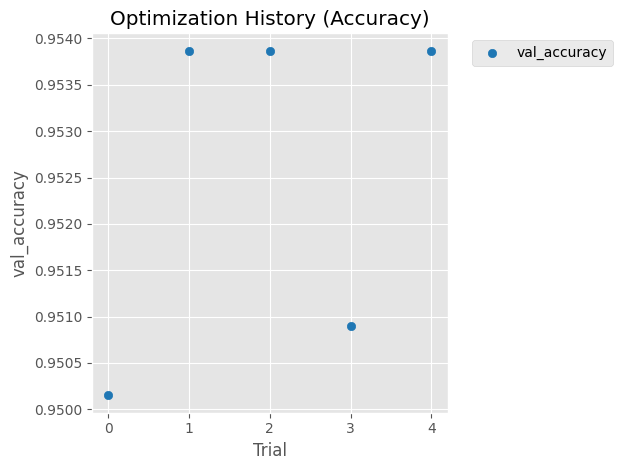

/tmp/ipykernel_27/3900254938.py:147: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

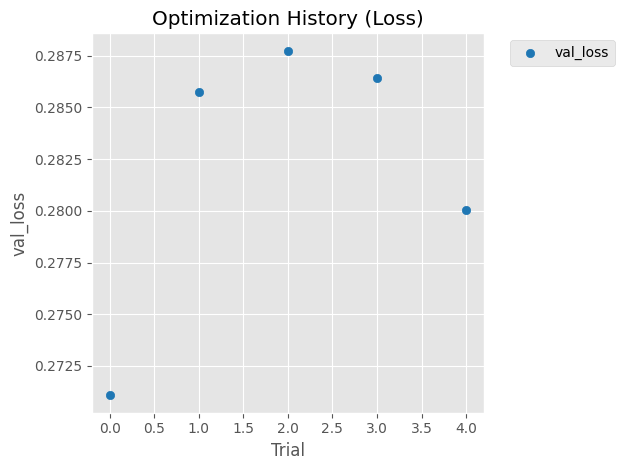

/tmp/ipykernel_27/3900254938.py:185: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Figure size 700x500 with 0 Axes>

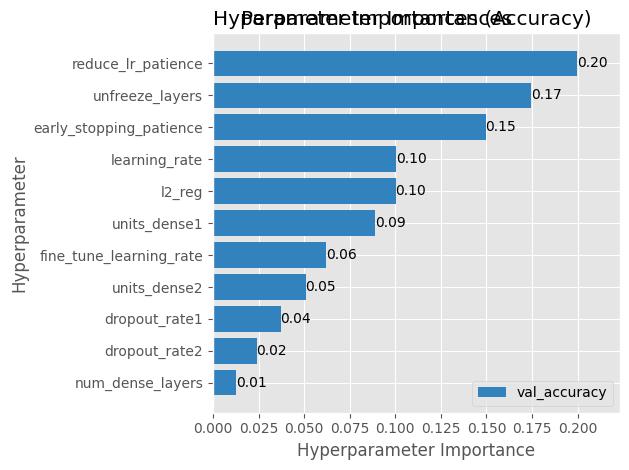

Found 12600 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.

TRAINING AND EVALUATING FOLD 1/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150012_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
393/393 [==============================] - 74s 162ms/step - loss: 0.0556 - accuracy: 0.9949 - val_loss: 0.2756 - val_accuracy: 0.9483 - lr: 4.6160e-06
Epoch 2/50
393/393 [==============================] - 61s 155ms/step - loss: 0.0548 - accuracy: 0.9956 - val_loss: 0.2758 - val_accuracy: 0.9483 - lr: 4.6160e-06
Epoch 3/50
393/393 [==============================] - 62s 158ms/step - loss: 0.0559 - accuracy: 0.9947 - val_loss: 0.2761 - val_accuracy: 0.9487 - lr: 4.6160e-06
Epoch 4/50
393/393 [==============================] - 70s 179ms/step - loss: 0.0540 - accuracy: 0.9956 - val_loss: 0.2773 - val_accuracy: 0.9487 - lr: 4.616

History for fold 1 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150012_1.pkl
394/394 [==============================] - 52s 132ms/step - loss: 0.0479 - accuracy: 0.9968
Train Accuracy: 0.9968253970146179
Train Log Loss: 0.047930099070072174
85/85 [==============================] - 11s 132ms/step - loss: 0.2812 - accuracy: 0.9504
Validation Accuracy: 0.9503703713417053
Validation Log Loss: 0.2811891436576843
85/85 [==============================] - 13s 149ms/step - loss: 0.2642 - accuracy: 0.9533
Test Accuracy: 0.95333331823349
Test Log Loss: 0.2642342746257782
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'dinwod': 5, 'ganelp': 6, 'mira': 7, 'sfone': 8, 'sillyp2p': 9, 'wabot': 10, 'wacatac': 11}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   1   0]
 [  0   0   0 221   2   1   0   0   1   0   0   0]
 [  0   0   0

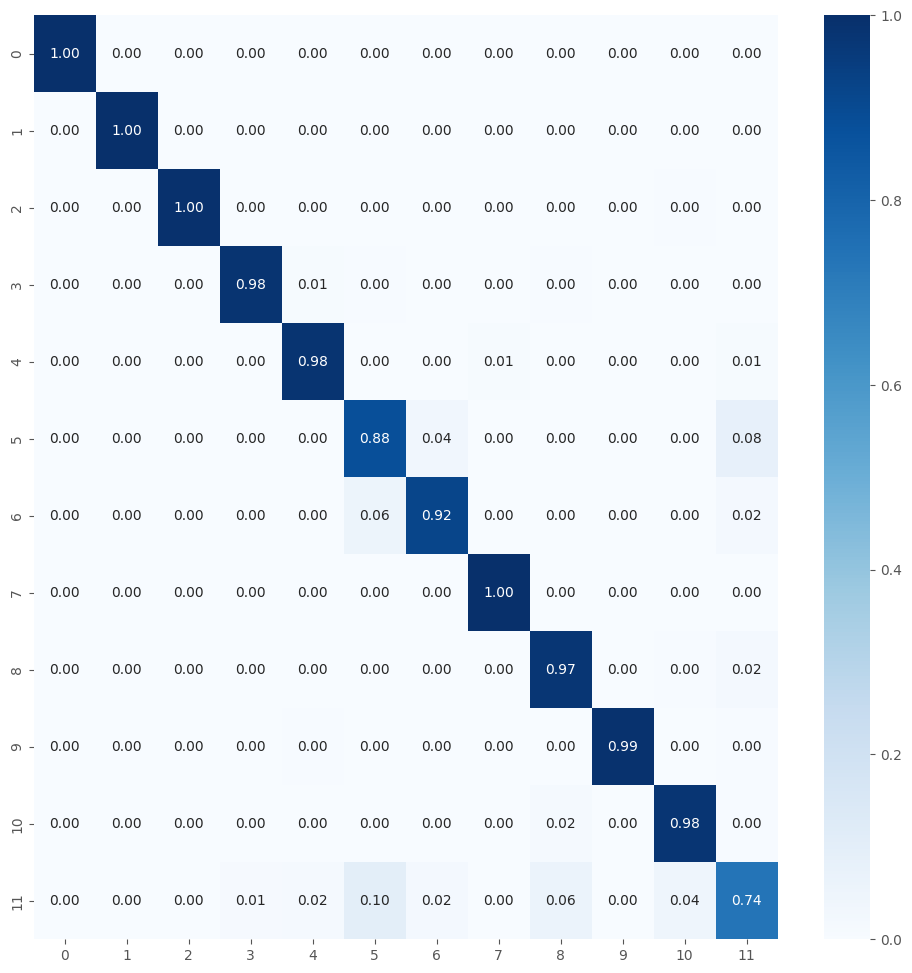


TRAINING AND EVALUATING FOLD 2/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150012_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
393/393 [==============================] - 86s 199ms/step - loss: 0.0569 - accuracy: 0.9949 - val_loss: 0.2724 - val_accuracy: 0.9483 - lr: 4.6160e-06
Epoch 2/50
393/393 [==============================] - 63s 159ms/step - loss: 0.0555 - accuracy: 0.9961 - val_loss: 0.2735 - val_accuracy: 0.9498 - lr: 4.6160e-06
Epoch 3/50
393/393 [==============================] - 63s 161ms/step - loss: 0.0542 - accuracy: 0.9963 - val_loss: 0.2759 - val_accuracy: 0.9498 - lr: 4.6160e-06
Epoch 4/50
393/393 [==============================] - 61s 155ms/step - loss: 0.0546 - accuracy: 0.9953 - val_loss: 0.2773 - val_accuracy: 0.9494 - lr: 4.6160e-06
Epoch 5/50
393/393 [==============================] - 76s 193ms/step - loss: 0.0537 - accuracy: 0.9955 - val_loss: 0.2780 - 

History for fold 2 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150012_2.pkl
394/394 [==============================] - 54s 137ms/step - loss: 0.0490 - accuracy: 0.9966
Train Accuracy: 0.9965872764587402
Train Log Loss: 0.04900739714503288
85/85 [==============================] - 11s 130ms/step - loss: 0.2787 - accuracy: 0.9504
Validation Accuracy: 0.9503703713417053
Validation Log Loss: 0.2786533534526825
85/85 [==============================] - 12s 133ms/step - loss: 0.2633 - accuracy: 0.9530
Test Accuracy: 0.9529629349708557
Test Log Loss: 0.2632855474948883
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'dinwod': 5, 'ganelp': 6, 'mira': 7, 'sfone': 8, 'sillyp2p': 9, 'wabot': 10, 'wacatac': 11}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   1   0]
 [  0   0   0 221   2   1   0   0   1   0   0   0]
 [  0   0   

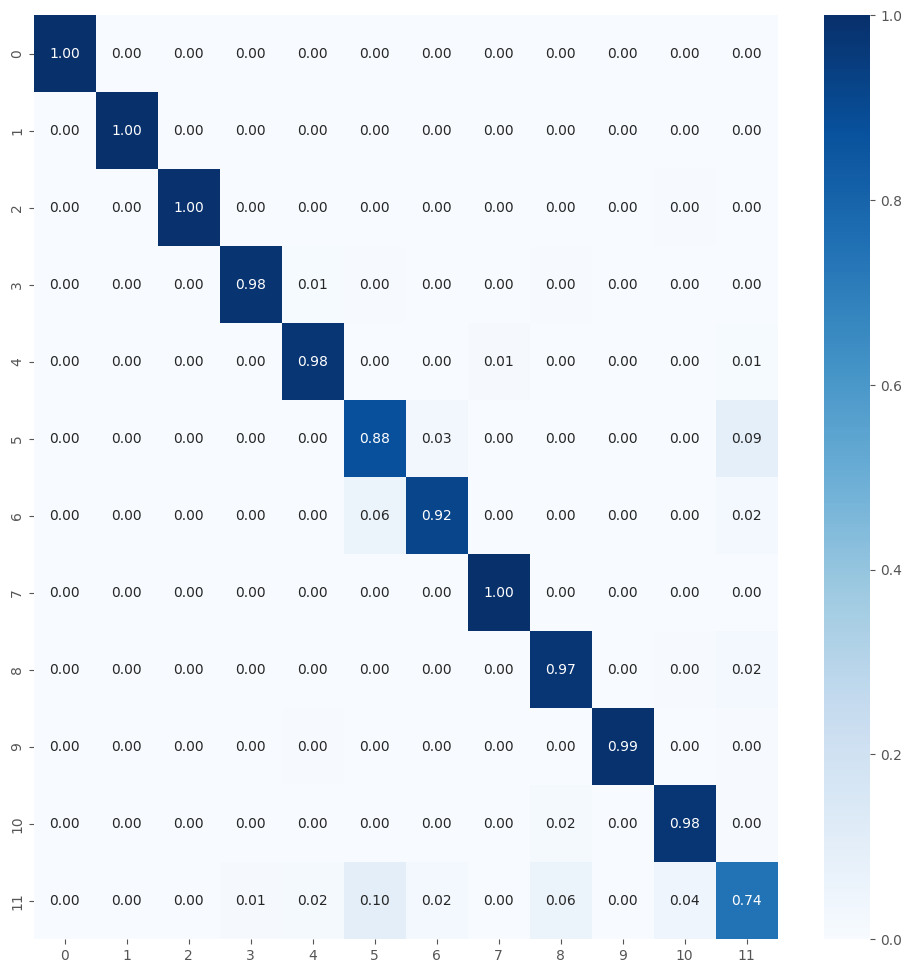


TRAINING AND EVALUATING FOLD 3/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150012_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
393/393 [==============================] - 72s 163ms/step - loss: 0.0567 - accuracy: 0.9946 - val_loss: 0.2730 - val_accuracy: 0.9483 - lr: 4.6160e-06
Epoch 2/50
393/393 [==============================] - 58s 146ms/step - loss: 0.0545 - accuracy: 0.9952 - val_loss: 0.2746 - val_accuracy: 0.9494 - lr: 4.6160e-06
Epoch 3/50
393/393 [==============================] - 60s 153ms/step - loss: 0.0545 - accuracy: 0.9957 - val_loss: 0.2767 - val_accuracy: 0.9487 - lr: 4.6160e-06
Epoch 4/50
393/393 [==============================] - 60s 153ms/step - loss: 0.0541 - accuracy: 0.9957 - val_loss: 0.2769 - val_accuracy: 0.9487 - lr: 4.6160e-06
Epoch 5/50
393/393 [==============================] - 62s 157ms/step - loss: 0.0546 - accuracy: 0.9951 - val_loss: 0.2787 - 

History for fold 3 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150012_3.pkl
394/394 [==============================] - 56s 142ms/step - loss: 0.0481 - accuracy: 0.9968
Train Accuracy: 0.9968253970146179
Train Log Loss: 0.04807648807764053
85/85 [==============================] - 12s 134ms/step - loss: 0.2804 - accuracy: 0.9511
Validation Accuracy: 0.9511111378669739
Validation Log Loss: 0.28042784333229065
85/85 [==============================] - 11s 129ms/step - loss: 0.2639 - accuracy: 0.9533
Test Accuracy: 0.95333331823349
Test Log Loss: 0.2638857066631317
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'dinwod': 5, 'ganelp': 6, 'mira': 7, 'sfone': 8, 'sillyp2p': 9, 'wabot': 10, 'wacatac': 11}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   1   0]
 [  0   0   0 221   2   1   0   0   1   0   0   0]
 [  0   0   0

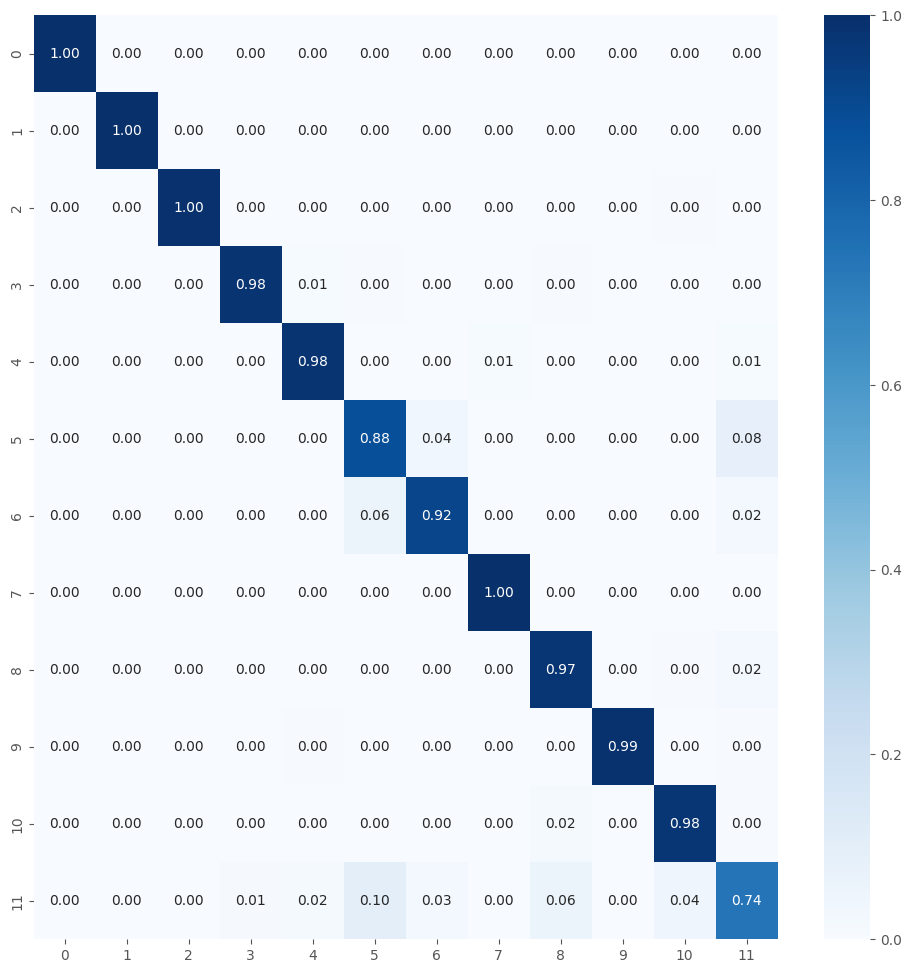


TRAINING AND EVALUATING FOLD 4/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150012_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
393/393 [==============================] - 78s 180ms/step - loss: 0.0567 - accuracy: 0.9947 - val_loss: 0.2752 - val_accuracy: 0.9483 - lr: 4.6160e-06
Epoch 2/50
393/393 [==============================] - 64s 163ms/step - loss: 0.0561 - accuracy: 0.9952 - val_loss: 0.2721 - val_accuracy: 0.9487 - lr: 4.6160e-06
Epoch 3/50
393/393 [==============================] - 64s 162ms/step - loss: 0.0543 - accuracy: 0.9960 - val_loss: 0.2765 - val_accuracy: 0.9490 - lr: 4.6160e-06
Epoch 4/50
393/393 [==============================] - 65s 165ms/step - loss: 0.0543 - accuracy: 0.9957 - val_loss: 0.2772 - val_accuracy: 0.9494 - lr: 4.6160e-06
Epoch 5/50
393/393 [==============================] - 63s 161ms/step - loss: 0.0539 - accuracy: 0.9955 - val_loss: 0.2765 - 

History for fold 4 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150012_4.pkl
394/394 [==============================] - 55s 139ms/step - loss: 0.0483 - accuracy: 0.9967
Train Accuracy: 0.9967460036277771
Train Log Loss: 0.04829561337828636
85/85 [==============================] - 14s 159ms/step - loss: 0.2800 - accuracy: 0.9515
Validation Accuracy: 0.9514814615249634
Validation Log Loss: 0.27998632192611694
85/85 [==============================] - 14s 157ms/step - loss: 0.2641 - accuracy: 0.9533
Test Accuracy: 0.95333331823349
Test Log Loss: 0.2640729546546936
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'dinwod': 5, 'ganelp': 6, 'mira': 7, 'sfone': 8, 'sillyp2p': 9, 'wabot': 10, 'wacatac': 11}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   1   0]
 [  0   0   0 221   2   1   0   0   1   0   0   0]
 [  0   0   0

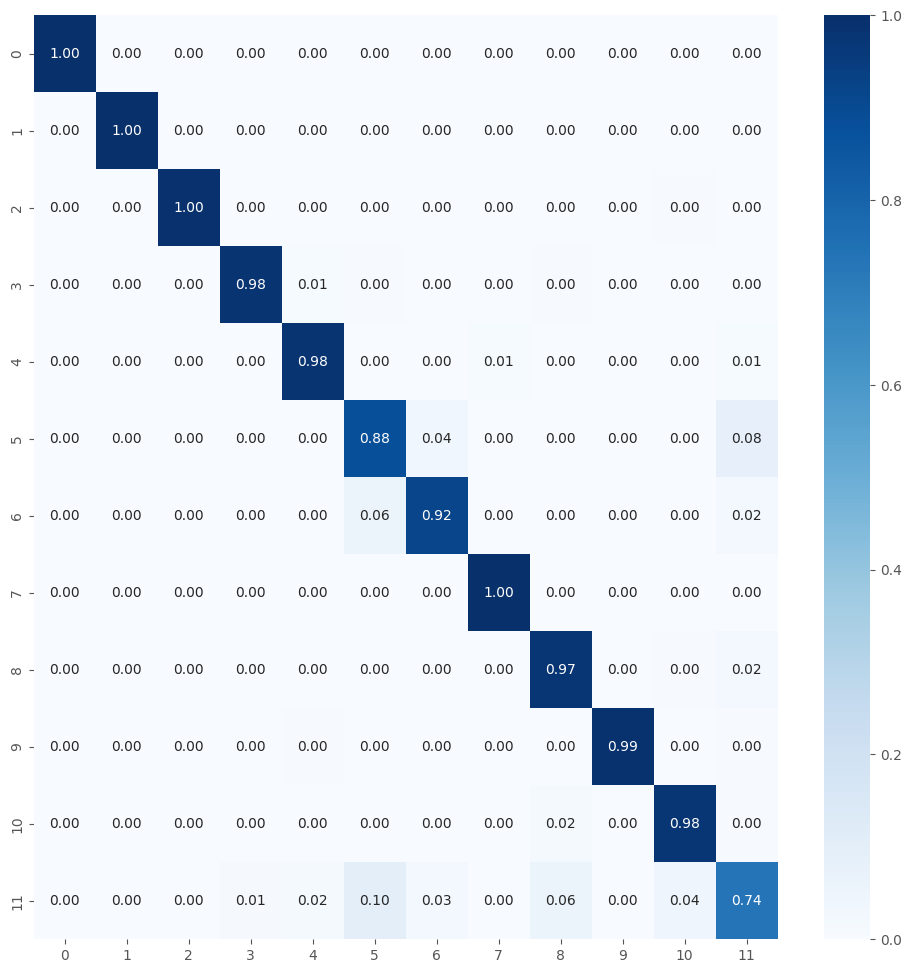


TRAINING AND EVALUATING FOLD 5/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150012_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
393/393 [==============================] - 89s 204ms/step - loss: 0.0567 - accuracy: 0.9949 - val_loss: 0.2754 - val_accuracy: 0.9483 - lr: 4.6160e-06
Epoch 2/50
393/393 [==============================] - 77s 197ms/step - loss: 0.0544 - accuracy: 0.9959 - val_loss: 0.2749 - val_accuracy: 0.9483 - lr: 4.6160e-06
Epoch 3/50
393/393 [==============================] - 77s 195ms/step - loss: 0.0536 - accuracy: 0.9955 - val_loss: 0.2766 - val_accuracy: 0.9483 - lr: 4.6160e-06
Epoch 4/50
393/393 [==============================] - 74s 187ms/step - loss: 0.0541 - accuracy: 0.9951 - val_loss: 0.2767 - val_accuracy: 0.9490 - lr: 4.6160e-06
Epoch 5/50
393/393 [==============================] - 77s 195ms/step - loss: 0.0538 - accuracy: 0.9954 - val_loss: 0.2755 - 

History for fold 5 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150012_5.pkl
394/394 [==============================] - 52s 131ms/step - loss: 0.0477 - accuracy: 0.9968
Train Accuracy: 0.9968253970146179
Train Log Loss: 0.047745417803525925
85/85 [==============================] - 11s 132ms/step - loss: 0.2823 - accuracy: 0.9515
Validation Accuracy: 0.9514814615249634
Validation Log Loss: 0.2822500169277191
85/85 [==============================] - 11s 124ms/step - loss: 0.2653 - accuracy: 0.9537
Test Accuracy: 0.9537037014961243
Test Log Loss: 0.26528510451316833
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'dinwod': 5, 'ganelp': 6, 'mira': 7, 'sfone': 8, 'sillyp2p': 9, 'wabot': 10, 'wacatac': 11}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   1   0]
 [  0   0   0 221   2   1   0   0   1   0   0   0]
 [  0   0 

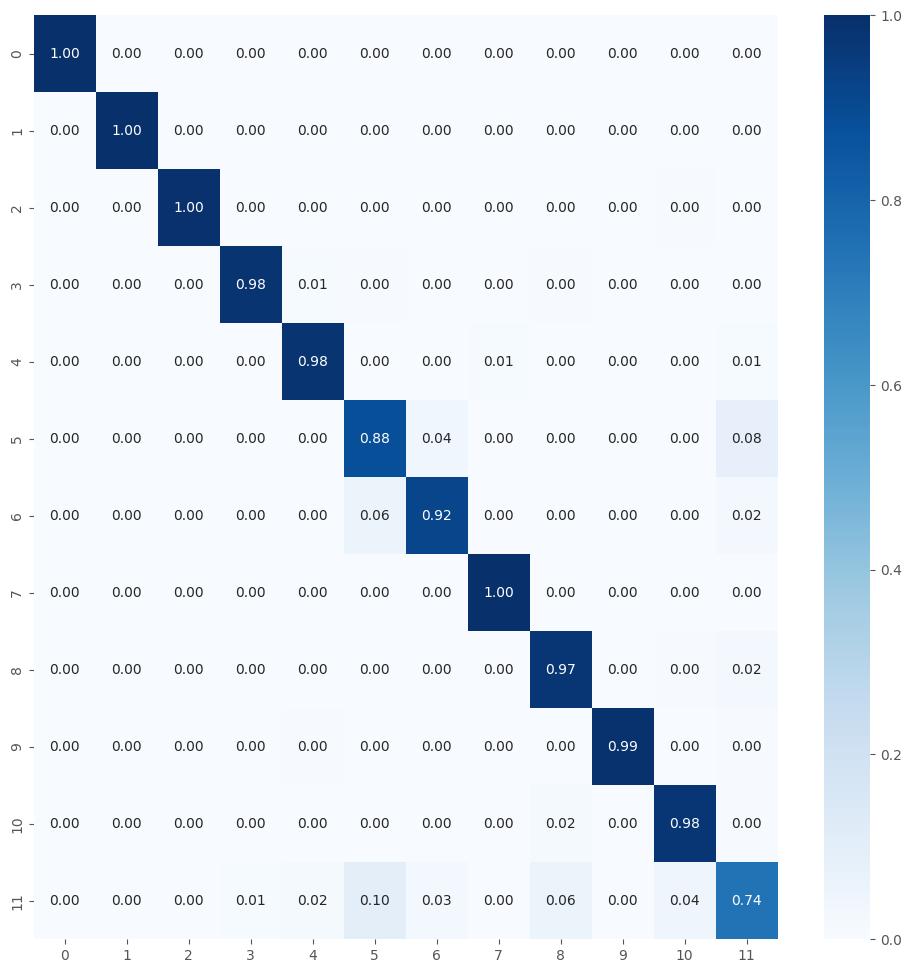


Best fold was 4 with val_accuracy: 0.9524
Average training accuracy in 5-fold: 0.9965149521827698
Average validation precision in 5-fold: 0.9517857074737549

Test Metrics
test_acc_list: [0.95333331823349, 0.9529629349708557, 0.95333331823349, 0.95333331823349, 0.9537037014961243]
Average Test Accuracy with 5-fold: 0.95333331823349
test_loss_list: [0.2642342746257782, 0.2632855474948883, 0.2638857066631317, 0.2640729546546936, 0.26528510451316833]
Average Test Log Loss with 5-fold: 0.26415271759033204

Precision List: [0.9527643234791349, 0.9523964361079247, 0.9527095857679516, 0.9527095857679516, 0.953147368518454]
Average Precision List with 5-fold: 0.9527454599282834
Recall List: [0.9533333333333333, 0.952962962962963, 0.9533333333333333, 0.9533333333333333, 0.9537037037037037]
Average Recall List with 5-fold: 0.9533333333333331
F1 Score List: [0.9526701424668472, 0.9523684678083174, 0.9526526070707116, 0.9526526070707116, 0.9530743427639803]
Average F1 Score List with 5-fold: 0.952

In [20]:
%%time

num_classes = 12
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, precision_list_all, 
    recall_list_all, f1_score_list_all)

In [1]:
test_acc_list_all = [1.0, 1.0, 0.9975555419921875, 0.9941333293914795, 0.9956543445587158, 0.9746666669845581, 0.9530505180358887, 0.95333331823349]
test_loss_list_all = [0.09954872727394104, 0.01098769661039114, 0.02537739872932434, 0.1057829350233078, 0.03474916815757752, 0.1860918253660202, 0.2699678182601929, 0.26415271759033204]
precision_list_all = [1.0, 1.0, 0.9975721933007347, 0.9941481258504729, 0.9956890425754918, 0.9747391794607386, 0.95269627307209, 0.9527454599282834]
recall_list_all = [1.0, 1.0, 0.9975555555555555, 0.9941333333333334, 0.9956543209876543, 0.9746666666666668, 0.953050505050505, 0.9533333333333331]
f1_score_list_all = [1.0, 1.0, 0.9975555171460664, 0.9941352639710768, 0.9956528158288066, 0.9742301491986917, 0.9524998662043098, 0.9526836334361135]

8


[I 2025-06-16 11:40:34,985] A new study created in memory with name: malware_classification_13classes


Familias de malware copiadas
source2: /notebooks/train3/all_malware/13
name_save_model: MobileNet_tf_150013
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
- Allaple.A
- Ramnit
- wabot
- mira
- Kelihos_ver3
- ganelp
- Allaple.L
- wacatac
- dinwod
- Lollipop
- berbew
model_path: /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150013_best.h5

Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150013_best.h5


2025-06-16 11:40:35.553100: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 1197 MB memory:  -> device: 0, name: NVIDIA RTX A5500, pci bus id: 0000:1d:00.0, compute capability: 8.6


Successfully loaded and modified pretrained model
Found 13650 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.


2025-06-16 11:40:47.487220: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8906
2025-06-16 11:40:52.787161: I external/local_xla/xla/service/service.cc:168] XLA service 0x7f97f58991f0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-06-16 11:40:52.787240: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA RTX A5500, Compute Capability 8.6
2025-06-16 11:40:52.808062: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1750074053.043679     258 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
[I 2025-06-16 12:29:47,864] Trial 0 finished with values: [0.9577609896659851, 0.24881243705749512] and parameters: {'learning_rate': 8.963726020629074e-05, 'dropout_rate1': 0.336816770830381, 'dropout_r


Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150013_best.h5
Successfully loaded and modified pretrained model
Found 13650 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.


[I 2025-06-16 13:15:28,263] Trial 1 finished with values: [0.9570741653442383, 0.2586227357387543] and parameters: {'learning_rate': 0.0001425448799019718, 'dropout_rate1': 0.22998761691335395, 'dropout_rate2': 0.26182009203590983, 'l2_reg': 0.0010942408423715363, 'units_dense1': 512, 'units_dense2': 128, 'num_dense_layers': 3, 'unfreeze_layers': 8, 'early_stopping_patience': 15, 'reduce_lr_patience': 15, 'fine_tune_learning_rate': 4.016621534187079e-05, 'units_dense3': 64, 'dropout_rate3': 0.24401646837673402}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150013_best.h5
Successfully loaded and modified pretrained model
Found 13650 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.


[I 2025-06-16 13:40:03,972] Trial 2 finished with values: [0.9563873410224915, 0.2558336853981018] and parameters: {'learning_rate': 0.0006495380195905377, 'dropout_rate1': 0.3573109601122247, 'dropout_rate2': 0.38663116517022245, 'l2_reg': 5.231184323070826e-05, 'units_dense1': 1024, 'units_dense2': 64, 'num_dense_layers': 2, 'unfreeze_layers': 12, 'early_stopping_patience': 19, 'reduce_lr_patience': 15, 'fine_tune_learning_rate': 4.374469566908178e-06}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150013_best.h5
Successfully loaded and modified pretrained model
Found 13650 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.


[I 2025-06-16 14:08:32,841] Trial 3 finished with values: [0.9553571343421936, 0.24874314665794373] and parameters: {'learning_rate': 0.0003737926499112115, 'dropout_rate1': 0.3994471474738487, 'dropout_rate2': 0.22092998742201853, 'l2_reg': 0.004326402946535873, 'units_dense1': 1024, 'units_dense2': 128, 'num_dense_layers': 3, 'unfreeze_layers': 5, 'early_stopping_patience': 17, 'reduce_lr_patience': 9, 'fine_tune_learning_rate': 4.40186962902792e-06, 'units_dense3': 64, 'dropout_rate3': 0.1729748995973612}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150013_best.h5
Successfully loaded and modified pretrained model
Found 13650 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.


[I 2025-06-16 14:31:38,244] Trial 4 finished with values: [0.9570741653442383, 0.26109910011291504] and parameters: {'learning_rate': 0.006750467625344838, 'dropout_rate1': 0.5946122107835046, 'dropout_rate2': 0.364550243573609, 'l2_reg': 0.0063532616409568855, 'units_dense1': 256, 'units_dense2': 64, 'num_dense_layers': 3, 'unfreeze_layers': 11, 'early_stopping_patience': 17, 'reduce_lr_patience': 10, 'fine_tune_learning_rate': 1.188427151026231e-05, 'units_dense3': 128, 'dropout_rate3': 0.2305542361848961}.
/tmp/ipykernel_25/3900254938.py:136: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


Mejores trials para cada objetivo:
  Trial 0:
    val_accuracy: 0.9578
    val_loss: 0.2488
    Parámetros: {'learning_rate': 8.963726020629074e-05, 'dropout_rate1': 0.336816770830381, 'dropout_rate2': 0.3795407027751928, 'l2_reg': 0.0001453324858611224, 'units_dense1': 512, 'units_dense2': 256, 'num_dense_layers': 3, 'unfreeze_layers': 8, 'early_stopping_patience': 15, 'reduce_lr_patience': 9, 'fine_tune_learning_rate': 5.3743200328877764e-05, 'units_dense3': 128, 'dropout_rate3': 0.1258925007090432}
  Trial 3:
    val_accuracy: 0.9554
    val_loss: 0.2487
    Parámetros: {'learning_rate': 0.0003737926499112115, 'dropout_rate1': 0.3994471474738487, 'dropout_rate2': 0.22092998742201853, 'l2_reg': 0.004326402946535873, 'units_dense1': 1024, 'units_dense2': 128, 'num_dense_layers': 3, 'unfreeze_layers': 5, 'early_stopping_patience': 17, 'reduce_lr_patience': 9, 'fine_tune_learning_rate': 4.40186962902792e-06, 'units_dense3': 64, 'dropout_rate3': 0.1729748995973612}


<Figure size 700x500 with 0 Axes>

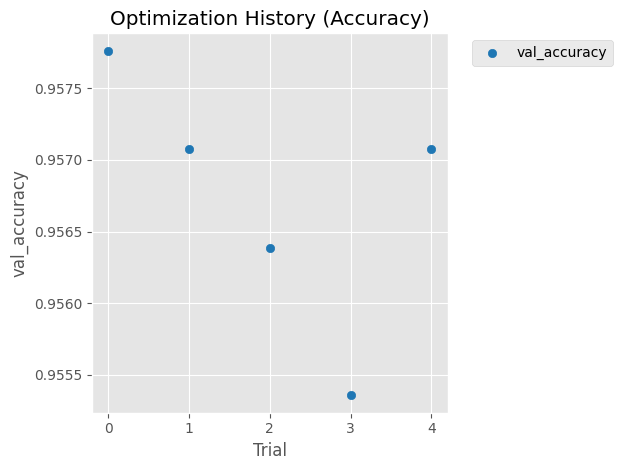

/tmp/ipykernel_25/3900254938.py:147: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

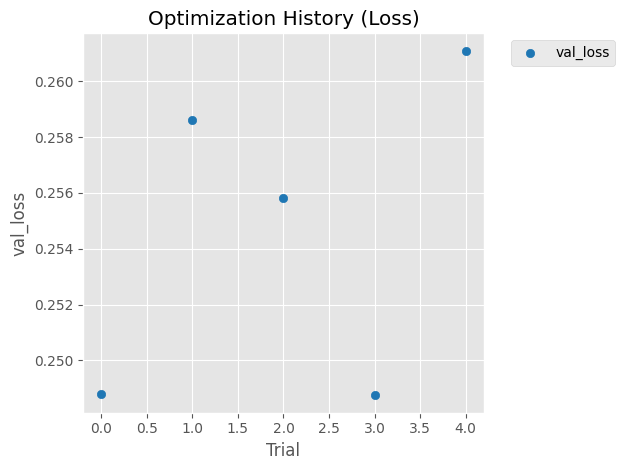

/tmp/ipykernel_25/3900254938.py:185: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Figure size 700x500 with 0 Axes>

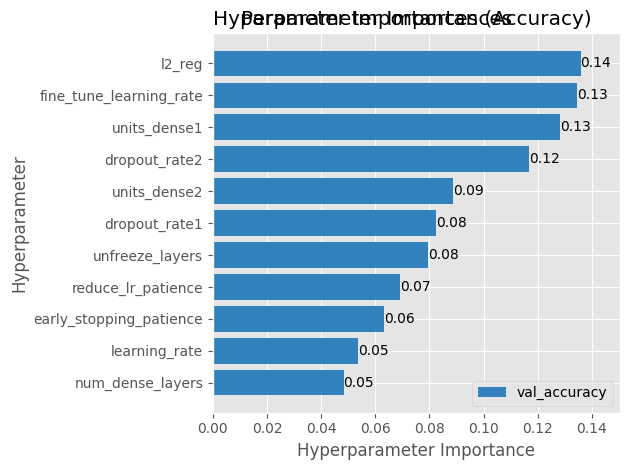

Found 13650 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.

TRAINING AND EVALUATING FOLD 1/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150013_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
426/426 [==============================] - 78s 164ms/step - loss: 0.0468 - accuracy: 0.9960 - val_loss: 0.2588 - val_accuracy: 0.9557 - lr: 8.9637e-06
Epoch 2/50
426/426 [==============================] - 70s 165ms/step - loss: 0.0433 - accuracy: 0.9965 - val_loss: 0.2576 - val_accuracy: 0.9550 - lr: 8.9637e-06
Epoch 3/50
426/426 [==============================] - 70s 165ms/step - loss: 0.0407 - accuracy: 0.9970 - val_loss: 0.2633 - val_accuracy: 0.9557 - lr: 8.9637e-06
Epoch 4/50
426/426 [==============================] - 68s 160ms/step - loss: 0.0403 - accuracy: 0.9965 - val_loss: 0.2672 - val_accuracy: 0.9543 - lr: 8.963

History for fold 1 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150013_1.pkl
427/427 [==============================] - 56s 130ms/step - loss: 0.0411 - accuracy: 0.9968
Train Accuracy: 0.9968498349189758
Train Log Loss: 0.04112894833087921
92/92 [==============================] - 12s 133ms/step - loss: 0.2578 - accuracy: 0.9559
Validation Accuracy: 0.9558974504470825
Validation Log Loss: 0.25778284668922424
92/92 [==============================] - 15s 163ms/step - loss: 0.2408 - accuracy: 0.9593
Test Accuracy: 0.9593162536621094
Test Log Loss: 0.240803062915802
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'wabot': 11, 'wacatac': 12}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   0   1]
 [  0   0   0 222   1   0   0   0   0

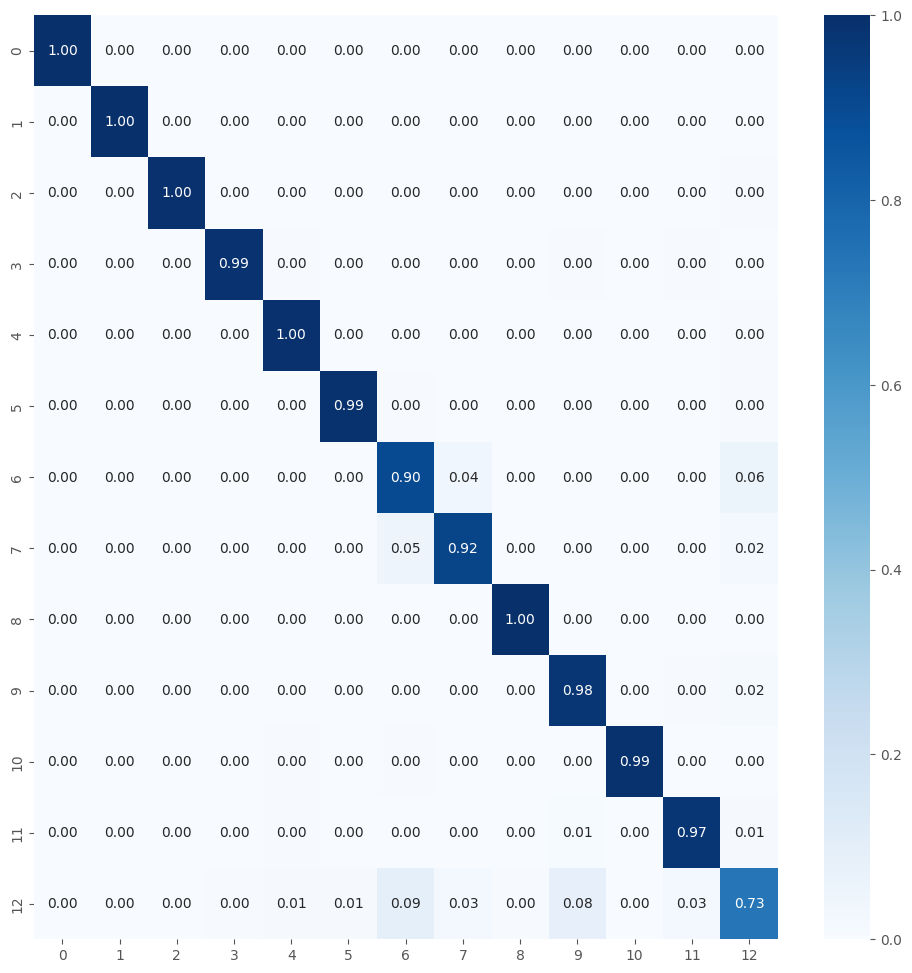


TRAINING AND EVALUATING FOLD 2/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150013_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
426/426 [==============================] - 78s 164ms/step - loss: 0.0476 - accuracy: 0.9957 - val_loss: 0.2531 - val_accuracy: 0.9554 - lr: 8.9637e-06
Epoch 2/50
426/426 [==============================] - 65s 153ms/step - loss: 0.0433 - accuracy: 0.9966 - val_loss: 0.2566 - val_accuracy: 0.9554 - lr: 8.9637e-06
Epoch 3/50
426/426 [==============================] - 79s 184ms/step - loss: 0.0420 - accuracy: 0.9970 - val_loss: 0.2620 - val_accuracy: 0.9557 - lr: 8.9637e-06
Epoch 4/50
426/426 [==============================] - 68s 160ms/step - loss: 0.0400 - accuracy: 0.9968 - val_loss: 0.2634 - val_accuracy: 0.9557 - lr: 8.9637e-06
Epoch 5/50
426/426 [==============================] - 65s 153ms/step - loss: 0.0400 - accuracy: 0.9968 - val_loss: 0.2638 - 

History for fold 2 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150013_2.pkl
427/427 [==============================] - 55s 128ms/step - loss: 0.0383 - accuracy: 0.9969
Train Accuracy: 0.9969230890274048
Train Log Loss: 0.038301415741443634
92/92 [==============================] - 12s 124ms/step - loss: 0.2610 - accuracy: 0.9559
Validation Accuracy: 0.9558974504470825
Validation Log Loss: 0.26104503870010376
92/92 [==============================] - 12s 127ms/step - loss: 0.2445 - accuracy: 0.9593
Test Accuracy: 0.9593162536621094
Test Log Loss: 0.2444639354944229
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'wabot': 11, 'wacatac': 12}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   0   1]
 [  0   0   0 222   1   0   0   0  

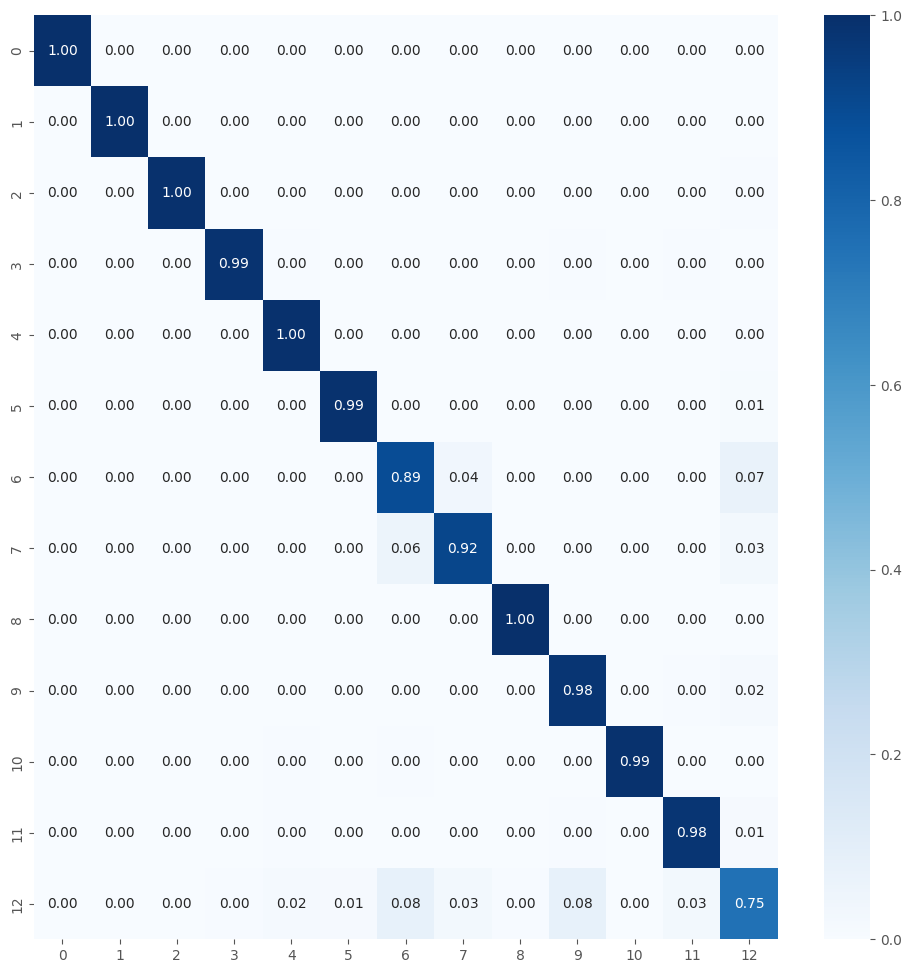


TRAINING AND EVALUATING FOLD 3/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150013_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
426/426 [==============================] - 78s 164ms/step - loss: 0.0463 - accuracy: 0.9959 - val_loss: 0.2544 - val_accuracy: 0.9554 - lr: 8.9637e-06
Epoch 2/50
426/426 [==============================] - 65s 153ms/step - loss: 0.0434 - accuracy: 0.9968 - val_loss: 0.2574 - val_accuracy: 0.9564 - lr: 8.9637e-06
Epoch 3/50
426/426 [==============================] - 69s 162ms/step - loss: 0.0417 - accuracy: 0.9971 - val_loss: 0.2620 - val_accuracy: 0.9560 - lr: 8.9637e-06
Epoch 4/50
426/426 [==============================] - 77s 182ms/step - loss: 0.0402 - accuracy: 0.9968 - val_loss: 0.2661 - val_accuracy: 0.9554 - lr: 8.9637e-06
Epoch 5/50
426/426 [==============================] - 65s 152ms/step - loss: 0.0393 - accuracy: 0.9968 - val_loss: 0.2670 - 

History for fold 3 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150013_3.pkl
427/427 [==============================] - 60s 140ms/step - loss: 0.0395 - accuracy: 0.9970
Train Accuracy: 0.9969963431358337
Train Log Loss: 0.039499565958976746
92/92 [==============================] - 13s 143ms/step - loss: 0.2564 - accuracy: 0.9566
Validation Accuracy: 0.956581175327301
Validation Log Loss: 0.25639843940734863
92/92 [==============================] - 14s 148ms/step - loss: 0.2393 - accuracy: 0.9593
Test Accuracy: 0.9593162536621094
Test Log Loss: 0.23926271498203278
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'wabot': 11, 'wacatac': 12}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   0   1]
 [  0   0   0 222   1   0   0   0  

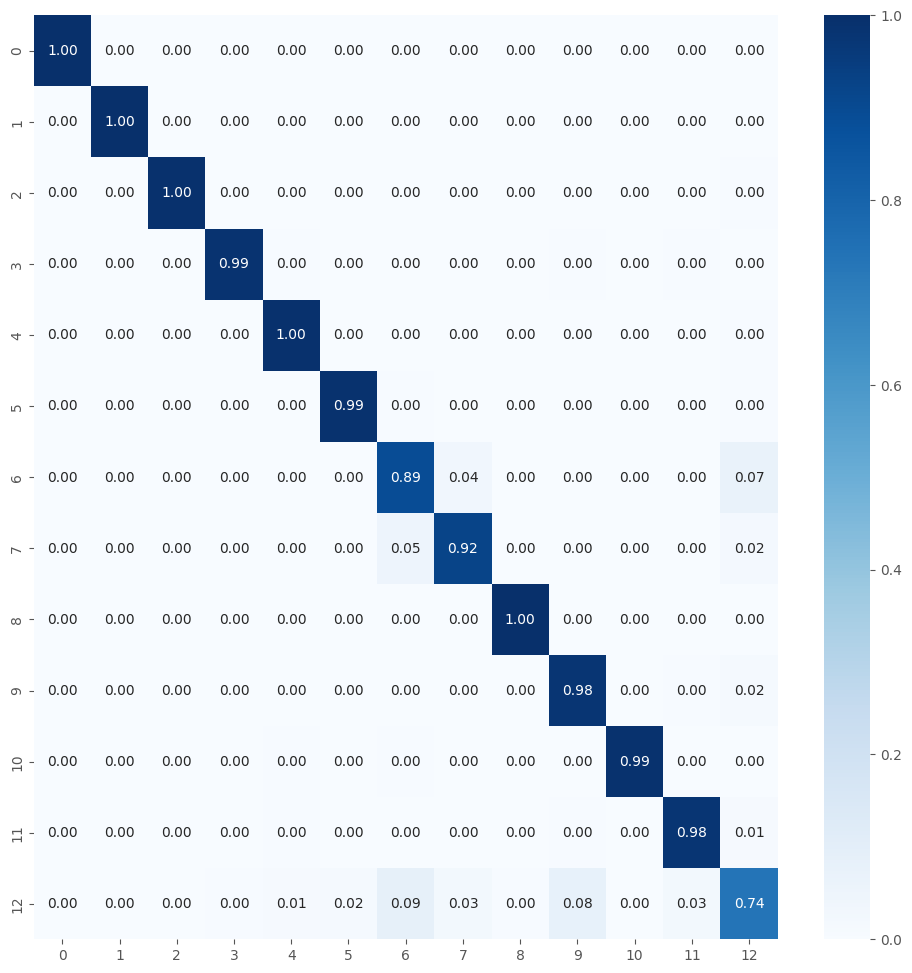


TRAINING AND EVALUATING FOLD 4/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150013_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
426/426 [==============================] - 77s 164ms/step - loss: 0.0457 - accuracy: 0.9961 - val_loss: 0.2572 - val_accuracy: 0.9547 - lr: 8.9637e-06
Epoch 2/50
426/426 [==============================] - 49s 115ms/step - loss: 0.0429 - accuracy: 0.9966 - val_loss: 0.2592 - val_accuracy: 0.9557 - lr: 8.9637e-06
Epoch 3/50
426/426 [==============================] - 55s 129ms/step - loss: 0.0414 - accuracy: 0.9969 - val_loss: 0.2629 - val_accuracy: 0.9564 - lr: 8.9637e-06
Epoch 4/50
426/426 [==============================] - 63s 148ms/step - loss: 0.0397 - accuracy: 0.9971 - val_loss: 0.2649 - val_accuracy: 0.9560 - lr: 8.9637e-06
Epoch 5/50
426/426 [==============================] - 65s 153ms/step - loss: 0.0387 - accuracy: 0.9974 - val_loss: 0.2705 - 

History for fold 4 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150013_4.pkl
427/427 [==============================] - 54s 127ms/step - loss: 0.0381 - accuracy: 0.9971
Train Accuracy: 0.9971428513526917
Train Log Loss: 0.03810439631342888
92/92 [==============================] - 13s 139ms/step - loss: 0.2619 - accuracy: 0.9566
Validation Accuracy: 0.956581175327301
Validation Log Loss: 0.26189902424812317
92/92 [==============================] - 12s 129ms/step - loss: 0.2441 - accuracy: 0.9593
Test Accuracy: 0.9593162536621094
Test Log Loss: 0.24410323798656464
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'wabot': 11, 'wacatac': 12}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   0   1]
 [  0   0   0 222   1   0   0   0   

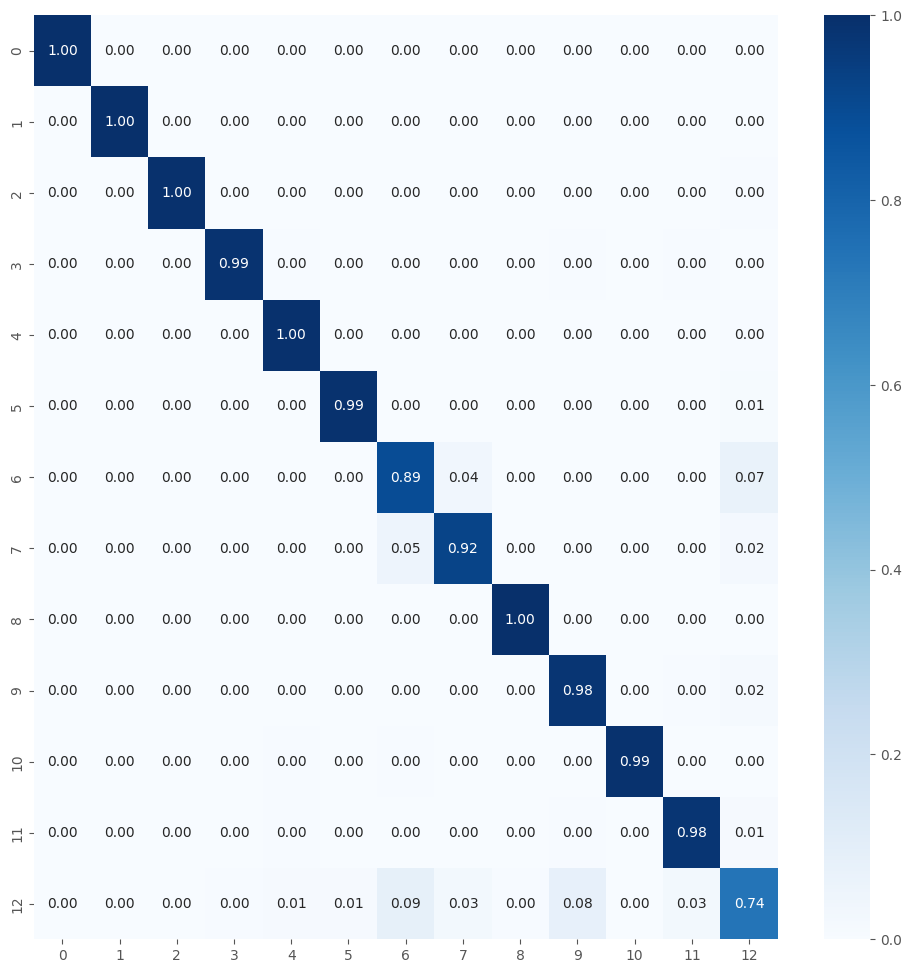


TRAINING AND EVALUATING FOLD 5/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150013_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
426/426 [==============================] - 78s 166ms/step - loss: 0.0456 - accuracy: 0.9963 - val_loss: 0.2581 - val_accuracy: 0.9550 - lr: 8.9637e-06
Epoch 2/50
426/426 [==============================] - 68s 159ms/step - loss: 0.0421 - accuracy: 0.9972 - val_loss: 0.2611 - val_accuracy: 0.9560 - lr: 8.9637e-06
Epoch 3/50
426/426 [==============================] - 69s 163ms/step - loss: 0.0412 - accuracy: 0.9965 - val_loss: 0.2625 - val_accuracy: 0.9547 - lr: 8.9637e-06
Epoch 4/50
426/426 [==============================] - 78s 184ms/step - loss: 0.0396 - accuracy: 0.9971 - val_loss: 0.2642 - val_accuracy: 0.9554 - lr: 8.9637e-06
Epoch 5/50
426/426 [==============================] - 77s 180ms/step - loss: 0.0391 - accuracy: 0.9972 - val_loss: 0.2680 - 

History for fold 5 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150013_5.pkl
427/427 [==============================] - 60s 140ms/step - loss: 0.0393 - accuracy: 0.9968
Train Accuracy: 0.9968498349189758
Train Log Loss: 0.03934067115187645
92/92 [==============================] - 12s 131ms/step - loss: 0.2620 - accuracy: 0.9559
Validation Accuracy: 0.9558974504470825
Validation Log Loss: 0.26201581954956055
92/92 [==============================] - 13s 142ms/step - loss: 0.2448 - accuracy: 0.9590
Test Accuracy: 0.9589743614196777
Test Log Loss: 0.24482978880405426
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'wabot': 11, 'wacatac': 12}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   0   1]
 [  0   0   0 222   1   0   0   0  

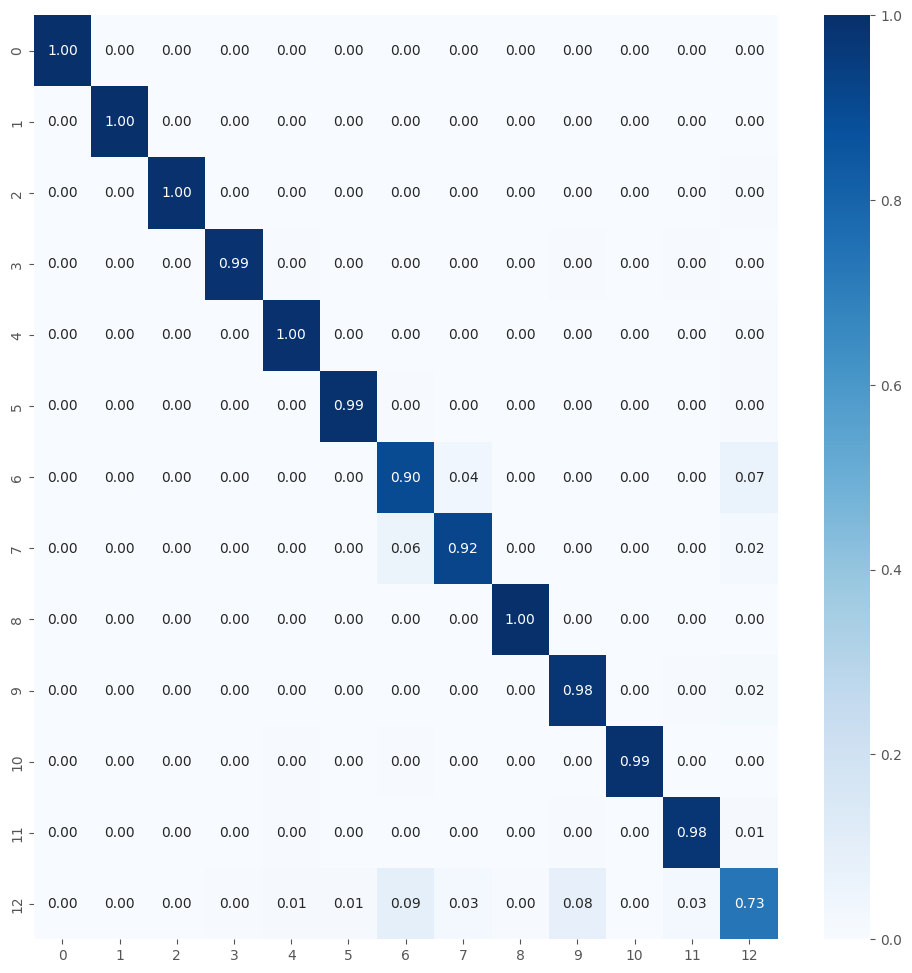


Best fold was 3 with val_accuracy: 0.9564
Average training accuracy in 5-fold: 0.9978116989135742
Average validation precision in 5-fold: 0.9560439586639404

Test Metrics
test_acc_list: [0.9593162536621094, 0.9593162536621094, 0.9593162536621094, 0.9593162536621094, 0.9589743614196777]
Average Test Accuracy with 5-fold: 0.9592478752136231
test_loss_list: [0.240803062915802, 0.2444639354944229, 0.23926271498203278, 0.24410323798656464, 0.24482978880405426]
Average Test Log Loss with 5-fold: 0.2426925480365753

Precision List: [0.9589209091667953, 0.9587644594754187, 0.9587582647353978, 0.9587538545413529, 0.9585423000311558]
Average Precision List with 5-fold: 0.9587479575900242
Recall List: [0.9593162393162392, 0.9593162393162393, 0.9593162393162393, 0.9593162393162393, 0.958974358974359]
Average Recall List with 5-fold: 0.9592478632478633
F1 Score List: [0.9586177235862205, 0.9587212060267439, 0.958641106389683, 0.958656597139776, 0.9582873557379786]
Average F1 Score List with 5-fold

In [17]:
%%time

num_classes = 13
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, precision_list_all, 
    recall_list_all, f1_score_list_all)

[I 2025-06-16 16:30:30,186] A new study created in memory with name: malware_classification_14classes


Familias de malware copiadas
source2: /notebooks/train3/all_malware/14
name_save_model: MobileNet_tf_150014
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
- Allaple.A
- Ramnit
- wabot
- mira
- Kelihos_ver3
- ganelp
- Allaple.L
- wacatac
- dinwod
- Lollipop
- berbew
- small
model_path: /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150014_best.h5

Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150014_best.h5
Successfully loaded and modified pretrained model
Found 14700 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.


[I 2025-06-16 17:00:25,018] Trial 0 finished with values: [0.9269770383834839, 0.31781867146492004] and parameters: {'learning_rate': 7.747669688912356e-05, 'dropout_rate1': 0.48261453495956635, 'dropout_rate2': 0.1009556731755446, 'l2_reg': 0.002811720537962385, 'units_dense1': 1024, 'units_dense2': 64, 'num_dense_layers': 3, 'unfreeze_layers': 13, 'early_stopping_patience': 19, 'reduce_lr_patience': 8, 'fine_tune_learning_rate': 1.5872852477317399e-06, 'units_dense3': 128, 'dropout_rate3': 0.32675560207449117}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150014_best.h5
Successfully loaded and modified pretrained model
Found 14700 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.


[I 2025-06-16 17:24:05,703] Trial 1 finished with values: [0.9257015585899353, 0.3167044222354889] and parameters: {'learning_rate': 2.3376991449580764e-05, 'dropout_rate1': 0.44279471980121365, 'dropout_rate2': 0.35535470843746186, 'l2_reg': 0.001656311822327781, 'units_dense1': 512, 'units_dense2': 64, 'num_dense_layers': 3, 'unfreeze_layers': 10, 'early_stopping_patience': 10, 'reduce_lr_patience': 14, 'fine_tune_learning_rate': 2.072172233891637e-06, 'units_dense3': 32, 'dropout_rate3': 0.3921283629641521}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150014_best.h5
Successfully loaded and modified pretrained model
Found 14700 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.


[I 2025-06-16 17:56:00,324] Trial 2 finished with values: [0.9272959232330322, 0.3133881688117981] and parameters: {'learning_rate': 0.00032861907082895624, 'dropout_rate1': 0.5221602082700019, 'dropout_rate2': 0.39804328669167155, 'l2_reg': 3.796191685325395e-05, 'units_dense1': 256, 'units_dense2': 64, 'num_dense_layers': 3, 'unfreeze_layers': 6, 'early_stopping_patience': 17, 'reduce_lr_patience': 9, 'fine_tune_learning_rate': 8.438493862450623e-05, 'units_dense3': 32, 'dropout_rate3': 0.34824190719253323}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150014_best.h5
Successfully loaded and modified pretrained model
Found 14700 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.


[I 2025-06-16 18:12:16,694] Trial 3 finished with values: [0.9285714030265808, 0.3203430473804474] and parameters: {'learning_rate': 3.2828921998905044e-05, 'dropout_rate1': 0.5404313535912322, 'dropout_rate2': 0.13237444632455309, 'l2_reg': 6.815738885223878e-05, 'units_dense1': 256, 'units_dense2': 128, 'num_dense_layers': 2, 'unfreeze_layers': 14, 'early_stopping_patience': 10, 'reduce_lr_patience': 14, 'fine_tune_learning_rate': 6.292147527531153e-06}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150014_best.h5
Successfully loaded and modified pretrained model
Found 14700 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.


[I 2025-06-16 18:36:01,621] Trial 4 finished with values: [0.9257015585899353, 0.3212064504623413] and parameters: {'learning_rate': 7.665365445713542e-05, 'dropout_rate1': 0.5398879055865379, 'dropout_rate2': 0.4339178526826374, 'l2_reg': 0.0008645230959482668, 'units_dense1': 1024, 'units_dense2': 128, 'num_dense_layers': 2, 'unfreeze_layers': 9, 'early_stopping_patience': 16, 'reduce_lr_patience': 11, 'fine_tune_learning_rate': 7.06810273338068e-06}.
/tmp/ipykernel_25/3900254938.py:136: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


Mejores trials para cada objetivo:
  Trial 2:
    val_accuracy: 0.9273
    val_loss: 0.3134
    Parámetros: {'learning_rate': 0.00032861907082895624, 'dropout_rate1': 0.5221602082700019, 'dropout_rate2': 0.39804328669167155, 'l2_reg': 3.796191685325395e-05, 'units_dense1': 256, 'units_dense2': 64, 'num_dense_layers': 3, 'unfreeze_layers': 6, 'early_stopping_patience': 17, 'reduce_lr_patience': 9, 'fine_tune_learning_rate': 8.438493862450623e-05, 'units_dense3': 32, 'dropout_rate3': 0.34824190719253323}
  Trial 3:
    val_accuracy: 0.9286
    val_loss: 0.3203
    Parámetros: {'learning_rate': 3.2828921998905044e-05, 'dropout_rate1': 0.5404313535912322, 'dropout_rate2': 0.13237444632455309, 'l2_reg': 6.815738885223878e-05, 'units_dense1': 256, 'units_dense2': 128, 'num_dense_layers': 2, 'unfreeze_layers': 14, 'early_stopping_patience': 10, 'reduce_lr_patience': 14, 'fine_tune_learning_rate': 6.292147527531153e-06}


<Figure size 700x500 with 0 Axes>

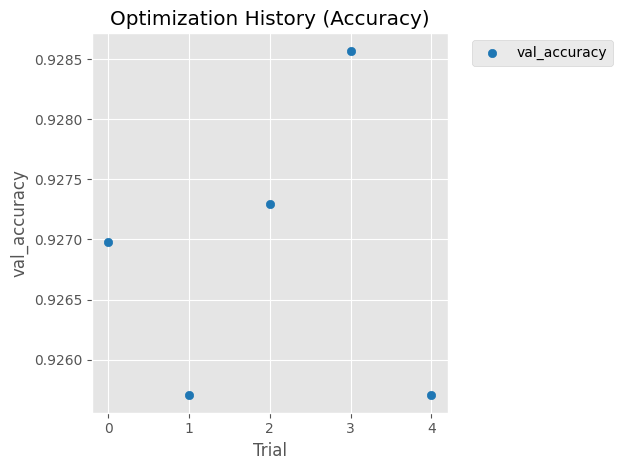

/tmp/ipykernel_25/3900254938.py:147: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

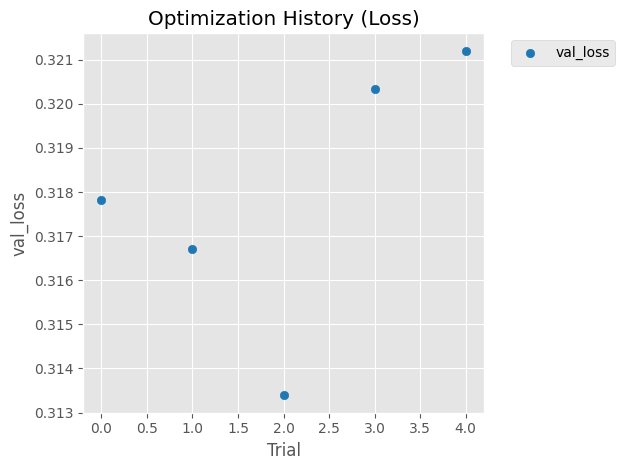

/tmp/ipykernel_25/3900254938.py:185: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Figure size 700x500 with 0 Axes>

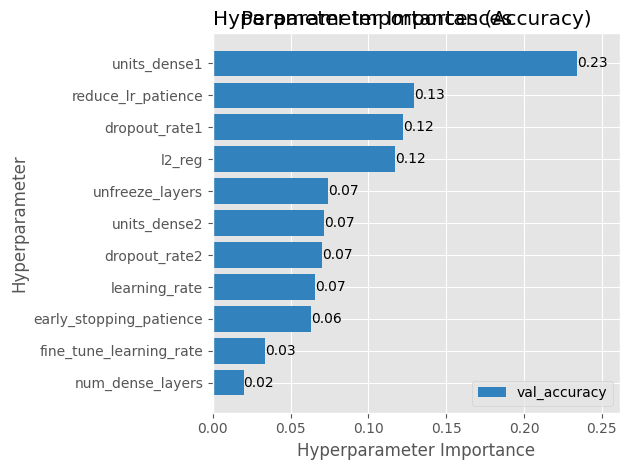

Found 14700 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.

TRAINING AND EVALUATING FOLD 1/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150014_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
459/459 [==============================] - 57s 102ms/step - loss: 0.1054 - accuracy: 0.9688 - val_loss: 0.3197 - val_accuracy: 0.9241 - lr: 3.2862e-05
Epoch 2/50
459/459 [==============================] - 43s 93ms/step - loss: 0.1003 - accuracy: 0.9697 - val_loss: 0.3313 - val_accuracy: 0.9238 - lr: 3.2862e-05
Epoch 3/50
459/459 [==============================] - 82s 178ms/step - loss: 0.0995 - accuracy: 0.9688 - val_loss: 0.3287 - val_accuracy: 0.9251 - lr: 3.2862e-05
Epoch 4/50
459/459 [==============================] - 85s 185ms/step - loss: 0.0978 - accuracy: 0.9689 - val_loss: 0.3321 - val_accuracy: 0.9263 - lr: 3.2862

History for fold 1 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150014_1.pkl
460/460 [==============================] - 75s 162ms/step - loss: 0.0887 - accuracy: 0.9721
Train Accuracy: 0.9721088409423828
Train Log Loss: 0.08866994082927704
99/99 [==============================] - 17s 165ms/step - loss: 0.3275 - accuracy: 0.9292
Validation Accuracy: 0.929206371307373
Validation Log Loss: 0.3274557888507843
99/99 [==============================] - 18s 178ms/step - loss: 0.3206 - accuracy: 0.9295
Test Accuracy: 0.9295238256454468
Test Log Loss: 0.32056453824043274
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'small': 11, 'wabot': 12, 'wacatac': 13}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   0   1   0]
 [  0   0   

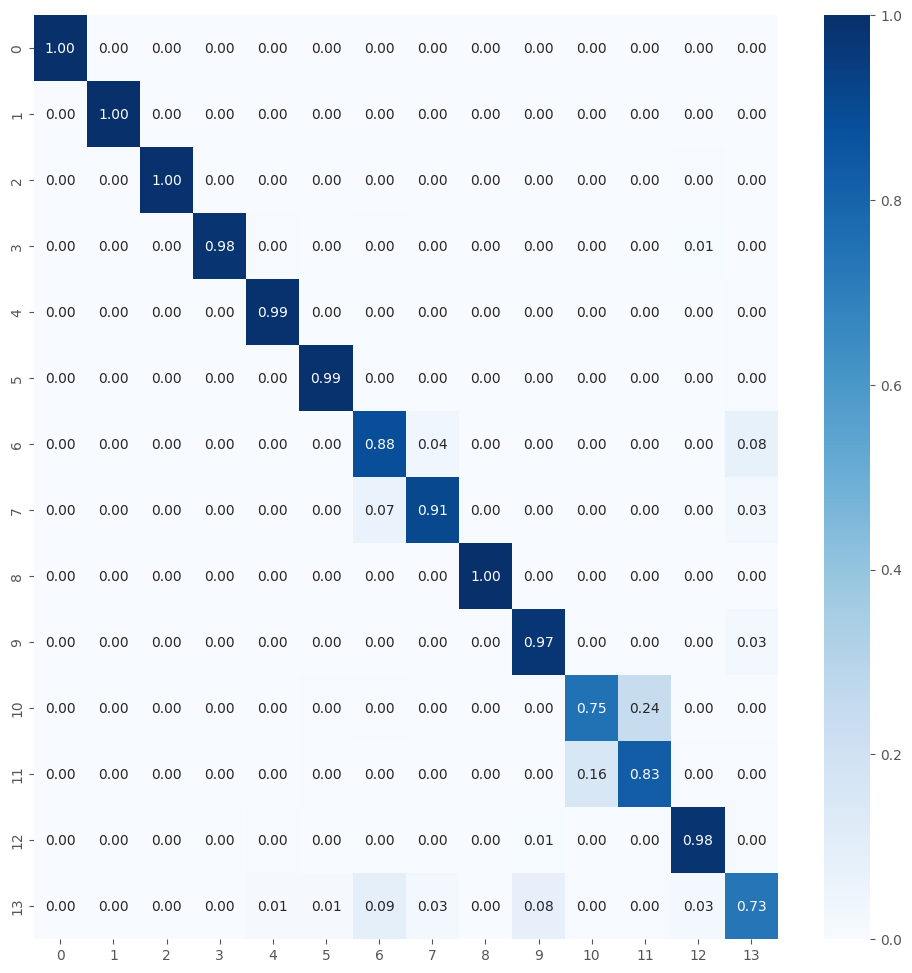


TRAINING AND EVALUATING FOLD 2/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150014_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
459/459 [==============================] - 113s 224ms/step - loss: 0.1072 - accuracy: 0.9664 - val_loss: 0.3237 - val_accuracy: 0.9260 - lr: 3.2862e-05
Epoch 2/50
459/459 [==============================] - 95s 206ms/step - loss: 0.1008 - accuracy: 0.9682 - val_loss: 0.3271 - val_accuracy: 0.9244 - lr: 3.2862e-05
Epoch 3/50
459/459 [==============================] - 83s 181ms/step - loss: 0.0998 - accuracy: 0.9686 - val_loss: 0.3286 - val_accuracy: 0.9247 - lr: 3.2862e-05
Epoch 4/50
459/459 [==============================] - 95s 205ms/step - loss: 0.0975 - accuracy: 0.9690 - val_loss: 0.3281 - val_accuracy: 0.9260 - lr: 3.2862e-05
Epoch 5/50
459/459 [==============================] - 87s 189ms/step - loss: 0.0943 - accuracy: 0.9697 - val_loss: 0.3428 -

History for fold 2 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150014_2.pkl
460/460 [==============================] - 87s 188ms/step - loss: 0.0871 - accuracy: 0.9729
Train Accuracy: 0.9729251861572266
Train Log Loss: 0.0871354416012764
99/99 [==============================] - 20s 199ms/step - loss: 0.3354 - accuracy: 0.9260
Validation Accuracy: 0.926031768321991
Validation Log Loss: 0.33537009358406067
99/99 [==============================] - 20s 194ms/step - loss: 0.3278 - accuracy: 0.9317
Test Accuracy: 0.9317460060119629
Test Log Loss: 0.32784348726272583
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'small': 11, 'wabot': 12, 'wacatac': 13}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   0   1   0]
 [  0   0   

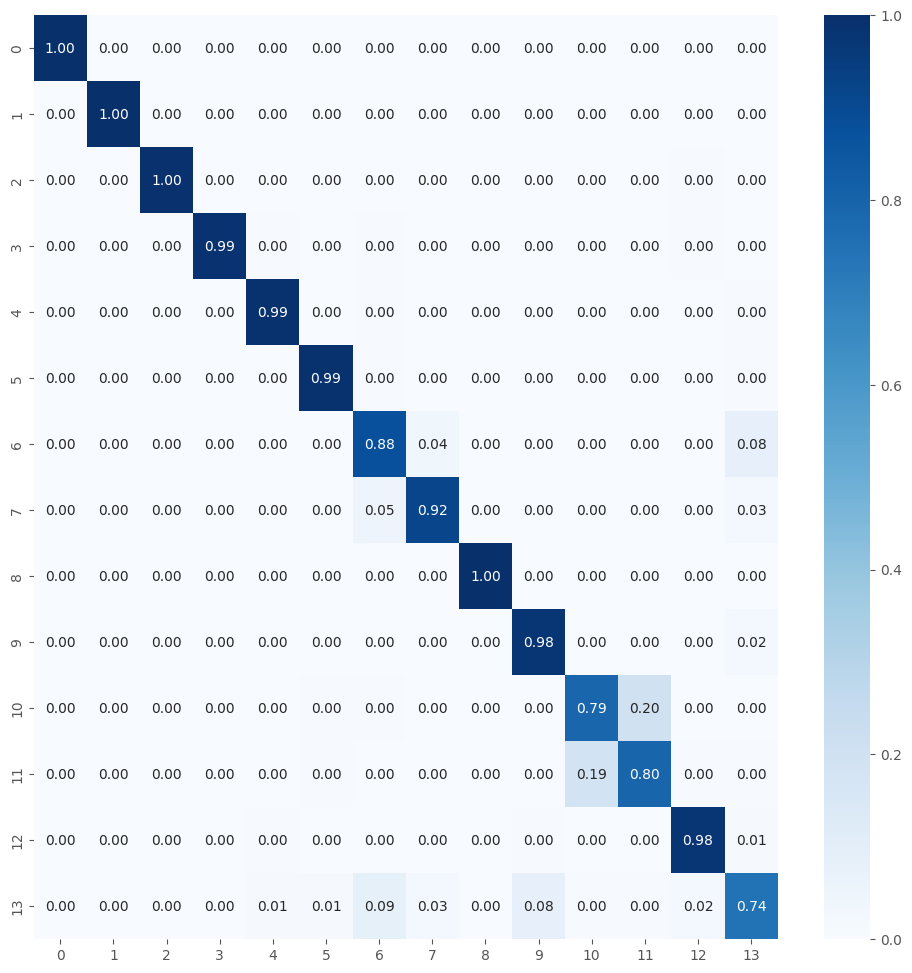


TRAINING AND EVALUATING FOLD 3/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150014_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
459/459 [==============================] - 116s 230ms/step - loss: 0.1077 - accuracy: 0.9675 - val_loss: 0.3258 - val_accuracy: 0.9247 - lr: 3.2862e-05
Epoch 2/50
459/459 [==============================] - 131s 284ms/step - loss: 0.1022 - accuracy: 0.9686 - val_loss: 0.3279 - val_accuracy: 0.9257 - lr: 3.2862e-05
Epoch 3/50
459/459 [==============================] - 99s 216ms/step - loss: 0.0990 - accuracy: 0.9705 - val_loss: 0.3322 - val_accuracy: 0.9257 - lr: 3.2862e-05
Epoch 4/50
459/459 [==============================] - 103s 223ms/step - loss: 0.0974 - accuracy: 0.9691 - val_loss: 0.3264 - val_accuracy: 0.9276 - lr: 3.2862e-05
Epoch 5/50
459/459 [==============================] - 99s 215ms/step - loss: 0.0954 - accuracy: 0.9690 - val_loss: 0.3314

History for fold 3 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150014_3.pkl
460/460 [==============================] - 62s 134ms/step - loss: 0.0735 - accuracy: 0.9756
Train Accuracy: 0.975578248500824
Train Log Loss: 0.07347296923398972
99/99 [==============================] - 14s 137ms/step - loss: 0.3459 - accuracy: 0.9279
Validation Accuracy: 0.9279364943504333
Validation Log Loss: 0.34588712453842163
99/99 [==============================] - 13s 127ms/step - loss: 0.3267 - accuracy: 0.9308
Test Accuracy: 0.9307936429977417
Test Log Loss: 0.3267100751399994
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'small': 11, 'wabot': 12, 'wacatac': 13}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   0   1   0]
 [  0   0   

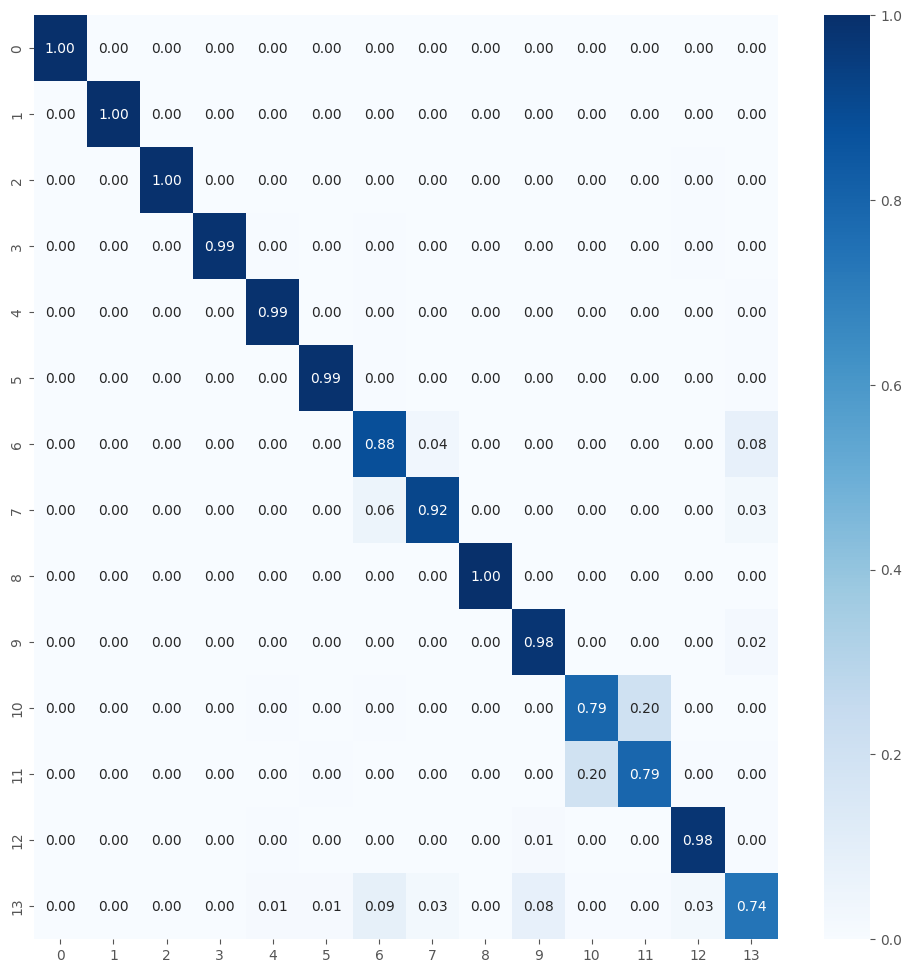


TRAINING AND EVALUATING FOLD 4/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150014_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
459/459 [==============================] - 96s 192ms/step - loss: 0.1056 - accuracy: 0.9665 - val_loss: 0.3247 - val_accuracy: 0.9241 - lr: 3.2862e-05
Epoch 2/50
459/459 [==============================] - 60s 130ms/step - loss: 0.1018 - accuracy: 0.9690 - val_loss: 0.3272 - val_accuracy: 0.9247 - lr: 3.2862e-05
Epoch 3/50
459/459 [==============================] - 72s 158ms/step - loss: 0.0980 - accuracy: 0.9708 - val_loss: 0.3258 - val_accuracy: 0.9238 - lr: 3.2862e-05
Epoch 4/50
459/459 [==============================] - 83s 181ms/step - loss: 0.0961 - accuracy: 0.9699 - val_loss: 0.3328 - val_accuracy: 0.9254 - lr: 3.2862e-05
Epoch 5/50
459/459 [==============================] - 75s 164ms/step - loss: 0.0951 - accuracy: 0.9697 - val_loss: 0.3291 - 

History for fold 4 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150014_4.pkl
460/460 [==============================] - 58s 126ms/step - loss: 0.0841 - accuracy: 0.9728
Train Accuracy: 0.9727891087532043
Train Log Loss: 0.08411084115505219
99/99 [==============================] - 13s 131ms/step - loss: 0.3329 - accuracy: 0.9276
Validation Accuracy: 0.9276190400123596
Validation Log Loss: 0.3328796923160553
99/99 [==============================] - 13s 133ms/step - loss: 0.3252 - accuracy: 0.9327
Test Accuracy: 0.9326984286308289
Test Log Loss: 0.32524046301841736
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'small': 11, 'wabot': 12, 'wacatac': 13}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   0   1   0]
 [  0   0  

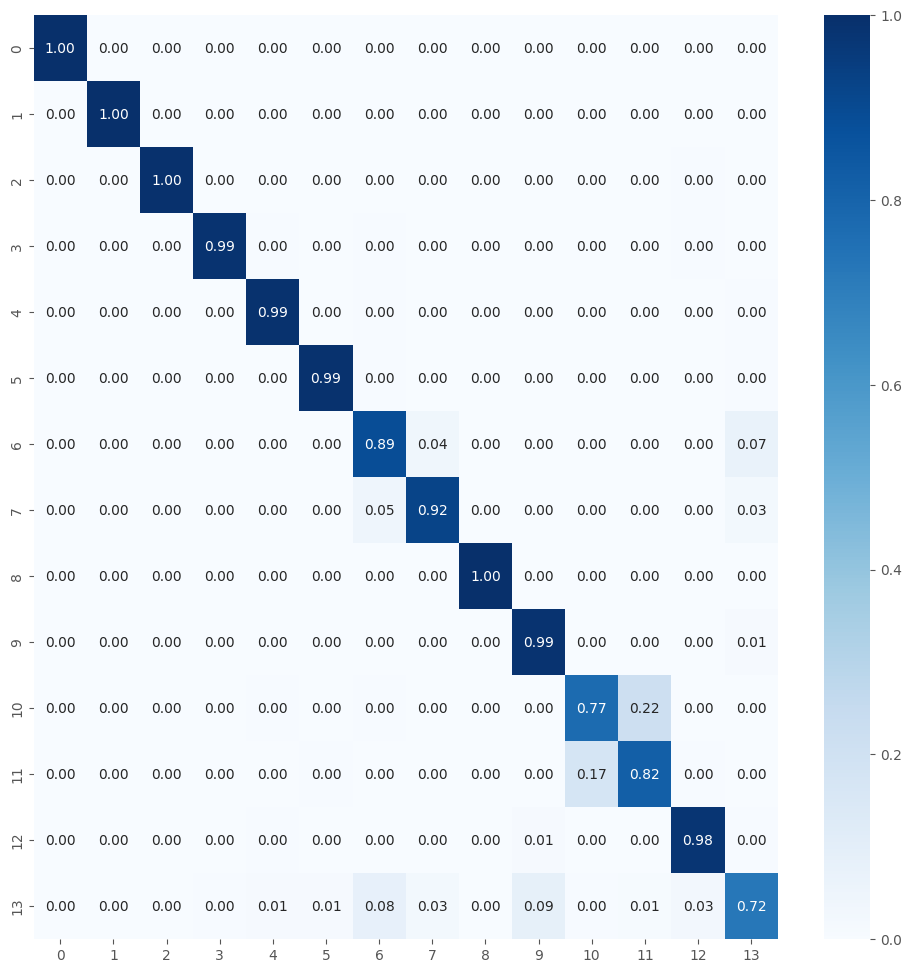


TRAINING AND EVALUATING FOLD 5/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150014_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
459/459 [==============================] - 91s 182ms/step - loss: 0.1067 - accuracy: 0.9669 - val_loss: 0.3259 - val_accuracy: 0.9244 - lr: 3.2862e-05
Epoch 2/50
459/459 [==============================] - 74s 161ms/step - loss: 0.1019 - accuracy: 0.9680 - val_loss: 0.3227 - val_accuracy: 0.9263 - lr: 3.2862e-05
Epoch 3/50
459/459 [==============================] - 81s 175ms/step - loss: 0.0990 - accuracy: 0.9688 - val_loss: 0.3259 - val_accuracy: 0.9247 - lr: 3.2862e-05
Epoch 4/50
459/459 [==============================] - 73s 160ms/step - loss: 0.0963 - accuracy: 0.9708 - val_loss: 0.3381 - val_accuracy: 0.9260 - lr: 3.2862e-05
Epoch 5/50
459/459 [==============================] - 73s 158ms/step - loss: 0.0945 - accuracy: 0.9699 - val_loss: 0.3390 - 

History for fold 5 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150014_5.pkl
460/460 [==============================] - 60s 130ms/step - loss: 0.0784 - accuracy: 0.9742
Train Accuracy: 0.9742177128791809
Train Log Loss: 0.07842031121253967
99/99 [==============================] - 13s 131ms/step - loss: 0.3433 - accuracy: 0.9276
Validation Accuracy: 0.9276190400123596
Validation Log Loss: 0.3432534337043762
99/99 [==============================] - 13s 130ms/step - loss: 0.3262 - accuracy: 0.9330
Test Accuracy: 0.9330158829689026
Test Log Loss: 0.3261558711528778
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'small': 11, 'wabot': 12, 'wacatac': 13}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   0   1   0]
 [  0   0   

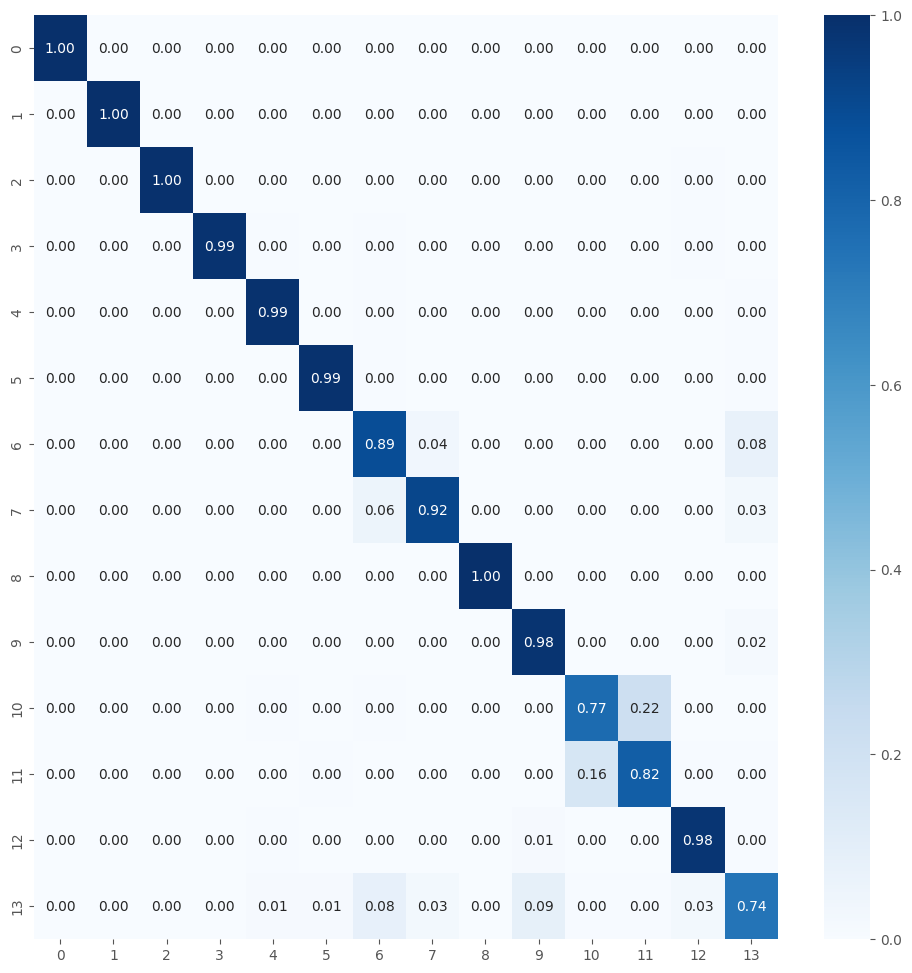


Best fold was 1 with val_accuracy: 0.9295
Average training accuracy in 5-fold: 0.9735206007957459
Average validation precision in 5-fold: 0.9282525539398193

Test Metrics
test_acc_list: [0.9295238256454468, 0.9317460060119629, 0.9307936429977417, 0.9326984286308289, 0.9330158829689026]
Average Test Accuracy with 5-fold: 0.9315555572509766
test_loss_list: [0.32056453824043274, 0.32784348726272583, 0.3267100751399994, 0.32524046301841736, 0.3261558711528778]
Average Test Log Loss with 5-fold: 0.3253028869628906

Precision List: [0.9293585051751423, 0.9311187677706665, 0.9302352011836963, 0.932231437290376, 0.9326474280759073]
Average Precision List with 5-fold: 0.9311182678991576
Recall List: [0.9295238095238094, 0.9317460317460318, 0.9307936507936507, 0.9326984126984127, 0.9330158730158731]
Average Recall List with 5-fold: 0.9315555555555555
F1 Score List: [0.92886827364128, 0.931177271686403, 0.9301756599639479, 0.9318613049559364, 0.9323355463402742]
Average F1 Score List with 5-fold

In [18]:
%%time

num_classes = 14
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, precision_list_all, 
    recall_list_all, f1_score_list_all)

[I 2025-06-16 22:44:14,339] A new study created in memory with name: malware_classification_15classes


Familias de malware copiadas
source2: /notebooks/train3/all_malware/15
name_save_model: MobileNet_tf_150015
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
- Allaple.A
- Ramnit
- wabot
- mira
- Kelihos_ver3
- ganelp
- Allaple.L
- wacatac
- dinwod
- Lollipop
- berbew
- small
- upatre
model_path: /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150015_best.h5

Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150015_best.h5
Successfully loaded and modified pretrained model
Found 15750 images belonging to 15 classes.
Found 3375 images belonging to 15 classes.
Found 3375 images belonging to 15 classes.


[I 2025-06-16 23:20:40,101] Trial 0 finished with values: [0.9315476417541504, 0.3119036853313446] and parameters: {'learning_rate': 0.00021125044348123273, 'dropout_rate1': 0.46549721199931915, 'dropout_rate2': 0.29899307112945783, 'l2_reg': 1.6994486980548992e-05, 'units_dense1': 1024, 'units_dense2': 256, 'num_dense_layers': 2, 'unfreeze_layers': 13, 'early_stopping_patience': 15, 'reduce_lr_patience': 8, 'fine_tune_learning_rate': 5.671890735827227e-05}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150015_best.h5
Successfully loaded and modified pretrained model
Found 15750 images belonging to 15 classes.
Found 3375 images belonging to 15 classes.
Found 3375 images belonging to 15 classes.


[I 2025-06-17 00:37:17,039] Trial 1 finished with values: [0.9318452477455139, 0.3046688437461853] and parameters: {'learning_rate': 3.7726919537677966e-05, 'dropout_rate1': 0.48268320472965526, 'dropout_rate2': 0.37489888230927315, 'l2_reg': 0.0013568321347590675, 'units_dense1': 1024, 'units_dense2': 128, 'num_dense_layers': 2, 'unfreeze_layers': 9, 'early_stopping_patience': 17, 'reduce_lr_patience': 10, 'fine_tune_learning_rate': 7.445899608372666e-05}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150015_best.h5
Successfully loaded and modified pretrained model
Found 15750 images belonging to 15 classes.
Found 3375 images belonging to 15 classes.
Found 3375 images belonging to 15 classes.


[I 2025-06-17 01:02:51,120] Trial 2 finished with values: [0.9244047403335571, 0.31887635588645935] and parameters: {'learning_rate': 0.0001116100352829505, 'dropout_rate1': 0.5869386733642439, 'dropout_rate2': 0.41579831627607877, 'l2_reg': 0.008494004709587529, 'units_dense1': 256, 'units_dense2': 128, 'num_dense_layers': 2, 'unfreeze_layers': 5, 'early_stopping_patience': 12, 'reduce_lr_patience': 13, 'fine_tune_learning_rate': 3.7171588506525887e-06}.



Loading pretrained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150015_best.h5
Successfully loaded and modified pretrained model
Found 15750 images belonging to 15 classes.
Found 3375 images belonging to 15 classes.
Found 3375 images belonging to 15 classes.


[I 2025-06-17 02:26:52,755] Trial 3 finished with values: [0.9235119223594666, 0.29406899213790894] and parameters: {'learning_rate': 0.000549451277643048, 'dropout_rate1': 0.5147461905311401, 'dropout_rate2': 0.36151530993485237, 'l2_reg': 0.004447962353048193, 'units_dense1': 256, 'units_dense2': 128, 'num_dense_layers': 3, 'unfreeze_layers': 15, 'early_stopping_patience': 17, 'reduce_lr_patience': 11, 'fine_tune_learning_rate': 2.352046305575254e-06, 'units_dense3': 64, 'dropout_rate3': 0.1887028177587058}.


Mejores trials para cada objetivo:
  Trial 1:
    val_accuracy: 0.9318
    val_loss: 0.3047
    Parámetros: {'learning_rate': 3.7726919537677966e-05, 'dropout_rate1': 0.48268320472965526, 'dropout_rate2': 0.37489888230927315, 'l2_reg': 0.0013568321347590675, 'units_dense1': 1024, 'units_dense2': 128, 'num_dense_layers': 2, 'unfreeze_layers': 9, 'early_stopping_patience': 17, 'reduce_lr_patience': 10, 'fine_tune_learning_rate': 7.445899608372666e-05}
  Trial 3:
    val_accuracy: 0.9235
    val_loss: 0.2941
    Parámetros: {'learning_rate': 0.000549451277643048, 'dropout_rate1': 0.5147461905311401, 'dropout_rate2': 0.36151530993485237, 'l2_reg': 0.004447962353048193, 'units_dense1': 256, 'units_dense2': 128, 'num_dense_layers': 3, 'unfreeze_layers': 15, 'early_stopping_patience': 17, 'reduce_lr_patience': 11, 'fine_tune_learning_rate': 2.352046305575254e-06, 'units_dense3': 64, 'dropout_rate3': 0.1887028177587058}


/tmp/ipykernel_25/3900254938.py:136: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

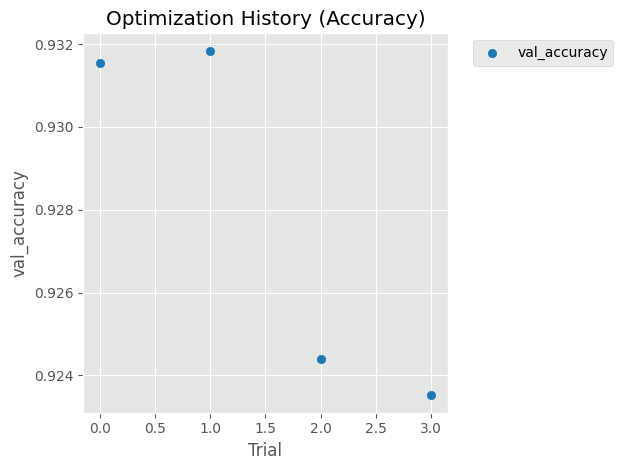

/tmp/ipykernel_25/3900254938.py:147: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


<Figure size 700x500 with 0 Axes>

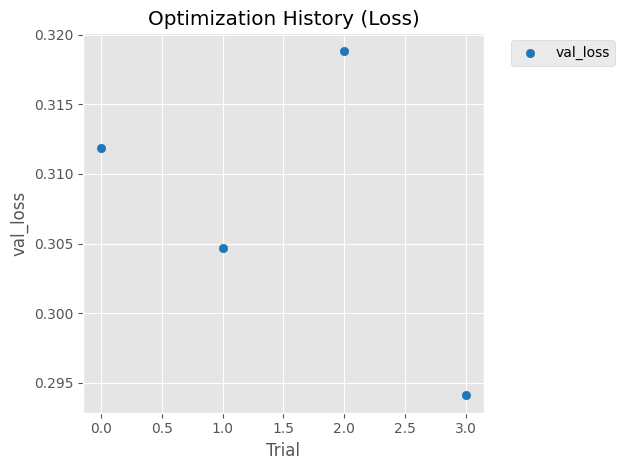

/tmp/ipykernel_25/3900254938.py:185: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


<Figure size 700x500 with 0 Axes>

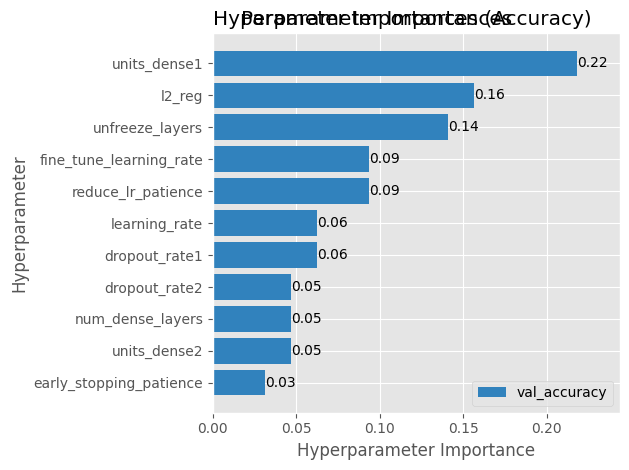

Found 15750 images belonging to 15 classes.
Found 3375 images belonging to 15 classes.
Found 3375 images belonging to 15 classes.

TRAINING AND EVALUATING FOLD 1/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150015_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
492/492 [==============================] - 116s 214ms/step - loss: 0.1061 - accuracy: 0.9684 - val_loss: 0.3223 - val_accuracy: 0.9235 - lr: 3.7727e-06
Epoch 2/50
492/492 [==============================] - 96s 196ms/step - loss: 0.1035 - accuracy: 0.9683 - val_loss: 0.3200 - val_accuracy: 0.9244 - lr: 3.7727e-06
Epoch 3/50
492/492 [==============================] - 91s 185ms/step - loss: 0.1024 - accuracy: 0.9678 - val_loss: 0.3242 - val_accuracy: 0.9232 - lr: 3.7727e-06
Epoch 4/50
492/492 [==============================] - 91s 186ms/step - loss: 0.1008 - accuracy: 0.9690 - val_loss: 0.3245 - val_accuracy: 0.9241 - lr: 3.77

History for fold 1 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150015_1.pkl
493/493 [==============================] - 71s 143ms/step - loss: 0.0864 - accuracy: 0.9742
Train Accuracy: 0.9741587042808533
Train Log Loss: 0.08636678755283356
106/106 [==============================] - 10s 92ms/step - loss: 0.3414 - accuracy: 0.9304
Validation Accuracy: 0.9303703904151917
Validation Log Loss: 0.3414258658885956
106/106 [==============================] - 19s 179ms/step - loss: 0.3211 - accuracy: 0.9307
Test Accuracy: 0.9306666851043701
Test Log Loss: 0.3210800290107727
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'small': 11, 'upatre': 12, 'wabot': 13, 'wacatac': 14}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0 

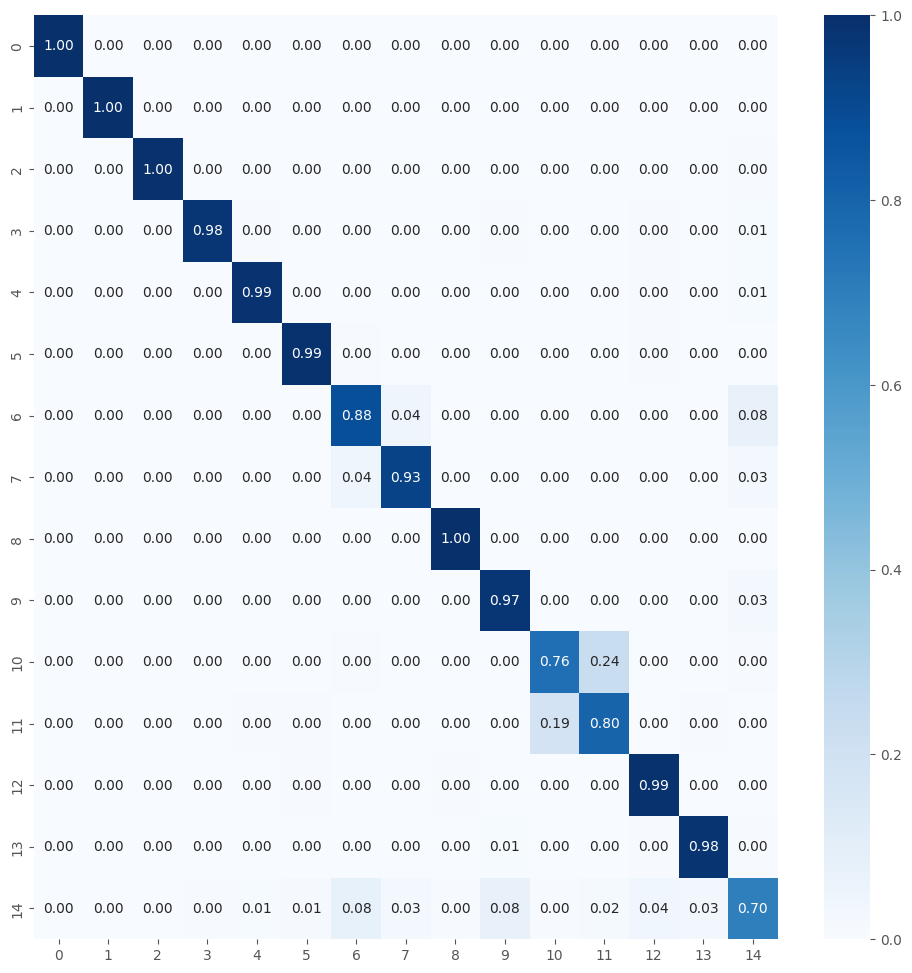


TRAINING AND EVALUATING FOLD 2/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150015_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
492/492 [==============================] - 97s 180ms/step - loss: 0.1057 - accuracy: 0.9677 - val_loss: 0.3233 - val_accuracy: 0.9241 - lr: 3.7727e-06
Epoch 2/50
492/492 [==============================] - 99s 201ms/step - loss: 0.1033 - accuracy: 0.9686 - val_loss: 0.3215 - val_accuracy: 0.9226 - lr: 3.7727e-06
Epoch 3/50
492/492 [==============================] - 87s 176ms/step - loss: 0.1021 - accuracy: 0.9683 - val_loss: 0.3243 - val_accuracy: 0.9232 - lr: 3.7727e-06
Epoch 4/50
492/492 [==============================] - 91s 184ms/step - loss: 0.1004 - accuracy: 0.9684 - val_loss: 0.3225 - val_accuracy: 0.9247 - lr: 3.7727e-06
Epoch 5/50
492/492 [==============================] - 91s 184ms/step - loss: 0.0994 - accuracy: 0.9702 - val_loss: 0.3264 - 

History for fold 2 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150015_2.pkl
493/493 [==============================] - 62s 126ms/step - loss: 0.0864 - accuracy: 0.9740
Train Accuracy: 0.9740317463874817
Train Log Loss: 0.08644602447748184
106/106 [==============================] - 14s 126ms/step - loss: 0.3440 - accuracy: 0.9292
Validation Accuracy: 0.9291852116584778
Validation Log Loss: 0.34396010637283325
106/106 [==============================] - 13s 125ms/step - loss: 0.3227 - accuracy: 0.9292
Test Accuracy: 0.9291852116584778
Test Log Loss: 0.322665810585022
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'small': 11, 'upatre': 12, 'wabot': 13, 'wacatac': 14}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0

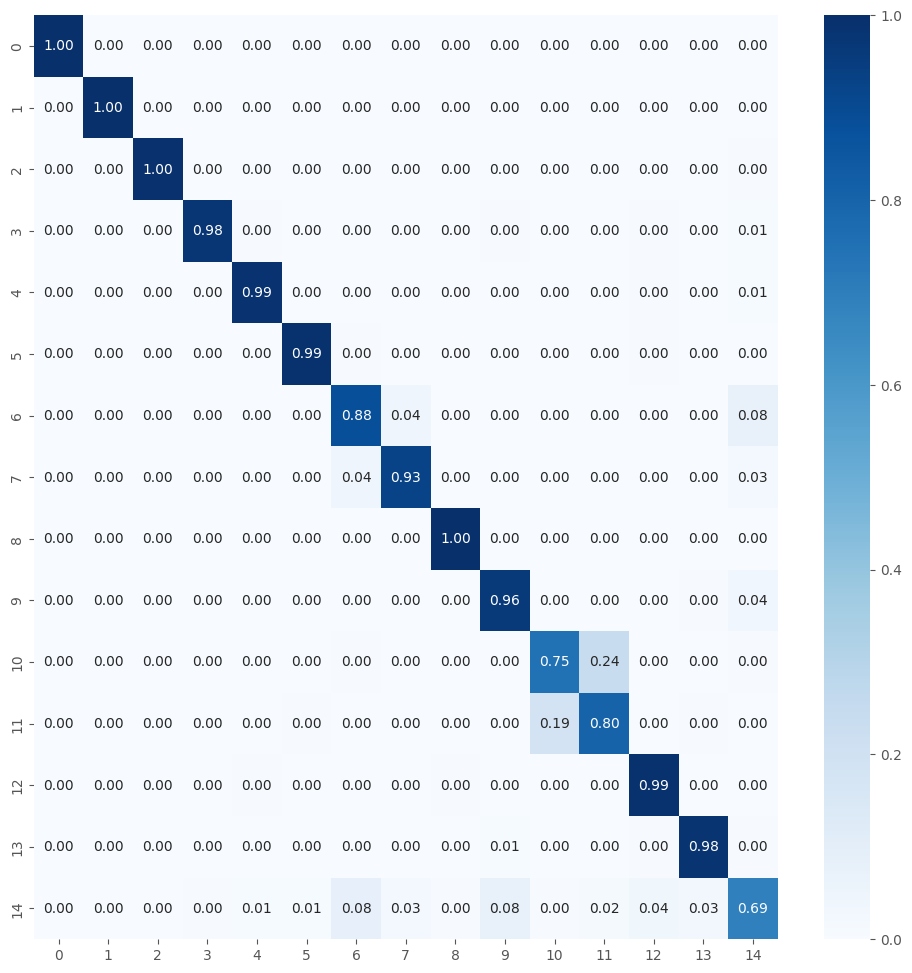


TRAINING AND EVALUATING FOLD 3/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150015_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
492/492 [==============================] - 86s 159ms/step - loss: 0.1054 - accuracy: 0.9679 - val_loss: 0.3230 - val_accuracy: 0.9217 - lr: 3.7727e-06
Epoch 2/50
492/492 [==============================] - 82s 166ms/step - loss: 0.1037 - accuracy: 0.9674 - val_loss: 0.3213 - val_accuracy: 0.9247 - lr: 3.7727e-06
Epoch 3/50
492/492 [==============================] - 84s 171ms/step - loss: 0.1023 - accuracy: 0.9684 - val_loss: 0.3247 - val_accuracy: 0.9235 - lr: 3.7727e-06
Epoch 4/50
492/492 [==============================] - 83s 168ms/step - loss: 0.1002 - accuracy: 0.9690 - val_loss: 0.3265 - val_accuracy: 0.9247 - lr: 3.7727e-06
Epoch 5/50
492/492 [==============================] - 75s 152ms/step - loss: 0.0998 - accuracy: 0.9695 - val_loss: 0.3278 - 

History for fold 3 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150015_3.pkl
493/493 [==============================] - 62s 125ms/step - loss: 0.0864 - accuracy: 0.9740
Train Accuracy: 0.9740317463874817
Train Log Loss: 0.08641970902681351
106/106 [==============================] - 16s 146ms/step - loss: 0.3443 - accuracy: 0.9304
Validation Accuracy: 0.9303703904151917
Validation Log Loss: 0.34427812695503235
106/106 [==============================] - 15s 136ms/step - loss: 0.3230 - accuracy: 0.9292
Test Accuracy: 0.9291852116584778
Test Log Loss: 0.32300448417663574
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'small': 11, 'upatre': 12, 'wabot': 13, 'wacatac': 14}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0  

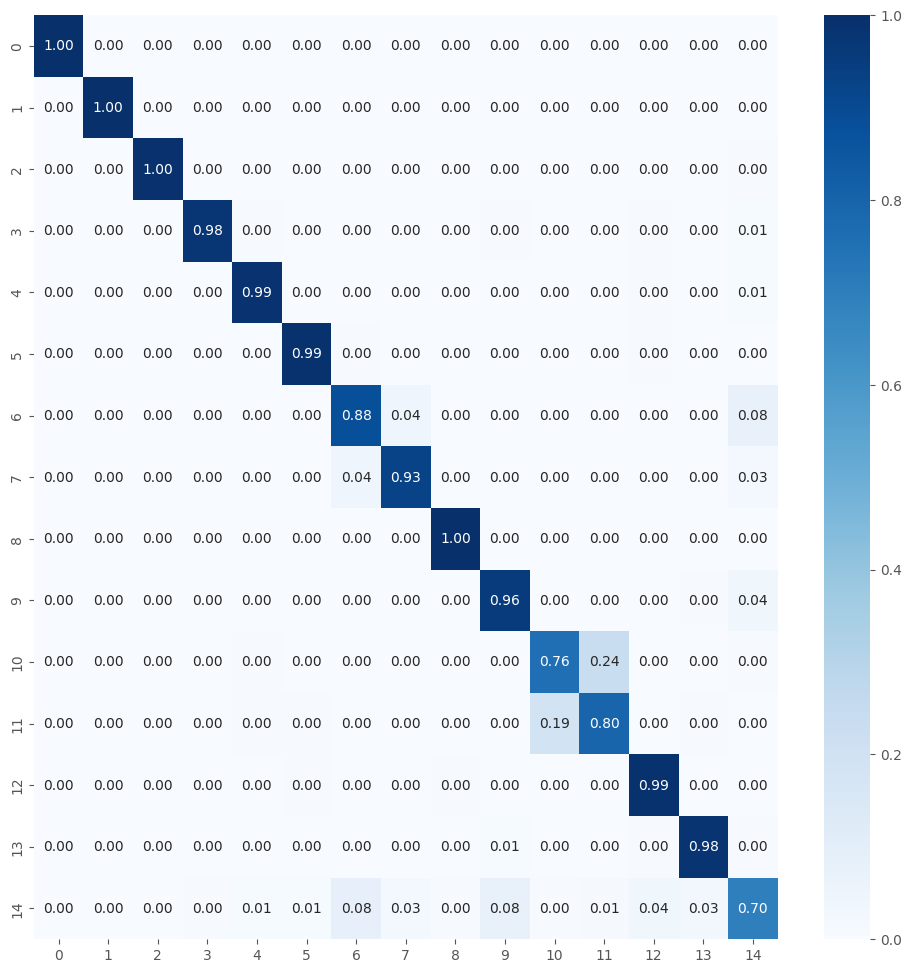


TRAINING AND EVALUATING FOLD 4/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150015_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
492/492 [==============================] - 86s 158ms/step - loss: 0.1050 - accuracy: 0.9681 - val_loss: 0.3229 - val_accuracy: 0.9244 - lr: 3.7727e-06
Epoch 2/50
492/492 [==============================] - 74s 149ms/step - loss: 0.1041 - accuracy: 0.9681 - val_loss: 0.3220 - val_accuracy: 0.9238 - lr: 3.7727e-06
Epoch 3/50
492/492 [==============================] - 75s 152ms/step - loss: 0.1023 - accuracy: 0.9688 - val_loss: 0.3237 - val_accuracy: 0.9232 - lr: 3.7727e-06
Epoch 4/50
492/492 [==============================] - 79s 160ms/step - loss: 0.1003 - accuracy: 0.9688 - val_loss: 0.3238 - val_accuracy: 0.9235 - lr: 3.7727e-06
Epoch 5/50
492/492 [==============================] - 82s 166ms/step - loss: 0.0995 - accuracy: 0.9686 - val_loss: 0.3252 - 

History for fold 4 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150015_4.pkl
493/493 [==============================] - 61s 123ms/step - loss: 0.0889 - accuracy: 0.9739
Train Accuracy: 0.9739047884941101
Train Log Loss: 0.0889308974146843
106/106 [==============================] - 13s 123ms/step - loss: 0.3369 - accuracy: 0.9298
Validation Accuracy: 0.9297778010368347
Validation Log Loss: 0.33693623542785645
106/106 [==============================] - 14s 126ms/step - loss: 0.3181 - accuracy: 0.9304
Test Accuracy: 0.9303703904151917
Test Log Loss: 0.3180646002292633
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'small': 11, 'upatre': 12, 'wabot': 13, 'wacatac': 14}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0

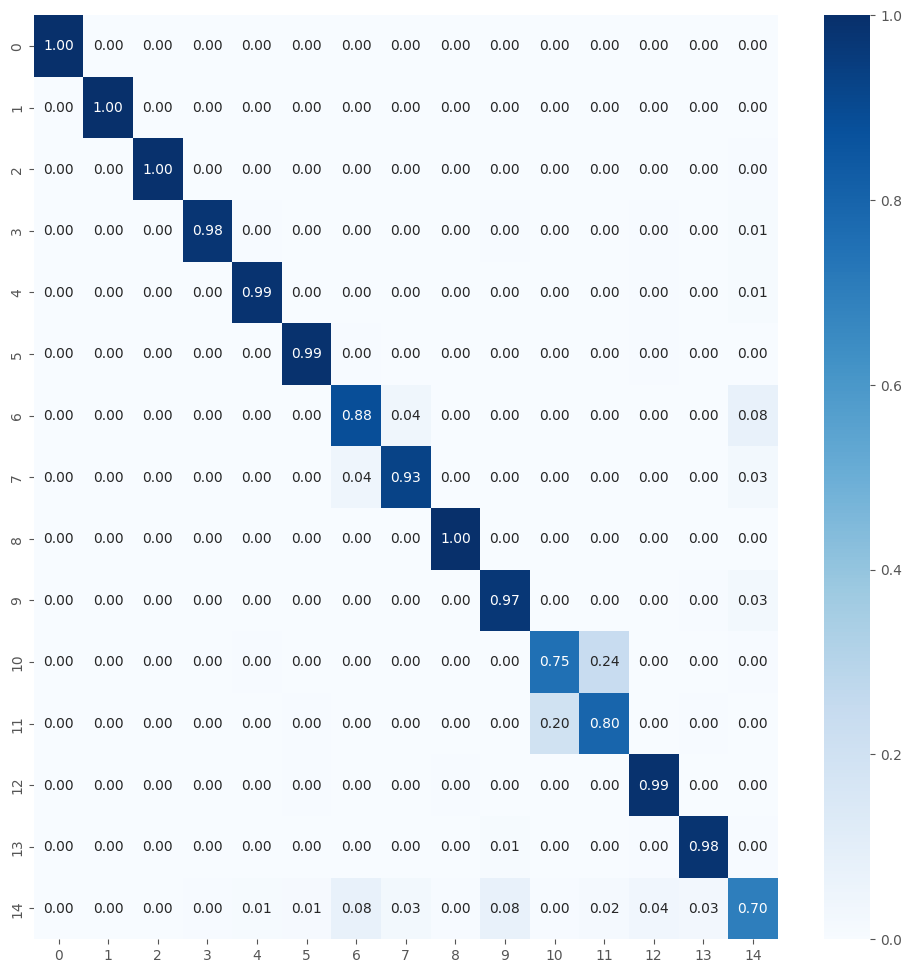


TRAINING AND EVALUATING FOLD 5/5...

Loading pre-trained model from /notebooks/train3/layer_contribution/MobileNet_tf_optimized/MobileNet_tf_150015_best.h5
Model loaded successfully.
Model loaded and recompiled for fine-tuning
Epoch 1/50
492/492 [==============================] - 87s 159ms/step - loss: 0.1070 - accuracy: 0.9668 - val_loss: 0.3223 - val_accuracy: 0.9229 - lr: 3.7727e-06
Epoch 2/50
492/492 [==============================] - 75s 151ms/step - loss: 0.1030 - accuracy: 0.9693 - val_loss: 0.3232 - val_accuracy: 0.9232 - lr: 3.7727e-06
Epoch 3/50
492/492 [==============================] - 75s 152ms/step - loss: 0.1025 - accuracy: 0.9695 - val_loss: 0.3248 - val_accuracy: 0.9223 - lr: 3.7727e-06
Epoch 4/50
492/492 [==============================] - 76s 154ms/step - loss: 0.1006 - accuracy: 0.9695 - val_loss: 0.3272 - val_accuracy: 0.9235 - lr: 3.7727e-06
Epoch 5/50
492/492 [==============================] - 77s 156ms/step - loss: 0.0996 - accuracy: 0.9684 - val_loss: 0.3271 - 

History for fold 5 saved as c8_base_more_50_epochs_and_cbks_MobileNet_tf_150015_5.pkl
493/493 [==============================] - 75s 152ms/step - loss: 0.0900 - accuracy: 0.9737
Train Accuracy: 0.973714292049408
Train Log Loss: 0.08995172381401062
106/106 [==============================] - 16s 151ms/step - loss: 0.3367 - accuracy: 0.9289
Validation Accuracy: 0.9288889169692993
Validation Log Loss: 0.33672091364860535
106/106 [==============================] - 18s 167ms/step - loss: 0.3186 - accuracy: 0.9307
Test Accuracy: 0.9306666851043701
Test Log Loss: 0.31863126158714294
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'small': 11, 'upatre': 12, 'wabot': 13, 'wacatac': 14}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   

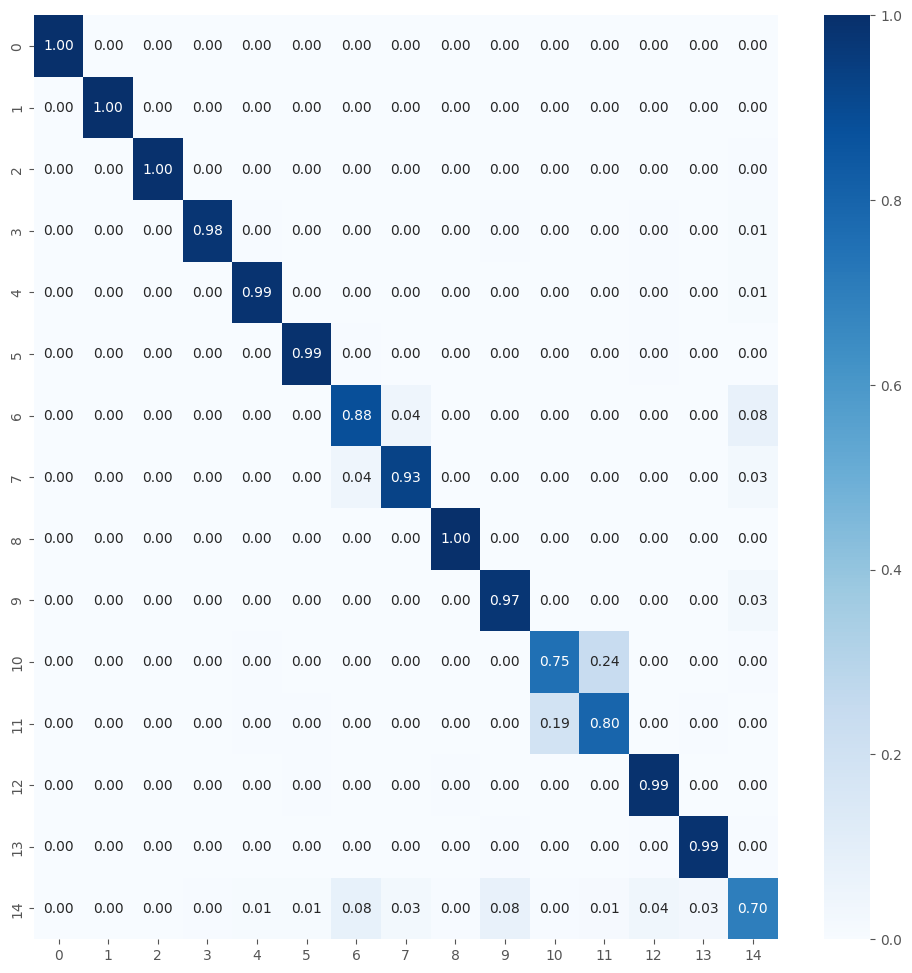


Best fold was 1 with val_accuracy: 0.9315
Average training accuracy in 5-fold: 0.9730627298355102
Average validation precision in 5-fold: 0.9307142972946167

Test Metrics
test_acc_list: [0.9306666851043701, 0.9291852116584778, 0.9291852116584778, 0.9303703904151917, 0.9306666851043701]
Average Test Accuracy with 5-fold: 0.9300148367881775
test_loss_list: [0.3210800290107727, 0.322665810585022, 0.32300448417663574, 0.3180646002292633, 0.31863126158714294]
Average Test Log Loss with 5-fold: 0.3206892371177673

Precision List: [0.929716829705479, 0.9283164509674985, 0.9281413600350791, 0.9294614864627312, 0.9296525371362635]
Average Precision List with 5-fold: 0.9290577328614104
Recall List: [0.9306666666666668, 0.9291851851851851, 0.9291851851851852, 0.9303703703703705, 0.9306666666666666]
Average Recall List with 5-fold: 0.9300148148148148
F1 Score List: [0.929716952142542, 0.928278264274801, 0.9282831699070292, 0.9294725794663812, 0.9297097385688413]
Average F1 Score List with 5-fold:

In [19]:
%%time

num_classes = 15
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, 
    precision_list_all, recall_list_all, f1_score_list_all)

In [20]:
print(f"test_acc_list_all = {test_acc_list_all}")
print(f"test_loss_list_all = {test_loss_list_all}")
print(f"precision_list_all = {precision_list_all}")
print(f"recall_list_all = {recall_list_all}")
print(f"f1_score_list_all = {f1_score_list_all}")

test_acc_list_all = [1.0, 1.0, 0.9975555419921875, 0.9941333293914795, 0.9956543445587158, 0.9746666669845581, 0.9530505180358887, 0.95333331823349, 0.9592478752136231, 0.9315555572509766, 0.9300148367881775]
test_loss_list_all = [0.09954872727394104, 0.01098769661039114, 0.02537739872932434, 0.1057829350233078, 0.03474916815757752, 0.1860918253660202, 0.2699678182601929, 0.26415271759033204, 0.2426925480365753, 0.3253028869628906, 0.3206892371177673]
precision_list_all = [1.0, 1.0, 0.9975721933007347, 0.9941481258504729, 0.9956890425754918, 0.9747391794607386, 0.95269627307209, 0.9527454599282834, 0.9587479575900242, 0.9311182678991576, 0.9290577328614104]
recall_list_all = [1.0, 1.0, 0.9975555555555555, 0.9941333333333334, 0.9956543209876543, 0.9746666666666668, 0.953050505050505, 0.9533333333333331, 0.9592478632478633, 0.9315555555555555, 0.9300148148148148]
f1_score_list_all = [1.0, 1.0, 0.9975555171460664, 0.9941352639710768, 0.9956528158288066, 0.9742301491986917, 0.9524998662043

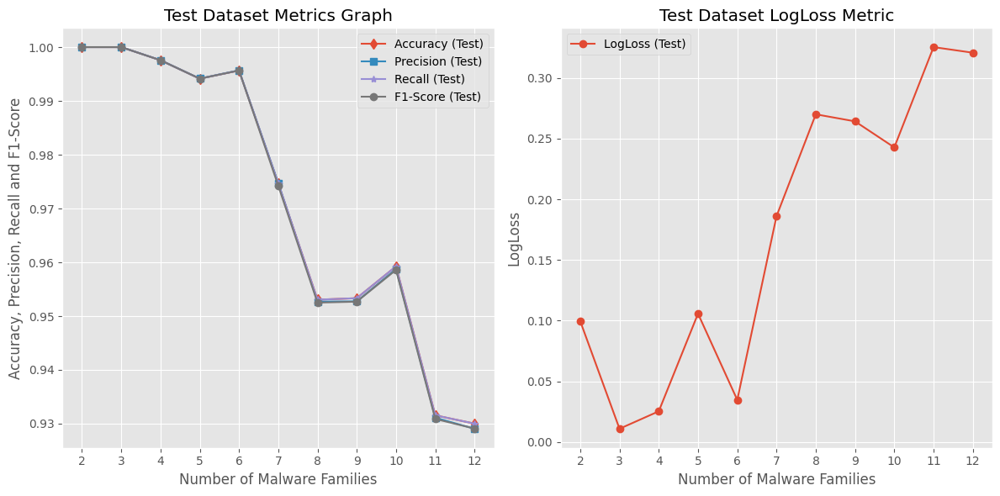

In [21]:
import matplotlib.pyplot as plt

# Datos históricos
strategies = [str(i) for i in range(2, len(test_acc_list_all) + 2)]

# Crear gráfico para Test Accuracy y Test LogLoss en una fila con dos columnas
fig, axes = plt.subplots(1, 2, figsize=(12, 6))


# Gráfico para Test Accuracy, Precision, Recall and F1-Score
axes[0].plot(strategies, test_acc_list_all, marker='d', label='Accuracy (Test)')
axes[0].plot(strategies, precision_list_all, marker='s', label='Precision (Test)')
axes[0].plot(strategies, recall_list_all, marker='*', label='Recall (Test)')
axes[0].plot(strategies, f1_score_list_all, marker='o', label='F1-Score (Test)')
axes[0].set_title('Test Dataset Metrics Graph')
axes[0].set_xlabel('Number of Malware Families')
axes[0].set_ylabel('Accuracy, Precision, Recall and F1-Score')
axes[0].legend()
axes[0].grid(True)

# Gráfico para Test LogLoss
axes[1].plot(strategies, test_loss_list_all, marker='o', label='LogLoss (Test)')
axes[1].set_title('Test Dataset LogLoss Metric')
axes[1].set_xlabel('Number of Malware Families')
axes[1].set_ylabel('LogLoss')
axes[1].legend()
axes[1].grid(True)

plt.tight_layout()
plt.show()


In [2]:
test_acc_list_all = [1.0, 1.0, 0.9975555419921875, 0.9941333293914795, 0.9943703770637512, 0.9954285860061646, 0.9957777857780457, 0.9956543445587158, 0.9746666669845581, 0.9530505180358887, 0.95333331823349, 0.9592478752136231, 0.9315555572509766, 0.9300148367881775]
test_loss_list_all = [0.09954872727394104, 0.01098769661039114, 0.02537739872932434, 0.1057829350233078, 0.04468175992369652, 0.04883387461304665, 0.03943899348378181, 0.03474916815757752, 0.1860918253660202, 0.2699678182601929, 0.26415271759033204, 0.2426925480365753, 0.3253028869628906, 0.3206892371177673]
precision_list_all = [1.0, 1.0, 0.9975721933007347, 0.9941481258504729, 0.9944016321461164, 0.9954535884051146, 0.9958054964519137, 0.9956890425754918, 0.9747391794607386, 0.95269627307209, 0.9527454599282834, 0.9587479575900242, 0.9311182678991576, 0.9290577328614104]
recall_list_all = [1.0, 1.0, 0.9975555555555555, 0.9941333333333334, 0.9943703703703705, 0.9954285714285716, 0.9957777777777779, 0.9956543209876543, 0.9746666666666668, 0.953050505050505, 0.9533333333333331, 0.9592478632478633, 0.9315555555555555, 0.9300148148148148]
f1_score_list_all = [1.0, 1.0, 0.9975555171460664, 0.9941352639710768, 0.9943709291930449, 0.9954299091667617, 0.9957769288706952, 0.9956528158288066, 0.9742301491986917, 0.9524998662043098, 0.9526836334361135, 0.9585847977760805, 0.9308836113175684, 0.9290921408719189]

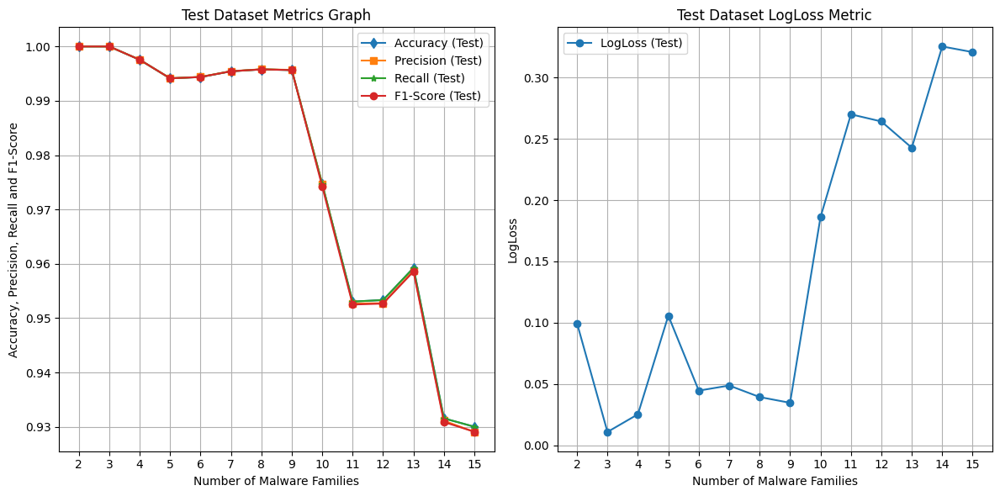

In [3]:
import matplotlib.pyplot as plt

# Datos históricos
strategies = [str(i) for i in range(2, len(test_acc_list_all) + 2)]

# Crear gráfico para Test Accuracy y Test LogLoss en una fila con dos columnas
fig, axes = plt.subplots(1, 2, figsize=(12, 6))


# Gráfico para Test Accuracy, Precision, Recall and F1-Score
axes[0].plot(strategies, test_acc_list_all, marker='d', label='Accuracy (Test)')
axes[0].plot(strategies, precision_list_all, marker='s', label='Precision (Test)')
axes[0].plot(strategies, recall_list_all, marker='*', label='Recall (Test)')
axes[0].plot(strategies, f1_score_list_all, marker='o', label='F1-Score (Test)')
axes[0].set_title('Test Dataset Metrics Graph')
axes[0].set_xlabel('Number of Malware Families')
axes[0].set_ylabel('Accuracy, Precision, Recall and F1-Score')
axes[0].legend()
axes[0].grid(True)

# Gráfico para Test LogLoss
axes[1].plot(strategies, test_loss_list_all, marker='o', label='LogLoss (Test)')
axes[1].set_title('Test Dataset LogLoss Metric')
axes[1].set_xlabel('Number of Malware Families')
axes[1].set_ylabel('LogLoss')
axes[1].legend()
axes[1].grid(True)

plt.tight_layout()
plt.show()
